In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/dataset/mirflickr25k.zip', 'r')
zip_ref.extractall('/content/')
zip_ref.close()

In [ ]:
import cv2
import os
source_dir = "/content/mirflickr"
hr_dir = "/content/hr_images"
lr_dir = "/content/lr_images"

os.makedirs(hr_dir, exist_ok=True)
os.makedirs(lr_dir, exist_ok=True)

for img in os.listdir(source_dir):
    img_path = os.path.join(source_dir, img)
    img_array = cv2.imread(img_path)

    if img_array is None:
        print(f"Failed to load image {img}")
        continue

    hr_img_array = cv2.resize(img_array, (128, 128))
    lr_img_array = cv2.resize(hr_img_array, (32, 32))
    cv2.imwrite(os.path.join(hr_dir, img), hr_img_array)
    cv2.imwrite(os.path.join(lr_dir, img), lr_img_array)

print("Processing complete.")

Failed to load image meta
Failed to load image doc
Processing complete.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from sklearn.model_selection import train_test_split

import numpy as np
from keras import Model
from keras.layers import Conv2D, PReLU,BatchNormalization, Flatten
from keras.layers import UpSampling2D, LeakyReLU, Dense, Input, add
from tqdm import tqdm

In [ ]:
#Define blocks to build the generator
def res_block(ip):

    res_model = Conv2D(64, (3,3), padding = "same")(ip)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    res_model = PReLU(shared_axes = [1,2])(res_model)

    res_model = Conv2D(64, (3,3), padding = "same")(res_model)
    res_model = BatchNormalization(momentum = 0.5)(res_model)

    return add([ip,res_model])

def upscale_block(ip):

    up_model = Conv2D(256, (3,3), padding="same")(ip)
    up_model = UpSampling2D( size = 2 )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)

    return up_model

In [ ]:
#Generator model
def create_gen(gen_ip, num_res_block):
    layers = Conv2D(64, (9,9), padding="same")(gen_ip)
    layers = PReLU(shared_axes=[1,2])(layers)

    temp = layers

    for i in range(num_res_block):
        layers = res_block(layers)

    layers = Conv2D(64, (3,3), padding="same")(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers,temp])

    layers = upscale_block(layers)
    layers = upscale_block(layers)

    op = Conv2D(3, (9,9), padding="same")(layers)

    return Model(inputs=gen_ip, outputs=op)

In [ ]:
#Descriminator block that will be used to construct the discriminator
def discriminator_block(ip, filters, strides=1, bn=True):
    disc_model = Conv2D(filters, (3,3), strides = strides, padding="same")(ip)
    if bn:
        disc_model = BatchNormalization( momentum=0.8 )(disc_model)
    disc_model = LeakyReLU( alpha=0.2 )(disc_model)
    return disc_model

In [ ]:
#Descriminartor, as described in the original paper
def create_disc(disc_ip):

    df = 64

    d1 = discriminator_block(disc_ip, df, bn=False)
    d2 = discriminator_block(d1, df, strides=2)
    d3 = discriminator_block(d2, df*2)
    d4 = discriminator_block(d3, df*2, strides=2)
    d5 = discriminator_block(d4, df*4)
    d6 = discriminator_block(d5, df*4, strides=2)
    d7 = discriminator_block(d6, df*8)
    d8 = discriminator_block(d7, df*8, strides=2)

    d8_5 = Flatten()(d8)
    d9 = Dense(df*16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation='sigmoid')(d10)

    return Model(disc_ip, validity)

In [ ]:
#VGG19
from keras.applications import VGG19

def build_vgg(hr_shape):

    vgg = VGG19(weights="imagenet",include_top=False, input_shape=hr_shape)

    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)

In [ ]:
#Combined model
def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)

    gen_features = vgg(gen_img)

    disc_model.trainable = False
    validity = disc_model(gen_img)

    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])

In [ ]:
n = 5000

lr_list = os.listdir("/content/lr_images")[:n]
lr_images = []
for img in lr_list:
    img_lr = cv2.imread(os.path.join("/content/lr_images", img))
    if img_lr is not None:
        img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
        lr_images.append(img_lr)
hr_list = os.listdir("/content/hr_images")[:n]
hr_images = []
for img in hr_list:
    img_hr = cv2.imread(os.path.join("/content/hr_images", img))
    if img_hr is not None:
        img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
        hr_images.append(img_hr)
lr_images = np.array(lr_images)
hr_images = np.array(hr_images)


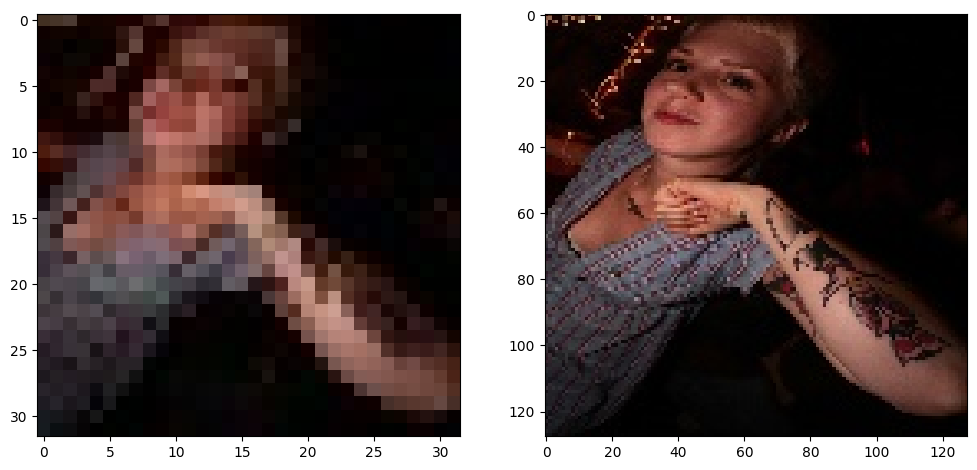

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 64)           15616     ['input_1[0][0]']             
                                                                                                  
 p_re_lu (PReLU)             (None, 32, 32, 64)           64        ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 32, 32, 64)           36928     ['p_re_lu[0][0]']             
                                                                                              

In [ ]:
import random
import numpy as np
image_number = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (32, 32, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (128, 128, 3)))
plt.show()

lr_images = lr_images / 255.
hr_images = hr_images / 255.

#Split to train and test
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images,
                                                      test_size=0.33, random_state=42)



hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

generator = create_gen(lr_ip, num_res_block = 16)
generator.summary()

discriminator = create_disc(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

vgg = build_vgg((128,128,3))
print(vgg.summary())
vgg.trainable = False

gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)

In [ ]:
gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 model (Functional)          (None, 128, 128, 3)          2044291   ['input_1[0][0]']             
                                                                                                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 model_1 (Functional)        (None, 1)                    3824928   ['model[0][0]']               
                                                          1                                 

In [ ]:
#Create a list of images for LR and HR in batches from which a batch of images
#would be fetched during training.
batch_size = 1
train_lr_batches = []
train_hr_batches = []
for it in range(int(hr_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(hr_train[start_idx:end_idx])
    train_lr_batches.append(lr_train[start_idx:end_idx])

In [ ]:
epochs = 5
# Enumerate training over epochs
for e in range(epochs):

    fake_label = np.zeros((batch_size, 1))  # Assign a label of 0 to all fake (generated images)
    real_label = np.ones((batch_size, 1))  # Assign a label of 1 to all real images

    # Create empty lists to populate gen and disc losses
    g_losses = []
    d_losses = []

    # Enumerate training over batches
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b]  # Fetch a batch of LR images for training
        hr_imgs = train_hr_batches[b]  # Fetch a batch of HR images for training

        fake_imgs = generator.predict_on_batch(lr_imgs)  # Fake images

        # First, train the discriminator on fake and real HR images
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)

        # Now, train the generator by fixing discriminator as non-trainable
        discriminator.trainable = False

        # Average the discriminator loss, just for reporting purposes
        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real)

        # Extract VGG features, to be used towards calculating loss
        image_features = vgg.predict(hr_imgs)

        # Train the generator via GAN
        # Remember that we have 2 losses, adversarial loss and content (VGG) loss
        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])

        # Save losses to a list so we can average and report
        d_losses.append(d_loss)
        g_losses.append(g_loss)

    # Convert the list of losses to an array to make it easy to average
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)

    # Calculate the average losses for generator and discriminator
    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)

    # Report the progress during training
    print("epoch:", e+1, "g_loss:", g_loss, "d_loss:", d_loss)

    # Save the generator after every 5 epochs
    if (e+1) % 5 == 0:
        generator.save("gen_e_" + str(e+1) + ".h5")


  0%|          | 0/3350 [00:00<?, ?it/s]

1/1 [==============================] - 1s 848ms/step


  0%|          | 1/3350 [00:47<43:59:42, 47.29s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 2/3350 [00:47<18:14:03, 19.61s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 3/3350 [00:47<10:00:51, 10.77s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 4/3350 [00:47<6:08:13,  6.60s/it] 

1/1 [==============================] - 0s 18ms/step


  0%|          | 5/3350 [00:48<3:59:59,  4.30s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 6/3350 [00:48<2:42:22,  2.91s/it]

1/1 [==============================] - 0s 18ms/step


  0%|          | 7/3350 [00:48<1:52:54,  2.03s/it]

1/1 [==============================] - 0s 28ms/step


  0%|          | 8/3350 [00:48<1:20:48,  1.45s/it]

1/1 [==============================] - 0s 19ms/step


  0%|          | 9/3350 [00:49<58:59,  1.06s/it]  

1/1 [==============================] - 0s 17ms/step


  0%|          | 10/3350 [00:49<44:08,  1.26it/s]

1/1 [==============================] - 0s 17ms/step


  0%|          | 11/3350 [00:49<33:58,  1.64it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 12/3350 [00:49<26:58,  2.06it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 13/3350 [00:49<22:29,  2.47it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 14/3350 [00:50<19:10,  2.90it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 15/3350 [00:50<16:43,  3.32it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 16/3350 [00:50<15:09,  3.67it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 17/3350 [00:50<14:03,  3.95it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 18/3350 [00:50<13:30,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 19/3350 [00:51<13:07,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 20/3350 [00:51<12:41,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 21/3350 [00:51<13:26,  4.13it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 22/3350 [00:51<13:53,  3.99it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 23/3350 [00:52<14:33,  3.81it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 24/3350 [00:52<14:28,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 25/3350 [00:52<14:44,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 26/3350 [00:52<14:39,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 27/3350 [00:53<15:06,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 28/3350 [00:53<14:54,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 29/3350 [00:53<15:40,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 30/3350 [00:54<16:13,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 31/3350 [00:54<16:17,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 32/3350 [00:54<16:19,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 33/3350 [00:55<16:06,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 34/3350 [00:55<15:44,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 35/3350 [00:55<16:29,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 36/3350 [00:55<16:56,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 37/3350 [00:56<17:16,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 38/3350 [00:56<17:04,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 39/3350 [00:56<16:24,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 40/3350 [00:57<17:40,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 41/3350 [00:57<17:02,  3.24it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 42/3350 [00:57<16:21,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 43/3350 [00:58<15:57,  3.45it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 44/3350 [00:58<15:32,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 45/3350 [00:58<14:59,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▏         | 46/3350 [00:58<14:50,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 47/3350 [00:59<14:25,  3.82it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 48/3350 [00:59<13:38,  4.03it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 49/3350 [00:59<12:56,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


  1%|▏         | 50/3350 [00:59<12:26,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3350 [00:59<12:00,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 52/3350 [01:00<11:42,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 53/3350 [01:00<11:35,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 54/3350 [01:00<11:33,  4.75it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 55/3350 [01:00<11:25,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 56/3350 [01:00<11:20,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 57/3350 [01:01<11:14,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 58/3350 [01:01<11:22,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 59/3350 [01:01<11:11,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 60/3350 [01:01<11:02,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 61/3350 [01:01<11:19,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 62/3350 [01:02<11:14,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 63/3350 [01:02<11:34,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 64/3350 [01:02<11:20,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 65/3350 [01:02<11:17,  4.85it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 66/3350 [01:02<11:14,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 67/3350 [01:03<11:13,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 68/3350 [01:03<11:12,  4.88it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 69/3350 [01:03<11:06,  4.92it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 70/3350 [01:03<10:58,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 71/3350 [01:03<10:57,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 72/3350 [01:04<11:03,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 73/3350 [01:04<11:07,  4.91it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 74/3350 [01:04<11:02,  4.95it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 75/3350 [01:04<10:53,  5.01it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 76/3350 [01:04<10:55,  4.99it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 77/3350 [01:05<10:53,  5.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 78/3350 [01:05<10:57,  4.98it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 79/3350 [01:05<10:55,  4.99it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 80/3350 [01:05<10:51,  5.02it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 81/3350 [01:05<10:49,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 82/3350 [01:06<10:48,  5.04it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 83/3350 [01:06<10:46,  5.06it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 84/3350 [01:06<10:48,  5.03it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 85/3350 [01:06<10:46,  5.05it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 86/3350 [01:06<10:56,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 87/3350 [01:07<11:14,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 88/3350 [01:07<11:06,  4.89it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 89/3350 [01:07<10:54,  4.99it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 90/3350 [01:07<10:52,  5.00it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 91/3350 [01:07<10:47,  5.04it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 92/3350 [01:08<10:42,  5.07it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 93/3350 [01:08<10:46,  5.04it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 94/3350 [01:08<10:55,  4.97it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 95/3350 [01:08<10:47,  5.03it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 96/3350 [01:08<10:46,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 97/3350 [01:09<11:31,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 98/3350 [01:09<12:26,  4.36it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 99/3350 [01:09<13:01,  4.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 100/3350 [01:09<13:03,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 101/3350 [01:10<13:13,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 102/3350 [01:10<13:54,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 103/3350 [01:10<14:00,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 104/3350 [01:11<13:56,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 105/3350 [01:11<14:11,  3.81it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 106/3350 [01:11<14:26,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 107/3350 [01:11<14:32,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 108/3350 [01:12<14:41,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 109/3350 [01:12<14:56,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 110/3350 [01:12<15:05,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 111/3350 [01:13<14:57,  3.61it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 112/3350 [01:13<15:20,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 113/3350 [01:13<15:25,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 114/3350 [01:13<16:18,  3.31it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 115/3350 [01:14<15:30,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 116/3350 [01:14<15:35,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 117/3350 [01:14<15:39,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 118/3350 [01:15<15:37,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▎         | 119/3350 [01:15<15:17,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 120/3350 [01:15<14:58,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 121/3350 [01:15<15:24,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 122/3350 [01:16<15:08,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 123/3350 [01:16<15:14,  3.53it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 124/3350 [01:16<14:48,  3.63it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▎         | 125/3350 [01:16<14:42,  3.65it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 126/3350 [01:17<13:36,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 127/3350 [01:17<12:44,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 128/3350 [01:17<12:24,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 129/3350 [01:17<11:59,  4.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 130/3350 [01:18<12:03,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 131/3350 [01:18<11:40,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 132/3350 [01:18<11:20,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 133/3350 [01:18<11:04,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 134/3350 [01:18<10:56,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 135/3350 [01:19<10:55,  4.91it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 136/3350 [01:19<10:47,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 137/3350 [01:19<10:50,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 138/3350 [01:19<10:54,  4.91it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 139/3350 [01:19<10:53,  4.91it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 140/3350 [01:20<10:54,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 141/3350 [01:20<11:01,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 142/3350 [01:20<10:48,  4.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 143/3350 [01:20<11:06,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 144/3350 [01:20<10:54,  4.90it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 145/3350 [01:21<11:48,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 146/3350 [01:21<11:29,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 147/3350 [01:21<11:10,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 148/3350 [01:21<10:55,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 149/3350 [01:21<11:12,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 150/3350 [01:22<11:02,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 151/3350 [01:22<10:52,  4.91it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 152/3350 [01:22<10:38,  5.01it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 153/3350 [01:22<10:55,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 154/3350 [01:22<11:06,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 155/3350 [01:23<11:02,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 156/3350 [01:23<10:51,  4.90it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 157/3350 [01:23<10:44,  4.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 158/3350 [01:23<10:53,  4.89it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 159/3350 [01:24<11:10,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 160/3350 [01:24<11:01,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 161/3350 [01:24<10:55,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 162/3350 [01:24<10:50,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 163/3350 [01:24<10:48,  4.91it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 164/3350 [01:25<10:46,  4.93it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 165/3350 [01:25<10:42,  4.96it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 166/3350 [01:25<10:45,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 167/3350 [01:25<10:50,  4.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 168/3350 [01:25<11:07,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 169/3350 [01:26<11:02,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 170/3350 [01:26<11:11,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 171/3350 [01:26<11:04,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 172/3350 [01:26<11:04,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 173/3350 [01:26<11:16,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 174/3350 [01:27<12:11,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 175/3350 [01:27<12:53,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 176/3350 [01:27<13:37,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 177/3350 [01:27<13:39,  3.87it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 178/3350 [01:28<14:48,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 179/3350 [01:28<14:43,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 180/3350 [01:28<14:40,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 181/3350 [01:29<15:23,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 182/3350 [01:29<15:06,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 183/3350 [01:29<14:41,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 184/3350 [01:30<14:38,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 185/3350 [01:30<14:52,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 186/3350 [01:30<14:55,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 187/3350 [01:30<14:30,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 188/3350 [01:31<15:21,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 189/3350 [01:31<15:40,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 190/3350 [01:31<15:17,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 191/3350 [01:32<15:01,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 192/3350 [01:32<15:01,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 193/3350 [01:32<14:47,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 194/3350 [01:32<14:32,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 195/3350 [01:33<14:38,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 196/3350 [01:33<14:56,  3.52it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 197/3350 [01:33<14:32,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 198/3350 [01:33<14:15,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 199/3350 [01:34<14:14,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 200/3350 [01:34<14:29,  3.62it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 201/3350 [01:34<13:39,  3.84it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 202/3350 [01:34<12:44,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 203/3350 [01:35<12:05,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 204/3350 [01:35<11:39,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 205/3350 [01:35<11:26,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 206/3350 [01:35<11:11,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 207/3350 [01:35<10:57,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 208/3350 [01:36<10:57,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 209/3350 [01:36<10:52,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 210/3350 [01:36<10:54,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 211/3350 [01:36<10:59,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 212/3350 [01:37<11:12,  4.67it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 213/3350 [01:37<11:03,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 214/3350 [01:37<10:54,  4.79it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 215/3350 [01:37<11:02,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 216/3350 [01:37<10:49,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 217/3350 [01:38<10:47,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 218/3350 [01:38<10:43,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 219/3350 [01:38<10:59,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 220/3350 [01:38<10:56,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 221/3350 [01:38<10:45,  4.85it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 222/3350 [01:39<10:42,  4.87it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 223/3350 [01:39<10:40,  4.88it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 224/3350 [01:39<10:32,  4.94it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 225/3350 [01:39<11:09,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 226/3350 [01:39<11:04,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 227/3350 [01:40<11:11,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 228/3350 [01:40<10:59,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 229/3350 [01:40<11:05,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 230/3350 [01:40<10:55,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 231/3350 [01:40<11:01,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 232/3350 [01:41<11:07,  4.67it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 233/3350 [01:41<10:58,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 234/3350 [01:41<10:50,  4.79it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 235/3350 [01:41<10:51,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 236/3350 [01:42<10:45,  4.82it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 237/3350 [01:42<10:43,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 238/3350 [01:42<10:57,  4.73it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 239/3350 [01:42<10:53,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 240/3350 [01:42<10:41,  4.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 241/3350 [01:43<10:38,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 242/3350 [01:43<10:35,  4.89it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 243/3350 [01:43<10:31,  4.92it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 244/3350 [01:43<10:49,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 245/3350 [01:43<10:44,  4.82it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 246/3350 [01:44<10:40,  4.84it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 247/3350 [01:44<10:36,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 248/3350 [01:44<10:31,  4.91it/s]

1/1 [==============================] - 0s 43ms/step


  7%|▋         | 249/3350 [01:44<11:49,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 250/3350 [01:45<12:35,  4.10it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 251/3350 [01:45<13:01,  3.96it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 252/3350 [01:45<13:23,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 253/3350 [01:45<13:39,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 254/3350 [01:46<13:32,  3.81it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 255/3350 [01:46<13:28,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 256/3350 [01:46<13:26,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 257/3350 [01:46<14:27,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 258/3350 [01:47<15:07,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 259/3350 [01:47<15:01,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 260/3350 [01:47<15:08,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 261/3350 [01:48<15:38,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 262/3350 [01:48<15:07,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 263/3350 [01:48<16:19,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 264/3350 [01:49<16:59,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 265/3350 [01:49<16:46,  3.06it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 266/3350 [01:49<15:58,  3.22it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 267/3350 [01:50<15:33,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 268/3350 [01:50<16:08,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 269/3350 [01:50<16:09,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 270/3350 [01:51<17:06,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 271/3350 [01:51<17:25,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 272/3350 [01:51<17:52,  2.87it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 273/3350 [01:52<17:13,  2.98it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 274/3350 [01:52<15:32,  3.30it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 275/3350 [01:52<14:16,  3.59it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 276/3350 [01:52<13:21,  3.83it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 277/3350 [01:53<12:41,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 278/3350 [01:53<11:58,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 279/3350 [01:53<11:40,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 280/3350 [01:53<11:21,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 281/3350 [01:53<11:04,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 282/3350 [01:54<11:11,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 283/3350 [01:54<10:56,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 284/3350 [01:54<10:42,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 285/3350 [01:54<10:35,  4.82it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 286/3350 [01:54<10:31,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 287/3350 [01:55<10:43,  4.76it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 288/3350 [01:55<10:43,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 289/3350 [01:55<10:34,  4.83it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 290/3350 [01:55<10:31,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 291/3350 [01:55<10:44,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 292/3350 [01:56<10:48,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 293/3350 [01:56<10:49,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 294/3350 [01:56<10:45,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 295/3350 [01:56<10:36,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 296/3350 [01:57<10:27,  4.87it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 297/3350 [01:57<10:56,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 298/3350 [01:57<10:41,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 299/3350 [01:57<10:34,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 300/3350 [01:57<10:23,  4.89it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 301/3350 [01:58<10:22,  4.90it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 302/3350 [01:58<10:41,  4.75it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 303/3350 [01:58<10:50,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 304/3350 [01:58<10:38,  4.77it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 305/3350 [01:58<10:26,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 306/3350 [01:59<10:31,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 307/3350 [01:59<10:36,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 308/3350 [01:59<10:44,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 309/3350 [01:59<10:37,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 310/3350 [01:59<10:31,  4.81it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 311/3350 [02:00<10:48,  4.69it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 312/3350 [02:00<10:45,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 313/3350 [02:00<10:51,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 314/3350 [02:00<10:43,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 315/3350 [02:01<10:40,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 316/3350 [02:01<10:34,  4.79it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 317/3350 [02:01<10:29,  4.81it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 318/3350 [02:01<10:24,  4.86it/s]

1/1 [==============================] - 0s 19ms/step


 10%|▉         | 319/3350 [02:01<10:22,  4.87it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 320/3350 [02:02<10:20,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 321/3350 [02:02<10:55,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 322/3350 [02:02<11:37,  4.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 323/3350 [02:02<12:35,  4.00it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 324/3350 [02:03<12:49,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 325/3350 [02:03<13:37,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 326/3350 [02:03<13:49,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 327/3350 [02:03<14:07,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 328/3350 [02:04<14:02,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 329/3350 [02:04<14:40,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 330/3350 [02:04<14:29,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 331/3350 [02:05<15:39,  3.21it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 332/3350 [02:05<16:12,  3.10it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 333/3350 [02:05<16:13,  3.10it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 334/3350 [02:06<17:00,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 335/3350 [02:06<17:04,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 336/3350 [02:06<16:43,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 337/3350 [02:07<17:28,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 338/3350 [02:07<16:31,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 339/3350 [02:07<15:55,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 340/3350 [02:08<15:27,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 341/3350 [02:08<15:07,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 342/3350 [02:08<14:42,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 343/3350 [02:08<14:10,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 344/3350 [02:09<14:07,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 345/3350 [02:09<13:51,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 346/3350 [02:09<14:12,  3.52it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 347/3350 [02:10<13:35,  3.68it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 348/3350 [02:10<12:32,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 349/3350 [02:10<11:47,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 350/3350 [02:10<11:34,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 351/3350 [02:10<11:09,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 352/3350 [02:11<10:54,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 353/3350 [02:11<10:44,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 354/3350 [02:11<10:27,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 355/3350 [02:11<10:24,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 356/3350 [02:11<10:38,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 357/3350 [02:12<10:37,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 358/3350 [02:12<10:30,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 359/3350 [02:12<10:28,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 360/3350 [02:12<10:49,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 361/3350 [02:13<10:32,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 362/3350 [02:13<10:42,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 363/3350 [02:13<10:34,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 364/3350 [02:13<10:25,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 365/3350 [02:13<10:23,  4.79it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 366/3350 [02:14<10:18,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 367/3350 [02:14<10:42,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 368/3350 [02:14<10:36,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 369/3350 [02:14<10:26,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 370/3350 [02:14<10:19,  4.81it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 371/3350 [02:15<10:22,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 372/3350 [02:15<10:26,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 373/3350 [02:15<10:22,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 374/3350 [02:15<10:33,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 375/3350 [02:15<10:24,  4.77it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 376/3350 [02:16<10:19,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 377/3350 [02:16<10:25,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 378/3350 [02:16<10:14,  4.84it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 379/3350 [02:16<10:21,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 380/3350 [02:16<10:14,  4.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 381/3350 [02:17<10:12,  4.85it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 382/3350 [02:17<10:24,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 383/3350 [02:17<10:16,  4.81it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 384/3350 [02:17<10:20,  4.78it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 385/3350 [02:18<10:25,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 386/3350 [02:18<10:33,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 387/3350 [02:18<10:35,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 388/3350 [02:18<10:27,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 389/3350 [02:18<10:28,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 390/3350 [02:19<10:16,  4.80it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 391/3350 [02:19<10:16,  4.80it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 392/3350 [02:19<10:08,  4.86it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 393/3350 [02:19<10:20,  4.77it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 394/3350 [02:19<10:21,  4.76it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 395/3350 [02:20<11:25,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 396/3350 [02:20<11:56,  4.12it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 397/3350 [02:20<12:55,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 398/3350 [02:21<13:26,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 399/3350 [02:21<13:18,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 400/3350 [02:21<13:30,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 401/3350 [02:21<13:22,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 402/3350 [02:22<13:16,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 403/3350 [02:22<13:19,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 404/3350 [02:22<13:39,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 405/3350 [02:23<13:52,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 406/3350 [02:23<14:17,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 407/3350 [02:23<14:19,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 408/3350 [02:23<13:51,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 409/3350 [02:24<14:18,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 410/3350 [02:24<14:08,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 411/3350 [02:24<14:14,  3.44it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 412/3350 [02:25<14:32,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 413/3350 [02:25<14:28,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 414/3350 [02:25<13:57,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 415/3350 [02:25<13:52,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 416/3350 [02:26<13:51,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 417/3350 [02:26<13:34,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 418/3350 [02:26<13:34,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 419/3350 [02:27<13:16,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 420/3350 [02:27<13:19,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 421/3350 [02:27<13:13,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 422/3350 [02:27<13:28,  3.62it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 423/3350 [02:28<13:03,  3.74it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 424/3350 [02:28<12:31,  3.89it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 425/3350 [02:28<11:48,  4.13it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 426/3350 [02:28<11:19,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 427/3350 [02:28<10:57,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 428/3350 [02:29<10:41,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 429/3350 [02:29<10:27,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 430/3350 [02:29<10:21,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 431/3350 [02:29<10:30,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 432/3350 [02:30<10:21,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 433/3350 [02:30<10:20,  4.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 434/3350 [02:30<10:14,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 435/3350 [02:30<10:07,  4.80it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 436/3350 [02:30<10:12,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 437/3350 [02:31<10:10,  4.77it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 438/3350 [02:31<10:11,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 439/3350 [02:31<10:10,  4.77it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 440/3350 [02:32<15:50,  3.06it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 441/3350 [02:32<14:19,  3.39it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 442/3350 [02:32<13:03,  3.71it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 443/3350 [02:32<12:13,  3.97it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 444/3350 [02:32<11:35,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 445/3350 [02:33<11:02,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 446/3350 [02:33<10:55,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 447/3350 [02:33<10:32,  4.59it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 448/3350 [02:33<10:27,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 449/3350 [02:33<10:15,  4.71it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 450/3350 [02:34<10:24,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 451/3350 [02:34<10:27,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 452/3350 [02:34<10:29,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 453/3350 [02:34<10:18,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 454/3350 [02:35<10:10,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 455/3350 [02:35<10:04,  4.79it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 456/3350 [02:35<10:49,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 457/3350 [02:35<10:33,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 458/3350 [02:35<10:39,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 459/3350 [02:36<10:24,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 460/3350 [02:36<10:34,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 461/3350 [02:36<10:22,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 462/3350 [02:36<10:12,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 463/3350 [02:36<10:16,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 464/3350 [02:37<10:18,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 465/3350 [02:37<10:32,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 466/3350 [02:37<10:21,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 467/3350 [02:37<10:14,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 468/3350 [02:38<10:26,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 469/3350 [02:38<11:33,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 470/3350 [02:38<12:09,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 471/3350 [02:38<13:01,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 472/3350 [02:39<13:32,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 473/3350 [02:39<14:38,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 474/3350 [02:39<14:20,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 475/3350 [02:40<14:55,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 476/3350 [02:40<14:52,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 477/3350 [02:40<14:29,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 478/3350 [02:41<14:37,  3.27it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▍        | 479/3350 [02:41<15:20,  3.12it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 480/3350 [02:41<15:43,  3.04it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 481/3350 [02:42<15:29,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 482/3350 [02:42<15:18,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 483/3350 [02:42<14:45,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 484/3350 [02:43<14:21,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 485/3350 [02:43<14:13,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 486/3350 [02:43<14:11,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 487/3350 [02:43<14:03,  3.40it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▍        | 488/3350 [02:44<13:56,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 489/3350 [02:44<13:40,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 490/3350 [02:44<13:49,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 491/3350 [02:45<13:45,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 492/3350 [02:45<13:50,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 493/3350 [02:45<13:24,  3.55it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 494/3350 [02:45<13:24,  3.55it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 495/3350 [02:46<12:17,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 496/3350 [02:46<11:45,  4.05it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 497/3350 [02:46<11:18,  4.20it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 498/3350 [02:46<10:50,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 499/3350 [02:46<10:28,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 500/3350 [02:47<10:24,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 501/3350 [02:47<10:16,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 502/3350 [02:47<10:06,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 503/3350 [02:47<10:05,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 504/3350 [02:48<10:01,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 505/3350 [02:48<09:56,  4.77it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 506/3350 [02:48<09:59,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 507/3350 [02:48<10:02,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 508/3350 [02:48<11:08,  4.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 509/3350 [02:49<10:46,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 510/3350 [02:49<10:30,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 511/3350 [02:49<10:18,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 512/3350 [02:49<10:04,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 513/3350 [02:49<10:04,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 514/3350 [02:50<10:33,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 515/3350 [02:50<11:12,  4.22it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 516/3350 [02:50<11:41,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 517/3350 [02:51<12:48,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 518/3350 [02:51<13:03,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 519/3350 [02:51<13:00,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 520/3350 [02:51<13:47,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 521/3350 [02:52<13:50,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 522/3350 [02:52<15:15,  3.09it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 523/3350 [02:53<15:52,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 524/3350 [02:53<15:43,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 525/3350 [02:53<15:43,  2.99it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 526/3350 [02:54<15:17,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 527/3350 [02:54<15:18,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 528/3350 [02:54<14:47,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 529/3350 [02:54<14:43,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 530/3350 [02:55<15:01,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 531/3350 [02:55<14:27,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 532/3350 [02:55<14:47,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 533/3350 [02:56<16:11,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 534/3350 [02:56<16:38,  2.82it/s]

1/1 [==============================] - 0s 59ms/step


 16%|█▌        | 535/3350 [02:57<17:28,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 536/3350 [02:57<17:52,  2.62it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 537/3350 [02:57<17:51,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 538/3350 [02:58<17:38,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 539/3350 [02:58<17:32,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 540/3350 [02:58<17:16,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 541/3350 [02:59<16:49,  2.78it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 542/3350 [02:59<16:55,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 543/3350 [02:59<16:22,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 544/3350 [03:00<16:20,  2.86it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 545/3350 [03:00<15:39,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 546/3350 [03:01<16:15,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 547/3350 [03:01<16:44,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 548/3350 [03:01<16:35,  2.81it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 549/3350 [03:02<16:24,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 550/3350 [03:02<16:01,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 551/3350 [03:02<16:05,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 552/3350 [03:03<16:05,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 553/3350 [03:03<15:38,  2.98it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 554/3350 [03:03<15:07,  3.08it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 555/3350 [03:04<15:42,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 556/3350 [03:04<14:53,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 557/3350 [03:04<14:39,  3.18it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 558/3350 [03:04<13:28,  3.45it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 559/3350 [03:05<12:24,  3.75it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 560/3350 [03:05<11:39,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 561/3350 [03:05<11:06,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 562/3350 [03:05<11:08,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 563/3350 [03:05<10:42,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 564/3350 [03:06<10:24,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 565/3350 [03:06<10:11,  4.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 566/3350 [03:06<10:10,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 567/3350 [03:06<10:01,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 568/3350 [03:07<09:55,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 569/3350 [03:07<10:06,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 570/3350 [03:07<09:56,  4.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 571/3350 [03:07<10:03,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 572/3350 [03:07<09:52,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 573/3350 [03:08<09:45,  4.75it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3350 [03:08<09:43,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 575/3350 [03:08<09:43,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 576/3350 [03:08<09:47,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 577/3350 [03:08<09:42,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 578/3350 [03:09<09:40,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 579/3350 [03:09<09:39,  4.78it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 580/3350 [03:09<09:43,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 581/3350 [03:09<09:46,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 582/3350 [03:10<09:42,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 583/3350 [03:10<09:44,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 584/3350 [03:10<09:42,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 585/3350 [03:10<09:38,  4.78it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 586/3350 [03:10<09:49,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 587/3350 [03:11<09:40,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 588/3350 [03:11<09:36,  4.79it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 589/3350 [03:11<09:40,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 590/3350 [03:11<09:53,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 591/3350 [03:11<09:51,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 592/3350 [03:12<09:51,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 593/3350 [03:12<09:46,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 594/3350 [03:12<09:42,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 595/3350 [03:12<09:49,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 596/3350 [03:12<09:41,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 597/3350 [03:13<09:44,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 598/3350 [03:13<09:42,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 599/3350 [03:13<09:37,  4.76it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 600/3350 [03:13<09:49,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 601/3350 [03:14<09:44,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 602/3350 [03:14<09:49,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 603/3350 [03:14<09:42,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 604/3350 [03:14<09:39,  4.74it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 605/3350 [03:14<11:08,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 606/3350 [03:15<11:33,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 607/3350 [03:15<12:07,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 608/3350 [03:15<12:24,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 609/3350 [03:16<12:31,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 610/3350 [03:16<12:27,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 611/3350 [03:16<12:39,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 612/3350 [03:16<12:56,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 613/3350 [03:17<13:07,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 614/3350 [03:17<12:59,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 615/3350 [03:17<12:56,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 616/3350 [03:18<13:34,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 617/3350 [03:18<13:23,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 618/3350 [03:18<13:45,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 619/3350 [03:19<13:55,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 620/3350 [03:19<13:53,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 621/3350 [03:19<13:49,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 622/3350 [03:20<13:52,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 623/3350 [03:20<14:58,  3.04it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 624/3350 [03:20<15:13,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 625/3350 [03:21<16:41,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 626/3350 [03:21<16:22,  2.77it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 627/3350 [03:21<17:29,  2.60it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 628/3350 [03:22<16:52,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 629/3350 [03:22<15:29,  2.93it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 630/3350 [03:22<14:40,  3.09it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 631/3350 [03:23<13:12,  3.43it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 632/3350 [03:23<12:15,  3.70it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 633/3350 [03:23<11:32,  3.92it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 634/3350 [03:23<10:53,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 635/3350 [03:23<10:26,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 636/3350 [03:24<10:08,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 637/3350 [03:24<10:07,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 638/3350 [03:24<10:04,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 639/3350 [03:24<09:53,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 640/3350 [03:25<09:47,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 641/3350 [03:25<09:52,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 642/3350 [03:25<09:51,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 643/3350 [03:25<09:45,  4.62it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 644/3350 [03:25<09:40,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 645/3350 [03:26<09:34,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 646/3350 [03:26<09:38,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 647/3350 [03:26<09:33,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 648/3350 [03:26<09:29,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 649/3350 [03:26<09:31,  4.73it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 650/3350 [03:27<09:30,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 651/3350 [03:27<09:35,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 652/3350 [03:27<09:35,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 653/3350 [03:27<09:29,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 654/3350 [03:28<10:00,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 655/3350 [03:28<09:47,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 656/3350 [03:28<09:58,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 657/3350 [03:28<09:48,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 658/3350 [03:28<09:42,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 659/3350 [03:29<09:41,  4.63it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3350 [03:29<09:59,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 661/3350 [03:29<09:48,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 662/3350 [03:29<09:38,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 663/3350 [03:29<09:35,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 664/3350 [03:30<09:27,  4.73it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 665/3350 [03:30<09:38,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 666/3350 [03:30<09:33,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 667/3350 [03:30<09:30,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 668/3350 [03:31<09:26,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 20%|█▉        | 669/3350 [03:31<09:31,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 670/3350 [03:31<09:39,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 671/3350 [03:31<09:36,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 672/3350 [03:31<09:35,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 673/3350 [03:32<09:32,  4.67it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 674/3350 [03:32<09:29,  4.70it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 675/3350 [03:32<09:28,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 676/3350 [03:32<09:48,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 677/3350 [03:33<10:38,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 678/3350 [03:33<11:11,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 679/3350 [03:33<12:19,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 680/3350 [03:33<12:30,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 681/3350 [03:34<12:19,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 682/3350 [03:34<12:15,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 683/3350 [03:34<12:20,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 684/3350 [03:35<12:57,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 685/3350 [03:35<12:45,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 686/3350 [03:35<13:25,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 687/3350 [03:36<13:37,  3.26it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 688/3350 [03:36<13:30,  3.28it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 689/3350 [03:36<13:23,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 690/3350 [03:36<13:21,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 691/3350 [03:37<13:00,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 692/3350 [03:37<13:00,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 693/3350 [03:37<13:01,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 694/3350 [03:38<12:47,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 695/3350 [03:38<12:52,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 696/3350 [03:38<13:17,  3.33it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 697/3350 [03:38<13:27,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 698/3350 [03:39<13:09,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 699/3350 [03:39<13:26,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 700/3350 [03:39<14:29,  3.05it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 701/3350 [03:40<15:13,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 702/3350 [03:40<15:41,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 703/3350 [03:41<14:29,  3.05it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 704/3350 [03:41<13:02,  3.38it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 705/3350 [03:41<12:37,  3.49it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 706/3350 [03:41<11:44,  3.76it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 707/3350 [03:41<11:16,  3.90it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 708/3350 [03:42<10:48,  4.07it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 709/3350 [03:42<10:22,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 710/3350 [03:42<10:06,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 711/3350 [03:42<09:57,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██▏       | 712/3350 [03:43<09:45,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 713/3350 [03:43<09:34,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 714/3350 [03:43<09:40,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 715/3350 [03:43<09:29,  4.63it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 716/3350 [03:43<09:31,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 717/3350 [03:44<09:25,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 718/3350 [03:44<09:19,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 719/3350 [03:44<09:16,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██▏       | 720/3350 [03:44<09:12,  4.76it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 721/3350 [03:44<09:15,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 722/3350 [03:45<09:16,  4.72it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 723/3350 [03:45<09:21,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 724/3350 [03:45<09:20,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 725/3350 [03:45<09:13,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 726/3350 [03:45<09:15,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 727/3350 [03:46<09:14,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 728/3350 [03:46<09:11,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 729/3350 [03:46<09:10,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 730/3350 [03:46<09:12,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 731/3350 [03:47<09:14,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 732/3350 [03:47<09:15,  4.71it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 733/3350 [03:47<09:28,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 734/3350 [03:47<09:25,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 735/3350 [03:47<09:19,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 736/3350 [03:48<09:16,  4.70it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 737/3350 [03:48<09:17,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 738/3350 [03:48<09:12,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 739/3350 [03:48<09:08,  4.76it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 740/3350 [03:48<09:18,  4.67it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 741/3350 [03:49<09:30,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 742/3350 [03:49<09:46,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 743/3350 [03:49<09:34,  4.54it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 744/3350 [03:49<09:23,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 745/3350 [03:50<09:22,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 746/3350 [03:50<09:16,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 747/3350 [03:50<09:13,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 748/3350 [03:50<09:23,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 749/3350 [03:51<10:19,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 750/3350 [03:51<11:07,  3.89it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 751/3350 [03:51<11:30,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 752/3350 [03:51<11:31,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 753/3350 [03:52<11:53,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 754/3350 [03:52<11:42,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 755/3350 [03:52<11:38,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 756/3350 [03:52<11:37,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 757/3350 [03:53<11:58,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 758/3350 [03:53<12:09,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 759/3350 [03:53<12:02,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 760/3350 [03:54<12:09,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 761/3350 [03:54<12:13,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 762/3350 [03:54<12:09,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 763/3350 [03:54<12:14,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 764/3350 [03:55<12:42,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 765/3350 [03:55<12:43,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 766/3350 [03:55<12:56,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 767/3350 [03:56<13:07,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 768/3350 [03:56<12:51,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 769/3350 [03:56<12:46,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 770/3350 [03:57<12:39,  3.40it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 771/3350 [03:57<12:49,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 772/3350 [03:57<12:49,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 773/3350 [03:58<13:11,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 774/3350 [03:58<12:54,  3.33it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 775/3350 [03:58<13:19,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 776/3350 [03:58<13:35,  3.16it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 777/3350 [03:59<12:58,  3.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 778/3350 [03:59<11:57,  3.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 779/3350 [03:59<11:04,  3.87it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 780/3350 [03:59<10:29,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 781/3350 [04:00<10:04,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 782/3350 [04:00<09:43,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 783/3350 [04:00<09:39,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 784/3350 [04:00<09:34,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 785/3350 [04:00<09:22,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 786/3350 [04:01<09:19,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 787/3350 [04:01<09:12,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 788/3350 [04:01<09:16,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 789/3350 [04:01<09:09,  4.66it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 790/3350 [04:02<09:15,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 791/3350 [04:02<09:10,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 792/3350 [04:02<09:12,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 793/3350 [04:02<09:15,  4.60it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 794/3350 [04:02<09:10,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 795/3350 [04:03<09:04,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 796/3350 [04:03<09:03,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 797/3350 [04:03<08:58,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 798/3350 [04:03<08:57,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 799/3350 [04:03<08:55,  4.76it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 800/3350 [04:04<08:51,  4.80it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 801/3350 [04:04<08:52,  4.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 802/3350 [04:04<09:09,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 803/3350 [04:04<09:05,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 804/3350 [04:04<09:03,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 805/3350 [04:05<09:03,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 806/3350 [04:05<09:02,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 807/3350 [04:05<09:08,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 808/3350 [04:05<09:03,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 809/3350 [04:06<09:01,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 810/3350 [04:06<08:58,  4.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 811/3350 [04:06<09:01,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 812/3350 [04:06<09:36,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 813/3350 [04:06<09:27,  4.47it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 814/3350 [04:07<09:22,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 815/3350 [04:07<09:22,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 816/3350 [04:07<09:15,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 817/3350 [04:07<09:10,  4.60it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 818/3350 [04:08<09:04,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 819/3350 [04:08<09:05,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 820/3350 [04:08<09:08,  4.61it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 821/3350 [04:08<09:10,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 822/3350 [04:08<09:01,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▍       | 823/3350 [04:09<09:12,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 824/3350 [04:09<10:04,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 825/3350 [04:09<10:46,  3.91it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 826/3350 [04:09<10:55,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 827/3350 [04:10<10:59,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 828/3350 [04:10<11:00,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 829/3350 [04:10<11:07,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 830/3350 [04:11<11:07,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 831/3350 [04:11<11:04,  3.79it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 832/3350 [04:11<11:56,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 833/3350 [04:11<12:31,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 834/3350 [04:12<12:11,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 835/3350 [04:12<12:00,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 836/3350 [04:12<11:56,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 837/3350 [04:13<12:02,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 838/3350 [04:13<12:08,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 839/3350 [04:13<12:14,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▌       | 840/3350 [04:14<12:29,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 841/3350 [04:14<12:21,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 842/3350 [04:14<11:58,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 843/3350 [04:14<11:55,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 844/3350 [04:15<12:45,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 845/3350 [04:15<12:24,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 846/3350 [04:15<12:19,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 847/3350 [04:16<12:16,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 848/3350 [04:16<12:34,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 849/3350 [04:16<12:54,  3.23it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 850/3350 [04:17<14:05,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 851/3350 [04:17<13:24,  3.11it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 852/3350 [04:17<12:05,  3.44it/s]

1/1 [==============================] - 0s 18ms/step


 25%|██▌       | 853/3350 [04:17<11:08,  3.74it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 854/3350 [04:18<10:31,  3.95it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 855/3350 [04:18<10:06,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 856/3350 [04:18<09:46,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 857/3350 [04:18<09:33,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 858/3350 [04:18<09:22,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 859/3350 [04:19<09:24,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 860/3350 [04:19<09:23,  4.42it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 861/3350 [04:19<09:29,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 862/3350 [04:19<09:25,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 863/3350 [04:20<09:11,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 864/3350 [04:20<09:13,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 865/3350 [04:20<09:22,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 866/3350 [04:20<09:13,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 867/3350 [04:20<09:04,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 868/3350 [04:21<08:56,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 869/3350 [04:21<09:02,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 870/3350 [04:21<08:54,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 871/3350 [04:21<08:57,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 872/3350 [04:21<08:55,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 873/3350 [04:22<08:49,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 874/3350 [04:22<09:00,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 875/3350 [04:22<08:53,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 876/3350 [04:22<08:49,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 877/3350 [04:23<08:49,  4.67it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 878/3350 [04:23<08:49,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 879/3350 [04:23<08:47,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 880/3350 [04:23<08:43,  4.72it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 881/3350 [04:23<08:42,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 882/3350 [04:24<08:39,  4.75it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 883/3350 [04:24<08:57,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 884/3350 [04:24<08:52,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 885/3350 [04:24<08:48,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 886/3350 [04:24<08:45,  4.68it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 887/3350 [04:25<08:44,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 888/3350 [04:25<08:53,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 889/3350 [04:25<08:48,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 890/3350 [04:25<08:43,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 891/3350 [04:26<08:38,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 892/3350 [04:26<08:43,  4.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 893/3350 [04:26<08:43,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 894/3350 [04:26<08:41,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 895/3350 [04:26<08:38,  4.74it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 896/3350 [04:27<08:36,  4.75it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 897/3350 [04:27<08:58,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 898/3350 [04:27<10:04,  4.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 899/3350 [04:27<10:22,  3.94it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 900/3350 [04:28<10:44,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 901/3350 [04:28<11:35,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 902/3350 [04:28<12:02,  3.39it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 903/3350 [04:29<11:47,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 904/3350 [04:29<12:55,  3.15it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 905/3350 [04:29<13:38,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 906/3350 [04:30<14:01,  2.90it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 907/3350 [04:30<13:58,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 908/3350 [04:30<13:21,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 909/3350 [04:31<12:54,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 910/3350 [04:31<13:20,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 911/3350 [04:31<13:57,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 912/3350 [04:32<13:55,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 913/3350 [04:32<14:01,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 914/3350 [04:32<13:37,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 915/3350 [04:33<13:26,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 916/3350 [04:33<13:06,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 917/3350 [04:33<13:06,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 918/3350 [04:34<12:42,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 919/3350 [04:34<13:22,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 920/3350 [04:34<13:27,  3.01it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 921/3350 [04:35<13:25,  3.02it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 922/3350 [04:35<12:12,  3.31it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 923/3350 [04:35<11:09,  3.63it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 924/3350 [04:35<10:28,  3.86it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 925/3350 [04:36<09:52,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 926/3350 [04:36<09:32,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 927/3350 [04:36<09:14,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 928/3350 [04:36<09:15,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 929/3350 [04:36<09:02,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 930/3350 [04:37<08:54,  4.53it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3350 [04:37<08:46,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 932/3350 [04:37<08:38,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 933/3350 [04:37<08:47,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 934/3350 [04:38<08:45,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 935/3350 [04:38<08:41,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 936/3350 [04:38<08:37,  4.66it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 937/3350 [04:38<08:40,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 938/3350 [04:38<08:50,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 939/3350 [04:39<08:44,  4.59it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 940/3350 [04:39<08:42,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 941/3350 [04:39<08:34,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 942/3350 [04:39<08:28,  4.73it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 943/3350 [04:39<09:00,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 944/3350 [04:40<08:49,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 945/3350 [04:40<08:45,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 946/3350 [04:40<08:45,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 947/3350 [04:40<08:41,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 948/3350 [04:41<08:40,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 949/3350 [04:41<08:37,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 950/3350 [04:41<08:34,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 951/3350 [04:41<08:30,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 952/3350 [04:41<08:36,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 953/3350 [04:42<08:34,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 954/3350 [04:42<08:39,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 955/3350 [04:42<08:34,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 956/3350 [04:42<08:35,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 957/3350 [04:43<08:39,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 958/3350 [04:43<08:35,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▊       | 959/3350 [04:43<08:34,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▊       | 960/3350 [04:43<08:30,  4.68it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 961/3350 [04:43<08:29,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 962/3350 [04:44<08:41,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 963/3350 [04:44<08:41,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 964/3350 [04:44<08:37,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 965/3350 [04:44<08:33,  4.65it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 966/3350 [04:44<08:46,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 967/3350 [04:45<08:37,  4.61it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 968/3350 [04:45<09:50,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 969/3350 [04:45<10:27,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 970/3350 [04:46<10:52,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 971/3350 [04:46<10:56,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 972/3350 [04:46<11:44,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 973/3350 [04:46<11:31,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 974/3350 [04:47<11:23,  3.48it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 975/3350 [04:47<11:55,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 976/3350 [04:47<11:47,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 977/3350 [04:48<12:35,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 978/3350 [04:48<12:15,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 979/3350 [04:48<11:54,  3.32it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 980/3350 [04:49<12:09,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 981/3350 [04:49<11:58,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 982/3350 [04:49<11:46,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 983/3350 [04:50<12:03,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 984/3350 [04:50<11:53,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 985/3350 [04:50<12:29,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 986/3350 [04:51<12:47,  3.08it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 987/3350 [04:51<12:23,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 988/3350 [04:51<12:16,  3.21it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 989/3350 [04:51<11:54,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 990/3350 [04:52<11:59,  3.28it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 991/3350 [04:52<11:55,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 992/3350 [04:52<11:32,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 993/3350 [04:53<11:36,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 994/3350 [04:53<11:48,  3.33it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 995/3350 [04:53<11:14,  3.49it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 996/3350 [04:53<10:24,  3.77it/s]

1/1 [==============================] - 0s 17ms/step


 30%|██▉       | 997/3350 [04:54<09:43,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 998/3350 [04:54<09:35,  4.09it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 999/3350 [04:54<09:17,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 1000/3350 [04:54<09:02,  4.33it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 1001/3350 [04:54<08:50,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 30%|██▉       | 1002/3350 [04:55<08:40,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1003/3350 [04:55<08:41,  4.50it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 1004/3350 [04:55<08:35,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1005/3350 [04:55<08:27,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1006/3350 [04:56<08:21,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1007/3350 [04:56<08:19,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1008/3350 [04:56<08:34,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1009/3350 [04:56<08:31,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1010/3350 [04:56<08:30,  4.58it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1011/3350 [04:57<08:28,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1012/3350 [04:57<08:30,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1013/3350 [04:57<08:29,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1014/3350 [04:57<08:32,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1015/3350 [04:58<08:25,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1016/3350 [04:58<08:23,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1017/3350 [04:58<08:31,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1018/3350 [04:58<08:28,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1019/3350 [04:58<08:24,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 1020/3350 [04:59<08:23,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 1021/3350 [04:59<08:24,  4.61it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3350 [04:59<08:27,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1023/3350 [04:59<08:25,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1024/3350 [04:59<08:28,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1025/3350 [05:00<08:22,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1026/3350 [05:00<08:26,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1027/3350 [05:00<08:29,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1028/3350 [05:00<08:25,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1029/3350 [05:01<08:20,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1030/3350 [05:01<08:18,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1031/3350 [05:01<08:28,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1032/3350 [05:01<08:20,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1033/3350 [05:01<08:17,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1034/3350 [05:02<08:15,  4.67it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1035/3350 [05:02<08:22,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1036/3350 [05:02<08:27,  4.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1037/3350 [05:02<08:26,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1038/3350 [05:03<08:23,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1039/3350 [05:03<08:22,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1040/3350 [05:03<08:20,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1041/3350 [05:03<08:48,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1042/3350 [05:03<09:23,  4.10it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1043/3350 [05:04<10:25,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1044/3350 [05:04<10:50,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1045/3350 [05:04<10:59,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1046/3350 [05:05<11:23,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1047/3350 [05:05<12:04,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1048/3350 [05:05<12:07,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1049/3350 [05:06<12:12,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1050/3350 [05:06<12:35,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1051/3350 [05:06<12:42,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1052/3350 [05:07<12:42,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1053/3350 [05:07<12:51,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1054/3350 [05:07<12:51,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1055/3350 [05:08<12:15,  3.12it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1056/3350 [05:08<12:12,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1057/3350 [05:08<12:33,  3.04it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1058/3350 [05:09<12:23,  3.08it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1059/3350 [05:09<12:36,  3.03it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1060/3350 [05:09<12:27,  3.06it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1061/3350 [05:10<11:57,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1062/3350 [05:10<11:31,  3.31it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1063/3350 [05:10<11:19,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1064/3350 [05:10<11:10,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1065/3350 [05:11<10:59,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1066/3350 [05:11<10:55,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 1067/3350 [05:11<10:54,  3.49it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1068/3350 [05:12<10:15,  3.71it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1069/3350 [05:12<09:36,  3.96it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1070/3350 [05:12<09:10,  4.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3350 [05:12<08:56,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1072/3350 [05:12<08:46,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1073/3350 [05:13<08:38,  4.40it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1074/3350 [05:13<08:29,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1075/3350 [05:13<08:20,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1076/3350 [05:13<08:15,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1077/3350 [05:14<08:15,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1078/3350 [05:14<08:12,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1079/3350 [05:14<08:07,  4.65it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1080/3350 [05:14<08:13,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1081/3350 [05:14<08:11,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1082/3350 [05:15<08:16,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1083/3350 [05:15<08:22,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1084/3350 [05:15<08:50,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1085/3350 [05:15<09:17,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1086/3350 [05:16<09:53,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1087/3350 [05:16<10:11,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1088/3350 [05:16<10:22,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1089/3350 [05:17<10:28,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1090/3350 [05:17<10:29,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1091/3350 [05:17<10:28,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1092/3350 [05:17<11:18,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1093/3350 [05:18<11:33,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1094/3350 [05:18<11:12,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1095/3350 [05:18<11:10,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1096/3350 [05:19<11:06,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1097/3350 [05:19<11:15,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1098/3350 [05:19<11:09,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1099/3350 [05:20<11:27,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1100/3350 [05:20<11:54,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1101/3350 [05:20<11:42,  3.20it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1102/3350 [05:21<11:42,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1103/3350 [05:21<11:44,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1104/3350 [05:21<11:56,  3.13it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1105/3350 [05:21<11:58,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1106/3350 [05:22<11:56,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1107/3350 [05:22<12:32,  2.98it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 1108/3350 [05:23<13:25,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1109/3350 [05:23<13:48,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 1110/3350 [05:23<13:55,  2.68it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1111/3350 [05:24<13:51,  2.69it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 1112/3350 [05:24<14:50,  2.51it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1113/3350 [05:25<14:57,  2.49it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1114/3350 [05:25<13:40,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 1115/3350 [05:25<12:57,  2.87it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1116/3350 [05:26<12:59,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1117/3350 [05:26<12:51,  2.89it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1118/3350 [05:26<12:47,  2.91it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1119/3350 [05:27<13:40,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1120/3350 [05:27<13:12,  2.81it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1121/3350 [05:27<12:35,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1122/3350 [05:28<12:09,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1123/3350 [05:28<11:39,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1124/3350 [05:28<11:24,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 1125/3350 [05:28<11:52,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 1126/3350 [05:29<11:50,  3.13it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1127/3350 [05:29<11:46,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1128/3350 [05:29<11:34,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1129/3350 [05:30<11:16,  3.28it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1130/3350 [05:30<11:34,  3.19it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1131/3350 [05:30<12:29,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1132/3350 [05:31<11:49,  3.13it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3350 [05:31<11:24,  3.24it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1134/3350 [05:31<10:26,  3.53it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1135/3350 [05:31<10:07,  3.65it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1136/3350 [05:32<09:30,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1137/3350 [05:32<09:03,  4.07it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1138/3350 [05:32<08:46,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1139/3350 [05:32<08:31,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1140/3350 [05:33<08:23,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1141/3350 [05:33<08:14,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1142/3350 [05:33<08:18,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1143/3350 [05:33<08:15,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1144/3350 [05:33<08:12,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1145/3350 [05:34<08:06,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1146/3350 [05:34<08:14,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1147/3350 [05:34<08:07,  4.52it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1148/3350 [05:34<08:17,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1149/3350 [05:35<08:12,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1150/3350 [05:35<08:05,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1151/3350 [05:35<08:02,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1152/3350 [05:35<07:56,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1153/3350 [05:35<07:58,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1154/3350 [05:36<08:02,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1155/3350 [05:36<08:04,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1156/3350 [05:36<08:02,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1157/3350 [05:36<07:57,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1158/3350 [05:37<08:05,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1159/3350 [05:37<07:58,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1160/3350 [05:37<08:00,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1161/3350 [05:37<07:56,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1162/3350 [05:37<07:58,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1163/3350 [05:38<08:03,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1164/3350 [05:38<07:59,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1165/3350 [05:38<08:23,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1166/3350 [05:38<08:13,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1167/3350 [05:39<08:08,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1168/3350 [05:39<08:08,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1169/3350 [05:39<08:07,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1170/3350 [05:39<08:03,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1171/3350 [05:39<08:01,  4.53it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1172/3350 [05:40<08:10,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 1173/3350 [05:40<08:06,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1174/3350 [05:40<07:57,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1175/3350 [05:40<07:53,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1176/3350 [05:41<07:52,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1177/3350 [05:41<07:51,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1178/3350 [05:41<08:07,  4.46it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1179/3350 [05:41<08:37,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1180/3350 [05:42<09:11,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1181/3350 [05:42<09:52,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1182/3350 [05:42<09:54,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1183/3350 [05:42<10:14,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1184/3350 [05:43<10:32,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1185/3350 [05:43<10:55,  3.30it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1186/3350 [05:43<10:49,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1187/3350 [05:44<11:14,  3.21it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1188/3350 [05:44<11:31,  3.13it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1189/3350 [05:44<11:42,  3.08it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1190/3350 [05:45<11:37,  3.10it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1191/3350 [05:45<11:50,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1192/3350 [05:45<11:52,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1193/3350 [05:46<12:21,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1194/3350 [05:46<11:49,  3.04it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1195/3350 [05:46<12:21,  2.91it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1196/3350 [05:47<12:35,  2.85it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1197/3350 [05:47<12:08,  2.95it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 1198/3350 [05:47<11:49,  3.03it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1199/3350 [05:48<11:24,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1200/3350 [05:48<11:06,  3.23it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1201/3350 [05:48<10:44,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1202/3350 [05:49<10:51,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1203/3350 [05:49<10:50,  3.30it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1204/3350 [05:49<10:40,  3.35it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1205/3350 [05:49<09:48,  3.65it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 1206/3350 [05:50<09:17,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1207/3350 [05:50<08:51,  4.04it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1208/3350 [05:50<08:34,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1209/3350 [05:50<08:34,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1210/3350 [05:51<08:18,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1211/3350 [05:51<08:05,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1212/3350 [05:51<08:07,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1213/3350 [05:51<08:00,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1214/3350 [05:51<07:55,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1215/3350 [05:52<07:50,  4.54it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1216/3350 [05:52<07:49,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1217/3350 [05:52<07:43,  4.60it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▋      | 1218/3350 [05:52<07:44,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1219/3350 [05:52<07:44,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1220/3350 [05:53<07:39,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1221/3350 [05:53<07:34,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1222/3350 [05:53<07:40,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1223/3350 [05:53<07:41,  4.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3350 [05:54<07:39,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1225/3350 [05:54<07:43,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1226/3350 [05:54<07:43,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1227/3350 [05:54<07:49,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1228/3350 [05:54<07:45,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1229/3350 [05:55<07:44,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1230/3350 [05:55<07:41,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1231/3350 [05:55<07:34,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1232/3350 [05:55<07:41,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1233/3350 [05:56<07:40,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1234/3350 [05:56<07:39,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1235/3350 [05:56<07:39,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1236/3350 [05:56<07:37,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1237/3350 [05:56<07:39,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1238/3350 [05:57<07:40,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1239/3350 [05:57<07:39,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1240/3350 [05:57<07:39,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1241/3350 [05:57<07:48,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1242/3350 [05:57<07:46,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1243/3350 [05:58<07:43,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1244/3350 [05:58<07:41,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1245/3350 [05:58<07:47,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 1246/3350 [05:58<07:46,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1247/3350 [05:59<07:46,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1248/3350 [05:59<07:43,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1249/3350 [05:59<07:40,  4.56it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1250/3350 [05:59<08:22,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1251/3350 [06:00<08:50,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1252/3350 [06:00<09:08,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1253/3350 [06:00<09:22,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1254/3350 [06:00<09:48,  3.56it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 1255/3350 [06:01<10:31,  3.32it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1256/3350 [06:01<10:21,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1257/3350 [06:01<10:26,  3.34it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1258/3350 [06:02<10:32,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1259/3350 [06:02<10:38,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1260/3350 [06:02<10:39,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1261/3350 [06:03<10:54,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1262/3350 [06:03<11:11,  3.11it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1263/3350 [06:03<11:07,  3.12it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1264/3350 [06:04<10:56,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1265/3350 [06:04<10:53,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1266/3350 [06:04<10:42,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1267/3350 [06:05<10:34,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1268/3350 [06:05<11:02,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1269/3350 [06:05<11:18,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1270/3350 [06:06<12:05,  2.87it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1271/3350 [06:06<12:03,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1272/3350 [06:06<11:24,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1273/3350 [06:07<11:59,  2.89it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1274/3350 [06:07<11:40,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1275/3350 [06:07<11:19,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1276/3350 [06:08<11:41,  2.96it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1277/3350 [06:08<10:47,  3.20it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1278/3350 [06:08<09:50,  3.51it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1279/3350 [06:08<09:08,  3.78it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1280/3350 [06:09<08:42,  3.96it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1281/3350 [06:09<08:18,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1282/3350 [06:09<08:04,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 1283/3350 [06:09<07:50,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1284/3350 [06:09<07:45,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1285/3350 [06:10<07:45,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1286/3350 [06:10<07:45,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1287/3350 [06:10<07:37,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 1288/3350 [06:10<07:32,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 1289/3350 [06:11<07:33,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1290/3350 [06:11<07:27,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1291/3350 [06:11<07:33,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1292/3350 [06:11<07:27,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1293/3350 [06:11<07:29,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 1294/3350 [06:12<07:36,  4.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1295/3350 [06:12<07:35,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1296/3350 [06:12<07:43,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1297/3350 [06:12<07:39,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1298/3350 [06:13<07:41,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1299/3350 [06:13<07:33,  4.52it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 1300/3350 [06:13<07:41,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1301/3350 [06:13<07:32,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1302/3350 [06:13<07:32,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1303/3350 [06:14<07:28,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1304/3350 [06:14<07:28,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1305/3350 [06:14<07:29,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1306/3350 [06:14<07:29,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1307/3350 [06:14<07:27,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1308/3350 [06:15<07:25,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1309/3350 [06:15<07:25,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1310/3350 [06:15<07:27,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1311/3350 [06:15<07:28,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1312/3350 [06:16<07:28,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1313/3350 [06:16<07:27,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1314/3350 [06:16<07:31,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1315/3350 [06:16<07:25,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1316/3350 [06:16<07:21,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1317/3350 [06:17<07:16,  4.66it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1318/3350 [06:17<07:23,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1319/3350 [06:17<07:24,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1320/3350 [06:17<07:25,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1321/3350 [06:18<07:23,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1322/3350 [06:18<07:39,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1323/3350 [06:18<08:15,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1324/3350 [06:18<08:42,  3.88it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1325/3350 [06:19<09:10,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1326/3350 [06:19<09:14,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1327/3350 [06:19<09:39,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1328/3350 [06:20<09:42,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1329/3350 [06:20<09:51,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1330/3350 [06:20<09:53,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1331/3350 [06:20<09:57,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1332/3350 [06:21<09:51,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 40%|███▉      | 1333/3350 [06:21<10:05,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1334/3350 [06:21<10:05,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1335/3350 [06:22<10:38,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1336/3350 [06:22<10:39,  3.15it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 1337/3350 [06:22<10:37,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1338/3350 [06:23<10:54,  3.08it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1339/3350 [06:23<10:44,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1340/3350 [06:23<10:56,  3.06it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1341/3350 [06:24<10:47,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1342/3350 [06:24<11:01,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1343/3350 [06:24<10:41,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1344/3350 [06:25<10:57,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1345/3350 [06:25<10:39,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1346/3350 [06:25<10:27,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1347/3350 [06:26<10:30,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1348/3350 [06:26<10:10,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 1349/3350 [06:26<10:12,  3.27it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1350/3350 [06:26<09:18,  3.58it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1351/3350 [06:27<09:11,  3.63it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1352/3350 [06:27<08:36,  3.87it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1353/3350 [06:27<08:08,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1354/3350 [06:27<07:57,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1355/3350 [06:28<07:51,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1356/3350 [06:28<07:48,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1357/3350 [06:28<07:38,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1358/3350 [06:28<07:28,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1359/3350 [06:28<07:22,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1360/3350 [06:29<07:24,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1361/3350 [06:29<07:18,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1362/3350 [06:29<07:13,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1363/3350 [06:29<07:11,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1364/3350 [06:29<07:08,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1365/3350 [06:30<07:13,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1366/3350 [06:30<07:12,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1367/3350 [06:30<07:13,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1368/3350 [06:30<07:14,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1369/3350 [06:31<07:29,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1370/3350 [06:31<07:24,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1371/3350 [06:31<07:17,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1372/3350 [06:31<07:12,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1373/3350 [06:31<07:08,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1374/3350 [06:32<07:25,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1375/3350 [06:32<07:19,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1376/3350 [06:32<07:17,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1377/3350 [06:32<07:17,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1378/3350 [06:33<07:13,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1379/3350 [06:33<07:42,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1380/3350 [06:33<07:29,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1381/3350 [06:33<07:23,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1382/3350 [06:34<07:18,  4.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1383/3350 [06:34<07:26,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 1384/3350 [06:34<07:32,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1385/3350 [06:34<07:23,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 1386/3350 [06:34<07:16,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1387/3350 [06:35<07:15,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1388/3350 [06:35<07:13,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1389/3350 [06:35<07:08,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████▏     | 1390/3350 [06:35<07:06,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 1391/3350 [06:35<07:03,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1392/3350 [06:36<07:05,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1393/3350 [06:36<07:10,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1394/3350 [06:36<07:17,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1395/3350 [06:36<07:57,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1396/3350 [06:37<08:17,  3.93it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1397/3350 [06:37<08:59,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1398/3350 [06:37<08:59,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1399/3350 [06:38<09:46,  3.32it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1400/3350 [06:38<09:48,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1401/3350 [06:38<09:50,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1402/3350 [06:39<09:43,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1403/3350 [06:39<09:40,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1404/3350 [06:39<09:36,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1405/3350 [06:39<09:37,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1406/3350 [06:40<09:24,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1407/3350 [06:40<09:31,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1408/3350 [06:40<09:55,  3.26it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1409/3350 [06:41<09:49,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1410/3350 [06:41<09:56,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1411/3350 [06:41<09:49,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1412/3350 [06:42<10:01,  3.22it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1413/3350 [06:42<10:37,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1414/3350 [06:42<10:20,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1415/3350 [06:43<11:01,  2.92it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1416/3350 [06:43<11:07,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1417/3350 [06:43<11:11,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1418/3350 [06:44<10:39,  3.02it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1419/3350 [06:44<11:31,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1420/3350 [06:44<10:48,  2.98it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1421/3350 [06:45<10:20,  3.11it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1422/3350 [06:45<09:49,  3.27it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 1423/3350 [06:45<09:10,  3.50it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1424/3350 [06:45<08:32,  3.76it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1425/3350 [06:46<08:09,  3.94it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1426/3350 [06:46<07:55,  4.04it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1427/3350 [06:46<07:44,  4.14it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1428/3350 [06:46<07:41,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1429/3350 [06:47<07:28,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1430/3350 [06:47<07:25,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1431/3350 [06:47<07:19,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1432/3350 [06:47<07:22,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1433/3350 [06:47<07:17,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1434/3350 [06:48<07:09,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1435/3350 [06:48<07:02,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 1436/3350 [06:48<07:02,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1437/3350 [06:48<07:08,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1438/3350 [06:49<07:07,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1439/3350 [06:49<07:05,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1440/3350 [06:49<07:02,  4.52it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1441/3350 [06:49<07:01,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1442/3350 [06:49<07:07,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1443/3350 [06:50<07:03,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1444/3350 [06:50<07:02,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1445/3350 [06:50<06:56,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1446/3350 [06:50<07:06,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1447/3350 [06:51<07:02,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1448/3350 [06:51<07:05,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1449/3350 [06:51<07:00,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1450/3350 [06:51<07:08,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1451/3350 [06:52<07:26,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1452/3350 [06:52<07:15,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1453/3350 [06:52<07:12,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1454/3350 [06:52<07:09,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1455/3350 [06:52<07:08,  4.42it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1456/3350 [06:53<07:06,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1457/3350 [06:53<07:01,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1458/3350 [06:53<06:57,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1459/3350 [06:53<06:53,  4.58it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1460/3350 [06:53<06:55,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 1461/3350 [06:54<06:48,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1462/3350 [06:54<06:51,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1463/3350 [06:54<06:54,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1464/3350 [06:54<06:55,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1465/3350 [06:55<07:15,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1466/3350 [06:55<08:17,  3.79it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1467/3350 [06:55<08:55,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1468/3350 [06:56<09:27,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1469/3350 [06:56<09:14,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1470/3350 [06:56<09:03,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1471/3350 [06:56<09:04,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1472/3350 [06:57<09:08,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1473/3350 [06:57<09:11,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1474/3350 [06:57<09:44,  3.21it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 1475/3350 [06:58<09:50,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1476/3350 [06:58<09:41,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1477/3350 [06:58<09:57,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1478/3350 [06:59<09:58,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1479/3350 [06:59<09:43,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1480/3350 [06:59<09:47,  3.18it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1481/3350 [07:00<10:11,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1482/3350 [07:00<10:24,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1483/3350 [07:00<10:07,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1484/3350 [07:01<10:32,  2.95it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1485/3350 [07:01<10:43,  2.90it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1486/3350 [07:01<10:17,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1487/3350 [07:02<11:28,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1488/3350 [07:02<10:46,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1489/3350 [07:02<10:18,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1490/3350 [07:03<10:02,  3.09it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1491/3350 [07:03<09:06,  3.40it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1492/3350 [07:03<08:25,  3.68it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1493/3350 [07:03<07:56,  3.90it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1494/3350 [07:04<07:34,  4.09it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1495/3350 [07:04<07:30,  4.12it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1496/3350 [07:04<07:20,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1497/3350 [07:04<07:10,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1498/3350 [07:05<07:11,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1499/3350 [07:05<07:10,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1500/3350 [07:05<07:07,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1501/3350 [07:05<06:59,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1502/3350 [07:05<06:57,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1503/3350 [07:06<06:59,  4.40it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1504/3350 [07:06<07:05,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1505/3350 [07:06<06:57,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1506/3350 [07:06<06:53,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1507/3350 [07:07<06:48,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1508/3350 [07:07<06:52,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1509/3350 [07:07<06:52,  4.46it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1510/3350 [07:07<06:55,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1511/3350 [07:07<06:51,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1512/3350 [07:08<06:48,  4.50it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1513/3350 [07:08<06:45,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1514/3350 [07:08<06:46,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▌     | 1515/3350 [07:08<06:43,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1516/3350 [07:09<06:53,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1517/3350 [07:09<06:55,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1518/3350 [07:09<06:56,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1519/3350 [07:09<06:49,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1520/3350 [07:09<06:46,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1521/3350 [07:10<06:43,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1522/3350 [07:10<06:48,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1523/3350 [07:10<06:51,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1524/3350 [07:10<06:55,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1525/3350 [07:11<06:48,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1526/3350 [07:11<06:48,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1527/3350 [07:11<06:44,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1528/3350 [07:11<06:43,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1529/3350 [07:11<06:42,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1530/3350 [07:12<06:41,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1531/3350 [07:12<06:40,  4.54it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1532/3350 [07:12<06:44,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1533/3350 [07:12<06:51,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 1534/3350 [07:13<06:48,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1535/3350 [07:13<07:27,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1536/3350 [07:13<07:58,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1537/3350 [07:13<08:22,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1538/3350 [07:14<08:45,  3.45it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1539/3350 [07:14<08:37,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1540/3350 [07:14<08:37,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1541/3350 [07:15<08:41,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1542/3350 [07:15<08:36,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1543/3350 [07:15<08:40,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1544/3350 [07:16<08:59,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1545/3350 [07:16<09:19,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1546/3350 [07:16<09:14,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1547/3350 [07:16<09:06,  3.30it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 1548/3350 [07:17<09:04,  3.31it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1549/3350 [07:17<08:57,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1550/3350 [07:17<08:59,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1551/3350 [07:18<09:13,  3.25it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 1552/3350 [07:18<09:13,  3.25it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 1553/3350 [07:18<09:22,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 1554/3350 [07:19<09:13,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1555/3350 [07:19<09:12,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 1556/3350 [07:19<09:39,  3.10it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1557/3350 [07:20<09:38,  3.10it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1558/3350 [07:20<09:37,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1559/3350 [07:20<09:44,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1560/3350 [07:21<10:17,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1561/3350 [07:21<10:12,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1562/3350 [07:21<09:58,  2.99it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1563/3350 [07:22<09:48,  3.04it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1564/3350 [07:22<08:53,  3.34it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1565/3350 [07:22<08:41,  3.43it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1566/3350 [07:22<08:05,  3.68it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1567/3350 [07:23<07:41,  3.86it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1568/3350 [07:23<07:22,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1569/3350 [07:23<07:06,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1570/3350 [07:23<06:57,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1571/3350 [07:23<06:48,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1572/3350 [07:24<06:46,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1573/3350 [07:24<06:41,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1574/3350 [07:24<06:37,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1575/3350 [07:24<06:39,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1576/3350 [07:25<06:46,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1577/3350 [07:25<06:49,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1578/3350 [07:25<06:38,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1579/3350 [07:25<06:37,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1580/3350 [07:26<06:30,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1581/3350 [07:26<06:26,  4.58it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1582/3350 [07:26<06:26,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1583/3350 [07:26<06:22,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1584/3350 [07:26<06:25,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1585/3350 [07:27<06:31,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1586/3350 [07:27<06:28,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1587/3350 [07:27<06:25,  4.58it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1588/3350 [07:27<06:37,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1589/3350 [07:27<06:35,  4.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1590/3350 [07:28<06:38,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1591/3350 [07:28<06:37,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1592/3350 [07:28<06:35,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1593/3350 [07:28<06:30,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1594/3350 [07:29<06:35,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1595/3350 [07:29<06:34,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1596/3350 [07:29<06:30,  4.49it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1597/3350 [07:29<06:31,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1598/3350 [07:30<06:28,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1599/3350 [07:30<06:29,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1600/3350 [07:30<06:28,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 1601/3350 [07:30<06:20,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1602/3350 [07:30<06:22,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1603/3350 [07:31<06:21,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1604/3350 [07:31<06:22,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1605/3350 [07:31<06:28,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1606/3350 [07:31<06:29,  4.47it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1607/3350 [07:31<06:29,  4.48it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 1608/3350 [07:32<07:29,  3.88it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1609/3350 [07:32<08:00,  3.62it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1610/3350 [07:32<08:06,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1611/3350 [07:33<08:08,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1612/3350 [07:33<08:23,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1613/3350 [07:33<08:20,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1614/3350 [07:34<08:20,  3.47it/s]

1/1 [==============================] - 0s 58ms/step


 48%|████▊     | 1615/3350 [07:34<08:49,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 1616/3350 [07:34<08:41,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1617/3350 [07:35<08:45,  3.30it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1618/3350 [07:35<08:49,  3.27it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1619/3350 [07:35<08:45,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1620/3350 [07:35<08:58,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1621/3350 [07:36<08:51,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1622/3350 [07:36<08:54,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1623/3350 [07:36<08:49,  3.26it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1624/3350 [07:37<09:24,  3.06it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▊     | 1625/3350 [07:37<09:35,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 1626/3350 [07:37<09:51,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1627/3350 [07:38<10:14,  2.80it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 1628/3350 [07:38<10:40,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1629/3350 [07:39<09:51,  2.91it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1630/3350 [07:39<09:20,  3.07it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 1631/3350 [07:39<09:20,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1632/3350 [07:39<09:14,  3.10it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1633/3350 [07:40<09:16,  3.09it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1634/3350 [07:40<09:08,  3.13it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1635/3350 [07:40<08:17,  3.45it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1636/3350 [07:41<07:41,  3.71it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1637/3350 [07:41<07:17,  3.92it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1638/3350 [07:41<07:02,  4.06it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1639/3350 [07:41<06:54,  4.13it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1640/3350 [07:41<06:48,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1641/3350 [07:42<06:44,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1642/3350 [07:42<06:37,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1643/3350 [07:42<06:29,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1644/3350 [07:42<06:30,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1645/3350 [07:43<06:25,  4.42it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1646/3350 [07:43<06:21,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1647/3350 [07:43<06:20,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1648/3350 [07:43<06:20,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1649/3350 [07:43<06:16,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1650/3350 [07:44<06:17,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1651/3350 [07:44<06:15,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1652/3350 [07:44<06:11,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1653/3350 [07:44<06:22,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1654/3350 [07:45<06:21,  4.45it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1655/3350 [07:45<06:18,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1656/3350 [07:45<06:14,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1657/3350 [07:45<06:17,  4.48it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 1658/3350 [07:45<06:13,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1659/3350 [07:46<06:13,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1660/3350 [07:46<06:13,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1661/3350 [07:46<06:11,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1662/3350 [07:46<06:12,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1663/3350 [07:47<06:13,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1664/3350 [07:47<06:11,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1665/3350 [07:47<06:08,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1666/3350 [07:47<06:06,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1667/3350 [07:47<06:07,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1668/3350 [07:48<06:08,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1669/3350 [07:48<06:10,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1670/3350 [07:48<06:07,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1671/3350 [07:48<06:09,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1672/3350 [07:49<06:12,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1673/3350 [07:49<06:09,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1674/3350 [07:49<06:14,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1675/3350 [07:49<06:16,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1676/3350 [07:49<06:12,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1677/3350 [07:50<06:15,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 50%|█████     | 1678/3350 [07:50<06:10,  4.51it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1679/3350 [07:50<06:28,  4.30it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1680/3350 [07:50<06:58,  3.99it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1681/3350 [07:51<07:06,  3.91it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1682/3350 [07:51<07:22,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1683/3350 [07:51<07:36,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1684/3350 [07:52<07:54,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1685/3350 [07:52<08:01,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1686/3350 [07:52<07:54,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1687/3350 [07:52<07:55,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1688/3350 [07:53<08:08,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1689/3350 [07:53<08:14,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1690/3350 [07:53<08:26,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1691/3350 [07:54<08:44,  3.16it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1692/3350 [07:54<08:58,  3.08it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1693/3350 [07:54<09:14,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1694/3350 [07:55<09:36,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1695/3350 [07:55<09:27,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1696/3350 [07:55<09:00,  3.06it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1697/3350 [07:56<09:24,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1698/3350 [07:56<09:12,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1699/3350 [07:57<10:00,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1700/3350 [07:57<09:33,  2.88it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1701/3350 [07:57<09:11,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1702/3350 [07:58<09:25,  2.91it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1703/3350 [07:58<09:49,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1704/3350 [07:58<09:22,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1705/3350 [07:59<09:00,  3.04it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1706/3350 [07:59<08:18,  3.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1707/3350 [07:59<07:35,  3.60it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 1708/3350 [07:59<07:08,  3.83it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1709/3350 [07:59<06:46,  4.04it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1710/3350 [08:00<06:38,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1711/3350 [08:00<06:27,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 1712/3350 [08:00<06:24,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 1713/3350 [08:00<06:17,  4.33it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1714/3350 [08:01<06:13,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 1715/3350 [08:01<06:12,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1716/3350 [08:01<06:04,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1717/3350 [08:01<06:01,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1718/3350 [08:01<05:57,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1719/3350 [08:02<05:53,  4.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1720/3350 [08:02<05:55,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1721/3350 [08:02<06:01,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1722/3350 [08:02<06:00,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1723/3350 [08:03<05:58,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1724/3350 [08:03<06:01,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1725/3350 [08:03<06:03,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1726/3350 [08:03<05:58,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1727/3350 [08:03<06:00,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1728/3350 [08:04<06:01,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1729/3350 [08:04<06:00,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1730/3350 [08:04<06:02,  4.46it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1731/3350 [08:04<06:01,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1732/3350 [08:05<05:59,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1733/3350 [08:05<05:58,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1734/3350 [08:05<06:06,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1735/3350 [08:05<06:00,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1736/3350 [08:05<06:00,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1737/3350 [08:06<05:59,  4.49it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1738/3350 [08:06<06:01,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1739/3350 [08:06<06:04,  4.41it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1740/3350 [08:06<06:02,  4.44it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1741/3350 [08:07<05:58,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1742/3350 [08:07<05:58,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1743/3350 [08:07<06:02,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1744/3350 [08:07<06:05,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1745/3350 [08:08<06:03,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1746/3350 [08:08<05:57,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1747/3350 [08:08<06:00,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1748/3350 [08:08<06:04,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1749/3350 [08:08<06:00,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1750/3350 [08:09<06:02,  4.41it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1751/3350 [08:09<06:40,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 1752/3350 [08:09<07:10,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1753/3350 [08:10<07:19,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1754/3350 [08:10<07:16,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1755/3350 [08:10<07:33,  3.51it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1756/3350 [08:10<07:41,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1757/3350 [08:11<07:35,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1758/3350 [08:11<08:06,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1759/3350 [08:11<08:49,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1760/3350 [08:12<08:33,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1761/3350 [08:12<08:16,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1762/3350 [08:12<08:05,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1763/3350 [08:13<08:05,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1764/3350 [08:13<08:09,  3.24it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1765/3350 [08:13<08:19,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1766/3350 [08:14<08:18,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1767/3350 [08:14<08:22,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1768/3350 [08:14<08:25,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1769/3350 [08:15<08:52,  2.97it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1770/3350 [08:15<09:02,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1771/3350 [08:15<09:20,  2.82it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1772/3350 [08:16<08:58,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1773/3350 [08:16<09:17,  2.83it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1774/3350 [08:16<09:11,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1775/3350 [08:17<09:36,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1776/3350 [08:17<09:36,  2.73it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1777/3350 [08:17<08:40,  3.02it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1778/3350 [08:18<08:19,  3.15it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1779/3350 [08:18<07:38,  3.43it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1780/3350 [08:18<07:05,  3.69it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1781/3350 [08:18<06:41,  3.91it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1782/3350 [08:19<06:35,  3.96it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1783/3350 [08:19<06:23,  4.08it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1784/3350 [08:19<06:15,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1785/3350 [08:19<06:05,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1786/3350 [08:20<06:03,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1787/3350 [08:20<05:59,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1788/3350 [08:20<06:02,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1789/3350 [08:20<05:55,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1790/3350 [08:20<05:48,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1791/3350 [08:21<05:46,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1792/3350 [08:21<05:57,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1793/3350 [08:21<05:50,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1794/3350 [08:21<05:45,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1795/3350 [08:22<05:58,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1796/3350 [08:22<05:53,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1797/3350 [08:22<05:53,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 1798/3350 [08:22<05:48,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1799/3350 [08:22<05:48,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1800/3350 [08:23<05:50,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1801/3350 [08:23<05:46,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1802/3350 [08:23<05:41,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1803/3350 [08:23<05:42,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1804/3350 [08:24<05:41,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1805/3350 [08:24<05:40,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1806/3350 [08:24<05:44,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1807/3350 [08:24<05:41,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1808/3350 [08:24<05:38,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1809/3350 [08:25<05:48,  4.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1810/3350 [08:25<05:43,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1811/3350 [08:25<05:43,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1812/3350 [08:25<05:38,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1813/3350 [08:26<05:42,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1814/3350 [08:26<05:43,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1815/3350 [08:26<05:39,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1816/3350 [08:26<05:36,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1817/3350 [08:26<05:36,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1818/3350 [08:27<05:42,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1819/3350 [08:27<05:40,  4.50it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1820/3350 [08:27<06:28,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1821/3350 [08:28<07:22,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1822/3350 [08:28<07:58,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 1823/3350 [08:28<08:20,  3.05it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 1824/3350 [08:29<08:53,  2.86it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 1825/3350 [08:29<09:18,  2.73it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 1826/3350 [08:29<09:14,  2.75it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1827/3350 [08:30<09:20,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1828/3350 [08:30<08:56,  2.84it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 1829/3350 [08:31<09:17,  2.73it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 1830/3350 [08:31<09:29,  2.67it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 1831/3350 [08:31<09:24,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 1832/3350 [08:32<09:40,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 1833/3350 [08:32<09:41,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1834/3350 [08:33<10:00,  2.53it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1835/3350 [08:33<09:56,  2.54it/s]

1/1 [==============================] - 0s 62ms/step


 55%|█████▍    | 1836/3350 [08:33<10:01,  2.52it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 1837/3350 [08:34<09:38,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 1838/3350 [08:34<10:01,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1839/3350 [08:35<10:13,  2.46it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 1840/3350 [08:35<10:23,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 1841/3350 [08:35<10:10,  2.47it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 1842/3350 [08:36<10:21,  2.42it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 1843/3350 [08:36<10:07,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 1844/3350 [08:37<09:46,  2.57it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▌    | 1845/3350 [08:37<09:44,  2.58it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 1846/3350 [08:37<09:11,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 1847/3350 [08:38<09:27,  2.65it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▌    | 1848/3350 [08:38<09:58,  2.51it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▌    | 1849/3350 [08:39<10:10,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 1850/3350 [08:39<10:10,  2.46it/s]

1/1 [==============================] - 0s 61ms/step


 55%|█████▌    | 1851/3350 [08:39<10:13,  2.44it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 1852/3350 [08:40<09:43,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 1853/3350 [08:40<10:12,  2.44it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 1854/3350 [08:41<10:08,  2.46it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▌    | 1855/3350 [08:41<10:28,  2.38it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 1856/3350 [08:41<10:08,  2.46it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1857/3350 [08:42<09:45,  2.55it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1858/3350 [08:42<08:46,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1859/3350 [08:42<07:54,  3.15it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1860/3350 [08:42<07:13,  3.44it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1861/3350 [08:43<06:41,  3.71it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1862/3350 [08:43<06:26,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1863/3350 [08:43<06:10,  4.02it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1864/3350 [08:43<05:58,  4.15it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1865/3350 [08:44<05:47,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1866/3350 [08:44<05:50,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1867/3350 [08:44<05:45,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1868/3350 [08:44<05:39,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1869/3350 [08:44<05:34,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1870/3350 [08:45<05:31,  4.46it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1871/3350 [08:45<05:35,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1872/3350 [08:45<05:34,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1873/3350 [08:45<05:39,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1874/3350 [08:46<05:33,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1875/3350 [08:46<05:32,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1876/3350 [08:46<05:36,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1877/3350 [08:46<05:34,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1878/3350 [08:47<05:33,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1879/3350 [08:47<05:30,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1880/3350 [08:47<05:36,  4.36it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1881/3350 [08:48<09:42,  2.52it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1882/3350 [08:48<08:32,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1883/3350 [08:48<07:36,  3.21it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1884/3350 [08:48<07:00,  3.49it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1885/3350 [08:49<06:33,  3.72it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 1886/3350 [08:49<06:14,  3.91it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1887/3350 [08:49<06:00,  4.06it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1888/3350 [08:49<05:56,  4.10it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1889/3350 [08:50<05:55,  4.11it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1890/3350 [08:50<05:44,  4.24it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1891/3350 [08:50<05:40,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1892/3350 [08:50<05:34,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1893/3350 [08:50<05:34,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1894/3350 [08:51<05:37,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1895/3350 [08:51<05:40,  4.27it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1896/3350 [08:51<05:42,  4.25it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1897/3350 [08:51<05:38,  4.29it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1898/3350 [08:52<05:34,  4.34it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1899/3350 [08:52<05:41,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1900/3350 [08:52<06:38,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1901/3350 [08:53<07:03,  3.42it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1902/3350 [08:53<07:56,  3.04it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1903/3350 [08:53<07:59,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1904/3350 [08:54<08:24,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1905/3350 [08:54<08:34,  2.81it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 1906/3350 [08:54<08:37,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1907/3350 [08:55<08:14,  2.92it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1908/3350 [08:55<07:57,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1909/3350 [08:55<08:01,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1910/3350 [08:56<07:59,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1911/3350 [08:56<08:23,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1912/3350 [08:56<08:17,  2.89it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1913/3350 [08:57<08:33,  2.80it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1914/3350 [08:57<08:38,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1915/3350 [08:58<08:23,  2.85it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1916/3350 [08:58<08:25,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1917/3350 [08:58<08:01,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1918/3350 [08:59<07:55,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1919/3350 [08:59<08:22,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1920/3350 [08:59<08:40,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1921/3350 [09:00<08:48,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1922/3350 [09:00<08:32,  2.79it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1923/3350 [09:00<08:16,  2.88it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1924/3350 [09:01<07:32,  3.15it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1925/3350 [09:01<07:17,  3.26it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1926/3350 [09:01<06:43,  3.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1927/3350 [09:01<06:21,  3.73it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1928/3350 [09:02<06:07,  3.87it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1929/3350 [09:02<05:58,  3.96it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1930/3350 [09:02<05:47,  4.09it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1931/3350 [09:02<05:50,  4.05it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1932/3350 [09:03<05:45,  4.10it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1933/3350 [09:03<05:43,  4.12it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1934/3350 [09:03<05:34,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1935/3350 [09:03<05:28,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1936/3350 [09:03<05:28,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1937/3350 [09:04<05:36,  4.20it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1938/3350 [09:04<05:31,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1939/3350 [09:04<05:35,  4.20it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1940/3350 [09:04<05:32,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1941/3350 [09:05<05:27,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1942/3350 [09:05<05:29,  4.27it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1943/3350 [09:05<05:27,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1944/3350 [09:05<05:34,  4.20it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1945/3350 [09:06<05:30,  4.26it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1946/3350 [09:06<05:31,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1947/3350 [09:06<05:27,  4.28it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1948/3350 [09:06<05:27,  4.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1949/3350 [09:07<05:31,  4.23it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1950/3350 [09:07<05:31,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1951/3350 [09:07<05:25,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1952/3350 [09:07<05:23,  4.32it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1953/3350 [09:07<05:26,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1954/3350 [09:08<05:31,  4.21it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1955/3350 [09:08<05:31,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1956/3350 [09:08<05:28,  4.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1957/3350 [09:08<05:26,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1958/3350 [09:09<05:34,  4.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1959/3350 [09:09<05:29,  4.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1960/3350 [09:09<05:24,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 1961/3350 [09:09<05:23,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▊    | 1962/3350 [09:10<05:27,  4.24it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1963/3350 [09:10<05:28,  4.22it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1964/3350 [09:10<05:23,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 1965/3350 [09:10<05:40,  4.07it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 1966/3350 [09:11<06:05,  3.79it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1967/3350 [09:11<06:30,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1968/3350 [09:11<06:48,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1969/3350 [09:12<06:48,  3.38it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1970/3350 [09:12<06:52,  3.34it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1971/3350 [09:12<07:11,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1972/3350 [09:13<07:01,  3.27it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1973/3350 [09:13<07:11,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1974/3350 [09:13<07:18,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1975/3350 [09:14<07:36,  3.01it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 1976/3350 [09:14<07:43,  2.96it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1977/3350 [09:14<07:40,  2.98it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1978/3350 [09:15<08:00,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1979/3350 [09:15<08:04,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1980/3350 [09:15<08:24,  2.72it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1981/3350 [09:16<08:20,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1982/3350 [09:16<08:14,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1983/3350 [09:17<08:34,  2.66it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1984/3350 [09:17<08:56,  2.55it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1985/3350 [09:17<08:43,  2.61it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1986/3350 [09:18<09:04,  2.51it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1987/3350 [09:18<08:52,  2.56it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1988/3350 [09:18<08:37,  2.63it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1989/3350 [09:19<07:46,  2.92it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1990/3350 [09:19<07:02,  3.22it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 1991/3350 [09:19<06:34,  3.45it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1992/3350 [09:19<06:10,  3.66it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1993/3350 [09:20<05:59,  3.77it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1994/3350 [09:20<05:45,  3.93it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1995/3350 [09:20<05:37,  4.01it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1996/3350 [09:20<05:27,  4.14it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1997/3350 [09:21<05:19,  4.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1998/3350 [09:21<05:13,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 1999/3350 [09:21<05:09,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2000/3350 [09:21<05:13,  4.31it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2001/3350 [09:22<05:19,  4.22it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2002/3350 [09:22<05:15,  4.27it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 2003/3350 [09:22<05:12,  4.32it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2004/3350 [09:22<05:12,  4.31it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2005/3350 [09:22<05:13,  4.29it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 2006/3350 [09:23<05:10,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2007/3350 [09:23<05:11,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 2008/3350 [09:23<05:10,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|█████▉    | 2009/3350 [09:23<05:13,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2010/3350 [09:24<05:15,  4.25it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2011/3350 [09:24<05:10,  4.31it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2012/3350 [09:24<05:11,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2013/3350 [09:24<05:10,  4.31it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 2014/3350 [09:25<05:12,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 2015/3350 [09:25<05:05,  4.37it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2016/3350 [09:25<05:01,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2017/3350 [09:25<05:00,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2018/3350 [09:25<05:06,  4.34it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2019/3350 [09:26<05:07,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2020/3350 [09:26<05:03,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2021/3350 [09:26<04:58,  4.45it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 2022/3350 [09:26<04:59,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2023/3350 [09:27<04:59,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2024/3350 [09:27<05:01,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2025/3350 [09:27<05:04,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 2026/3350 [09:27<05:02,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2027/3350 [09:28<05:06,  4.32it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2028/3350 [09:28<05:05,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2029/3350 [09:28<05:08,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2030/3350 [09:28<05:03,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2031/3350 [09:28<05:09,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2032/3350 [09:29<05:22,  4.08it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2033/3350 [09:29<05:41,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2034/3350 [09:29<06:10,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2035/3350 [09:30<06:24,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2036/3350 [09:30<06:43,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2037/3350 [09:30<06:54,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2038/3350 [09:31<07:01,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2039/3350 [09:31<06:53,  3.17it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2040/3350 [09:31<06:57,  3.14it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 2041/3350 [09:32<07:12,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2042/3350 [09:32<07:50,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2043/3350 [09:32<07:36,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2044/3350 [09:33<07:34,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2045/3350 [09:33<07:33,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2046/3350 [09:33<07:44,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2047/3350 [09:34<07:28,  2.91it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2048/3350 [09:34<07:29,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2049/3350 [09:35<07:50,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2050/3350 [09:35<07:55,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2051/3350 [09:35<07:35,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2052/3350 [09:36<07:34,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2053/3350 [09:36<07:46,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2054/3350 [09:36<07:26,  2.90it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2055/3350 [09:37<07:17,  2.96it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2056/3350 [09:37<07:11,  3.00it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2057/3350 [09:37<07:13,  2.99it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 2058/3350 [09:37<06:32,  3.29it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████▏   | 2059/3350 [09:38<06:01,  3.58it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████▏   | 2060/3350 [09:38<05:42,  3.76it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2061/3350 [09:38<05:26,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2062/3350 [09:38<05:19,  4.03it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2063/3350 [09:39<05:12,  4.11it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2064/3350 [09:39<05:16,  4.07it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2065/3350 [09:39<05:07,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2066/3350 [09:39<04:59,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2067/3350 [09:40<04:54,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2068/3350 [09:40<04:50,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2069/3350 [09:40<04:53,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2070/3350 [09:40<04:51,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2071/3350 [09:40<04:54,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2072/3350 [09:41<04:50,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2073/3350 [09:41<04:53,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2074/3350 [09:41<04:57,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2075/3350 [09:41<04:51,  4.37it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2076/3350 [09:42<04:50,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2077/3350 [09:42<04:55,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2078/3350 [09:42<04:55,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2079/3350 [09:42<04:50,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2080/3350 [09:43<04:50,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2081/3350 [09:43<04:56,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2082/3350 [09:43<04:58,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2083/3350 [09:43<04:54,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2084/3350 [09:43<04:51,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2085/3350 [09:44<04:49,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2086/3350 [09:44<04:51,  4.33it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2087/3350 [09:44<04:48,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2088/3350 [09:44<04:54,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2089/3350 [09:45<04:54,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2090/3350 [09:45<04:51,  4.32it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2091/3350 [09:45<04:50,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2092/3350 [09:45<04:54,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2093/3350 [09:46<04:53,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2094/3350 [09:46<04:48,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2095/3350 [09:46<04:51,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2096/3350 [09:46<04:48,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2097/3350 [09:46<04:45,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2098/3350 [09:47<04:42,  4.44it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2099/3350 [09:47<04:52,  4.28it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2100/3350 [09:47<04:59,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2101/3350 [09:47<05:17,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2102/3350 [09:48<05:30,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2103/3350 [09:48<05:39,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2104/3350 [09:48<05:54,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2105/3350 [09:49<06:09,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2106/3350 [09:49<06:25,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2107/3350 [09:49<06:29,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2108/3350 [09:50<06:27,  3.20it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2109/3350 [09:50<06:50,  3.02it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2110/3350 [09:50<07:01,  2.94it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2111/3350 [09:51<07:18,  2.83it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2112/3350 [09:51<07:23,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2113/3350 [09:52<07:21,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2114/3350 [09:52<06:58,  2.96it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2115/3350 [09:52<06:50,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2116/3350 [09:52<06:55,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2117/3350 [09:53<07:08,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2118/3350 [09:53<07:13,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2119/3350 [09:54<06:57,  2.95it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2120/3350 [09:54<07:06,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2121/3350 [09:54<06:46,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2122/3350 [09:54<06:42,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2123/3350 [09:55<06:42,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2124/3350 [09:55<06:29,  3.15it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 2125/3350 [09:55<06:37,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2126/3350 [09:56<06:53,  2.96it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2127/3350 [09:56<06:17,  3.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2128/3350 [09:56<05:48,  3.50it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 2129/3350 [09:57<05:29,  3.71it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2130/3350 [09:57<05:14,  3.88it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 2131/3350 [09:57<05:06,  3.97it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 2132/3350 [09:57<04:54,  4.13it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2133/3350 [09:57<04:55,  4.12it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 2134/3350 [09:58<04:54,  4.12it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▎   | 2135/3350 [09:58<04:52,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2136/3350 [09:58<04:45,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2137/3350 [09:58<04:38,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2138/3350 [09:59<04:37,  4.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2139/3350 [09:59<04:34,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2140/3350 [09:59<04:33,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2141/3350 [09:59<04:31,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2142/3350 [10:00<04:37,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2143/3350 [10:00<04:35,  4.37it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2144/3350 [10:00<04:38,  4.33it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2145/3350 [10:00<04:40,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 2146/3350 [10:00<04:39,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2147/3350 [10:01<04:36,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2148/3350 [10:01<04:37,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2149/3350 [10:01<04:36,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2150/3350 [10:01<05:11,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2151/3350 [10:02<05:42,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2152/3350 [10:02<05:48,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 2153/3350 [10:02<06:00,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2154/3350 [10:03<06:13,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2155/3350 [10:03<06:09,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2156/3350 [10:03<06:03,  3.28it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2157/3350 [10:04<06:23,  3.11it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2158/3350 [10:04<06:22,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2159/3350 [10:04<06:19,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 2160/3350 [10:05<06:21,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2161/3350 [10:05<06:12,  3.19it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2162/3350 [10:05<06:20,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2163/3350 [10:06<06:09,  3.21it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2164/3350 [10:06<06:15,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2165/3350 [10:06<06:49,  2.89it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2166/3350 [10:07<07:05,  2.78it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2167/3350 [10:07<07:23,  2.67it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 2168/3350 [10:08<07:41,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2169/3350 [10:08<07:58,  2.47it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 2170/3350 [10:08<08:09,  2.41it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2171/3350 [10:09<08:15,  2.38it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 2172/3350 [10:09<08:10,  2.40it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 2173/3350 [10:10<07:56,  2.47it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 2174/3350 [10:10<07:46,  2.52it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 2175/3350 [10:10<07:39,  2.56it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 2176/3350 [10:11<07:25,  2.64it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 2177/3350 [10:11<07:41,  2.54it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 2178/3350 [10:12<07:38,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2179/3350 [10:12<07:34,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 2180/3350 [10:12<07:47,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 2181/3350 [10:13<08:24,  2.32it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2182/3350 [10:13<07:58,  2.44it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2183/3350 [10:14<07:42,  2.52it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2184/3350 [10:14<07:29,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 2185/3350 [10:14<07:49,  2.48it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2186/3350 [10:15<07:21,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2187/3350 [10:15<06:57,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2188/3350 [10:15<07:12,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2189/3350 [10:16<07:15,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2190/3350 [10:16<07:06,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2191/3350 [10:17<07:20,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2192/3350 [10:17<06:55,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2193/3350 [10:17<06:58,  2.76it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2194/3350 [10:18<06:32,  2.94it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2195/3350 [10:18<05:53,  3.27it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2196/3350 [10:18<05:32,  3.47it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2197/3350 [10:18<05:18,  3.62it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2198/3350 [10:19<05:06,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2199/3350 [10:19<05:02,  3.80it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2200/3350 [10:19<04:54,  3.90it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2201/3350 [10:19<04:42,  4.07it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2202/3350 [10:19<04:35,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2203/3350 [10:20<04:30,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2204/3350 [10:20<04:27,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2205/3350 [10:20<04:26,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2206/3350 [10:20<04:23,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2207/3350 [10:21<04:23,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2208/3350 [10:21<04:21,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2209/3350 [10:21<04:21,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2210/3350 [10:21<04:18,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2211/3350 [10:22<04:16,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2212/3350 [10:22<04:17,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2213/3350 [10:22<04:14,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2214/3350 [10:22<04:15,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2215/3350 [10:22<04:13,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▌   | 2216/3350 [10:23<04:14,  4.46it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2217/3350 [10:23<04:15,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 2218/3350 [10:23<04:18,  4.39it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2219/3350 [10:23<04:26,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 66%|██████▋   | 2220/3350 [10:24<04:24,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2221/3350 [10:24<04:24,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 2222/3350 [10:24<04:21,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 2223/3350 [10:24<04:24,  4.26it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2224/3350 [10:25<04:22,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2225/3350 [10:25<04:23,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 2226/3350 [10:25<04:21,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▋   | 2227/3350 [10:25<04:17,  4.36it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2228/3350 [10:25<04:16,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 2229/3350 [10:26<04:12,  4.44it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2230/3350 [10:26<04:15,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2231/3350 [10:26<04:15,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2232/3350 [10:26<04:11,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2233/3350 [10:27<04:16,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2234/3350 [10:27<04:18,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2235/3350 [10:27<04:13,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2236/3350 [10:27<04:14,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 2237/3350 [10:28<04:22,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2238/3350 [10:28<04:45,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2239/3350 [10:28<05:00,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2240/3350 [10:28<05:29,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2241/3350 [10:29<05:31,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2242/3350 [10:29<05:43,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2243/3350 [10:30<06:12,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2244/3350 [10:30<06:18,  2.92it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 2245/3350 [10:30<06:43,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2246/3350 [10:31<06:28,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2247/3350 [10:31<06:22,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2248/3350 [10:31<06:11,  2.96it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2249/3350 [10:32<06:08,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2250/3350 [10:32<06:16,  2.92it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2251/3350 [10:32<06:49,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2252/3350 [10:33<06:44,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2253/3350 [10:33<06:29,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2254/3350 [10:33<06:10,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2255/3350 [10:34<06:12,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2256/3350 [10:34<06:07,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2257/3350 [10:34<05:58,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2258/3350 [10:35<05:57,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2259/3350 [10:35<05:54,  3.08it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2260/3350 [10:35<05:49,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2261/3350 [10:36<05:48,  3.13it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2262/3350 [10:36<05:49,  3.11it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2263/3350 [10:36<05:33,  3.26it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2264/3350 [10:36<05:06,  3.55it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2265/3350 [10:37<04:51,  3.72it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2266/3350 [10:37<04:36,  3.92it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2267/3350 [10:37<04:28,  4.03it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2268/3350 [10:37<04:21,  4.14it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2269/3350 [10:38<04:15,  4.23it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2270/3350 [10:38<04:13,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2271/3350 [10:38<04:17,  4.19it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2272/3350 [10:38<04:17,  4.19it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2273/3350 [10:39<04:10,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2274/3350 [10:39<04:11,  4.27it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2275/3350 [10:39<04:13,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2276/3350 [10:39<04:11,  4.26it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2277/3350 [10:40<04:23,  4.07it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2278/3350 [10:40<04:17,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2279/3350 [10:40<04:12,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2280/3350 [10:40<04:08,  4.31it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2281/3350 [10:40<04:13,  4.21it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2282/3350 [10:41<04:07,  4.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2283/3350 [10:41<04:09,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2284/3350 [10:41<04:07,  4.31it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2285/3350 [10:41<04:11,  4.23it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2286/3350 [10:42<04:08,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2287/3350 [10:42<04:04,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2288/3350 [10:42<04:03,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2289/3350 [10:42<04:03,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2290/3350 [10:43<04:03,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2291/3350 [10:43<03:59,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2292/3350 [10:43<03:58,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2293/3350 [10:43<04:00,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 2294/3350 [10:43<04:02,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 2295/3350 [10:44<04:00,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 2296/3350 [10:44<04:03,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2297/3350 [10:44<04:02,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 2298/3350 [10:44<04:08,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 2299/3350 [10:45<04:09,  4.21it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2300/3350 [10:45<04:05,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2301/3350 [10:45<04:03,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 2302/3350 [10:45<04:06,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▊   | 2303/3350 [10:46<04:06,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2304/3350 [10:46<04:03,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2305/3350 [10:46<04:00,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2306/3350 [10:46<04:09,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2307/3350 [10:47<04:36,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2308/3350 [10:47<04:49,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2309/3350 [10:47<05:03,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2310/3350 [10:48<05:28,  3.17it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2311/3350 [10:48<05:27,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2312/3350 [10:48<05:48,  2.97it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2313/3350 [10:49<05:50,  2.96it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2314/3350 [10:49<05:49,  2.96it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2315/3350 [10:49<06:08,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2316/3350 [10:50<06:06,  2.82it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 2317/3350 [10:50<06:00,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2318/3350 [10:50<05:59,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2319/3350 [10:51<05:59,  2.87it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 2320/3350 [10:51<06:31,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2321/3350 [10:52<07:09,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2322/3350 [10:52<06:42,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2323/3350 [10:52<06:38,  2.58it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2324/3350 [10:53<06:28,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2325/3350 [10:53<06:16,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2326/3350 [10:53<06:10,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2327/3350 [10:54<05:55,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2328/3350 [10:54<06:05,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2329/3350 [10:54<05:48,  2.93it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2330/3350 [10:55<05:25,  3.14it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2331/3350 [10:55<05:02,  3.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2332/3350 [10:55<04:39,  3.65it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2333/3350 [10:55<04:23,  3.87it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2334/3350 [10:56<04:14,  4.00it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2335/3350 [10:56<04:10,  4.05it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2336/3350 [10:56<04:08,  4.09it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2337/3350 [10:56<04:04,  4.14it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2338/3350 [10:57<03:58,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2339/3350 [10:57<03:56,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2340/3350 [10:57<03:58,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2341/3350 [10:57<03:52,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2342/3350 [10:57<03:50,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2343/3350 [10:58<03:47,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2344/3350 [10:58<03:46,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2345/3350 [10:58<03:47,  4.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2346/3350 [10:58<03:45,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2347/3350 [10:59<03:46,  4.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2348/3350 [10:59<03:43,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2349/3350 [10:59<03:46,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2350/3350 [10:59<03:43,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2351/3350 [10:59<03:42,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2352/3350 [11:00<03:40,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2353/3350 [11:00<03:42,  4.49it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2354/3350 [11:00<03:47,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2355/3350 [11:00<03:46,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2356/3350 [11:01<03:47,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 70%|███████   | 2357/3350 [11:01<03:46,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2358/3350 [11:01<03:46,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2359/3350 [11:01<03:44,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2360/3350 [11:02<03:44,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 70%|███████   | 2361/3350 [11:02<03:42,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2362/3350 [11:02<03:44,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2363/3350 [11:02<03:47,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2364/3350 [11:02<03:45,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2365/3350 [11:03<03:43,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2366/3350 [11:03<03:43,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2367/3350 [11:03<03:44,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2368/3350 [11:03<03:46,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2369/3350 [11:04<03:43,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2370/3350 [11:04<03:42,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2371/3350 [11:04<03:43,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 2372/3350 [11:04<03:49,  4.27it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2373/3350 [11:05<03:45,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2374/3350 [11:05<04:00,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2375/3350 [11:05<04:19,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2376/3350 [11:05<04:38,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2377/3350 [11:06<05:18,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2378/3350 [11:06<05:11,  3.12it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 2379/3350 [11:07<05:18,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2380/3350 [11:07<05:24,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 2381/3350 [11:07<05:19,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2382/3350 [11:08<05:15,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2383/3350 [11:08<05:36,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2384/3350 [11:08<05:37,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2385/3350 [11:09<05:42,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2386/3350 [11:09<05:28,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2387/3350 [11:09<05:19,  3.01it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 2388/3350 [11:10<05:14,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2389/3350 [11:10<05:30,  2.91it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 2390/3350 [11:10<05:35,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 2391/3350 [11:11<05:39,  2.83it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 2392/3350 [11:11<05:44,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2393/3350 [11:11<05:37,  2.83it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2394/3350 [11:12<05:39,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2395/3350 [11:12<05:46,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2396/3350 [11:12<05:45,  2.76it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2397/3350 [11:13<05:38,  2.81it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2398/3350 [11:13<05:51,  2.71it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2399/3350 [11:14<05:27,  2.91it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2400/3350 [11:14<05:06,  3.10it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2401/3350 [11:14<04:40,  3.38it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2402/3350 [11:14<04:23,  3.60it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2403/3350 [11:14<04:08,  3.81it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2404/3350 [11:15<04:05,  3.86it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2405/3350 [11:15<03:56,  4.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2406/3350 [11:15<03:50,  4.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2407/3350 [11:15<03:46,  4.17it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2408/3350 [11:16<03:45,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2409/3350 [11:16<03:41,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2410/3350 [11:16<03:40,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2411/3350 [11:16<03:37,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2412/3350 [11:17<03:34,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2413/3350 [11:17<03:37,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2414/3350 [11:17<03:33,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2415/3350 [11:17<03:33,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2416/3350 [11:17<03:30,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2417/3350 [11:18<03:32,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2418/3350 [11:18<03:30,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2419/3350 [11:18<03:34,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2420/3350 [11:18<03:30,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2421/3350 [11:19<03:29,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2422/3350 [11:19<03:43,  4.16it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2423/3350 [11:19<03:37,  4.27it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2424/3350 [11:19<03:36,  4.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2425/3350 [11:20<03:32,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2426/3350 [11:20<03:33,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2427/3350 [11:20<03:33,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2428/3350 [11:20<03:30,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2429/3350 [11:20<03:28,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2430/3350 [11:21<03:28,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2431/3350 [11:21<03:28,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2432/3350 [11:21<03:26,  4.45it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2433/3350 [11:21<03:29,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2434/3350 [11:22<03:29,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2435/3350 [11:22<03:30,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2436/3350 [11:22<03:27,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2437/3350 [11:22<03:28,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2438/3350 [11:23<03:26,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2439/3350 [11:23<03:23,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2440/3350 [11:23<03:28,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 73%|███████▎  | 2441/3350 [11:23<03:30,  4.31it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2442/3350 [11:23<03:32,  4.27it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2443/3350 [11:24<03:56,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2444/3350 [11:24<04:12,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2445/3350 [11:24<04:24,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2446/3350 [11:25<04:30,  3.34it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2447/3350 [11:25<04:56,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2448/3350 [11:25<05:00,  3.00it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2449/3350 [11:26<05:08,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2450/3350 [11:26<05:11,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2451/3350 [11:27<05:17,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2452/3350 [11:27<05:22,  2.79it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 2453/3350 [11:27<05:34,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2454/3350 [11:28<05:30,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2455/3350 [11:28<05:23,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2456/3350 [11:28<05:13,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2457/3350 [11:29<05:02,  2.95it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2458/3350 [11:29<05:20,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2459/3350 [11:29<05:16,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2460/3350 [11:30<05:21,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2461/3350 [11:30<05:33,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2462/3350 [11:31<05:37,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2463/3350 [11:31<05:27,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2464/3350 [11:31<05:17,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2465/3350 [11:32<05:02,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2466/3350 [11:32<05:00,  2.94it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 2467/3350 [11:32<04:32,  3.23it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 2468/3350 [11:32<04:26,  3.30it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 2469/3350 [11:33<04:09,  3.53it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 2470/3350 [11:33<03:53,  3.77it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2471/3350 [11:33<03:41,  3.97it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2472/3350 [11:33<03:34,  4.08it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2473/3350 [11:34<03:32,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2474/3350 [11:34<03:24,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2475/3350 [11:34<03:26,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2476/3350 [11:34<03:24,  4.28it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2477/3350 [11:35<03:25,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2478/3350 [11:35<03:25,  4.25it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2479/3350 [11:35<03:26,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2480/3350 [11:35<03:23,  4.27it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2481/3350 [11:35<03:20,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2482/3350 [11:36<03:18,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2483/3350 [11:36<03:20,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2484/3350 [11:36<03:16,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2485/3350 [11:36<03:15,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2486/3350 [11:37<03:21,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2487/3350 [11:37<03:20,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2488/3350 [11:37<03:17,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2489/3350 [11:37<03:18,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2490/3350 [11:38<03:20,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2491/3350 [11:38<03:17,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2492/3350 [11:38<03:15,  4.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2493/3350 [11:38<03:13,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2494/3350 [11:38<03:13,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 2495/3350 [11:39<03:19,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2496/3350 [11:39<03:15,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 2497/3350 [11:39<03:12,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2498/3350 [11:39<03:12,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2499/3350 [11:40<03:13,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 2500/3350 [11:40<03:11,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2501/3350 [11:40<03:11,  4.43it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2502/3350 [11:40<03:12,  4.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2503/3350 [11:40<03:16,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▍  | 2504/3350 [11:41<03:17,  4.29it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2505/3350 [11:41<03:18,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 2506/3350 [11:41<03:16,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▍  | 2507/3350 [11:41<03:15,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2508/3350 [11:42<03:23,  4.15it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2509/3350 [11:42<03:18,  4.24it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2510/3350 [11:42<03:34,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2511/3350 [11:43<03:51,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2512/3350 [11:43<04:10,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2513/3350 [11:43<04:15,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2514/3350 [11:43<04:16,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2515/3350 [11:44<04:25,  3.14it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2516/3350 [11:44<04:30,  3.08it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2517/3350 [11:45<04:29,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2518/3350 [11:45<04:39,  2.98it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2519/3350 [11:45<04:34,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2520/3350 [11:46<04:46,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2521/3350 [11:46<04:35,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2522/3350 [11:46<04:36,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2523/3350 [11:47<04:32,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2524/3350 [11:47<04:26,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2525/3350 [11:47<04:33,  3.01it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2526/3350 [11:48<04:31,  3.03it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2527/3350 [11:48<04:26,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2528/3350 [11:48<04:58,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2529/3350 [11:49<05:01,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2530/3350 [11:49<05:10,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2531/3350 [11:49<05:05,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2532/3350 [11:50<04:54,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2533/3350 [11:50<04:51,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2534/3350 [11:50<04:51,  2.80it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2535/3350 [11:51<04:24,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2536/3350 [11:51<04:02,  3.35it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2537/3350 [11:51<03:42,  3.66it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2538/3350 [11:51<03:33,  3.80it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2539/3350 [11:52<03:21,  4.02it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 2540/3350 [11:52<03:12,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2541/3350 [11:52<03:19,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2542/3350 [11:52<03:09,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2543/3350 [11:53<03:02,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2544/3350 [11:53<03:03,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2545/3350 [11:53<03:01,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2546/3350 [11:53<02:58,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2547/3350 [11:53<02:54,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2548/3350 [11:54<02:53,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2549/3350 [11:54<02:54,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2550/3350 [11:54<02:54,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2551/3350 [11:54<02:55,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2552/3350 [11:54<02:53,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2553/3350 [11:55<02:55,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2554/3350 [11:55<02:53,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 2555/3350 [11:55<02:53,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 2556/3350 [11:55<02:53,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2557/3350 [11:56<02:51,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2558/3350 [11:56<02:55,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2559/3350 [11:56<02:57,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2560/3350 [11:56<02:53,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2561/3350 [11:56<02:51,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2562/3350 [11:57<02:50,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2563/3350 [11:57<02:52,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2564/3350 [11:57<02:54,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2565/3350 [11:57<02:50,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2566/3350 [11:58<02:47,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2567/3350 [11:58<02:48,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2568/3350 [11:58<02:47,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2569/3350 [11:58<02:47,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2570/3350 [11:58<02:44,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2571/3350 [11:59<02:47,  4.65it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2572/3350 [11:59<02:47,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2573/3350 [11:59<02:50,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2574/3350 [11:59<02:50,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2575/3350 [11:59<02:48,  4.59it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2576/3350 [12:00<02:48,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2577/3350 [12:00<02:50,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 77%|███████▋  | 2578/3350 [12:00<02:51,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2579/3350 [12:00<02:50,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2580/3350 [12:01<02:53,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2581/3350 [12:01<03:05,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2582/3350 [12:01<03:18,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2583/3350 [12:01<03:22,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2584/3350 [12:02<03:31,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2585/3350 [12:02<03:35,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2586/3350 [12:02<03:38,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2587/3350 [12:03<03:44,  3.40it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2588/3350 [12:03<03:55,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2589/3350 [12:03<03:51,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2590/3350 [12:04<04:00,  3.16it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2591/3350 [12:04<04:00,  3.16it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2592/3350 [12:04<04:03,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2593/3350 [12:05<04:07,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2594/3350 [12:05<04:10,  3.01it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2595/3350 [12:05<04:21,  2.89it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2596/3350 [12:06<04:20,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2597/3350 [12:06<04:19,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2598/3350 [12:06<04:14,  2.95it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2599/3350 [12:07<04:10,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2600/3350 [12:07<04:08,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2601/3350 [12:07<04:03,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2602/3350 [12:08<04:12,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2603/3350 [12:08<04:05,  3.04it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2604/3350 [12:08<04:11,  2.97it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2605/3350 [12:09<04:10,  2.97it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2606/3350 [12:09<04:00,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2607/3350 [12:09<03:52,  3.19it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2608/3350 [12:09<03:30,  3.53it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2609/3350 [12:10<03:16,  3.77it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2610/3350 [12:10<03:06,  3.97it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2611/3350 [12:10<02:58,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2612/3350 [12:10<02:51,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2613/3350 [12:11<02:45,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2614/3350 [12:11<02:46,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2615/3350 [12:11<02:42,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2616/3350 [12:11<02:38,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2617/3350 [12:11<02:37,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2618/3350 [12:12<02:40,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2619/3350 [12:12<02:40,  4.56it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2620/3350 [12:12<02:41,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2621/3350 [12:12<02:38,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2622/3350 [12:13<02:36,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2623/3350 [12:13<02:37,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 2624/3350 [12:13<02:39,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2625/3350 [12:13<02:37,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2626/3350 [12:13<02:40,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2627/3350 [12:14<02:38,  4.57it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2628/3350 [12:14<02:37,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2629/3350 [12:14<02:35,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2630/3350 [12:14<02:35,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2631/3350 [12:14<02:33,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2632/3350 [12:15<02:31,  4.75it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2633/3350 [12:15<02:32,  4.70it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2634/3350 [12:15<02:31,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2635/3350 [12:15<02:37,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2636/3350 [12:16<02:33,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2637/3350 [12:16<02:37,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2638/3350 [12:16<02:36,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2639/3350 [12:16<02:34,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2640/3350 [12:16<02:35,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2641/3350 [12:17<02:32,  4.66it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2642/3350 [12:17<02:45,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2643/3350 [12:17<02:45,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2644/3350 [12:17<02:43,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2645/3350 [12:18<02:37,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2646/3350 [12:18<02:36,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2647/3350 [12:18<02:37,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 2648/3350 [12:18<02:35,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2649/3350 [12:18<02:37,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2650/3350 [12:19<02:36,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 2651/3350 [12:19<02:34,  4.52it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 2652/3350 [12:19<02:33,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2653/3350 [12:19<02:43,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2654/3350 [12:20<02:54,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2655/3350 [12:20<03:10,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2656/3350 [12:20<03:19,  3.48it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2657/3350 [12:21<03:31,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2658/3350 [12:21<03:36,  3.20it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2659/3350 [12:21<03:31,  3.27it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2660/3350 [12:22<03:28,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2661/3350 [12:22<03:23,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2662/3350 [12:22<03:27,  3.31it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2663/3350 [12:23<03:34,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2664/3350 [12:23<03:34,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2665/3350 [12:23<03:29,  3.26it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2666/3350 [12:23<03:32,  3.21it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2667/3350 [12:24<03:33,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2668/3350 [12:24<03:33,  3.20it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 2669/3350 [12:24<03:48,  2.98it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 2670/3350 [12:25<03:49,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2671/3350 [12:25<03:49,  2.95it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2672/3350 [12:25<03:44,  3.02it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 2673/3350 [12:26<03:50,  2.94it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 2674/3350 [12:26<03:41,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 2675/3350 [12:26<03:34,  3.15it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2676/3350 [12:27<03:29,  3.22it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2677/3350 [12:27<03:23,  3.31it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2678/3350 [12:27<03:31,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 2679/3350 [12:28<03:25,  3.26it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2680/3350 [12:28<03:43,  2.99it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2681/3350 [12:28<03:22,  3.31it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2682/3350 [12:28<03:10,  3.51it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2683/3350 [12:29<02:53,  3.83it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2684/3350 [12:29<02:44,  4.05it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2685/3350 [12:29<02:37,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2686/3350 [12:29<02:31,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2687/3350 [12:30<02:29,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2688/3350 [12:30<02:26,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2689/3350 [12:30<02:25,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2690/3350 [12:30<02:26,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2691/3350 [12:30<02:26,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2692/3350 [12:31<02:23,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2693/3350 [12:31<02:24,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2694/3350 [12:31<02:21,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2695/3350 [12:31<02:23,  4.57it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2696/3350 [12:32<02:28,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2697/3350 [12:32<02:28,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2698/3350 [12:32<02:25,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2699/3350 [12:32<02:24,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2700/3350 [12:32<02:25,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2701/3350 [12:33<02:27,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 2702/3350 [12:33<02:24,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2703/3350 [12:33<02:22,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2704/3350 [12:33<02:22,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2705/3350 [12:34<02:22,  4.53it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 2706/3350 [12:34<02:21,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2707/3350 [12:34<02:23,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2708/3350 [12:34<02:25,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2709/3350 [12:34<02:21,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2710/3350 [12:35<02:20,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2711/3350 [12:35<02:18,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2712/3350 [12:35<02:17,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2713/3350 [12:35<02:18,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2714/3350 [12:35<02:15,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2715/3350 [12:36<02:14,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2716/3350 [12:36<02:16,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2717/3350 [12:36<02:14,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2718/3350 [12:36<02:14,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2719/3350 [12:37<02:17,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2720/3350 [12:37<02:21,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2721/3350 [12:37<02:20,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 2722/3350 [12:37<02:18,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 2723/3350 [12:37<02:18,  4.51it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 2724/3350 [12:38<02:18,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 2725/3350 [12:38<02:17,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████▏ | 2726/3350 [12:38<02:19,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 2727/3350 [12:38<02:34,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 2728/3350 [12:39<02:52,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 2729/3350 [12:39<02:55,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 2730/3350 [12:39<02:54,  3.55it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2731/3350 [12:40<02:56,  3.52it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2732/3350 [12:40<03:20,  3.09it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2733/3350 [12:40<03:29,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2734/3350 [12:41<03:20,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2735/3350 [12:41<03:16,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2736/3350 [12:41<03:16,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2737/3350 [12:42<03:12,  3.18it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 2738/3350 [12:42<03:34,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2739/3350 [12:42<03:30,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2740/3350 [12:43<03:41,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2741/3350 [12:43<03:53,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2742/3350 [12:44<03:52,  2.62it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2743/3350 [12:44<03:47,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2744/3350 [12:44<03:47,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2745/3350 [12:45<03:42,  2.72it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2746/3350 [12:45<03:37,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2747/3350 [12:45<03:26,  2.92it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2748/3350 [12:46<03:26,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2749/3350 [12:46<03:23,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2750/3350 [12:46<03:21,  2.98it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2751/3350 [12:47<03:13,  3.10it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 2752/3350 [12:47<02:54,  3.42it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 2753/3350 [12:47<02:40,  3.73it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 2754/3350 [12:47<02:32,  3.91it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 2755/3350 [12:48<02:27,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2756/3350 [12:48<02:22,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2757/3350 [12:48<02:16,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2758/3350 [12:48<02:14,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2759/3350 [12:48<02:11,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2760/3350 [12:49<02:09,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2761/3350 [12:49<02:09,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2762/3350 [12:49<02:07,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2763/3350 [12:49<02:10,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2764/3350 [12:50<02:07,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2765/3350 [12:50<02:06,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2766/3350 [12:50<02:04,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2767/3350 [12:50<02:04,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2768/3350 [12:50<02:07,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2769/3350 [12:51<02:05,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2770/3350 [12:51<02:05,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2771/3350 [12:51<02:05,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2772/3350 [12:51<02:06,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2773/3350 [12:51<02:04,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2774/3350 [12:52<02:03,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2775/3350 [12:52<02:02,  4.71it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2776/3350 [12:52<02:01,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2777/3350 [12:52<02:01,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2778/3350 [12:53<02:02,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2779/3350 [12:53<02:04,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2780/3350 [12:53<02:03,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2781/3350 [12:53<02:01,  4.68it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2782/3350 [12:53<02:03,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2783/3350 [12:54<02:01,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2784/3350 [12:54<02:00,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2785/3350 [12:54<02:00,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2786/3350 [12:54<01:58,  4.74it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2787/3350 [12:54<02:03,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2788/3350 [12:55<02:04,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2789/3350 [12:55<02:03,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2790/3350 [12:55<02:00,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2791/3350 [12:55<01:59,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2792/3350 [12:56<01:58,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2793/3350 [12:56<02:01,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2794/3350 [12:56<01:59,  4.64it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 2795/3350 [12:56<01:58,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2796/3350 [12:56<01:58,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2797/3350 [12:57<02:03,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 2798/3350 [12:57<02:11,  4.19it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 2799/3350 [12:57<02:19,  3.95it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 2800/3350 [12:57<02:24,  3.80it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2801/3350 [12:58<02:30,  3.65it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2802/3350 [12:58<02:36,  3.51it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2803/3350 [12:58<02:35,  3.53it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2804/3350 [12:59<02:49,  3.22it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2805/3350 [12:59<02:52,  3.16it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2806/3350 [12:59<02:49,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2807/3350 [13:00<02:53,  3.13it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2808/3350 [13:00<02:59,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2809/3350 [13:00<03:05,  2.92it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 2810/3350 [13:01<03:08,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2811/3350 [13:01<03:02,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2812/3350 [13:02<03:12,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2813/3350 [13:02<03:10,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2814/3350 [13:02<03:19,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2815/3350 [13:03<03:14,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2816/3350 [13:03<03:11,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2817/3350 [13:03<03:07,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2818/3350 [13:04<02:58,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2819/3350 [13:04<02:58,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2820/3350 [13:04<02:50,  3.10it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2821/3350 [13:05<02:44,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2822/3350 [13:05<02:44,  3.20it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2823/3350 [13:05<02:47,  3.15it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2824/3350 [13:05<02:43,  3.21it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2825/3350 [13:06<02:36,  3.36it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2826/3350 [13:06<02:25,  3.61it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2827/3350 [13:06<02:23,  3.66it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2828/3350 [13:06<02:16,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2829/3350 [13:07<02:12,  3.92it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2830/3350 [13:07<02:08,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2831/3350 [13:07<02:04,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2832/3350 [13:07<02:01,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2833/3350 [13:08<01:59,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2834/3350 [13:08<01:57,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2835/3350 [13:08<01:57,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 2836/3350 [13:08<01:55,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2837/3350 [13:08<01:53,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2838/3350 [13:09<01:51,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2839/3350 [13:09<01:54,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2840/3350 [13:09<01:53,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2841/3350 [13:09<01:52,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2842/3350 [13:10<01:53,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2843/3350 [13:10<01:51,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2844/3350 [13:10<01:53,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2845/3350 [13:10<01:50,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2846/3350 [13:10<01:48,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 2847/3350 [13:11<01:47,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2848/3350 [13:11<01:50,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2849/3350 [13:11<01:51,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 2850/3350 [13:11<01:51,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2851/3350 [13:12<01:52,  4.45it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2852/3350 [13:12<01:50,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2853/3350 [13:12<01:49,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 2854/3350 [13:12<01:47,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2855/3350 [13:12<01:47,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 2856/3350 [13:13<01:47,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2857/3350 [13:13<01:45,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▌ | 2858/3350 [13:13<01:45,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2859/3350 [13:13<01:46,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2860/3350 [13:14<01:45,  4.63it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 2861/3350 [13:14<01:44,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2862/3350 [13:14<01:43,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2863/3350 [13:14<01:43,  4.71it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 2864/3350 [13:14<01:43,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 2865/3350 [13:15<01:45,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 2866/3350 [13:15<01:45,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 2867/3350 [13:15<01:43,  4.66it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 2868/3350 [13:15<01:46,  4.54it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2869/3350 [13:16<01:53,  4.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2870/3350 [13:16<02:05,  3.81it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2871/3350 [13:16<02:11,  3.63it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2872/3350 [13:16<02:12,  3.60it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2873/3350 [13:17<02:15,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2874/3350 [13:17<02:23,  3.32it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2875/3350 [13:17<02:23,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2876/3350 [13:18<02:22,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 2877/3350 [13:18<02:30,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2878/3350 [13:18<02:30,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2879/3350 [13:19<02:28,  3.16it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2880/3350 [13:19<02:23,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2881/3350 [13:19<02:22,  3.29it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2882/3350 [13:20<02:24,  3.24it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2883/3350 [13:20<02:23,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2884/3350 [13:20<02:17,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2885/3350 [13:20<02:21,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2886/3350 [13:21<02:22,  3.26it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2887/3350 [13:21<02:24,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2888/3350 [13:21<02:19,  3.30it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2889/3350 [13:22<02:19,  3.30it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2890/3350 [13:22<02:19,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2891/3350 [13:22<02:20,  3.27it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2892/3350 [13:23<02:34,  2.96it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2893/3350 [13:23<02:26,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2894/3350 [13:23<02:28,  3.07it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 2895/3350 [13:24<02:30,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2896/3350 [13:24<02:34,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 2897/3350 [13:24<02:30,  3.02it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2898/3350 [13:25<02:19,  3.24it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2899/3350 [13:25<02:09,  3.47it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2900/3350 [13:25<02:08,  3.51it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 2901/3350 [13:25<01:58,  3.79it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 2902/3350 [13:26<01:53,  3.96it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2903/3350 [13:26<01:48,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2904/3350 [13:26<01:45,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2905/3350 [13:26<01:41,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2906/3350 [13:26<01:41,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2907/3350 [13:27<01:41,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2908/3350 [13:27<01:40,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2909/3350 [13:27<01:38,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2910/3350 [13:27<01:38,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2911/3350 [13:28<01:37,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2912/3350 [13:28<01:38,  4.45it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2913/3350 [13:28<01:36,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2914/3350 [13:28<01:34,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2915/3350 [13:28<01:32,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2916/3350 [13:29<01:32,  4.68it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2917/3350 [13:29<01:33,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2918/3350 [13:29<01:32,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2919/3350 [13:29<01:33,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2920/3350 [13:29<01:34,  4.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2921/3350 [13:30<01:36,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2922/3350 [13:30<01:34,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2923/3350 [13:30<01:32,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2924/3350 [13:30<01:32,  4.59it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 2925/3350 [13:31<01:32,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2926/3350 [13:31<01:32,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2927/3350 [13:31<01:31,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2928/3350 [13:31<01:32,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 2929/3350 [13:31<01:30,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 2930/3350 [13:32<01:31,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 2931/3350 [13:32<01:32,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2932/3350 [13:32<01:31,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 2933/3350 [13:32<01:32,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 2934/3350 [13:33<01:30,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2935/3350 [13:33<01:30,  4.60it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 2936/3350 [13:33<01:30,  4.56it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2937/3350 [13:33<01:31,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2938/3350 [13:33<01:28,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2939/3350 [13:34<01:28,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2940/3350 [13:34<01:29,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2941/3350 [13:34<01:29,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 2942/3350 [13:34<01:27,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2943/3350 [13:34<01:27,  4.65it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2944/3350 [13:35<01:42,  3.98it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2945/3350 [13:35<01:45,  3.83it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2946/3350 [13:35<01:48,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2947/3350 [13:36<01:52,  3.58it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2948/3350 [13:36<01:54,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2949/3350 [13:36<01:58,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2950/3350 [13:37<02:02,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2951/3350 [13:37<02:02,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2952/3350 [13:37<02:04,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2953/3350 [13:38<01:59,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2954/3350 [13:38<02:06,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2955/3350 [13:38<02:04,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2956/3350 [13:39<02:11,  3.00it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2957/3350 [13:39<02:18,  2.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2958/3350 [13:39<02:14,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2959/3350 [13:40<02:11,  2.98it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2960/3350 [13:40<02:07,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2961/3350 [13:40<02:11,  2.97it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2962/3350 [13:41<02:07,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2963/3350 [13:41<02:01,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2964/3350 [13:41<02:04,  3.10it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2965/3350 [13:42<02:09,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 2966/3350 [13:42<02:15,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 2967/3350 [13:42<02:17,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 2968/3350 [13:43<02:11,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 2969/3350 [13:43<02:09,  2.95it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▊ | 2970/3350 [13:43<01:57,  3.24it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▊ | 2971/3350 [13:44<01:53,  3.34it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 2972/3350 [13:44<01:47,  3.51it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▊ | 2973/3350 [13:44<01:40,  3.75it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2974/3350 [13:44<01:37,  3.86it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2975/3350 [13:44<01:33,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2976/3350 [13:45<01:30,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2977/3350 [13:45<01:26,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 2978/3350 [13:45<01:24,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2979/3350 [13:45<01:23,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2980/3350 [13:46<01:21,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2981/3350 [13:46<01:21,  4.55it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2982/3350 [13:46<01:21,  4.53it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2983/3350 [13:46<01:22,  4.46it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2984/3350 [13:46<01:20,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2985/3350 [13:47<01:19,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2986/3350 [13:47<01:18,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2987/3350 [13:47<01:18,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2988/3350 [13:47<01:19,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2989/3350 [13:48<01:18,  4.62it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2990/3350 [13:48<01:18,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2991/3350 [13:48<01:18,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2992/3350 [13:48<01:16,  4.67it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 2993/3350 [13:48<01:17,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 2994/3350 [13:49<01:16,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 2995/3350 [13:49<01:15,  4.71it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 2996/3350 [13:49<01:14,  4.73it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 2997/3350 [13:49<01:16,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 2998/3350 [13:49<01:15,  4.63it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 2999/3350 [13:50<01:14,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3000/3350 [13:50<01:14,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3001/3350 [13:50<01:14,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3002/3350 [13:50<01:14,  4.70it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3003/3350 [13:50<01:13,  4.71it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3004/3350 [13:51<01:14,  4.63it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 3005/3350 [13:51<01:13,  4.69it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3006/3350 [13:51<01:14,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3007/3350 [13:51<01:14,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3008/3350 [13:52<01:15,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3009/3350 [13:52<01:14,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3010/3350 [13:52<01:16,  4.46it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 3011/3350 [13:52<01:14,  4.55it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 3012/3350 [13:52<01:13,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 90%|████████▉ | 3013/3350 [13:53<01:11,  4.72it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 3014/3350 [13:53<01:10,  4.78it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3015/3350 [13:53<01:13,  4.53it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3016/3350 [13:53<01:21,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3017/3350 [13:54<01:26,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 3018/3350 [13:54<01:30,  3.68it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 3019/3350 [13:54<01:36,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 3020/3350 [13:55<01:35,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3021/3350 [13:55<01:37,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3022/3350 [13:55<01:36,  3.40it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 3023/3350 [13:56<01:39,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 3024/3350 [13:56<01:41,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3025/3350 [13:56<01:39,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 3026/3350 [13:57<01:43,  3.13it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3027/3350 [13:57<01:45,  3.06it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 3028/3350 [13:57<01:45,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3029/3350 [13:58<01:41,  3.16it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 3030/3350 [13:58<01:39,  3.21it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3031/3350 [13:58<01:40,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3032/3350 [13:58<01:38,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3033/3350 [13:59<01:41,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3034/3350 [13:59<01:37,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3035/3350 [13:59<01:35,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3036/3350 [14:00<01:39,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3037/3350 [14:00<01:39,  3.16it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3038/3350 [14:00<01:34,  3.29it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3039/3350 [14:01<01:34,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3040/3350 [14:01<01:34,  3.30it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3041/3350 [14:01<01:33,  3.29it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3042/3350 [14:02<01:35,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3043/3350 [14:02<01:34,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3044/3350 [14:02<01:33,  3.27it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3045/3350 [14:02<01:28,  3.46it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 3046/3350 [14:03<01:20,  3.76it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3047/3350 [14:03<01:16,  3.96it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3048/3350 [14:03<01:13,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3049/3350 [14:03<01:09,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3050/3350 [14:03<01:07,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3051/3350 [14:04<01:05,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 3052/3350 [14:04<01:03,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 3053/3350 [14:04<01:04,  4.60it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 3054/3350 [14:04<01:03,  4.68it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 3055/3350 [14:05<01:04,  4.59it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 3056/3350 [14:05<01:03,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 3057/3350 [14:05<01:02,  4.66it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 3058/3350 [14:05<01:02,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 3059/3350 [14:05<01:02,  4.64it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 3060/3350 [14:06<01:03,  4.59it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 3061/3350 [14:06<01:01,  4.69it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████▏| 3062/3350 [14:06<01:03,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 3063/3350 [14:06<01:03,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████▏| 3064/3350 [14:06<01:02,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████▏| 3065/3350 [14:07<01:00,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 3066/3350 [14:07<01:02,  4.58it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3067/3350 [14:07<01:03,  4.46it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 3068/3350 [14:07<01:02,  4.52it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3069/3350 [14:08<01:03,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3070/3350 [14:08<01:10,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3071/3350 [14:08<01:15,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3072/3350 [14:08<01:14,  3.72it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3073/3350 [14:09<01:17,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3074/3350 [14:09<01:18,  3.53it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3075/3350 [14:09<01:21,  3.39it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3076/3350 [14:10<01:21,  3.38it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3077/3350 [14:10<01:19,  3.43it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3078/3350 [14:10<01:18,  3.45it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3079/3350 [14:11<01:18,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3080/3350 [14:11<01:17,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3081/3350 [14:11<01:21,  3.29it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3082/3350 [14:11<01:21,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3083/3350 [14:12<01:23,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3084/3350 [14:12<01:23,  3.20it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3085/3350 [14:12<01:24,  3.15it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3086/3350 [14:13<01:28,  2.99it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3087/3350 [14:13<01:29,  2.94it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3088/3350 [14:14<01:29,  2.92it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3089/3350 [14:14<01:36,  2.70it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3090/3350 [14:14<01:36,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 3091/3350 [14:15<01:37,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3092/3350 [14:15<01:37,  2.65it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 3093/3350 [14:15<01:37,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3094/3350 [14:16<01:33,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3095/3350 [14:16<01:32,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3096/3350 [14:17<01:36,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3097/3350 [14:17<01:32,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3098/3350 [14:17<01:31,  2.75it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3099/3350 [14:18<01:32,  2.70it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 3100/3350 [14:18<01:33,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3101/3350 [14:18<01:33,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 3102/3350 [14:19<01:36,  2.57it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3103/3350 [14:19<01:32,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 3104/3350 [14:20<01:29,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 3105/3350 [14:20<01:28,  2.77it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3106/3350 [14:20<01:24,  2.90it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3107/3350 [14:21<01:25,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3108/3350 [14:21<01:26,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3109/3350 [14:21<01:23,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3110/3350 [14:22<01:22,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3111/3350 [14:22<01:19,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3112/3350 [14:22<01:23,  2.84it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3113/3350 [14:23<01:24,  2.82it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3114/3350 [14:23<01:24,  2.80it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3115/3350 [14:23<01:23,  2.81it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3116/3350 [14:24<01:24,  2.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3117/3350 [14:24<01:24,  2.75it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3118/3350 [14:24<01:17,  2.98it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3119/3350 [14:25<01:09,  3.31it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3120/3350 [14:25<01:03,  3.62it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3121/3350 [14:25<00:59,  3.83it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3122/3350 [14:25<00:57,  3.98it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 3123/3350 [14:25<00:54,  4.16it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 3124/3350 [14:26<00:53,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3125/3350 [14:26<00:51,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3126/3350 [14:26<00:50,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 93%|█████████▎| 3127/3350 [14:26<00:49,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3128/3350 [14:27<00:48,  4.53it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 3129/3350 [14:27<00:47,  4.64it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 3130/3350 [14:27<00:47,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 3131/3350 [14:27<00:48,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 3132/3350 [14:27<00:47,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3133/3350 [14:28<00:47,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3134/3350 [14:28<00:47,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3135/3350 [14:28<00:48,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3136/3350 [14:28<00:46,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3137/3350 [14:29<00:45,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▎| 3138/3350 [14:29<00:44,  4.72it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 3139/3350 [14:29<00:44,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3140/3350 [14:29<00:45,  4.63it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3141/3350 [14:29<00:44,  4.71it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3142/3350 [14:30<00:44,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3143/3350 [14:30<00:43,  4.73it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3144/3350 [14:30<00:44,  4.68it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3145/3350 [14:30<00:45,  4.47it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3146/3350 [14:30<00:44,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3147/3350 [14:31<00:43,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3148/3350 [14:31<00:43,  4.62it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3149/3350 [14:31<00:43,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3150/3350 [14:31<00:44,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3151/3350 [14:32<00:43,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3152/3350 [14:32<00:43,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3153/3350 [14:32<00:42,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3154/3350 [14:32<00:42,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3155/3350 [14:32<00:42,  4.59it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3156/3350 [14:33<00:41,  4.65it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3157/3350 [14:33<00:42,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3158/3350 [14:33<00:41,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3159/3350 [14:33<00:42,  4.53it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 3160/3350 [14:34<00:42,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3161/3350 [14:34<00:41,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 3162/3350 [14:34<00:40,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3163/3350 [14:34<00:42,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3164/3350 [14:34<00:45,  4.12it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3165/3350 [14:35<00:48,  3.81it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3166/3350 [14:35<00:50,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3167/3350 [14:35<00:50,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3168/3350 [14:36<00:52,  3.46it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3169/3350 [14:36<00:56,  3.22it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3170/3350 [14:36<00:55,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3171/3350 [14:37<00:55,  3.20it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 3172/3350 [14:37<00:57,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3173/3350 [14:37<00:58,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3174/3350 [14:38<00:57,  3.05it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3175/3350 [14:38<00:56,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3176/3350 [14:38<00:56,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3177/3350 [14:39<00:57,  2.98it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3178/3350 [14:39<00:58,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3179/3350 [14:39<00:55,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3180/3350 [14:40<00:56,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3181/3350 [14:40<00:57,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3182/3350 [14:40<00:57,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 3183/3350 [14:41<00:57,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3184/3350 [14:41<00:55,  3.00it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 3185/3350 [14:41<00:56,  2.94it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3186/3350 [14:42<00:54,  3.01it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3187/3350 [14:42<00:51,  3.16it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3188/3350 [14:42<00:50,  3.20it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3189/3350 [14:43<00:48,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3190/3350 [14:43<00:49,  3.20it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 3191/3350 [14:43<00:46,  3.45it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 3192/3350 [14:43<00:42,  3.75it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 3193/3350 [14:44<00:39,  4.02it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▌| 3194/3350 [14:44<00:37,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3195/3350 [14:44<00:36,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 95%|█████████▌| 3196/3350 [14:44<00:34,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3197/3350 [14:44<00:34,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▌| 3198/3350 [14:45<00:33,  4.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3199/3350 [14:45<00:33,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 3200/3350 [14:45<00:34,  4.32it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3201/3350 [14:45<00:38,  3.83it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3202/3350 [14:46<00:40,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3203/3350 [14:46<00:40,  3.61it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3204/3350 [14:46<00:43,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3205/3350 [14:47<00:43,  3.35it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3206/3350 [14:47<00:43,  3.27it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3207/3350 [14:47<00:41,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3208/3350 [14:48<00:42,  3.32it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3209/3350 [14:48<00:42,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3210/3350 [14:48<00:45,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3211/3350 [14:49<00:45,  3.04it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3212/3350 [14:49<00:44,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3213/3350 [14:49<00:44,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3214/3350 [14:50<00:45,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3215/3350 [14:50<00:46,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3216/3350 [14:50<00:44,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3217/3350 [14:51<00:43,  3.06it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3218/3350 [14:51<00:44,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3219/3350 [14:51<00:43,  3.04it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3220/3350 [14:52<00:42,  3.07it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3221/3350 [14:52<00:41,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3222/3350 [14:52<00:42,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3223/3350 [14:53<00:41,  3.09it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3224/3350 [14:53<00:41,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 3225/3350 [14:53<00:41,  3.01it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 3226/3350 [14:54<00:41,  2.99it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 3227/3350 [14:54<00:42,  2.91it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 3228/3350 [14:54<00:42,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3229/3350 [14:55<00:41,  2.90it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 3230/3350 [14:55<00:41,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3231/3350 [14:55<00:41,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 3232/3350 [14:56<00:41,  2.82it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3233/3350 [14:56<00:39,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3234/3350 [14:56<00:38,  2.99it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3235/3350 [14:57<00:38,  2.98it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3236/3350 [14:57<00:36,  3.13it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3237/3350 [14:57<00:36,  3.11it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3238/3350 [14:58<00:38,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3239/3350 [14:58<00:36,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3240/3350 [14:58<00:36,  3.05it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3241/3350 [14:59<00:35,  3.07it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3242/3350 [14:59<00:35,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3243/3350 [14:59<00:34,  3.11it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3244/3350 [15:00<00:35,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3245/3350 [15:00<00:35,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3246/3350 [15:00<00:35,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3247/3350 [15:01<00:34,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3248/3350 [15:01<00:33,  3.01it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3249/3350 [15:01<00:32,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3250/3350 [15:02<00:32,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3251/3350 [15:02<00:31,  3.13it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3252/3350 [15:02<00:31,  3.10it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3253/3350 [15:03<00:30,  3.18it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3254/3350 [15:03<00:28,  3.35it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3255/3350 [15:03<00:25,  3.67it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3256/3350 [15:03<00:24,  3.90it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3257/3350 [15:03<00:22,  4.07it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3258/3350 [15:04<00:22,  4.13it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3259/3350 [15:04<00:21,  4.31it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3260/3350 [15:04<00:20,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 3261/3350 [15:04<00:20,  4.43it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3262/3350 [15:05<00:19,  4.44it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3263/3350 [15:05<00:19,  4.53it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3264/3350 [15:05<00:18,  4.58it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3265/3350 [15:05<00:18,  4.70it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 3266/3350 [15:05<00:18,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3267/3350 [15:06<00:18,  4.56it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3268/3350 [15:06<00:18,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3269/3350 [15:06<00:17,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3270/3350 [15:06<00:17,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3271/3350 [15:06<00:16,  4.72it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3272/3350 [15:07<00:16,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3273/3350 [15:07<00:16,  4.65it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3274/3350 [15:07<00:16,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3275/3350 [15:07<00:15,  4.72it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3276/3350 [15:08<00:15,  4.74it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3277/3350 [15:08<00:15,  4.66it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3278/3350 [15:08<00:15,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3279/3350 [15:08<00:15,  4.64it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3280/3350 [15:08<00:15,  4.66it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3281/3350 [15:09<00:14,  4.74it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3282/3350 [15:09<00:14,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3283/3350 [15:09<00:14,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3284/3350 [15:09<00:14,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3285/3350 [15:10<00:14,  4.54it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3286/3350 [15:10<00:13,  4.65it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3287/3350 [15:10<00:13,  4.56it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3288/3350 [15:10<00:13,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3289/3350 [15:10<00:13,  4.67it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3290/3350 [15:11<00:12,  4.69it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3291/3350 [15:11<00:12,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3292/3350 [15:11<00:12,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3293/3350 [15:11<00:12,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3294/3350 [15:11<00:12,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3295/3350 [15:12<00:11,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3296/3350 [15:12<00:11,  4.69it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3297/3350 [15:12<00:11,  4.52it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 3298/3350 [15:12<00:11,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 3299/3350 [15:13<00:11,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 3300/3350 [15:13<00:10,  4.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 3301/3350 [15:13<00:11,  4.14it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3302/3350 [15:13<00:12,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3303/3350 [15:14<00:12,  3.63it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3304/3350 [15:14<00:12,  3.60it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3305/3350 [15:14<00:12,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3306/3350 [15:15<00:12,  3.51it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 3307/3350 [15:15<00:12,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3308/3350 [15:15<00:12,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3309/3350 [15:15<00:11,  3.44it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3310/3350 [15:16<00:11,  3.41it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3311/3350 [15:16<00:11,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3312/3350 [15:16<00:12,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3313/3350 [15:17<00:12,  3.00it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3314/3350 [15:17<00:11,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3315/3350 [15:17<00:11,  3.06it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3316/3350 [15:18<00:10,  3.11it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3317/3350 [15:18<00:10,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3318/3350 [15:18<00:10,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3319/3350 [15:19<00:10,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3320/3350 [15:19<00:10,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3321/3350 [15:20<00:15,  1.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3322/3350 [15:20<00:13,  2.12it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3323/3350 [15:21<00:11,  2.32it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 3324/3350 [15:21<00:10,  2.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3325/3350 [15:21<00:09,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3326/3350 [15:22<00:08,  2.79it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3327/3350 [15:22<00:07,  2.95it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3328/3350 [15:22<00:06,  3.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3329/3350 [15:22<00:06,  3.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3330/3350 [15:23<00:05,  3.71it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3331/3350 [15:23<00:04,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3332/3350 [15:23<00:04,  3.98it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 3333/3350 [15:23<00:04,  4.08it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3334/3350 [15:24<00:03,  4.21it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3335/3350 [15:24<00:03,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 3336/3350 [15:24<00:03,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3337/3350 [15:24<00:03,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3338/3350 [15:25<00:02,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3339/3350 [15:25<00:02,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3340/3350 [15:25<00:02,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 3341/3350 [15:25<00:01,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3342/3350 [15:25<00:01,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 3343/3350 [15:26<00:01,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


100%|█████████▉| 3344/3350 [15:26<00:01,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3345/3350 [15:26<00:01,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3346/3350 [15:26<00:00,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3347/3350 [15:27<00:00,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3348/3350 [15:27<00:00,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


100%|█████████▉| 3349/3350 [15:27<00:00,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 3350/3350 [15:27<00:00,  3.61it/s]


epoch: 1 g_loss: 86.66297017581427 d_loss: [1.01962993 0.87686567]


  0%|          | 0/3350 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 1/3350 [00:00<14:27,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 2/3350 [00:00<13:38,  4.09it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 3/3350 [00:00<13:12,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 4/3350 [00:00<13:13,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 5/3350 [00:01<12:42,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 6/3350 [00:01<12:33,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 7/3350 [00:01<12:48,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 8/3350 [00:01<12:29,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 9/3350 [00:02<12:33,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 10/3350 [00:02<12:21,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 11/3350 [00:02<13:02,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 12/3350 [00:02<12:52,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 13/3350 [00:02<12:31,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 14/3350 [00:03<12:14,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 15/3350 [00:03<12:23,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


  0%|          | 16/3350 [00:03<12:32,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 17/3350 [00:03<12:27,  4.46it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 18/3350 [00:04<12:32,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


  1%|          | 19/3350 [00:04<12:30,  4.44it/s]

1/1 [==============================] - 0s 19ms/step


  1%|          | 20/3350 [00:04<12:46,  4.34it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 21/3350 [00:04<14:09,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 22/3350 [00:05<14:48,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 23/3350 [00:05<15:42,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 24/3350 [00:05<16:10,  3.43it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 25/3350 [00:06<17:00,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 26/3350 [00:06<16:50,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 27/3350 [00:06<17:43,  3.12it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 28/3350 [00:07<17:29,  3.17it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 29/3350 [00:07<18:16,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 30/3350 [00:07<18:40,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 31/3350 [00:08<18:20,  3.01it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 32/3350 [00:08<17:36,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 33/3350 [00:08<17:28,  3.16it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 34/3350 [00:09<17:42,  3.12it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 35/3350 [00:09<17:15,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 36/3350 [00:09<17:36,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 37/3350 [00:10<17:22,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 38/3350 [00:10<17:51,  3.09it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 39/3350 [00:10<18:55,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 40/3350 [00:11<19:01,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 41/3350 [00:11<18:29,  2.98it/s]

1/1 [==============================] - 0s 36ms/step


  1%|▏         | 42/3350 [00:11<18:23,  3.00it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 43/3350 [00:12<18:42,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 44/3350 [00:12<18:20,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 45/3350 [00:12<18:07,  3.04it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 46/3350 [00:13<17:51,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 47/3350 [00:13<18:12,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 48/3350 [00:13<17:40,  3.12it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 49/3350 [00:13<16:42,  3.29it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 50/3350 [00:14<16:16,  3.38it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 51/3350 [00:14<15:40,  3.51it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 52/3350 [00:14<14:37,  3.76it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 53/3350 [00:14<13:47,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 54/3350 [00:15<13:16,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 55/3350 [00:15<13:06,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 56/3350 [00:15<12:42,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 57/3350 [00:15<12:47,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 58/3350 [00:16<12:36,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 59/3350 [00:16<12:20,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 60/3350 [00:16<12:10,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 61/3350 [00:16<12:26,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 62/3350 [00:16<12:28,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 63/3350 [00:17<12:12,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 64/3350 [00:17<12:18,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 65/3350 [00:17<12:19,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 66/3350 [00:17<12:39,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 67/3350 [00:18<12:45,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 68/3350 [00:18<12:42,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 69/3350 [00:18<12:21,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 70/3350 [00:18<12:21,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 71/3350 [00:18<12:25,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 72/3350 [00:19<12:20,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 73/3350 [00:19<12:22,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 74/3350 [00:19<12:08,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 75/3350 [00:19<12:03,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 76/3350 [00:20<12:16,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 77/3350 [00:20<12:11,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 78/3350 [00:20<12:05,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 79/3350 [00:20<12:00,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 80/3350 [00:20<12:08,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 81/3350 [00:21<12:12,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 82/3350 [00:21<12:13,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 83/3350 [00:21<12:03,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 84/3350 [00:21<12:20,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 85/3350 [00:22<12:04,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 86/3350 [00:22<11:57,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 87/3350 [00:22<12:02,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 88/3350 [00:22<12:05,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 89/3350 [00:22<11:49,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 90/3350 [00:23<11:52,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 91/3350 [00:23<11:52,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 92/3350 [00:23<11:59,  4.53it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 93/3350 [00:23<12:21,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 94/3350 [00:24<13:11,  4.11it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 95/3350 [00:24<13:58,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 96/3350 [00:24<14:08,  3.83it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 97/3350 [00:25<14:35,  3.72it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 98/3350 [00:25<15:45,  3.44it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 99/3350 [00:25<16:12,  3.34it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 100/3350 [00:25<16:05,  3.36it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 101/3350 [00:26<16:01,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 102/3350 [00:26<16:15,  3.33it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 103/3350 [00:26<16:42,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 104/3350 [00:27<17:02,  3.18it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 105/3350 [00:27<16:54,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 106/3350 [00:27<17:04,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 107/3350 [00:28<17:48,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 108/3350 [00:28<17:48,  3.03it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 109/3350 [00:28<17:46,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 110/3350 [00:29<18:04,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 111/3350 [00:29<18:48,  2.87it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 112/3350 [00:30<19:33,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 113/3350 [00:30<19:43,  2.74it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 114/3350 [00:30<18:30,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 115/3350 [00:31<18:28,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 116/3350 [00:31<18:10,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 117/3350 [00:31<17:43,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 118/3350 [00:31<18:01,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 119/3350 [00:32<17:32,  3.07it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 120/3350 [00:32<17:54,  3.01it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 121/3350 [00:32<17:27,  3.08it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 122/3350 [00:33<16:26,  3.27it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▎         | 123/3350 [00:33<14:55,  3.60it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 124/3350 [00:33<14:04,  3.82it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▎         | 125/3350 [00:33<13:37,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 126/3350 [00:34<13:05,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 127/3350 [00:34<12:40,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 128/3350 [00:34<12:35,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 129/3350 [00:34<12:30,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 130/3350 [00:34<12:14,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 131/3350 [00:35<11:57,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 132/3350 [00:35<11:51,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 133/3350 [00:35<11:35,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 134/3350 [00:35<11:39,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 135/3350 [00:36<11:41,  4.58it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 136/3350 [00:36<11:50,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 137/3350 [00:36<11:44,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 138/3350 [00:36<11:38,  4.60it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 139/3350 [00:36<12:02,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 140/3350 [00:37<12:01,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 141/3350 [00:37<12:00,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 142/3350 [00:37<11:40,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 143/3350 [00:37<12:06,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 144/3350 [00:38<11:53,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 145/3350 [00:38<11:54,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 146/3350 [00:38<12:06,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 147/3350 [00:38<11:50,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 148/3350 [00:38<11:53,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 149/3350 [00:39<11:40,  4.57it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 150/3350 [00:39<11:44,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 151/3350 [00:39<11:40,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 152/3350 [00:39<11:48,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 153/3350 [00:40<11:43,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 154/3350 [00:40<11:39,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 155/3350 [00:40<11:29,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 156/3350 [00:40<11:23,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 157/3350 [00:40<11:18,  4.71it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3350 [00:41<11:35,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 159/3350 [00:41<11:38,  4.57it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 160/3350 [00:41<11:34,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 161/3350 [00:41<11:41,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 162/3350 [00:42<11:51,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 163/3350 [00:42<11:46,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 164/3350 [00:42<12:01,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 165/3350 [00:42<11:52,  4.47it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 166/3350 [00:42<11:57,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 167/3350 [00:43<12:11,  4.35it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 168/3350 [00:43<13:20,  3.97it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 169/3350 [00:43<13:43,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 170/3350 [00:44<15:08,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 171/3350 [00:44<15:53,  3.34it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 172/3350 [00:44<16:20,  3.24it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 173/3350 [00:45<16:51,  3.14it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 174/3350 [00:45<16:27,  3.21it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 175/3350 [00:45<16:47,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 176/3350 [00:46<16:21,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 177/3350 [00:46<16:54,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 178/3350 [00:46<17:35,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 179/3350 [00:47<17:51,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 180/3350 [00:47<17:33,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 181/3350 [00:47<18:40,  2.83it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 182/3350 [00:48<18:11,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 183/3350 [00:48<17:28,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 184/3350 [00:48<16:45,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 185/3350 [00:49<16:30,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 186/3350 [00:49<17:03,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 187/3350 [00:49<16:58,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 188/3350 [00:49<16:50,  3.13it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 189/3350 [00:50<16:46,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 190/3350 [00:50<16:58,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 191/3350 [00:50<16:42,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 192/3350 [00:51<17:07,  3.07it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 193/3350 [00:51<16:56,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 194/3350 [00:51<17:07,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 195/3350 [00:52<16:27,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 196/3350 [00:52<15:41,  3.35it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 197/3350 [00:52<14:43,  3.57it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 198/3350 [00:52<13:40,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 199/3350 [00:53<12:57,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 200/3350 [00:53<12:40,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 201/3350 [00:53<13:01,  4.03it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 202/3350 [00:53<12:33,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 203/3350 [00:54<12:41,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 204/3350 [00:54<12:13,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 205/3350 [00:54<12:00,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▌         | 206/3350 [00:54<11:56,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 207/3350 [00:54<11:47,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 208/3350 [00:55<11:37,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 209/3350 [00:55<11:30,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▋         | 210/3350 [00:55<11:26,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 211/3350 [00:55<11:35,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 212/3350 [00:56<11:46,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 213/3350 [00:56<11:45,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 214/3350 [00:56<11:52,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 215/3350 [00:56<11:42,  4.46it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 216/3350 [00:56<11:27,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 217/3350 [00:57<11:16,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 218/3350 [00:57<11:25,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 219/3350 [00:57<11:49,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 220/3350 [00:57<11:38,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 221/3350 [00:58<11:34,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 222/3350 [00:58<11:27,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 223/3350 [00:58<11:14,  4.64it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 224/3350 [00:58<11:33,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 225/3350 [00:58<11:19,  4.60it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3350 [00:59<11:23,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 227/3350 [00:59<12:02,  4.32it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 228/3350 [00:59<12:14,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 229/3350 [00:59<11:51,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 230/3350 [01:00<11:47,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 231/3350 [01:00<11:32,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 232/3350 [01:00<11:23,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 233/3350 [01:00<11:28,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 234/3350 [01:00<11:37,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 235/3350 [01:01<11:23,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 236/3350 [01:01<11:15,  4.61it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 237/3350 [01:01<11:11,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 238/3350 [01:01<11:39,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 239/3350 [01:02<11:41,  4.43it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 240/3350 [01:02<11:32,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 241/3350 [01:02<12:45,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 242/3350 [01:02<13:48,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 243/3350 [01:03<14:11,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 244/3350 [01:03<15:05,  3.43it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 245/3350 [01:03<15:19,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 246/3350 [01:04<15:07,  3.42it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 247/3350 [01:04<15:43,  3.29it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 248/3350 [01:04<15:16,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 249/3350 [01:05<15:29,  3.34it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 250/3350 [01:05<15:32,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 251/3350 [01:05<15:41,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 252/3350 [01:06<16:35,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 253/3350 [01:06<16:32,  3.12it/s]

1/1 [==============================] - 0s 47ms/step


  8%|▊         | 254/3350 [01:06<17:16,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 255/3350 [01:07<16:55,  3.05it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 256/3350 [01:07<16:49,  3.07it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 257/3350 [01:07<16:50,  3.06it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 258/3350 [01:08<17:12,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 259/3350 [01:08<17:46,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 260/3350 [01:08<18:09,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 261/3350 [01:09<18:09,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 262/3350 [01:09<18:40,  2.76it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 263/3350 [01:09<18:39,  2.76it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 264/3350 [01:10<18:23,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 265/3350 [01:10<17:49,  2.89it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 266/3350 [01:10<17:38,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 267/3350 [01:11<17:50,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 268/3350 [01:11<17:01,  3.02it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 269/3350 [01:11<15:23,  3.34it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 270/3350 [01:11<13:54,  3.69it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 271/3350 [01:12<13:21,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 272/3350 [01:12<12:39,  4.05it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 273/3350 [01:12<12:11,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 274/3350 [01:12<11:56,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 275/3350 [01:13<11:48,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 276/3350 [01:13<11:32,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 277/3350 [01:13<11:35,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 278/3350 [01:13<11:41,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 279/3350 [01:13<11:14,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 280/3350 [01:14<11:26,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 281/3350 [01:14<11:33,  4.42it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 282/3350 [01:14<11:24,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 283/3350 [01:14<11:23,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 284/3350 [01:15<11:21,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 285/3350 [01:15<11:19,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 286/3350 [01:15<11:30,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 287/3350 [01:15<11:24,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▊         | 288/3350 [01:15<11:15,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 289/3350 [01:16<11:18,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 290/3350 [01:16<11:10,  4.56it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▊         | 291/3350 [01:16<11:07,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 292/3350 [01:16<11:00,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▊         | 293/3350 [01:17<10:52,  4.69it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 294/3350 [01:17<10:59,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 295/3350 [01:17<11:22,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 296/3350 [01:17<11:18,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 297/3350 [01:17<11:11,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 298/3350 [01:18<11:00,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 299/3350 [01:18<10:59,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 300/3350 [01:18<11:00,  4.62it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 301/3350 [01:18<11:16,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 302/3350 [01:19<11:13,  4.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 303/3350 [01:19<11:29,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 304/3350 [01:19<11:36,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 305/3350 [01:19<11:32,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 306/3350 [01:19<11:14,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 307/3350 [01:20<11:03,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 308/3350 [01:20<11:21,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 309/3350 [01:20<11:10,  4.54it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 310/3350 [01:20<11:33,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 311/3350 [01:21<11:13,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 312/3350 [01:21<11:03,  4.58it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 313/3350 [01:21<11:14,  4.50it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 314/3350 [01:21<13:29,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 315/3350 [01:22<13:54,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 316/3350 [01:22<14:34,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 317/3350 [01:22<14:49,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 318/3350 [01:23<15:10,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 319/3350 [01:23<15:08,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 320/3350 [01:23<15:04,  3.35it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 321/3350 [01:24<15:43,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 322/3350 [01:24<16:11,  3.12it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 323/3350 [01:24<16:24,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 324/3350 [01:25<16:47,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 325/3350 [01:25<16:56,  2.98it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 326/3350 [01:25<16:47,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 327/3350 [01:26<16:46,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 328/3350 [01:26<16:54,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 329/3350 [01:26<16:50,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 330/3350 [01:27<17:07,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 331/3350 [01:27<16:45,  3.00it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 332/3350 [01:27<16:59,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 333/3350 [01:28<16:30,  3.05it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 334/3350 [01:28<16:15,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 335/3350 [01:28<16:20,  3.08it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 336/3350 [01:29<16:01,  3.13it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 337/3350 [01:29<15:48,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 338/3350 [01:29<15:43,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 339/3350 [01:29<15:48,  3.17it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 340/3350 [01:30<15:34,  3.22it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 341/3350 [01:30<15:40,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 342/3350 [01:30<15:55,  3.15it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 343/3350 [01:31<14:28,  3.46it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 344/3350 [01:31<13:21,  3.75it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 345/3350 [01:31<12:31,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 346/3350 [01:31<11:58,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 347/3350 [01:31<11:53,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 348/3350 [01:32<11:32,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 349/3350 [01:32<11:18,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 350/3350 [01:32<11:14,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 351/3350 [01:32<11:17,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 352/3350 [01:33<11:03,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 353/3350 [01:33<11:14,  4.44it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 354/3350 [01:33<11:09,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 355/3350 [01:33<11:15,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 356/3350 [01:33<11:05,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 357/3350 [01:34<11:04,  4.50it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 358/3350 [01:34<10:51,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 359/3350 [01:34<10:49,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 360/3350 [01:34<10:44,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 361/3350 [01:35<10:53,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 362/3350 [01:35<10:42,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 363/3350 [01:35<10:43,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 364/3350 [01:35<11:00,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 365/3350 [01:35<10:56,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 366/3350 [01:36<10:40,  4.66it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 367/3350 [01:36<10:46,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 368/3350 [01:36<10:44,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 369/3350 [01:36<10:42,  4.64it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 370/3350 [01:37<10:58,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 371/3350 [01:37<11:26,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 372/3350 [01:37<11:08,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 373/3350 [01:37<11:01,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 374/3350 [01:37<11:17,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 375/3350 [01:38<11:25,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 376/3350 [01:38<11:27,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 377/3350 [01:38<11:13,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 378/3350 [01:38<11:01,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 379/3350 [01:39<10:56,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 380/3350 [01:39<10:44,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 381/3350 [01:39<10:44,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 382/3350 [01:39<10:34,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 383/3350 [01:39<10:29,  4.71it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 384/3350 [01:40<10:53,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█▏        | 385/3350 [01:40<10:53,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 386/3350 [01:40<10:55,  4.52it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 387/3350 [01:40<11:04,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 388/3350 [01:41<12:30,  3.95it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 389/3350 [01:41<13:06,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 390/3350 [01:41<13:56,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 391/3350 [01:42<14:12,  3.47it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 392/3350 [01:42<14:27,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 393/3350 [01:42<14:45,  3.34it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 394/3350 [01:43<15:38,  3.15it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 395/3350 [01:43<15:53,  3.10it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 396/3350 [01:43<17:17,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 397/3350 [01:44<16:11,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 398/3350 [01:44<17:47,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 399/3350 [01:44<17:52,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 400/3350 [01:45<16:57,  2.90it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 401/3350 [01:45<16:09,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 402/3350 [01:45<16:06,  3.05it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 403/3350 [01:46<15:57,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 404/3350 [01:46<16:49,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 405/3350 [01:46<16:13,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 406/3350 [01:47<16:49,  2.92it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 407/3350 [01:47<17:40,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 408/3350 [01:47<18:16,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 409/3350 [01:48<17:43,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 410/3350 [01:48<18:41,  2.62it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 411/3350 [01:49<17:38,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 412/3350 [01:49<17:50,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 413/3350 [01:49<17:27,  2.81it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 414/3350 [01:50<16:16,  3.01it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 415/3350 [01:50<14:30,  3.37it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 416/3350 [01:50<13:25,  3.64it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 417/3350 [01:50<12:57,  3.77it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 418/3350 [01:50<12:14,  3.99it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 419/3350 [01:51<12:01,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 420/3350 [01:51<11:27,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 421/3350 [01:51<11:10,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 422/3350 [01:51<11:04,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 423/3350 [01:52<11:07,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 424/3350 [01:52<10:47,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 425/3350 [01:52<10:40,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 426/3350 [01:52<10:44,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 427/3350 [01:52<10:41,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 428/3350 [01:53<10:43,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 429/3350 [01:53<10:25,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 430/3350 [01:53<10:24,  4.68it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 431/3350 [01:53<10:39,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 432/3350 [01:53<10:42,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 433/3350 [01:54<10:39,  4.56it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 434/3350 [01:54<10:30,  4.62it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 435/3350 [01:54<10:30,  4.62it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 436/3350 [01:54<10:51,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 437/3350 [01:55<10:43,  4.52it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 438/3350 [01:55<10:39,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 439/3350 [01:55<10:30,  4.62it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 440/3350 [01:55<10:39,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 441/3350 [01:55<10:43,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 442/3350 [01:56<10:36,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 443/3350 [01:56<10:28,  4.63it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 444/3350 [01:56<10:52,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 13%|█▎        | 445/3350 [01:56<10:51,  4.46it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 446/3350 [01:57<10:44,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 447/3350 [01:57<10:40,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 448/3350 [01:57<10:41,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 449/3350 [01:57<10:38,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 450/3350 [01:57<10:42,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 451/3350 [01:58<10:35,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 452/3350 [01:58<10:39,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 453/3350 [01:58<10:26,  4.63it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 454/3350 [01:58<10:19,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 455/3350 [01:59<10:22,  4.65it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 456/3350 [01:59<10:22,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▎        | 457/3350 [01:59<10:33,  4.57it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 458/3350 [01:59<10:35,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▎        | 459/3350 [01:59<10:54,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 460/3350 [02:00<12:29,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 461/3350 [02:00<13:30,  3.57it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 462/3350 [02:00<13:52,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 463/3350 [02:01<14:13,  3.38it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 464/3350 [02:01<13:46,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 465/3350 [02:01<14:18,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 466/3350 [02:02<14:41,  3.27it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 467/3350 [02:02<14:56,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 468/3350 [02:02<14:42,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 469/3350 [02:03<15:09,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 470/3350 [02:03<14:48,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 471/3350 [02:03<14:48,  3.24it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 472/3350 [02:03<14:47,  3.24it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 473/3350 [02:04<15:23,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 474/3350 [02:04<15:52,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 475/3350 [02:05<16:12,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 476/3350 [02:05<16:24,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 477/3350 [02:05<16:58,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 478/3350 [02:06<17:31,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 479/3350 [02:06<16:58,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 480/3350 [02:06<16:41,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 481/3350 [02:07<16:13,  2.95it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 482/3350 [02:07<15:53,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 483/3350 [02:07<15:48,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 484/3350 [02:08<15:57,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 485/3350 [02:08<15:31,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 486/3350 [02:08<15:57,  2.99it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 487/3350 [02:09<15:41,  3.04it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 488/3350 [02:09<14:22,  3.32it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 489/3350 [02:09<13:56,  3.42it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 490/3350 [02:09<12:51,  3.71it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 491/3350 [02:10<12:09,  3.92it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 492/3350 [02:10<11:45,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 493/3350 [02:10<11:29,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 494/3350 [02:10<11:22,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 495/3350 [02:10<11:01,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 496/3350 [02:11<10:45,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 497/3350 [02:11<10:37,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 498/3350 [02:11<11:01,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 499/3350 [02:11<10:54,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 500/3350 [02:12<10:36,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▍        | 501/3350 [02:12<10:42,  4.44it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 502/3350 [02:12<11:00,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 503/3350 [02:12<10:39,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 504/3350 [02:12<10:30,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 505/3350 [02:13<10:37,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 506/3350 [02:13<10:38,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 507/3350 [02:13<11:02,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 508/3350 [02:13<10:46,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 509/3350 [02:14<10:37,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 510/3350 [02:14<10:30,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 511/3350 [02:14<10:43,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 512/3350 [02:14<10:29,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 513/3350 [02:14<10:17,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 514/3350 [02:15<10:19,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 515/3350 [02:15<10:15,  4.60it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 516/3350 [02:15<10:29,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 517/3350 [02:15<10:32,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 518/3350 [02:16<10:38,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 519/3350 [02:16<10:19,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 520/3350 [02:16<10:20,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 521/3350 [02:16<10:30,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 522/3350 [02:16<10:29,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 523/3350 [02:17<10:20,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 524/3350 [02:17<10:27,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 525/3350 [02:17<10:27,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 526/3350 [02:17<10:37,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 527/3350 [02:18<10:36,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 528/3350 [02:18<10:33,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 529/3350 [02:18<10:27,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 530/3350 [02:18<10:27,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 531/3350 [02:18<10:22,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 532/3350 [02:19<10:40,  4.40it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 533/3350 [02:19<11:45,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 534/3350 [02:19<12:36,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 535/3350 [02:20<13:20,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 536/3350 [02:20<13:14,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 537/3350 [02:20<14:49,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 538/3350 [02:21<15:23,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 539/3350 [02:21<15:41,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 540/3350 [02:21<15:27,  3.03it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 541/3350 [02:22<16:23,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 542/3350 [02:22<16:34,  2.82it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 543/3350 [02:22<16:20,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 544/3350 [02:23<15:46,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 545/3350 [02:23<16:04,  2.91it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 546/3350 [02:24<16:40,  2.80it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 547/3350 [02:24<16:26,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 548/3350 [02:24<16:16,  2.87it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 549/3350 [02:25<16:33,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 550/3350 [02:25<16:03,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 551/3350 [02:25<16:19,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 552/3350 [02:26<16:34,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 553/3350 [02:26<15:43,  2.96it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 554/3350 [02:26<16:11,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 555/3350 [02:27<16:20,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 556/3350 [02:27<16:14,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 557/3350 [02:27<16:05,  2.89it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 558/3350 [02:28<15:58,  2.91it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 559/3350 [02:28<16:18,  2.85it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 560/3350 [02:28<14:34,  3.19it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 561/3350 [02:29<13:51,  3.36it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 562/3350 [02:29<12:46,  3.64it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 563/3350 [02:29<12:20,  3.76it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 564/3350 [02:29<11:40,  3.98it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 565/3350 [02:29<11:15,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 566/3350 [02:30<11:11,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 567/3350 [02:30<11:13,  4.13it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 568/3350 [02:30<10:50,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 569/3350 [02:30<10:38,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 570/3350 [02:31<10:32,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 571/3350 [02:31<10:30,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 572/3350 [02:31<10:33,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 573/3350 [02:31<10:37,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 574/3350 [02:31<10:30,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 575/3350 [02:32<10:24,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 576/3350 [02:32<10:19,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 577/3350 [02:32<10:18,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 578/3350 [02:32<10:17,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 579/3350 [02:33<10:07,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 580/3350 [02:33<10:00,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 581/3350 [02:33<10:11,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 582/3350 [02:33<10:19,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 583/3350 [02:33<10:18,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 584/3350 [02:34<10:06,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 585/3350 [02:34<10:02,  4.59it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 586/3350 [02:34<10:12,  4.51it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 587/3350 [02:34<10:06,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 588/3350 [02:35<10:13,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 589/3350 [02:35<10:02,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 590/3350 [02:35<10:21,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 591/3350 [02:35<10:28,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 592/3350 [02:35<10:30,  4.37it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 593/3350 [02:36<10:18,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 594/3350 [02:36<10:12,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 595/3350 [02:36<10:08,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 596/3350 [02:36<10:03,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 597/3350 [02:37<09:59,  4.59it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 598/3350 [02:37<10:20,  4.43it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 599/3350 [02:37<10:14,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 600/3350 [02:37<10:09,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 601/3350 [02:37<10:12,  4.49it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 602/3350 [02:38<09:56,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 603/3350 [02:38<10:10,  4.50it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 604/3350 [02:38<10:12,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 605/3350 [02:38<12:04,  3.79it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 606/3350 [02:39<12:57,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 607/3350 [02:39<13:19,  3.43it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 608/3350 [02:39<13:50,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 609/3350 [02:40<13:59,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 610/3350 [02:40<14:14,  3.21it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 611/3350 [02:40<14:15,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 612/3350 [02:41<14:56,  3.05it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 613/3350 [02:41<14:58,  3.05it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 614/3350 [02:41<15:16,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 615/3350 [02:42<14:53,  3.06it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 616/3350 [02:42<14:55,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 617/3350 [02:42<15:34,  2.92it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 618/3350 [02:43<16:15,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 619/3350 [02:43<16:01,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 620/3350 [02:44<15:47,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 621/3350 [02:44<15:47,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 622/3350 [02:44<15:32,  2.93it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 623/3350 [02:45<15:41,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 624/3350 [02:45<16:03,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 625/3350 [02:45<15:55,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 626/3350 [02:46<16:22,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 627/3350 [02:46<15:48,  2.87it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 628/3350 [02:46<15:52,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 629/3350 [02:47<15:17,  2.97it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 630/3350 [02:47<15:39,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 631/3350 [02:47<15:15,  2.97it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 632/3350 [02:48<13:54,  3.26it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 633/3350 [02:48<12:48,  3.54it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 634/3350 [02:48<12:07,  3.74it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 635/3350 [02:48<11:18,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 636/3350 [02:48<11:06,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 637/3350 [02:49<10:48,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 638/3350 [02:49<10:19,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 639/3350 [02:49<10:05,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 640/3350 [02:49<09:55,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 641/3350 [02:50<10:06,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 642/3350 [02:50<10:13,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 643/3350 [02:50<09:55,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 644/3350 [02:50<10:05,  4.47it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 645/3350 [02:50<09:58,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 646/3350 [02:51<09:59,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 647/3350 [02:51<10:12,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 648/3350 [02:51<10:03,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 649/3350 [02:51<10:07,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 650/3350 [02:52<10:14,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 651/3350 [02:52<10:15,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 652/3350 [02:52<10:15,  4.39it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 653/3350 [02:52<09:57,  4.51it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 654/3350 [02:52<09:58,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 655/3350 [02:53<09:46,  4.60it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 656/3350 [02:53<09:49,  4.57it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 657/3350 [02:53<09:54,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 658/3350 [02:53<10:05,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 659/3350 [02:54<09:56,  4.51it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 660/3350 [02:54<10:09,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 661/3350 [02:54<10:13,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 662/3350 [02:54<10:07,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 663/3350 [02:55<10:42,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 664/3350 [02:55<10:20,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 665/3350 [02:55<10:31,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 666/3350 [02:55<10:31,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 667/3350 [02:55<10:30,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 668/3350 [02:56<10:17,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 669/3350 [02:56<10:09,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 670/3350 [02:56<10:06,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 671/3350 [02:56<09:56,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 672/3350 [02:57<09:57,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 20%|██        | 673/3350 [02:57<09:46,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 20%|██        | 674/3350 [02:57<09:48,  4.54it/s]

1/1 [==============================] - 0s 19ms/step


 20%|██        | 675/3350 [02:57<09:47,  4.56it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 676/3350 [02:57<10:27,  4.26it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 677/3350 [02:58<11:21,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 678/3350 [02:58<12:23,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 679/3350 [02:58<13:22,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 680/3350 [02:59<13:30,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 681/3350 [02:59<13:54,  3.20it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 682/3350 [02:59<14:25,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 683/3350 [03:00<15:02,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 684/3350 [03:00<14:54,  2.98it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 685/3350 [03:00<14:11,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 686/3350 [03:01<14:44,  3.01it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 687/3350 [03:01<14:42,  3.02it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 688/3350 [03:01<14:36,  3.04it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 689/3350 [03:02<14:44,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 690/3350 [03:02<15:02,  2.95it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 691/3350 [03:03<15:26,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 692/3350 [03:03<15:39,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 693/3350 [03:03<15:17,  2.90it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 694/3350 [03:04<15:19,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 695/3350 [03:04<15:18,  2.89it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 696/3350 [03:04<15:39,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 697/3350 [03:05<15:19,  2.89it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 698/3350 [03:05<15:12,  2.91it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 699/3350 [03:05<14:46,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 700/3350 [03:06<14:51,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 701/3350 [03:06<15:04,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 702/3350 [03:06<15:01,  2.94it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 703/3350 [03:07<14:44,  2.99it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 704/3350 [03:07<14:08,  3.12it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 705/3350 [03:07<13:04,  3.37it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 706/3350 [03:07<12:03,  3.65it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 707/3350 [03:08<11:40,  3.77it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 708/3350 [03:08<11:07,  3.96it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 709/3350 [03:08<11:08,  3.95it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 710/3350 [03:08<10:34,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 711/3350 [03:09<10:42,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 712/3350 [03:09<10:28,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 713/3350 [03:09<10:17,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 714/3350 [03:09<10:06,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 715/3350 [03:09<09:58,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 716/3350 [03:10<09:54,  4.43it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 717/3350 [03:10<09:41,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 718/3350 [03:10<09:39,  4.55it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██▏       | 719/3350 [03:10<09:41,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██▏       | 720/3350 [03:11<10:12,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 721/3350 [03:11<10:03,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 722/3350 [03:11<09:48,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 723/3350 [03:11<09:50,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 724/3350 [03:11<10:00,  4.38it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 725/3350 [03:12<09:43,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 726/3350 [03:12<10:04,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 727/3350 [03:12<09:41,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 728/3350 [03:12<09:33,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 729/3350 [03:13<09:56,  4.39it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 730/3350 [03:13<09:42,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 731/3350 [03:13<09:40,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 732/3350 [03:13<09:50,  4.43it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 733/3350 [03:13<09:49,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 734/3350 [03:14<09:38,  4.52it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 735/3350 [03:14<09:52,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 736/3350 [03:14<09:44,  4.47it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 737/3350 [03:14<09:38,  4.52it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 738/3350 [03:15<09:39,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 739/3350 [03:15<09:26,  4.61it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 740/3350 [03:15<09:33,  4.55it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 741/3350 [03:15<09:21,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 742/3350 [03:15<09:25,  4.61it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 743/3350 [03:16<09:34,  4.54it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 744/3350 [03:16<09:36,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 745/3350 [03:16<09:45,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 746/3350 [03:16<09:34,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 747/3350 [03:17<09:28,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 748/3350 [03:17<09:34,  4.53it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 749/3350 [03:17<10:53,  3.98it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 750/3350 [03:17<11:45,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 751/3350 [03:18<12:28,  3.47it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 752/3350 [03:18<12:32,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 753/3350 [03:18<13:25,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 754/3350 [03:19<14:06,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 755/3350 [03:19<14:11,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 756/3350 [03:19<14:07,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 757/3350 [03:20<14:44,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 758/3350 [03:20<14:44,  2.93it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 759/3350 [03:20<14:36,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 760/3350 [03:21<15:15,  2.83it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 761/3350 [03:21<15:23,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 762/3350 [03:22<15:17,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 763/3350 [03:22<14:54,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 764/3350 [03:22<14:54,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 765/3350 [03:23<15:09,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 766/3350 [03:23<16:08,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 767/3350 [03:23<15:33,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 768/3350 [03:24<15:51,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 769/3350 [03:24<15:24,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 770/3350 [03:24<15:10,  2.83it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 771/3350 [03:25<14:56,  2.88it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 772/3350 [03:25<14:15,  3.01it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 773/3350 [03:25<13:49,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 774/3350 [03:26<13:25,  3.20it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 775/3350 [03:26<13:29,  3.18it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 776/3350 [03:26<13:39,  3.14it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 777/3350 [03:27<12:26,  3.45it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 778/3350 [03:27<11:38,  3.68it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 779/3350 [03:27<11:05,  3.87it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 780/3350 [03:27<10:42,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 781/3350 [03:27<10:36,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 782/3350 [03:28<10:11,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 783/3350 [03:28<10:10,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 784/3350 [03:28<09:52,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 23%|██▎       | 785/3350 [03:28<09:49,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 786/3350 [03:29<09:49,  4.35it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 787/3350 [03:29<09:39,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 788/3350 [03:29<09:28,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 789/3350 [03:29<09:25,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 790/3350 [03:29<09:36,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 791/3350 [03:30<09:41,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 792/3350 [03:30<09:42,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 793/3350 [03:30<09:31,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 794/3350 [03:30<09:48,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 795/3350 [03:31<09:44,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 796/3350 [03:31<09:50,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 797/3350 [03:31<09:35,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 798/3350 [03:31<09:31,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 799/3350 [03:31<09:34,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 800/3350 [03:32<09:40,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 801/3350 [03:32<09:44,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 802/3350 [03:32<09:44,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 803/3350 [03:32<09:35,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 804/3350 [03:33<09:44,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 805/3350 [03:33<09:39,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 806/3350 [03:33<09:29,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 807/3350 [03:33<09:35,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 808/3350 [03:34<09:39,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 809/3350 [03:34<09:23,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 810/3350 [03:34<09:11,  4.61it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 811/3350 [03:34<09:10,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 812/3350 [03:34<09:15,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 813/3350 [03:35<09:10,  4.61it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 814/3350 [03:35<09:05,  4.65it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 815/3350 [03:35<09:19,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 816/3350 [03:35<09:24,  4.49it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 817/3350 [03:36<09:32,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 818/3350 [03:36<09:27,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 819/3350 [03:36<09:29,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▍       | 820/3350 [03:36<09:24,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 821/3350 [03:36<10:38,  3.96it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 822/3350 [03:37<11:41,  3.61it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 823/3350 [03:37<11:44,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 824/3350 [03:37<13:00,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 825/3350 [03:38<13:05,  3.21it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 826/3350 [03:38<12:58,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 827/3350 [03:38<13:07,  3.20it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 828/3350 [03:39<13:12,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 829/3350 [03:39<13:19,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 830/3350 [03:39<13:14,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 831/3350 [03:40<12:59,  3.23it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 832/3350 [03:40<12:56,  3.24it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 833/3350 [03:40<13:00,  3.22it/s]

1/1 [==============================] - 0s 49ms/step


 25%|██▍       | 834/3350 [03:41<13:09,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 835/3350 [03:41<14:02,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 836/3350 [03:41<13:43,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 837/3350 [03:42<14:09,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 838/3350 [03:42<13:46,  3.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 839/3350 [03:42<14:25,  2.90it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 840/3350 [03:43<14:38,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 841/3350 [03:43<14:38,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 842/3350 [03:43<14:35,  2.86it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 843/3350 [03:44<14:52,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 844/3350 [03:44<14:38,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 845/3350 [03:44<14:10,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 846/3350 [03:45<14:11,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 847/3350 [03:45<13:42,  3.04it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 848/3350 [03:45<13:00,  3.21it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 849/3350 [03:46<13:16,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 850/3350 [03:46<13:45,  3.03it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 851/3350 [03:46<12:34,  3.31it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 852/3350 [03:47<11:24,  3.65it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 853/3350 [03:47<10:52,  3.83it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 854/3350 [03:47<10:30,  3.96it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 855/3350 [03:47<10:40,  3.90it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 856/3350 [03:47<10:06,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 857/3350 [03:48<09:51,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 858/3350 [03:48<09:45,  4.25it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 859/3350 [03:48<09:35,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 860/3350 [03:48<09:20,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 861/3350 [03:49<09:18,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 862/3350 [03:49<09:11,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 863/3350 [03:49<09:17,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 864/3350 [03:49<09:33,  4.34it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 865/3350 [03:49<09:19,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 866/3350 [03:50<09:11,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 867/3350 [03:50<09:06,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 868/3350 [03:50<09:16,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 869/3350 [03:50<09:04,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 870/3350 [03:51<09:07,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 871/3350 [03:51<09:08,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 872/3350 [03:51<09:16,  4.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 873/3350 [03:51<09:16,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 874/3350 [03:51<09:26,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 875/3350 [03:52<09:30,  4.34it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 876/3350 [03:52<09:23,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 877/3350 [03:52<09:24,  4.38it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 878/3350 [03:52<09:28,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▌       | 879/3350 [03:53<09:25,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 880/3350 [03:53<09:21,  4.40it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 881/3350 [03:53<09:13,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 882/3350 [03:53<09:18,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 883/3350 [03:54<09:09,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 884/3350 [03:54<09:06,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 885/3350 [03:54<09:04,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 886/3350 [03:54<09:04,  4.53it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 887/3350 [03:54<09:08,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 888/3350 [03:55<09:08,  4.49it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 889/3350 [03:55<09:15,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 890/3350 [03:55<09:13,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 891/3350 [03:55<09:24,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 892/3350 [03:56<09:11,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 893/3350 [03:56<09:04,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 894/3350 [03:56<08:59,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 895/3350 [03:56<09:38,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 896/3350 [03:57<10:28,  3.91it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 897/3350 [03:57<10:54,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 898/3350 [03:57<11:33,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 899/3350 [03:57<12:10,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 900/3350 [03:58<12:36,  3.24it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 901/3350 [03:58<12:49,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 902/3350 [03:58<12:56,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 903/3350 [03:59<13:01,  3.13it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 904/3350 [03:59<13:01,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 905/3350 [03:59<12:41,  3.21it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 906/3350 [04:00<12:55,  3.15it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 907/3350 [04:00<12:50,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 908/3350 [04:00<12:30,  3.26it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 909/3350 [04:01<13:11,  3.08it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 910/3350 [04:01<13:45,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 911/3350 [04:01<13:40,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 912/3350 [04:02<13:31,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 913/3350 [04:02<13:28,  3.01it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 914/3350 [04:02<13:06,  3.10it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 915/3350 [04:03<13:09,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 916/3350 [04:03<13:03,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 917/3350 [04:03<13:18,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 918/3350 [04:04<13:22,  3.03it/s]

1/1 [==============================] - 0s 62ms/step


 27%|██▋       | 919/3350 [04:04<14:11,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 920/3350 [04:04<14:13,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 921/3350 [04:05<14:09,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 922/3350 [04:05<14:36,  2.77it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 923/3350 [04:06<14:29,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 924/3350 [04:06<14:24,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 925/3350 [04:06<14:06,  2.86it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 926/3350 [04:06<12:34,  3.21it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 927/3350 [04:07<11:30,  3.51it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 928/3350 [04:07<10:57,  3.68it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 929/3350 [04:07<10:29,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 930/3350 [04:07<10:03,  4.01it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 931/3350 [04:08<09:37,  4.19it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 932/3350 [04:08<09:39,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 933/3350 [04:08<09:33,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 934/3350 [04:08<09:19,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 935/3350 [04:08<09:11,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 936/3350 [04:09<09:11,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 937/3350 [04:09<09:02,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 938/3350 [04:09<09:58,  4.03it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 939/3350 [04:09<10:18,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 940/3350 [04:10<10:54,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 941/3350 [04:10<11:23,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 942/3350 [04:10<11:47,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 943/3350 [04:11<12:17,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 944/3350 [04:11<12:10,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 945/3350 [04:11<12:01,  3.34it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 946/3350 [04:12<12:24,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 947/3350 [04:12<12:36,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 948/3350 [04:12<13:00,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 949/3350 [04:13<13:02,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 950/3350 [04:13<13:11,  3.03it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 951/3350 [04:13<13:35,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 952/3350 [04:14<14:00,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 953/3350 [04:14<13:43,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 954/3350 [04:14<12:58,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 955/3350 [04:15<13:18,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 956/3350 [04:15<13:40,  2.92it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 957/3350 [04:15<13:56,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 958/3350 [04:16<13:48,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 959/3350 [04:16<13:45,  2.90it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 960/3350 [04:17<14:16,  2.79it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 961/3350 [04:17<14:18,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 962/3350 [04:17<15:02,  2.65it/s]

1/1 [==============================] - 0s 63ms/step


 29%|██▊       | 963/3350 [04:18<15:01,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 964/3350 [04:18<13:58,  2.84it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 965/3350 [04:18<14:15,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 966/3350 [04:19<14:31,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 967/3350 [04:19<14:20,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 968/3350 [04:19<14:42,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 969/3350 [04:20<14:23,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 970/3350 [04:20<13:40,  2.90it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 971/3350 [04:20<13:29,  2.94it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 972/3350 [04:21<14:06,  2.81it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 973/3350 [04:21<14:00,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 974/3350 [04:22<14:11,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 975/3350 [04:22<14:06,  2.81it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 976/3350 [04:22<14:19,  2.76it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 977/3350 [04:23<15:08,  2.61it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 978/3350 [04:23<14:11,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 979/3350 [04:23<14:00,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 980/3350 [04:24<13:47,  2.86it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▉       | 981/3350 [04:24<13:54,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 982/3350 [04:24<13:30,  2.92it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 983/3350 [04:25<13:39,  2.89it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 984/3350 [04:25<13:40,  2.88it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 985/3350 [04:25<14:00,  2.81it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 986/3350 [04:26<14:25,  2.73it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 987/3350 [04:26<14:03,  2.80it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 988/3350 [04:27<14:06,  2.79it/s]

1/1 [==============================] - 0s 51ms/step


 30%|██▉       | 989/3350 [04:27<13:47,  2.85it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 990/3350 [04:27<14:21,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 991/3350 [04:28<14:11,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 992/3350 [04:28<14:16,  2.75it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 993/3350 [04:28<14:29,  2.71it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 994/3350 [04:29<13:43,  2.86it/s]

1/1 [==============================] - 0s 55ms/step


 30%|██▉       | 995/3350 [04:29<14:14,  2.76it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 996/3350 [04:29<14:22,  2.73it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 997/3350 [04:30<14:10,  2.77it/s]

1/1 [==============================] - 0s 66ms/step


 30%|██▉       | 998/3350 [04:30<14:11,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 999/3350 [04:31<13:56,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 1000/3350 [04:31<13:47,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 1001/3350 [04:31<14:02,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 1002/3350 [04:32<13:54,  2.81it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 1003/3350 [04:32<13:24,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1004/3350 [04:32<13:13,  2.96it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 1005/3350 [04:33<13:14,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1006/3350 [04:33<13:32,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 1007/3350 [04:33<13:27,  2.90it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 1008/3350 [04:34<13:19,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1009/3350 [04:34<13:11,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1010/3350 [04:34<13:39,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1011/3350 [04:35<13:34,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1012/3350 [04:35<13:43,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 1013/3350 [04:35<13:48,  2.82it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1014/3350 [04:36<13:16,  2.93it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1015/3350 [04:36<13:36,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 1016/3350 [04:36<13:31,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1017/3350 [04:37<13:02,  2.98it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 1018/3350 [04:37<12:58,  2.99it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 1019/3350 [04:37<12:15,  3.17it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 1020/3350 [04:38<12:03,  3.22it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 1021/3350 [04:38<11:00,  3.53it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 1022/3350 [04:38<10:17,  3.77it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 1023/3350 [04:38<09:48,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 1024/3350 [04:38<09:30,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1025/3350 [04:39<09:15,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1026/3350 [04:39<09:03,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1027/3350 [04:39<08:52,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1028/3350 [04:39<08:53,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1029/3350 [04:40<08:47,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1030/3350 [04:40<08:35,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1031/3350 [04:40<08:37,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 1032/3350 [04:40<08:38,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1033/3350 [04:41<10:15,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1034/3350 [04:41<10:38,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1035/3350 [04:41<10:59,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1036/3350 [04:42<11:41,  3.30it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1037/3350 [04:42<11:54,  3.24it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1038/3350 [04:42<12:42,  3.03it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1039/3350 [04:43<12:48,  3.01it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1040/3350 [04:43<13:05,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1041/3350 [04:43<13:22,  2.88it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1042/3350 [04:44<12:56,  2.97it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1043/3350 [04:44<13:35,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1044/3350 [04:44<13:45,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1045/3350 [04:45<13:06,  2.93it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1046/3350 [04:45<13:08,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1047/3350 [04:45<12:44,  3.01it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 1048/3350 [04:46<12:40,  3.03it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 1049/3350 [04:46<13:01,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1050/3350 [04:46<13:03,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1051/3350 [04:47<12:59,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 1052/3350 [04:47<12:58,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1053/3350 [04:47<13:05,  2.93it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1054/3350 [04:48<13:29,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1055/3350 [04:48<13:23,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1056/3350 [04:49<13:24,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1057/3350 [04:49<12:42,  3.01it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1058/3350 [04:49<12:36,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1059/3350 [04:50<13:13,  2.89it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1060/3350 [04:50<12:52,  2.97it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1061/3350 [04:50<13:06,  2.91it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1062/3350 [04:50<12:38,  3.02it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1063/3350 [04:51<11:51,  3.22it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1064/3350 [04:51<11:19,  3.36it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1065/3350 [04:51<10:58,  3.47it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1066/3350 [04:52<10:14,  3.72it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1067/3350 [04:52<09:59,  3.81it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1068/3350 [04:52<09:22,  4.06it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1069/3350 [04:52<09:13,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1070/3350 [04:52<09:32,  3.98it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1071/3350 [04:53<09:13,  4.12it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1072/3350 [04:53<08:57,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1073/3350 [04:53<08:45,  4.34it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1074/3350 [04:53<08:46,  4.32it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1075/3350 [04:54<08:33,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1076/3350 [04:54<08:37,  4.39it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1077/3350 [04:54<08:24,  4.51it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 1078/3350 [04:54<08:29,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1079/3350 [04:54<08:34,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1080/3350 [04:55<08:28,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 1081/3350 [04:55<08:34,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1082/3350 [04:55<08:41,  4.35it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 1083/3350 [04:55<08:39,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1084/3350 [04:56<08:29,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1085/3350 [04:56<08:34,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1086/3350 [04:56<08:30,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1087/3350 [04:56<09:16,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 32%|███▏      | 1088/3350 [04:57<09:01,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1089/3350 [04:57<08:49,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1090/3350 [04:57<08:57,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1091/3350 [04:57<08:47,  4.28it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 1092/3350 [04:58<08:46,  4.28it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 1093/3350 [04:58<08:30,  4.42it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 1094/3350 [04:58<08:55,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 1095/3350 [04:58<08:45,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1096/3350 [04:58<08:54,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 1097/3350 [04:59<08:49,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1098/3350 [04:59<08:34,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1099/3350 [04:59<08:22,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1100/3350 [04:59<08:17,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1101/3350 [05:00<08:35,  4.36it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 1102/3350 [05:00<08:18,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 1103/3350 [05:00<08:27,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 1104/3350 [05:00<08:19,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1105/3350 [05:00<08:50,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1106/3350 [05:01<09:34,  3.91it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1107/3350 [05:01<10:42,  3.49it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1108/3350 [05:01<10:49,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 1109/3350 [05:02<11:34,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1110/3350 [05:02<11:40,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1111/3350 [05:02<11:50,  3.15it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1112/3350 [05:03<12:15,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1113/3350 [05:03<12:08,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1114/3350 [05:03<12:18,  3.03it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1115/3350 [05:04<11:52,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1116/3350 [05:04<12:15,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1117/3350 [05:04<12:18,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1118/3350 [05:05<12:28,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1119/3350 [05:05<12:25,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1120/3350 [05:05<12:12,  3.04it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1121/3350 [05:06<12:21,  3.01it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1122/3350 [05:06<12:20,  3.01it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 1123/3350 [05:06<12:06,  3.07it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 1124/3350 [05:07<12:43,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1125/3350 [05:07<12:34,  2.95it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1126/3350 [05:07<12:37,  2.93it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▎      | 1127/3350 [05:08<12:59,  2.85it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 1128/3350 [05:08<13:00,  2.85it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1129/3350 [05:09<12:41,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1130/3350 [05:09<12:38,  2.93it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1131/3350 [05:09<12:43,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1132/3350 [05:10<12:47,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1133/3350 [05:10<12:44,  2.90it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1134/3350 [05:10<12:24,  2.98it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1135/3350 [05:10<11:31,  3.20it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1136/3350 [05:11<10:37,  3.47it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1137/3350 [05:11<10:20,  3.57it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1138/3350 [05:11<10:10,  3.62it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1139/3350 [05:11<09:44,  3.78it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1140/3350 [05:12<09:19,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1141/3350 [05:12<09:04,  4.06it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 1142/3350 [05:12<08:50,  4.16it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 1143/3350 [05:12<08:27,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1144/3350 [05:13<08:20,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1145/3350 [05:13<08:14,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1146/3350 [05:13<08:10,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1147/3350 [05:13<08:09,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1148/3350 [05:13<08:09,  4.50it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 1149/3350 [05:14<08:09,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1150/3350 [05:14<08:05,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 1151/3350 [05:14<08:06,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1152/3350 [05:14<08:01,  4.56it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1153/3350 [05:15<08:00,  4.57it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 1154/3350 [05:15<08:16,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 1155/3350 [05:15<08:25,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1156/3350 [05:15<08:24,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1157/3350 [05:15<08:15,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1158/3350 [05:16<08:03,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1159/3350 [05:16<08:02,  4.54it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1160/3350 [05:16<08:11,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1161/3350 [05:16<08:01,  4.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1162/3350 [05:17<08:03,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1163/3350 [05:17<08:00,  4.55it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1164/3350 [05:17<07:56,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 1165/3350 [05:17<08:17,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1166/3350 [05:17<08:19,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1167/3350 [05:18<08:16,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1168/3350 [05:18<08:16,  4.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1169/3350 [05:18<08:10,  4.45it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1170/3350 [05:18<08:29,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 1171/3350 [05:19<08:32,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 1172/3350 [05:19<08:25,  4.31it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 1173/3350 [05:19<08:28,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1174/3350 [05:19<08:21,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1175/3350 [05:20<08:28,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▌      | 1176/3350 [05:20<08:17,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▌      | 1177/3350 [05:20<08:07,  4.46it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1178/3350 [05:20<08:14,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1179/3350 [05:21<08:39,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1180/3350 [05:21<09:33,  3.79it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1181/3350 [05:21<10:08,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1182/3350 [05:21<10:19,  3.50it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1183/3350 [05:22<11:04,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1184/3350 [05:22<11:28,  3.15it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1185/3350 [05:22<11:36,  3.11it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▌      | 1186/3350 [05:23<11:53,  3.03it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1187/3350 [05:23<11:59,  3.01it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1188/3350 [05:24<12:19,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1189/3350 [05:24<12:13,  2.94it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1190/3350 [05:24<12:29,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1191/3350 [05:25<12:34,  2.86it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1192/3350 [05:25<12:29,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1193/3350 [05:25<12:32,  2.87it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 1194/3350 [05:26<12:38,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1195/3350 [05:26<12:44,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1196/3350 [05:26<12:13,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1197/3350 [05:27<12:27,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1198/3350 [05:27<12:30,  2.87it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1199/3350 [05:27<12:32,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1200/3350 [05:28<12:28,  2.87it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 1201/3350 [05:28<12:48,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1202/3350 [05:28<12:27,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1203/3350 [05:29<12:12,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1204/3350 [05:29<12:06,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1205/3350 [05:29<11:26,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 1206/3350 [05:30<11:22,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1207/3350 [05:30<12:05,  2.95it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1208/3350 [05:30<11:29,  3.11it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▌      | 1209/3350 [05:31<11:04,  3.22it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1210/3350 [05:31<10:46,  3.31it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1211/3350 [05:31<09:59,  3.57it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1212/3350 [05:31<09:44,  3.66it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1213/3350 [05:32<09:30,  3.75it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 1214/3350 [05:32<09:09,  3.88it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 1215/3350 [05:32<08:40,  4.10it/s]

1/1 [==============================] - 0s 18ms/step


 36%|███▋      | 1216/3350 [05:32<08:25,  4.22it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▋      | 1217/3350 [05:33<08:08,  4.37it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1218/3350 [05:33<08:45,  4.05it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1219/3350 [05:33<08:28,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1220/3350 [05:33<08:26,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1221/3350 [05:33<08:07,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▋      | 1222/3350 [05:34<08:02,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1223/3350 [05:34<08:00,  4.43it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 1224/3350 [05:34<07:57,  4.45it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 1225/3350 [05:34<07:52,  4.50it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 1226/3350 [05:35<07:59,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1227/3350 [05:35<07:53,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1228/3350 [05:35<07:54,  4.47it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1229/3350 [05:35<07:52,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1230/3350 [05:36<08:00,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1231/3350 [05:36<07:53,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1232/3350 [05:36<07:57,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1233/3350 [05:36<08:08,  4.33it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1234/3350 [05:36<08:08,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1235/3350 [05:37<07:56,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1236/3350 [05:37<08:26,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1237/3350 [05:37<08:12,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1238/3350 [05:37<08:03,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1239/3350 [05:38<08:02,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1240/3350 [05:38<07:58,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1241/3350 [05:38<08:05,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1242/3350 [05:38<08:09,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1243/3350 [05:38<08:07,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1244/3350 [05:39<07:58,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1245/3350 [05:39<08:03,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 1246/3350 [05:39<08:25,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1247/3350 [05:39<08:18,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1248/3350 [05:40<08:02,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 1249/3350 [05:40<08:24,  4.16it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 1250/3350 [05:40<08:15,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1251/3350 [05:40<08:39,  4.04it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1252/3350 [05:41<09:12,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1253/3350 [05:41<09:30,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1254/3350 [05:41<10:45,  3.25it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 1255/3350 [05:42<11:21,  3.08it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1256/3350 [05:42<11:33,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1257/3350 [05:42<11:18,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1258/3350 [05:43<11:58,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1259/3350 [05:43<11:40,  2.99it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1260/3350 [05:43<11:50,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1261/3350 [05:44<11:31,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1262/3350 [05:44<11:51,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1263/3350 [05:45<12:03,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1264/3350 [05:45<11:53,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1265/3350 [05:45<11:46,  2.95it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1266/3350 [05:46<11:56,  2.91it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1267/3350 [05:46<11:47,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1268/3350 [05:46<11:36,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1269/3350 [05:47<11:50,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1270/3350 [05:47<11:54,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1271/3350 [05:47<12:16,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1272/3350 [05:48<11:55,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1273/3350 [05:48<11:42,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1274/3350 [05:48<11:58,  2.89it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1275/3350 [05:49<11:55,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1276/3350 [05:49<11:26,  3.02it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1277/3350 [05:49<11:36,  2.98it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1278/3350 [05:50<11:38,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1279/3350 [05:50<11:39,  2.96it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1280/3350 [05:50<11:21,  3.04it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1281/3350 [05:50<10:12,  3.38it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1282/3350 [05:51<09:28,  3.64it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1283/3350 [05:51<08:53,  3.88it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1284/3350 [05:51<08:29,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1285/3350 [05:51<08:12,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1286/3350 [05:52<08:00,  4.30it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 1287/3350 [05:52<08:11,  4.20it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 1288/3350 [05:52<07:58,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 1289/3350 [05:52<07:58,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1290/3350 [05:52<07:41,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1291/3350 [05:53<07:46,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1292/3350 [05:53<07:37,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▊      | 1293/3350 [05:53<07:41,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1294/3350 [05:53<07:36,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1295/3350 [05:54<07:45,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1296/3350 [05:54<07:50,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▊      | 1297/3350 [05:54<07:40,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▊      | 1298/3350 [05:54<07:43,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1299/3350 [05:55<07:48,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1300/3350 [05:55<07:48,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1301/3350 [05:55<07:42,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1302/3350 [05:55<07:35,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1303/3350 [05:55<07:35,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1304/3350 [05:56<07:33,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1305/3350 [05:56<07:45,  4.40it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 1306/3350 [05:56<07:39,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1307/3350 [05:56<07:39,  4.44it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1308/3350 [05:57<07:36,  4.48it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1309/3350 [05:57<07:42,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1310/3350 [05:57<07:45,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1311/3350 [05:57<07:33,  4.50it/s]

1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 1312/3350 [05:57<07:24,  4.58it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1313/3350 [05:58<07:25,  4.57it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1314/3350 [05:58<07:37,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1315/3350 [05:58<07:33,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1316/3350 [05:58<07:33,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1317/3350 [05:59<07:34,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1318/3350 [05:59<07:48,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1319/3350 [05:59<07:41,  4.40it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1320/3350 [05:59<07:36,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1321/3350 [05:59<07:34,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 1322/3350 [06:00<07:33,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 1323/3350 [06:00<07:39,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 1324/3350 [06:00<07:40,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1325/3350 [06:00<08:01,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1326/3350 [06:01<08:26,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1327/3350 [06:01<09:05,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1328/3350 [06:01<09:31,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1329/3350 [06:02<09:55,  3.39it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1330/3350 [06:02<10:22,  3.24it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 1331/3350 [06:02<10:30,  3.20it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 1332/3350 [06:03<10:34,  3.18it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 1333/3350 [06:03<10:48,  3.11it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1334/3350 [06:03<10:34,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1335/3350 [06:04<10:46,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1336/3350 [06:04<11:14,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1337/3350 [06:04<11:28,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1338/3350 [06:05<11:29,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1339/3350 [06:05<11:36,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1340/3350 [06:05<11:04,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1341/3350 [06:06<11:11,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1342/3350 [06:06<11:27,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1343/3350 [06:06<11:52,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1344/3350 [06:07<11:47,  2.83it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1345/3350 [06:07<12:05,  2.76it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1346/3350 [06:07<11:50,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1347/3350 [06:08<12:17,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 1348/3350 [06:08<12:22,  2.69it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1349/3350 [06:09<11:56,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1350/3350 [06:09<12:01,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1351/3350 [06:09<12:05,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1352/3350 [06:10<11:47,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 1353/3350 [06:10<11:42,  2.84it/s]

1/1 [==============================] - 0s 19ms/step


 40%|████      | 1354/3350 [06:10<11:46,  2.83it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 1355/3350 [06:11<10:33,  3.15it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 1356/3350 [06:11<10:26,  3.18it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1357/3350 [06:11<09:36,  3.46it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1358/3350 [06:11<09:51,  3.36it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1359/3350 [06:12<09:36,  3.45it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1360/3350 [06:12<09:04,  3.65it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1361/3350 [06:12<08:34,  3.87it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1362/3350 [06:12<08:17,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1363/3350 [06:13<08:00,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1364/3350 [06:13<07:46,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1365/3350 [06:13<07:30,  4.40it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1366/3350 [06:13<07:26,  4.45it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1367/3350 [06:13<07:24,  4.46it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1368/3350 [06:14<07:17,  4.53it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1369/3350 [06:14<07:15,  4.55it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1370/3350 [06:14<07:31,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1371/3350 [06:14<07:17,  4.53it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 1372/3350 [06:15<07:18,  4.51it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1373/3350 [06:15<07:20,  4.49it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1374/3350 [06:15<07:20,  4.48it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1375/3350 [06:15<07:25,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1376/3350 [06:15<07:21,  4.48it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1377/3350 [06:16<07:21,  4.47it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 1378/3350 [06:16<07:16,  4.52it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1379/3350 [06:16<07:22,  4.46it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 1380/3350 [06:16<07:23,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 1381/3350 [06:17<07:22,  4.45it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1382/3350 [06:17<07:16,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1383/3350 [06:17<07:17,  4.50it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1384/3350 [06:17<07:24,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1385/3350 [06:17<07:20,  4.46it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1386/3350 [06:18<07:32,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████▏     | 1387/3350 [06:18<07:16,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████▏     | 1388/3350 [06:18<07:18,  4.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1389/3350 [06:19<12:44,  2.56it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1390/3350 [06:19<11:41,  2.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1391/3350 [06:20<10:52,  3.00it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1392/3350 [06:20<10:00,  3.26it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1393/3350 [06:20<09:19,  3.50it/s]

1/1 [==============================] - 0s 19ms/step


 42%|████▏     | 1394/3350 [06:20<08:47,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1395/3350 [06:21<09:20,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1396/3350 [06:21<10:09,  3.21it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1397/3350 [06:21<10:44,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1398/3350 [06:22<10:37,  3.06it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1399/3350 [06:22<10:59,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1400/3350 [06:22<10:37,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1401/3350 [06:23<10:41,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1402/3350 [06:23<10:37,  3.05it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1403/3350 [06:23<11:21,  2.86it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1404/3350 [06:24<11:49,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1405/3350 [06:24<11:53,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1406/3350 [06:24<11:41,  2.77it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 1407/3350 [06:25<11:38,  2.78it/s]

1/1 [==============================] - 0s 61ms/step


 42%|████▏     | 1408/3350 [06:25<11:54,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1409/3350 [06:26<11:26,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1410/3350 [06:26<12:03,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1411/3350 [06:26<11:50,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1412/3350 [06:27<11:50,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1413/3350 [06:27<11:29,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1414/3350 [06:27<11:17,  2.86it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 1415/3350 [06:28<11:27,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1416/3350 [06:28<11:55,  2.70it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1417/3350 [06:28<11:48,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1418/3350 [06:29<11:48,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1419/3350 [06:29<11:30,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1420/3350 [06:29<11:18,  2.84it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1421/3350 [06:30<11:33,  2.78it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1422/3350 [06:30<11:16,  2.85it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1423/3350 [06:30<10:37,  3.02it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1424/3350 [06:31<09:37,  3.33it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1425/3350 [06:31<09:00,  3.56it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1426/3350 [06:31<08:39,  3.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1427/3350 [06:31<08:21,  3.84it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1428/3350 [06:32<07:58,  4.02it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1429/3350 [06:32<07:40,  4.17it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1430/3350 [06:32<07:40,  4.17it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1431/3350 [06:32<07:50,  4.08it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1432/3350 [06:33<07:46,  4.11it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1433/3350 [06:33<07:32,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1434/3350 [06:33<07:30,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1435/3350 [06:33<07:20,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1436/3350 [06:34<07:21,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1437/3350 [06:34<07:26,  4.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1438/3350 [06:34<07:25,  4.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1439/3350 [06:34<07:22,  4.32it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1440/3350 [06:34<07:23,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1441/3350 [06:35<07:17,  4.36it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1442/3350 [06:35<07:12,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1443/3350 [06:35<07:05,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1444/3350 [06:35<07:05,  4.47it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1445/3350 [06:36<07:19,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1446/3350 [06:36<07:12,  4.41it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1447/3350 [06:36<07:13,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1448/3350 [06:36<07:21,  4.30it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1449/3350 [06:37<07:32,  4.20it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1450/3350 [06:37<07:19,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1451/3350 [06:37<07:15,  4.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1452/3350 [06:37<07:10,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1453/3350 [06:37<07:16,  4.35it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 1454/3350 [06:38<07:15,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 1455/3350 [06:38<07:09,  4.41it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1456/3350 [06:38<07:13,  4.37it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1457/3350 [06:38<07:13,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1458/3350 [06:39<07:23,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1459/3350 [06:39<07:19,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1460/3350 [06:39<07:18,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1461/3350 [06:39<07:15,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1462/3350 [06:39<07:16,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 1463/3350 [06:40<07:09,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 1464/3350 [06:40<07:14,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 1465/3350 [06:40<07:53,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1466/3350 [06:41<08:41,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1467/3350 [06:41<08:56,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1468/3350 [06:41<09:27,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1469/3350 [06:42<10:16,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1470/3350 [06:42<10:09,  3.09it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1471/3350 [06:42<10:11,  3.07it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 1472/3350 [06:43<10:28,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1473/3350 [06:43<10:29,  2.98it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1474/3350 [06:43<10:29,  2.98it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1475/3350 [06:44<10:21,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1476/3350 [06:44<10:29,  2.98it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1477/3350 [06:44<10:35,  2.95it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1478/3350 [06:45<11:20,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1479/3350 [06:45<11:15,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1480/3350 [06:45<11:01,  2.83it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1481/3350 [06:46<10:55,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1482/3350 [06:46<10:59,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1483/3350 [06:47<11:44,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1484/3350 [06:47<11:24,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1485/3350 [06:47<11:17,  2.75it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1486/3350 [06:48<10:58,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1487/3350 [06:48<10:42,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1488/3350 [06:48<10:42,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1489/3350 [06:49<10:40,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1490/3350 [06:49<10:25,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▍     | 1491/3350 [06:49<10:41,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1492/3350 [06:50<11:03,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1493/3350 [06:50<10:51,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1494/3350 [06:50<10:49,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1495/3350 [06:51<10:13,  3.03it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1496/3350 [06:51<09:44,  3.17it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1497/3350 [06:51<10:08,  3.04it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1498/3350 [06:52<09:34,  3.22it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1499/3350 [06:52<09:06,  3.39it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 1500/3350 [06:52<08:25,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 1501/3350 [06:52<08:15,  3.73it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1502/3350 [06:52<07:46,  3.96it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1503/3350 [06:53<07:37,  4.04it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▍     | 1504/3350 [06:53<07:26,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1505/3350 [06:53<07:28,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▍     | 1506/3350 [06:53<07:17,  4.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1507/3350 [06:54<07:10,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1508/3350 [06:54<07:12,  4.26it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1509/3350 [06:54<07:11,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1510/3350 [06:54<07:32,  4.06it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1511/3350 [06:55<07:31,  4.07it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1512/3350 [06:55<07:24,  4.13it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1513/3350 [06:55<07:13,  4.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1514/3350 [06:55<07:16,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 45%|████▌     | 1515/3350 [06:56<07:08,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1516/3350 [06:56<07:08,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1517/3350 [06:56<07:10,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1518/3350 [06:56<07:05,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1519/3350 [06:57<07:08,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1520/3350 [06:57<07:06,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1521/3350 [06:57<06:57,  4.38it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1522/3350 [06:57<06:59,  4.36it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1523/3350 [06:57<07:16,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 45%|████▌     | 1524/3350 [06:58<07:05,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1525/3350 [06:58<07:11,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1526/3350 [06:58<07:13,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1527/3350 [06:58<07:17,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1528/3350 [06:59<07:09,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1529/3350 [06:59<07:01,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1530/3350 [06:59<07:01,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1531/3350 [06:59<06:59,  4.33it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 1532/3350 [07:00<07:13,  4.20it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1533/3350 [07:00<07:04,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 46%|████▌     | 1534/3350 [07:00<07:08,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1535/3350 [07:00<07:19,  4.13it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1536/3350 [07:01<07:35,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1537/3350 [07:01<07:56,  3.80it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1538/3350 [07:01<08:11,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 1539/3350 [07:01<08:50,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 1540/3350 [07:02<09:21,  3.22it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 1541/3350 [07:02<09:30,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1542/3350 [07:03<10:00,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1543/3350 [07:03<10:09,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1544/3350 [07:03<10:30,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 1545/3350 [07:04<10:48,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1546/3350 [07:04<10:58,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1547/3350 [07:04<11:03,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 1548/3350 [07:05<11:42,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1549/3350 [07:05<11:02,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▋     | 1550/3350 [07:05<10:53,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1551/3350 [07:06<10:50,  2.76it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1552/3350 [07:06<10:41,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1553/3350 [07:07<10:57,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1554/3350 [07:07<11:39,  2.57it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1555/3350 [07:07<12:17,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 1556/3350 [07:08<11:28,  2.61it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1557/3350 [07:08<11:35,  2.58it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1558/3350 [07:09<11:19,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1559/3350 [07:09<10:59,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1560/3350 [07:09<10:58,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1561/3350 [07:10<10:45,  2.77it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3350 [07:10<10:45,  2.77it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1563/3350 [07:10<09:43,  3.06it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1564/3350 [07:11<09:17,  3.21it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1565/3350 [07:11<08:55,  3.33it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1566/3350 [07:11<08:48,  3.37it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1567/3350 [07:11<08:17,  3.58it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1568/3350 [07:12<07:53,  3.76it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1569/3350 [07:12<07:38,  3.89it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1570/3350 [07:12<07:22,  4.02it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1571/3350 [07:12<07:19,  4.05it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1572/3350 [07:12<07:13,  4.10it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1573/3350 [07:13<07:10,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1574/3350 [07:13<07:04,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1575/3350 [07:13<07:23,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1576/3350 [07:13<07:13,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1577/3350 [07:14<07:05,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1578/3350 [07:14<06:58,  4.23it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1579/3350 [07:14<06:50,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1580/3350 [07:14<06:58,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1581/3350 [07:15<06:55,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1582/3350 [07:15<06:46,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1583/3350 [07:15<06:43,  4.38it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 1584/3350 [07:15<06:45,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1585/3350 [07:16<06:40,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1586/3350 [07:16<06:36,  4.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1587/3350 [07:16<06:38,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1588/3350 [07:16<06:50,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1589/3350 [07:16<06:47,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 1590/3350 [07:17<06:48,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 1591/3350 [07:17<06:53,  4.26it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1592/3350 [07:17<06:47,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1593/3350 [07:17<06:41,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1594/3350 [07:18<06:43,  4.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1595/3350 [07:18<06:42,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1596/3350 [07:18<06:42,  4.36it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1597/3350 [07:18<06:48,  4.29it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3350 [07:19<07:01,  4.16it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1599/3350 [07:19<07:04,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1600/3350 [07:19<07:02,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1601/3350 [07:19<06:55,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 48%|████▊     | 1602/3350 [07:19<06:48,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 1603/3350 [07:20<06:46,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1604/3350 [07:20<07:08,  4.07it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1605/3350 [07:20<07:36,  3.83it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1606/3350 [07:21<08:07,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1607/3350 [07:21<08:46,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1608/3350 [07:21<09:37,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1609/3350 [07:22<09:59,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1610/3350 [07:22<09:48,  2.96it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1611/3350 [07:22<09:51,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1612/3350 [07:23<10:14,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1613/3350 [07:23<09:59,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1614/3350 [07:23<10:06,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1615/3350 [07:24<10:34,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1616/3350 [07:24<10:31,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 1617/3350 [07:25<10:35,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1618/3350 [07:25<10:37,  2.72it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1619/3350 [07:25<10:13,  2.82it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 1620/3350 [07:26<10:12,  2.82it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1621/3350 [07:26<10:39,  2.70it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1622/3350 [07:26<10:17,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1623/3350 [07:27<10:27,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1624/3350 [07:27<10:57,  2.62it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1625/3350 [07:28<10:40,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 1626/3350 [07:28<10:16,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1627/3350 [07:28<09:55,  2.89it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1628/3350 [07:29<09:50,  2.91it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 1629/3350 [07:29<09:49,  2.92it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1630/3350 [07:29<09:43,  2.95it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 1631/3350 [07:29<09:06,  3.15it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 1632/3350 [07:30<08:26,  3.39it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▊     | 1633/3350 [07:30<08:11,  3.49it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 1634/3350 [07:30<08:02,  3.56it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1635/3350 [07:30<07:40,  3.72it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1636/3350 [07:31<07:21,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1637/3350 [07:31<07:13,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1638/3350 [07:31<07:01,  4.06it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1639/3350 [07:31<06:50,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1640/3350 [07:32<06:46,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1641/3350 [07:32<06:41,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1642/3350 [07:32<06:40,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1643/3350 [07:32<06:31,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1644/3350 [07:33<06:30,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1645/3350 [07:33<06:28,  4.39it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1646/3350 [07:33<06:35,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1647/3350 [07:33<06:43,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1648/3350 [07:33<06:29,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1649/3350 [07:34<06:40,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1650/3350 [07:34<06:33,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1651/3350 [07:34<06:34,  4.31it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1652/3350 [07:34<06:36,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1653/3350 [07:35<06:33,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1654/3350 [07:35<06:22,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1655/3350 [07:35<06:24,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 1656/3350 [07:35<06:22,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1657/3350 [07:36<06:23,  4.42it/s]

1/1 [==============================] - 0s 18ms/step


 49%|████▉     | 1658/3350 [07:36<06:23,  4.41it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1659/3350 [07:36<06:28,  4.35it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1660/3350 [07:36<06:37,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1661/3350 [07:36<06:35,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1662/3350 [07:37<06:22,  4.42it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1663/3350 [07:37<07:08,  3.94it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1664/3350 [07:37<07:01,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1665/3350 [07:37<06:51,  4.10it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1666/3350 [07:38<06:39,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1667/3350 [07:38<06:35,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1668/3350 [07:38<06:36,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 50%|████▉     | 1669/3350 [07:38<06:27,  4.34it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1670/3350 [07:39<06:24,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 50%|████▉     | 1671/3350 [07:39<06:21,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1672/3350 [07:39<06:24,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 50%|████▉     | 1673/3350 [07:39<06:49,  4.09it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1674/3350 [07:40<07:22,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1675/3350 [07:40<07:45,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 1676/3350 [07:40<08:22,  3.33it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 1677/3350 [07:41<08:44,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1678/3350 [07:41<08:44,  3.19it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 1679/3350 [07:41<08:55,  3.12it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1680/3350 [07:42<09:01,  3.08it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 1681/3350 [07:42<10:05,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 1682/3350 [07:42<09:38,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1683/3350 [07:43<09:20,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1684/3350 [07:43<09:37,  2.88it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1685/3350 [07:43<09:51,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1686/3350 [07:44<09:40,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1687/3350 [07:44<09:49,  2.82it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1688/3350 [07:45<09:54,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1689/3350 [07:45<09:28,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1690/3350 [07:45<09:45,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1691/3350 [07:46<09:36,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1692/3350 [07:46<09:41,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1693/3350 [07:46<09:38,  2.86it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1694/3350 [07:47<09:42,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1695/3350 [07:47<09:46,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1696/3350 [07:47<10:08,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1697/3350 [07:48<09:55,  2.78it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1698/3350 [07:48<09:24,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1699/3350 [07:48<09:31,  2.89it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1700/3350 [07:49<09:37,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1701/3350 [07:49<09:42,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1702/3350 [07:49<09:11,  2.99it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1703/3350 [07:50<08:18,  3.30it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1704/3350 [07:50<07:43,  3.55it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1705/3350 [07:50<07:21,  3.73it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1706/3350 [07:50<07:07,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1707/3350 [07:51<06:59,  3.91it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1708/3350 [07:51<06:49,  4.01it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1709/3350 [07:51<06:29,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1710/3350 [07:51<06:27,  4.24it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1711/3350 [07:51<06:19,  4.32it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1712/3350 [07:52<06:21,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1713/3350 [07:52<06:27,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1714/3350 [07:52<06:21,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████     | 1715/3350 [07:52<06:38,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 1716/3350 [07:53<06:28,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1717/3350 [07:53<06:39,  4.09it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1718/3350 [07:53<06:28,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1719/3350 [07:53<06:37,  4.11it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1720/3350 [07:54<06:32,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 1721/3350 [07:54<06:35,  4.12it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1722/3350 [07:54<06:26,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 1723/3350 [07:54<06:18,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1724/3350 [07:55<06:18,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████▏    | 1725/3350 [07:55<06:29,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1726/3350 [07:55<06:38,  4.08it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1727/3350 [07:55<06:36,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1728/3350 [07:56<06:22,  4.24it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1729/3350 [07:56<06:16,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1730/3350 [07:56<06:31,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1731/3350 [07:56<06:22,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1732/3350 [07:56<06:16,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1733/3350 [07:57<06:08,  4.38it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1734/3350 [07:57<06:16,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1735/3350 [07:57<06:25,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1736/3350 [07:57<06:25,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1737/3350 [07:58<06:13,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1738/3350 [07:58<06:02,  4.44it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1739/3350 [07:58<06:19,  4.25it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 1740/3350 [07:58<06:14,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1741/3350 [07:59<06:02,  4.43it/s]

1/1 [==============================] - 0s 17ms/step


 52%|█████▏    | 1742/3350 [07:59<06:06,  4.39it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1743/3350 [07:59<06:04,  4.41it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 1744/3350 [07:59<06:02,  4.44it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1745/3350 [07:59<06:17,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1746/3350 [08:00<06:41,  4.00it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1747/3350 [08:00<07:54,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1748/3350 [08:00<07:57,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1749/3350 [08:01<08:19,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1750/3350 [08:01<08:26,  3.16it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1751/3350 [08:01<08:33,  3.11it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1752/3350 [08:02<08:21,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1753/3350 [08:02<08:38,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1754/3350 [08:02<08:33,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1755/3350 [08:03<08:54,  2.98it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1756/3350 [08:03<08:55,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1757/3350 [08:04<09:20,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1758/3350 [08:04<09:22,  2.83it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1759/3350 [08:04<09:16,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 1760/3350 [08:05<09:23,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1761/3350 [08:05<09:16,  2.85it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1762/3350 [08:05<09:40,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1763/3350 [08:06<09:29,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1764/3350 [08:06<09:33,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1765/3350 [08:06<09:50,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1766/3350 [08:07<09:46,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1767/3350 [08:07<09:37,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1768/3350 [08:08<09:32,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1769/3350 [08:08<09:24,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1770/3350 [08:08<09:12,  2.86it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1771/3350 [08:09<09:10,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1772/3350 [08:09<08:56,  2.94it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1773/3350 [08:09<09:41,  2.71it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1774/3350 [08:10<08:51,  2.96it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1775/3350 [08:10<08:05,  3.24it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1776/3350 [08:10<07:19,  3.58it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1777/3350 [08:10<06:59,  3.75it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1778/3350 [08:11<06:59,  3.74it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1779/3350 [08:11<07:01,  3.72it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1780/3350 [08:11<06:36,  3.96it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1781/3350 [08:11<06:30,  4.01it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1782/3350 [08:12<06:26,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1783/3350 [08:12<06:20,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1784/3350 [08:12<06:21,  4.10it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1785/3350 [08:12<06:09,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1786/3350 [08:12<06:01,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1787/3350 [08:13<06:09,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 53%|█████▎    | 1788/3350 [08:13<06:02,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1789/3350 [08:13<06:02,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 1790/3350 [08:13<06:00,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1791/3350 [08:14<06:11,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 1792/3350 [08:14<06:04,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 1793/3350 [08:14<06:08,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▎    | 1794/3350 [08:14<05:56,  4.36it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1795/3350 [08:15<05:53,  4.39it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▎    | 1796/3350 [08:15<05:59,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1797/3350 [08:15<06:03,  4.27it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1798/3350 [08:15<06:01,  4.30it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1799/3350 [08:15<06:08,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▎    | 1800/3350 [08:16<06:06,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1801/3350 [08:16<06:05,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1802/3350 [08:16<06:11,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1803/3350 [08:16<06:15,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1804/3350 [08:17<06:11,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1805/3350 [08:17<06:11,  4.16it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 1806/3350 [08:17<06:03,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1807/3350 [08:17<06:08,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1808/3350 [08:18<05:56,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1809/3350 [08:18<06:08,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1810/3350 [08:18<05:59,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1811/3350 [08:18<05:57,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1812/3350 [08:19<05:55,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1813/3350 [08:19<05:55,  4.32it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 1814/3350 [08:19<05:56,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 1815/3350 [08:19<06:04,  4.21it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1816/3350 [08:19<06:09,  4.15it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1817/3350 [08:20<06:47,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1818/3350 [08:20<07:04,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 1819/3350 [08:20<07:32,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1820/3350 [08:21<08:40,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1821/3350 [08:21<08:19,  3.06it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1822/3350 [08:22<08:49,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1823/3350 [08:22<08:23,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1824/3350 [08:22<08:30,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1825/3350 [08:23<08:30,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1826/3350 [08:23<08:42,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1827/3350 [08:23<08:56,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1828/3350 [08:24<09:10,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1829/3350 [08:24<08:47,  2.88it/s]

1/1 [==============================] - 0s 64ms/step


 55%|█████▍    | 1830/3350 [08:24<09:36,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1831/3350 [08:25<09:06,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1832/3350 [08:25<08:52,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 1833/3350 [08:25<08:58,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1834/3350 [08:26<08:53,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 1835/3350 [08:26<09:04,  2.78it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1836/3350 [08:27<08:55,  2.83it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1837/3350 [08:27<09:04,  2.78it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1838/3350 [08:27<09:15,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1839/3350 [08:28<09:12,  2.74it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 1840/3350 [08:28<09:10,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1841/3350 [08:28<08:46,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1842/3350 [08:29<08:43,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1843/3350 [08:29<08:49,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1844/3350 [08:29<08:54,  2.82it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1845/3350 [08:30<08:41,  2.89it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1846/3350 [08:30<08:05,  3.10it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1847/3350 [08:30<07:55,  3.16it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1848/3350 [08:31<07:21,  3.40it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1849/3350 [08:31<06:59,  3.58it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1850/3350 [08:31<06:31,  3.83it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1851/3350 [08:31<06:17,  3.97it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 1852/3350 [08:31<06:15,  3.99it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1853/3350 [08:32<06:04,  4.11it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1854/3350 [08:32<06:00,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1855/3350 [08:32<05:55,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1856/3350 [08:32<06:08,  4.05it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1857/3350 [08:33<06:00,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 1858/3350 [08:33<05:55,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 55%|█████▌    | 1859/3350 [08:33<05:50,  4.26it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1860/3350 [08:33<05:50,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1861/3350 [08:34<05:51,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1862/3350 [08:34<05:48,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1863/3350 [08:34<05:50,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1864/3350 [08:34<05:40,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1865/3350 [08:34<05:35,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1866/3350 [08:35<05:47,  4.27it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1867/3350 [08:35<05:48,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1868/3350 [08:35<05:55,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1869/3350 [08:35<05:51,  4.22it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1870/3350 [08:36<05:52,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1871/3350 [08:36<05:38,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1872/3350 [08:36<05:35,  4.40it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1873/3350 [08:36<05:31,  4.45it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1874/3350 [08:37<05:28,  4.49it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1875/3350 [08:37<05:28,  4.48it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1876/3350 [08:37<05:34,  4.41it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1877/3350 [08:37<05:30,  4.46it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1878/3350 [08:37<05:36,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1879/3350 [08:38<05:37,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1880/3350 [08:38<05:43,  4.28it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 1881/3350 [08:38<05:47,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1882/3350 [08:38<05:40,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 1883/3350 [08:39<05:50,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 1884/3350 [08:39<05:54,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 1885/3350 [08:39<05:41,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 1886/3350 [08:39<05:36,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 1887/3350 [08:40<05:34,  4.37it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 1888/3350 [08:40<06:52,  3.55it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1889/3350 [08:40<06:52,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1890/3350 [08:41<07:28,  3.25it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1891/3350 [08:41<07:28,  3.25it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1892/3350 [08:41<07:07,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1893/3350 [08:42<07:14,  3.36it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 1894/3350 [08:42<07:34,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1895/3350 [08:42<07:44,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1896/3350 [08:43<07:52,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1897/3350 [08:43<08:07,  2.98it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1898/3350 [08:43<08:12,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1899/3350 [08:44<08:02,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1900/3350 [08:44<07:59,  3.02it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 1901/3350 [08:44<08:37,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1902/3350 [08:45<08:40,  2.78it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1903/3350 [08:45<08:14,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1904/3350 [08:45<08:10,  2.95it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1905/3350 [08:46<08:29,  2.84it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1906/3350 [08:46<08:21,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1907/3350 [08:46<08:26,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1908/3350 [08:47<08:18,  2.89it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1909/3350 [08:47<08:41,  2.76it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 1910/3350 [08:47<08:46,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1911/3350 [08:48<08:32,  2.81it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1912/3350 [08:48<08:25,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1913/3350 [08:49<08:24,  2.85it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1914/3350 [08:49<08:26,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1915/3350 [08:49<08:27,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1916/3350 [08:50<08:25,  2.84it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1917/3350 [08:50<08:37,  2.77it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1918/3350 [08:50<08:20,  2.86it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1919/3350 [08:51<07:34,  3.15it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1920/3350 [08:51<07:12,  3.31it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1921/3350 [08:51<07:00,  3.40it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1922/3350 [08:51<06:24,  3.71it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 1923/3350 [08:52<06:09,  3.86it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 1924/3350 [08:52<06:09,  3.86it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 1925/3350 [08:52<06:00,  3.96it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1926/3350 [08:52<05:52,  4.04it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1927/3350 [08:52<05:47,  4.10it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1928/3350 [08:53<05:40,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1929/3350 [08:53<05:39,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1930/3350 [08:53<05:36,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1931/3350 [08:53<05:35,  4.23it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1932/3350 [08:54<05:34,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1933/3350 [08:54<05:37,  4.19it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1934/3350 [08:54<05:34,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1935/3350 [08:54<05:33,  4.24it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1936/3350 [08:55<05:42,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1937/3350 [08:55<05:35,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1938/3350 [08:55<05:34,  4.23it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1939/3350 [08:55<05:31,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1940/3350 [08:56<05:48,  4.04it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1941/3350 [08:56<05:41,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1942/3350 [08:56<05:43,  4.10it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1943/3350 [08:56<05:35,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1944/3350 [08:57<05:27,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1945/3350 [08:57<05:25,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1946/3350 [08:57<05:20,  4.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1947/3350 [08:57<05:17,  4.42it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1948/3350 [08:57<05:12,  4.48it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1949/3350 [08:58<05:21,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1950/3350 [08:58<05:18,  4.40it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1951/3350 [08:58<05:38,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1952/3350 [08:58<05:35,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1953/3350 [08:59<05:37,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1954/3350 [08:59<05:36,  4.15it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 1955/3350 [08:59<05:29,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 1956/3350 [08:59<05:32,  4.20it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 1957/3350 [09:00<05:21,  4.34it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1958/3350 [09:00<05:21,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1959/3350 [09:00<05:46,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 1960/3350 [09:00<06:43,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 1961/3350 [09:01<07:27,  3.10it/s]

1/1 [==============================] - 0s 53ms/step


 59%|█████▊    | 1962/3350 [09:01<07:50,  2.95it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 1963/3350 [09:02<08:01,  2.88it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 1964/3350 [09:02<07:45,  2.98it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▊    | 1965/3350 [09:02<07:42,  2.99it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 1966/3350 [09:03<08:01,  2.88it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 1967/3350 [09:03<08:23,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 1968/3350 [09:03<08:19,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 1969/3350 [09:04<08:22,  2.75it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 1970/3350 [09:04<08:10,  2.82it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1971/3350 [09:04<08:22,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1972/3350 [09:05<08:14,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1973/3350 [09:05<08:09,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1974/3350 [09:06<08:13,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1975/3350 [09:06<08:22,  2.74it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 1976/3350 [09:06<08:24,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1977/3350 [09:07<08:30,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 1978/3350 [09:07<08:44,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1979/3350 [09:07<08:35,  2.66it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1980/3350 [09:08<08:31,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1981/3350 [09:08<08:38,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 1982/3350 [09:09<08:50,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1983/3350 [09:09<08:58,  2.54it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1984/3350 [09:09<08:46,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1985/3350 [09:10<08:32,  2.66it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1986/3350 [09:10<08:31,  2.67it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 1987/3350 [09:10<08:43,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1988/3350 [09:11<08:49,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 1989/3350 [09:11<08:58,  2.53it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1990/3350 [09:12<08:59,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 1991/3350 [09:12<08:50,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1992/3350 [09:12<08:51,  2.55it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1993/3350 [09:13<08:36,  2.63it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 1994/3350 [09:13<08:36,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 1995/3350 [09:14<08:20,  2.71it/s]

1/1 [==============================] - 0s 47ms/step


 60%|█████▉    | 1996/3350 [09:14<08:28,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 1997/3350 [09:14<08:12,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 1998/3350 [09:15<07:59,  2.82it/s]

1/1 [==============================] - 0s 64ms/step


 60%|█████▉    | 1999/3350 [09:15<08:34,  2.63it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 2000/3350 [09:15<08:40,  2.60it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2001/3350 [09:16<08:04,  2.78it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 2002/3350 [09:16<07:51,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 2003/3350 [09:16<07:57,  2.82it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 2004/3350 [09:17<07:48,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 2005/3350 [09:17<08:03,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2006/3350 [09:17<07:38,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2007/3350 [09:18<06:56,  3.22it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2008/3350 [09:18<06:42,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 2009/3350 [09:18<06:27,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2010/3350 [09:19<06:18,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2011/3350 [09:19<06:08,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2012/3350 [09:19<06:01,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2013/3350 [09:19<05:55,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2014/3350 [09:20<05:49,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2015/3350 [09:20<05:43,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2016/3350 [09:20<06:21,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2017/3350 [09:20<06:11,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 2018/3350 [09:21<06:00,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2019/3350 [09:21<05:54,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2020/3350 [09:21<05:54,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2021/3350 [09:21<05:52,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2022/3350 [09:22<05:49,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2023/3350 [09:22<05:46,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2024/3350 [09:22<05:57,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2025/3350 [09:22<05:52,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 2026/3350 [09:23<05:42,  3.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2027/3350 [09:23<05:36,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2028/3350 [09:23<05:48,  3.79it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2029/3350 [09:23<05:38,  3.90it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████    | 2030/3350 [09:24<05:26,  4.05it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2031/3350 [09:24<05:23,  4.07it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2032/3350 [09:24<05:19,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2033/3350 [09:24<05:12,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2034/3350 [09:25<05:29,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2035/3350 [09:25<05:17,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2036/3350 [09:25<05:19,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2037/3350 [09:25<05:09,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2038/3350 [09:26<05:06,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2039/3350 [09:26<05:03,  4.32it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2040/3350 [09:26<05:07,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2041/3350 [09:26<05:05,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 2042/3350 [09:27<05:01,  4.33it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2043/3350 [09:27<05:02,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 2044/3350 [09:27<04:54,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2045/3350 [09:27<05:42,  3.81it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2046/3350 [09:28<06:12,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 2047/3350 [09:28<06:29,  3.34it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 2048/3350 [09:28<07:00,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2049/3350 [09:29<07:07,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 2050/3350 [09:29<07:16,  2.98it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2051/3350 [09:29<07:10,  3.02it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 2052/3350 [09:30<07:11,  3.01it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 2053/3350 [09:30<07:04,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2054/3350 [09:30<07:16,  2.97it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2055/3350 [09:31<07:08,  3.02it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2056/3350 [09:31<07:12,  2.99it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2057/3350 [09:31<07:22,  2.92it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 2058/3350 [09:32<07:42,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 2059/3350 [09:32<08:06,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 2060/3350 [09:33<07:46,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2061/3350 [09:33<07:44,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2062/3350 [09:33<07:50,  2.74it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2063/3350 [09:34<07:42,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2064/3350 [09:34<07:41,  2.79it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 2065/3350 [09:34<07:53,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2066/3350 [09:35<08:10,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2067/3350 [09:35<07:50,  2.73it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 2068/3350 [09:36<08:02,  2.65it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2069/3350 [09:36<07:46,  2.74it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2070/3350 [09:36<07:45,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2071/3350 [09:37<07:59,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2072/3350 [09:37<07:36,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2073/3350 [09:37<07:17,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2074/3350 [09:38<07:03,  3.01it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2075/3350 [09:38<06:43,  3.16it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2076/3350 [09:38<06:09,  3.45it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2077/3350 [09:38<05:44,  3.69it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2078/3350 [09:39<05:24,  3.92it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2079/3350 [09:39<05:15,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2080/3350 [09:39<05:08,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2081/3350 [09:39<05:00,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2082/3350 [09:39<04:55,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2083/3350 [09:40<04:50,  4.36it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2084/3350 [09:40<04:55,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2085/3350 [09:40<04:57,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2086/3350 [09:40<05:01,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2087/3350 [09:41<04:54,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2088/3350 [09:41<05:01,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2089/3350 [09:41<04:58,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2090/3350 [09:41<04:52,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 2091/3350 [09:42<04:58,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 62%|██████▏   | 2092/3350 [09:42<05:08,  4.08it/s]

1/1 [==============================] - 0s 17ms/step


 62%|██████▏   | 2093/3350 [09:42<05:11,  4.04it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2094/3350 [09:42<05:03,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2095/3350 [09:43<05:03,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2096/3350 [09:43<04:56,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2097/3350 [09:43<04:54,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2098/3350 [09:43<04:50,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2099/3350 [09:43<04:45,  4.38it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2100/3350 [09:44<04:42,  4.43it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2101/3350 [09:44<04:53,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2102/3350 [09:44<04:48,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2103/3350 [09:44<04:45,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2104/3350 [09:45<04:44,  4.38it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2105/3350 [09:45<04:46,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2106/3350 [09:45<04:54,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2107/3350 [09:45<05:01,  4.12it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2108/3350 [09:46<05:00,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2109/3350 [09:46<04:58,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2110/3350 [09:46<04:55,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2111/3350 [09:46<04:51,  4.25it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 2112/3350 [09:47<04:48,  4.29it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 2113/3350 [09:47<04:46,  4.32it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2114/3350 [09:47<04:53,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2115/3350 [09:47<04:48,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 2116/3350 [09:47<04:43,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2117/3350 [09:48<05:18,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2118/3350 [09:48<05:52,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2119/3350 [09:48<06:04,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2120/3350 [09:49<06:29,  3.15it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2121/3350 [09:49<06:35,  3.11it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 2122/3350 [09:49<06:45,  3.03it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2123/3350 [09:50<06:50,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2124/3350 [09:50<06:51,  2.98it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2125/3350 [09:51<06:54,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2126/3350 [09:51<06:49,  2.99it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 2127/3350 [09:51<06:45,  3.02it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 2128/3350 [09:51<06:35,  3.09it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▎   | 2129/3350 [09:52<06:52,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 2130/3350 [09:52<06:46,  3.00it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 2131/3350 [09:52<06:38,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2132/3350 [09:53<06:42,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 2133/3350 [09:53<06:44,  3.01it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 2134/3350 [09:54<06:56,  2.92it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 2135/3350 [09:54<07:01,  2.89it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2136/3350 [09:54<07:06,  2.85it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 2137/3350 [09:55<07:11,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2138/3350 [09:55<07:17,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2139/3350 [09:55<07:03,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2140/3350 [09:56<07:16,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2141/3350 [09:56<07:10,  2.81it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2142/3350 [09:56<07:13,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2143/3350 [09:57<07:09,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2144/3350 [09:57<07:19,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2145/3350 [09:57<07:18,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2146/3350 [09:58<07:27,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2147/3350 [09:58<07:17,  2.75it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2148/3350 [09:58<06:31,  3.07it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2149/3350 [09:59<06:01,  3.32it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2150/3350 [09:59<05:40,  3.53it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2151/3350 [09:59<05:18,  3.76it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2152/3350 [09:59<05:04,  3.93it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2153/3350 [10:00<04:59,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2154/3350 [10:00<04:59,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2155/3350 [10:00<04:52,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2156/3350 [10:00<04:46,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 64%|██████▍   | 2157/3350 [10:01<04:44,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2158/3350 [10:01<04:46,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2159/3350 [10:01<04:38,  4.28it/s]

1/1 [==============================] - 0s 17ms/step


 64%|██████▍   | 2160/3350 [10:01<04:36,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2161/3350 [10:02<04:32,  4.37it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2162/3350 [10:02<04:33,  4.35it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2163/3350 [10:02<04:31,  4.37it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2164/3350 [10:02<04:47,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2165/3350 [10:02<04:41,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2166/3350 [10:03<04:34,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2167/3350 [10:03<04:37,  4.27it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2168/3350 [10:03<04:38,  4.24it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2169/3350 [10:03<04:30,  4.37it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2170/3350 [10:04<04:32,  4.33it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2171/3350 [10:04<04:37,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2172/3350 [10:04<04:34,  4.30it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2173/3350 [10:04<04:39,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2174/3350 [10:05<04:38,  4.22it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▍   | 2175/3350 [10:05<04:38,  4.21it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 2176/3350 [10:05<04:44,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 2177/3350 [10:05<04:38,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2178/3350 [10:06<04:34,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2179/3350 [10:06<04:31,  4.31it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 2180/3350 [10:06<04:40,  4.17it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 2181/3350 [10:06<04:40,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2182/3350 [10:06<04:44,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2183/3350 [10:07<04:39,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2184/3350 [10:07<04:37,  4.20it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▌   | 2185/3350 [10:07<04:35,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2186/3350 [10:07<04:32,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2187/3350 [10:08<04:27,  4.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 2188/3350 [10:08<04:29,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2189/3350 [10:08<05:02,  3.84it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 2190/3350 [10:09<05:28,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 2191/3350 [10:09<05:46,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 2192/3350 [10:09<06:10,  3.13it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2193/3350 [10:10<06:15,  3.08it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 2194/3350 [10:10<06:16,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2195/3350 [10:10<06:12,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 2196/3350 [10:11<06:14,  3.08it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 2197/3350 [10:11<06:23,  3.01it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2198/3350 [10:11<06:35,  2.91it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2199/3350 [10:12<06:33,  2.92it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2200/3350 [10:12<06:29,  2.95it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 2201/3350 [10:12<06:17,  3.04it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2202/3350 [10:13<06:28,  2.96it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2203/3350 [10:13<06:21,  3.01it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2204/3350 [10:13<06:31,  2.93it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2205/3350 [10:14<06:33,  2.91it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 2206/3350 [10:14<06:56,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2207/3350 [10:14<06:41,  2.85it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 2208/3350 [10:15<06:36,  2.88it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2209/3350 [10:15<06:53,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2210/3350 [10:15<06:59,  2.72it/s]

1/1 [==============================] - 0s 54ms/step


 66%|██████▌   | 2211/3350 [10:16<07:21,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2212/3350 [10:16<07:12,  2.63it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 2213/3350 [10:17<07:04,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2214/3350 [10:17<07:02,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2215/3350 [10:17<06:54,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 2216/3350 [10:18<07:05,  2.67it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2217/3350 [10:18<06:57,  2.72it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2218/3350 [10:19<07:14,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 2219/3350 [10:19<07:07,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 2220/3350 [10:19<06:57,  2.71it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▋   | 2221/3350 [10:20<07:10,  2.62it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 2222/3350 [10:20<07:26,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 2223/3350 [10:20<07:12,  2.61it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 2224/3350 [10:21<07:17,  2.57it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2225/3350 [10:21<06:50,  2.74it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▋   | 2226/3350 [10:22<07:02,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 2227/3350 [10:22<06:49,  2.74it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2228/3350 [10:22<06:40,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2229/3350 [10:23<06:31,  2.86it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 2230/3350 [10:23<06:33,  2.85it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 2231/3350 [10:23<06:28,  2.88it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2232/3350 [10:24<06:08,  3.03it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2233/3350 [10:24<06:10,  3.02it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2234/3350 [10:24<06:19,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2235/3350 [10:25<06:11,  3.00it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2236/3350 [10:25<06:11,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2237/3350 [10:25<06:08,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2238/3350 [10:25<05:42,  3.25it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2239/3350 [10:26<05:21,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2240/3350 [10:26<05:08,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2241/3350 [10:26<05:01,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2242/3350 [10:26<04:55,  3.76it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2243/3350 [10:27<04:53,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2244/3350 [10:27<05:02,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2245/3350 [10:27<04:50,  3.81it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2246/3350 [10:28<04:43,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2247/3350 [10:28<04:43,  3.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2248/3350 [10:28<04:49,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2249/3350 [10:28<04:48,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2250/3350 [10:29<04:50,  3.78it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2251/3350 [10:29<04:47,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2252/3350 [10:29<04:43,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2253/3350 [10:29<04:46,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2254/3350 [10:30<04:41,  3.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2255/3350 [10:30<04:46,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2256/3350 [10:30<04:42,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2257/3350 [10:30<04:44,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2258/3350 [10:31<04:39,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2259/3350 [10:31<04:42,  3.86it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2260/3350 [10:31<04:47,  3.79it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2261/3350 [10:31<04:43,  3.85it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2262/3350 [10:32<04:42,  3.85it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2263/3350 [10:32<04:42,  3.84it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2264/3350 [10:32<04:40,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2265/3350 [10:32<04:38,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2266/3350 [10:33<04:40,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2267/3350 [10:33<04:37,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2268/3350 [10:33<04:34,  3.94it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2269/3350 [10:33<04:33,  3.95it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2270/3350 [10:34<04:38,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2271/3350 [10:34<04:42,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2272/3350 [10:34<04:44,  3.78it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2273/3350 [10:35<04:39,  3.85it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 2274/3350 [10:35<04:39,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 2275/3350 [10:35<04:32,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2276/3350 [10:35<04:57,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2277/3350 [10:36<05:07,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2278/3350 [10:36<05:10,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2279/3350 [10:36<05:17,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2280/3350 [10:37<05:26,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2281/3350 [10:37<05:40,  3.14it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2282/3350 [10:37<05:58,  2.98it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2283/3350 [10:38<06:03,  2.93it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2284/3350 [10:38<05:58,  2.98it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2285/3350 [10:38<05:53,  3.01it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2286/3350 [10:39<06:00,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2287/3350 [10:39<06:07,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2288/3350 [10:39<06:11,  2.86it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2289/3350 [10:40<06:29,  2.73it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2290/3350 [10:40<06:19,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2291/3350 [10:40<06:16,  2.81it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2292/3350 [10:41<06:10,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2293/3350 [10:41<06:22,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2294/3350 [10:42<06:21,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2295/3350 [10:42<06:04,  2.89it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 2296/3350 [10:42<06:15,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 2297/3350 [10:43<06:11,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 2298/3350 [10:43<06:21,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 2299/3350 [10:43<06:38,  2.64it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2300/3350 [10:44<06:20,  2.76it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 2301/3350 [10:44<06:16,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 2302/3350 [10:44<06:16,  2.78it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2303/3350 [10:45<06:13,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2304/3350 [10:45<06:03,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2305/3350 [10:45<06:12,  2.81it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2306/3350 [10:46<06:16,  2.78it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2307/3350 [10:46<05:36,  3.10it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2308/3350 [10:46<05:32,  3.13it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2309/3350 [10:47<05:17,  3.27it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 2310/3350 [10:47<04:54,  3.53it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2311/3350 [10:47<04:49,  3.59it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2312/3350 [10:47<04:59,  3.47it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2313/3350 [10:48<04:56,  3.50it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2314/3350 [10:48<04:46,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2315/3350 [10:48<04:40,  3.69it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2316/3350 [10:49<04:38,  3.72it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 2317/3350 [10:49<04:29,  3.83it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 2318/3350 [10:49<04:15,  4.04it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2319/3350 [10:49<04:11,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2320/3350 [10:49<04:07,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2321/3350 [10:50<04:06,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2322/3350 [10:50<04:06,  4.18it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 2323/3350 [10:50<04:03,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 2324/3350 [10:50<04:14,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2325/3350 [10:51<04:12,  4.06it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2326/3350 [10:51<04:09,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▉   | 2327/3350 [10:51<04:02,  4.22it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2328/3350 [10:51<04:06,  4.15it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 2329/3350 [10:52<03:57,  4.29it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 2330/3350 [10:52<04:05,  4.16it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 2331/3350 [10:52<04:06,  4.14it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2332/3350 [10:52<04:06,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2333/3350 [10:53<04:08,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 2334/3350 [10:53<04:14,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2335/3350 [10:53<04:05,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 2336/3350 [10:53<04:10,  4.04it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2337/3350 [10:54<04:03,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2338/3350 [10:54<04:06,  4.11it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2339/3350 [10:54<04:09,  4.05it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2340/3350 [10:54<04:07,  4.09it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2341/3350 [10:55<04:04,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 2342/3350 [10:55<04:07,  4.08it/s]

1/1 [==============================] - 0s 19ms/step


 70%|██████▉   | 2343/3350 [10:55<04:03,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 70%|██████▉   | 2344/3350 [10:55<04:09,  4.04it/s]

1/1 [==============================] - 0s 17ms/step


 70%|███████   | 2345/3350 [10:56<04:11,  3.99it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2346/3350 [10:56<04:08,  4.04it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2347/3350 [10:56<04:25,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2348/3350 [10:56<04:56,  3.39it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 2349/3350 [10:57<04:55,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2350/3350 [10:57<04:56,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2351/3350 [10:57<05:09,  3.22it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 2352/3350 [10:58<05:20,  3.12it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2353/3350 [10:58<05:20,  3.11it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 2354/3350 [10:58<05:23,  3.08it/s]

1/1 [==============================] - 0s 69ms/step


 70%|███████   | 2355/3350 [10:59<05:46,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2356/3350 [10:59<05:36,  2.95it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2357/3350 [10:59<05:27,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2358/3350 [11:00<05:35,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2359/3350 [11:00<05:26,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 2360/3350 [11:00<05:31,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2361/3350 [11:01<05:21,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2362/3350 [11:01<05:19,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2363/3350 [11:01<05:22,  3.06it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████   | 2364/3350 [11:02<05:39,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2365/3350 [11:02<05:39,  2.90it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2366/3350 [11:03<05:47,  2.83it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 2367/3350 [11:03<05:57,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2368/3350 [11:03<05:56,  2.76it/s]

1/1 [==============================] - 0s 57ms/step


 71%|███████   | 2369/3350 [11:04<05:55,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 2370/3350 [11:04<05:47,  2.82it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2371/3350 [11:04<05:47,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 2372/3350 [11:05<05:52,  2.77it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2373/3350 [11:05<06:05,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2374/3350 [11:05<05:41,  2.86it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 2375/3350 [11:06<05:46,  2.81it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2376/3350 [11:06<05:45,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2377/3350 [11:06<05:49,  2.78it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2378/3350 [11:07<05:43,  2.83it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2379/3350 [11:07<05:30,  2.93it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2380/3350 [11:07<05:05,  3.17it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2381/3350 [11:08<04:51,  3.32it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2382/3350 [11:08<04:43,  3.42it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 2383/3350 [11:08<04:29,  3.59it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2384/3350 [11:08<04:17,  3.76it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2385/3350 [11:09<04:09,  3.87it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 2386/3350 [11:09<04:02,  3.98it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 2387/3350 [11:09<03:56,  4.08it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2388/3350 [11:09<03:59,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2389/3350 [11:10<04:03,  3.94it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2390/3350 [11:10<03:58,  4.03it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████▏  | 2391/3350 [11:10<03:51,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2392/3350 [11:10<03:53,  4.10it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████▏  | 2393/3350 [11:11<03:59,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2394/3350 [11:11<03:52,  4.10it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████▏  | 2395/3350 [11:11<03:53,  4.08it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2396/3350 [11:11<03:47,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2397/3350 [11:12<03:49,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2398/3350 [11:12<03:49,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2399/3350 [11:12<03:48,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2400/3350 [11:12<03:40,  4.31it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2401/3350 [11:13<03:49,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2402/3350 [11:13<03:46,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2403/3350 [11:13<03:41,  4.28it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2404/3350 [11:13<03:44,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2405/3350 [11:13<03:49,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2406/3350 [11:14<03:49,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2407/3350 [11:14<03:46,  4.16it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2408/3350 [11:14<03:51,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2409/3350 [11:14<03:51,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2410/3350 [11:15<03:48,  4.12it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 2411/3350 [11:15<03:53,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2412/3350 [11:15<03:59,  3.92it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2413/3350 [11:15<03:49,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2414/3350 [11:16<03:50,  4.06it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2415/3350 [11:16<03:48,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2416/3350 [11:16<03:53,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2417/3350 [11:16<03:47,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 2418/3350 [11:17<03:50,  4.04it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 2419/3350 [11:17<03:49,  4.06it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 2420/3350 [11:17<03:57,  3.92it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2421/3350 [11:18<04:18,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2422/3350 [11:18<04:32,  3.41it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 2423/3350 [11:18<04:56,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2424/3350 [11:19<05:06,  3.02it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2425/3350 [11:19<05:13,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2426/3350 [11:19<05:16,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2427/3350 [11:20<05:27,  2.82it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2428/3350 [11:20<05:21,  2.86it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2429/3350 [11:20<05:24,  2.84it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2430/3350 [11:21<05:24,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2431/3350 [11:21<05:22,  2.85it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2432/3350 [11:21<05:28,  2.80it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 2433/3350 [11:22<05:29,  2.78it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2434/3350 [11:22<05:21,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2435/3350 [11:23<05:21,  2.84it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2436/3350 [11:23<05:17,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2437/3350 [11:23<05:16,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2438/3350 [11:24<05:23,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2439/3350 [11:24<05:26,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2440/3350 [11:24<05:25,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2441/3350 [11:25<05:27,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2442/3350 [11:25<05:26,  2.78it/s]

1/1 [==============================] - 0s 58ms/step


 73%|███████▎  | 2443/3350 [11:25<05:23,  2.80it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 2444/3350 [11:26<05:34,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 2445/3350 [11:26<05:28,  2.76it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2446/3350 [11:26<05:26,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2447/3350 [11:27<05:21,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2448/3350 [11:27<05:22,  2.80it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2449/3350 [11:28<05:22,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2450/3350 [11:28<05:19,  2.82it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2451/3350 [11:28<05:22,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2452/3350 [11:29<05:12,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2453/3350 [11:29<04:45,  3.14it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2454/3350 [11:29<04:24,  3.39it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2455/3350 [11:29<04:17,  3.47it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2456/3350 [11:30<04:03,  3.68it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2457/3350 [11:30<03:51,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2458/3350 [11:30<03:49,  3.89it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2459/3350 [11:30<03:51,  3.86it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2460/3350 [11:31<03:44,  3.96it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 2461/3350 [11:31<03:40,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 2462/3350 [11:31<03:38,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2463/3350 [11:31<03:32,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2464/3350 [11:32<03:37,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2465/3350 [11:32<03:32,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 2466/3350 [11:32<03:30,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2467/3350 [11:32<03:28,  4.23it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2468/3350 [11:32<03:32,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2469/3350 [11:33<03:26,  4.26it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▎  | 2470/3350 [11:33<03:24,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2471/3350 [11:33<03:24,  4.29it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 2472/3350 [11:33<03:26,  4.24it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2473/3350 [11:34<03:23,  4.30it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2474/3350 [11:34<03:21,  4.35it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2475/3350 [11:34<03:23,  4.30it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2476/3350 [11:34<03:24,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2477/3350 [11:35<03:28,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2478/3350 [11:35<03:31,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2479/3350 [11:35<03:27,  4.19it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2480/3350 [11:35<03:29,  4.16it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2481/3350 [11:36<03:28,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2482/3350 [11:36<03:24,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2483/3350 [11:36<03:25,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2484/3350 [11:36<03:31,  4.10it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2485/3350 [11:37<03:29,  4.13it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▍  | 2486/3350 [11:37<03:28,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2487/3350 [11:37<03:25,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2488/3350 [11:37<03:26,  4.18it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2489/3350 [11:37<03:22,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2490/3350 [11:38<03:24,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2491/3350 [11:38<03:23,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2492/3350 [11:38<03:23,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 2493/3350 [11:38<03:28,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2494/3350 [11:39<03:51,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2495/3350 [11:39<04:01,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2496/3350 [11:39<04:19,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2497/3350 [11:40<04:20,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2498/3350 [11:40<04:26,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2499/3350 [11:40<04:34,  3.10it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2500/3350 [11:41<04:38,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 2501/3350 [11:41<04:34,  3.09it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2502/3350 [11:41<04:35,  3.08it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 2503/3350 [11:42<04:49,  2.93it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 2504/3350 [11:42<05:03,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 2505/3350 [11:43<05:21,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2506/3350 [11:43<05:11,  2.71it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2507/3350 [11:43<05:05,  2.76it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 2508/3350 [11:44<05:04,  2.76it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2509/3350 [11:44<04:59,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2510/3350 [11:44<04:57,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2511/3350 [11:45<05:02,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2512/3350 [11:45<05:02,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 2513/3350 [11:45<04:58,  2.80it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▌  | 2514/3350 [11:46<05:04,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2515/3350 [11:46<05:03,  2.75it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 2516/3350 [11:47<05:16,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 2517/3350 [11:47<05:15,  2.64it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2518/3350 [11:47<04:57,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2519/3350 [11:48<05:08,  2.69it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2520/3350 [11:48<05:11,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2521/3350 [11:48<04:54,  2.82it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2522/3350 [11:49<05:00,  2.76it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2523/3350 [11:49<04:44,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 2524/3350 [11:49<04:31,  3.04it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2525/3350 [11:50<04:20,  3.17it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2526/3350 [11:50<03:58,  3.46it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2527/3350 [11:50<03:45,  3.65it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2528/3350 [11:50<03:36,  3.79it/s]

1/1 [==============================] - 0s 17ms/step


 75%|███████▌  | 2529/3350 [11:51<03:28,  3.94it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2530/3350 [11:51<03:26,  3.98it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2531/3350 [11:51<03:23,  4.01it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2532/3350 [11:51<03:21,  4.07it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2533/3350 [11:52<03:21,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2534/3350 [11:52<03:23,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2535/3350 [11:52<03:23,  4.01it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2536/3350 [11:52<03:31,  3.85it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2537/3350 [11:53<03:29,  3.89it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2538/3350 [11:53<03:26,  3.93it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2539/3350 [11:53<03:26,  3.93it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2540/3350 [11:53<03:25,  3.94it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 2541/3350 [11:54<03:24,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2542/3350 [11:54<03:18,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2543/3350 [11:54<03:23,  3.97it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2544/3350 [11:54<03:23,  3.96it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2545/3350 [11:55<03:19,  4.03it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2546/3350 [11:55<03:20,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2547/3350 [11:55<03:17,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2548/3350 [11:55<03:18,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2549/3350 [11:56<03:18,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▌  | 2550/3350 [11:56<03:14,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2551/3350 [11:56<03:14,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2552/3350 [11:56<03:18,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 2553/3350 [11:57<03:20,  3.98it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 2554/3350 [11:57<03:17,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2555/3350 [11:57<03:12,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2556/3350 [11:57<03:14,  4.08it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2557/3350 [11:58<03:16,  4.04it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 2558/3350 [11:58<03:13,  4.10it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2559/3350 [11:58<03:09,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 2560/3350 [11:58<03:10,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 2561/3350 [11:58<03:07,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 2562/3350 [11:59<03:06,  4.21it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2563/3350 [11:59<03:04,  4.27it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 2564/3350 [11:59<03:03,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2565/3350 [11:59<03:20,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2566/3350 [12:00<03:41,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2567/3350 [12:00<03:51,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2568/3350 [12:00<04:05,  3.19it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2569/3350 [12:01<04:31,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2570/3350 [12:01<04:34,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2571/3350 [12:02<04:43,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2572/3350 [12:02<04:38,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2573/3350 [12:02<04:43,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2574/3350 [12:03<04:42,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2575/3350 [12:03<04:34,  2.82it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2576/3350 [12:03<04:31,  2.85it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2577/3350 [12:04<04:35,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2578/3350 [12:04<04:28,  2.88it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 2579/3350 [12:04<04:31,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2580/3350 [12:05<04:27,  2.88it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2581/3350 [12:05<04:35,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2582/3350 [12:06<04:46,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2583/3350 [12:06<04:41,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2584/3350 [12:06<04:45,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2585/3350 [12:07<04:43,  2.70it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2586/3350 [12:07<04:35,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2587/3350 [12:07<04:36,  2.76it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2588/3350 [12:08<04:23,  2.89it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 2589/3350 [12:08<04:24,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2590/3350 [12:08<04:27,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2591/3350 [12:09<04:26,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2592/3350 [12:09<04:25,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2593/3350 [12:09<04:16,  2.95it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2594/3350 [12:10<04:25,  2.84it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2595/3350 [12:10<04:17,  2.94it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2596/3350 [12:11<04:19,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2597/3350 [12:11<04:15,  2.94it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2598/3350 [12:11<03:54,  3.20it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2599/3350 [12:11<03:45,  3.33it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2600/3350 [12:12<03:40,  3.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2601/3350 [12:12<03:36,  3.45it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 2602/3350 [12:12<03:35,  3.47it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2603/3350 [12:13<03:39,  3.41it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2604/3350 [12:13<03:32,  3.51it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2605/3350 [12:13<03:27,  3.60it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 2606/3350 [12:13<03:22,  3.67it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2607/3350 [12:14<03:20,  3.71it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2608/3350 [12:14<03:21,  3.68it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2609/3350 [12:14<03:16,  3.77it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2610/3350 [12:14<03:12,  3.84it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2611/3350 [12:15<03:05,  3.98it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2612/3350 [12:15<03:04,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2613/3350 [12:15<03:06,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2614/3350 [12:15<03:02,  4.02it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2615/3350 [12:16<02:58,  4.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2616/3350 [12:16<02:57,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2617/3350 [12:16<03:00,  4.05it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2618/3350 [12:16<02:59,  4.08it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2619/3350 [12:17<03:00,  4.04it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2620/3350 [12:17<02:54,  4.19it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2621/3350 [12:17<02:52,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2622/3350 [12:17<02:53,  4.20it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2623/3350 [12:17<02:54,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2624/3350 [12:18<02:53,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2625/3350 [12:18<02:52,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 2626/3350 [12:18<02:56,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2627/3350 [12:18<03:00,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 2628/3350 [12:19<03:02,  3.95it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 2629/3350 [12:19<02:58,  4.03it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2630/3350 [12:19<02:55,  4.11it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2631/3350 [12:19<02:54,  4.11it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2632/3350 [12:20<02:49,  4.24it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2633/3350 [12:20<02:46,  4.31it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▊  | 2634/3350 [12:20<02:46,  4.29it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▊  | 2635/3350 [12:20<02:50,  4.19it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 2636/3350 [12:21<02:49,  4.21it/s]

1/1 [==============================] - 0s 19ms/step


 79%|███████▊  | 2637/3350 [12:21<02:53,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2638/3350 [12:21<03:09,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2639/3350 [12:22<03:26,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2640/3350 [12:22<03:35,  3.30it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 2641/3350 [12:22<03:49,  3.08it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2642/3350 [12:23<03:42,  3.18it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 2643/3350 [12:23<03:55,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2644/3350 [12:23<04:04,  2.88it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 2645/3350 [12:24<04:01,  2.92it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 2646/3350 [12:24<03:57,  2.97it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 2647/3350 [12:24<04:06,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 2648/3350 [12:25<04:15,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2649/3350 [12:25<04:13,  2.77it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▉  | 2650/3350 [12:25<04:19,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2651/3350 [12:26<04:12,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2652/3350 [12:26<04:08,  2.80it/s]

1/1 [==============================] - 0s 60ms/step


 79%|███████▉  | 2653/3350 [12:27<04:19,  2.68it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 2654/3350 [12:27<04:17,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2655/3350 [12:27<04:16,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2656/3350 [12:28<04:13,  2.74it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2657/3350 [12:28<04:14,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2658/3350 [12:28<04:19,  2.66it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2659/3350 [12:29<04:10,  2.76it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 2660/3350 [12:29<04:08,  2.78it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2661/3350 [12:29<04:09,  2.77it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 2662/3350 [12:30<04:22,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2663/3350 [12:30<04:12,  2.72it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2664/3350 [12:31<04:14,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 2665/3350 [12:31<04:10,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 2666/3350 [12:31<03:59,  2.86it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 2667/3350 [12:32<04:11,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2668/3350 [12:32<04:00,  2.83it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2669/3350 [12:32<03:42,  3.06it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2670/3350 [12:33<03:27,  3.28it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2671/3350 [12:33<03:11,  3.54it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2672/3350 [12:33<03:02,  3.73it/s]

1/1 [==============================] - 0s 19ms/step


 80%|███████▉  | 2673/3350 [12:33<02:59,  3.77it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 2674/3350 [12:33<02:51,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


 80%|███████▉  | 2675/3350 [12:34<02:46,  4.05it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2676/3350 [12:34<02:44,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2677/3350 [12:34<02:44,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2678/3350 [12:34<02:45,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 80%|███████▉  | 2679/3350 [12:35<02:49,  3.95it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2680/3350 [12:35<02:45,  4.05it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2681/3350 [12:35<02:44,  4.06it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 2682/3350 [12:35<02:47,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2683/3350 [12:36<02:44,  4.05it/s]

1/1 [==============================] - 0s 19ms/step


 80%|████████  | 2684/3350 [12:36<02:45,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2685/3350 [12:36<02:41,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2686/3350 [12:36<02:44,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2687/3350 [12:37<02:37,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2688/3350 [12:37<02:41,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 80%|████████  | 2689/3350 [12:37<02:38,  4.18it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 2690/3350 [12:37<02:39,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2691/3350 [12:38<02:42,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2692/3350 [12:38<02:41,  4.07it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2693/3350 [12:38<02:38,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2694/3350 [12:38<02:37,  4.18it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2695/3350 [12:39<02:38,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 2696/3350 [12:39<02:35,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2697/3350 [12:39<02:36,  4.17it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2698/3350 [12:39<02:33,  4.24it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 2699/3350 [12:40<02:39,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2700/3350 [12:40<02:37,  4.14it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2701/3350 [12:40<02:32,  4.26it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 2702/3350 [12:40<02:33,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2703/3350 [12:40<02:35,  4.16it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 2704/3350 [12:41<02:33,  4.22it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2705/3350 [12:41<02:31,  4.25it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 2706/3350 [12:41<02:32,  4.22it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2707/3350 [12:41<02:34,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████  | 2708/3350 [12:42<02:32,  4.20it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 2709/3350 [12:42<02:36,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2710/3350 [12:42<02:52,  3.70it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2711/3350 [12:43<02:56,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2712/3350 [12:43<03:05,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2713/3350 [12:43<03:16,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2714/3350 [12:44<03:29,  3.04it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2715/3350 [12:44<03:34,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2716/3350 [12:44<03:31,  3.00it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 2717/3350 [12:45<03:38,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2718/3350 [12:45<03:59,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2719/3350 [12:46<04:05,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 2720/3350 [12:46<03:59,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2721/3350 [12:46<04:00,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 2722/3350 [12:47<03:50,  2.72it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 2723/3350 [12:47<03:55,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 2724/3350 [12:47<03:56,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 2725/3350 [12:48<03:46,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 2726/3350 [12:48<03:40,  2.83it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 2727/3350 [12:48<03:42,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 2728/3350 [12:49<03:35,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 2729/3350 [12:49<03:45,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 2730/3350 [12:50<03:51,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 2731/3350 [12:50<03:48,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 2732/3350 [12:50<03:59,  2.58it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 2733/3350 [12:51<04:00,  2.56it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2734/3350 [12:51<03:44,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 2735/3350 [12:51<03:36,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2736/3350 [12:52<03:29,  2.93it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2737/3350 [12:52<03:20,  3.06it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 2738/3350 [12:52<03:24,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2739/3350 [12:53<03:12,  3.18it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2740/3350 [12:53<03:01,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2741/3350 [12:53<03:06,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2742/3350 [12:53<02:57,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2743/3350 [12:54<02:51,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2744/3350 [12:54<02:53,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2745/3350 [12:54<02:52,  3.50it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2746/3350 [12:55<02:49,  3.56it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2747/3350 [12:55<02:42,  3.72it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 2748/3350 [12:55<02:36,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2749/3350 [12:55<02:33,  3.91it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2750/3350 [12:55<02:30,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 2751/3350 [12:56<02:27,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2752/3350 [12:56<02:28,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2753/3350 [12:56<02:27,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2754/3350 [12:56<02:26,  4.06it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2755/3350 [12:57<02:24,  4.11it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2756/3350 [12:57<02:25,  4.10it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2757/3350 [12:57<02:22,  4.16it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████▏ | 2758/3350 [12:57<02:23,  4.12it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2759/3350 [12:58<02:27,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2760/3350 [12:58<02:27,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 2761/3350 [12:58<02:23,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2762/3350 [12:58<02:27,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 2763/3350 [12:59<02:23,  4.10it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2764/3350 [12:59<02:24,  4.05it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 2765/3350 [12:59<02:20,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2766/3350 [12:59<02:20,  4.15it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 2767/3350 [13:00<02:20,  4.15it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2768/3350 [13:00<02:19,  4.17it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2769/3350 [13:00<02:20,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2770/3350 [13:00<02:21,  4.09it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2771/3350 [13:01<02:21,  4.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2772/3350 [13:01<02:18,  4.16it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 2773/3350 [13:01<02:16,  4.23it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2774/3350 [13:01<02:13,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2775/3350 [13:02<02:17,  4.20it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2776/3350 [13:02<02:23,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 2777/3350 [13:02<02:18,  4.13it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 2778/3350 [13:02<02:22,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2779/3350 [13:03<02:35,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2780/3350 [13:03<02:46,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2781/3350 [13:03<02:51,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 2782/3350 [13:04<02:56,  3.23it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 2783/3350 [13:04<03:09,  2.99it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2784/3350 [13:04<03:16,  2.89it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2785/3350 [13:05<03:26,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2786/3350 [13:05<03:22,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2787/3350 [13:06<03:23,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 2788/3350 [13:06<03:31,  2.66it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2789/3350 [13:06<03:23,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2790/3350 [13:07<03:10,  2.94it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2791/3350 [13:07<03:15,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2792/3350 [13:07<03:13,  2.89it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 2793/3350 [13:08<03:10,  2.93it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 2794/3350 [13:08<03:21,  2.76it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 2795/3350 [13:08<03:19,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 2796/3350 [13:09<03:11,  2.90it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2797/3350 [13:09<03:03,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 2798/3350 [13:09<02:59,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 2799/3350 [13:10<03:03,  3.00it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 2800/3350 [13:10<03:10,  2.88it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 2801/3350 [13:10<03:11,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2802/3350 [13:11<03:14,  2.82it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▎ | 2803/3350 [13:11<03:22,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 2804/3350 [13:12<03:26,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 2805/3350 [13:12<03:33,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2806/3350 [13:12<03:31,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2807/3350 [13:13<03:24,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 2808/3350 [13:13<03:22,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2809/3350 [13:13<03:14,  2.79it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2810/3350 [13:14<03:10,  2.83it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2811/3350 [13:14<02:56,  3.06it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2812/3350 [13:14<02:43,  3.28it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2813/3350 [13:14<02:35,  3.46it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2814/3350 [13:15<02:25,  3.68it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2815/3350 [13:15<02:19,  3.84it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2816/3350 [13:15<02:16,  3.92it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2817/3350 [13:15<02:15,  3.93it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2818/3350 [13:16<02:10,  4.07it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 2819/3350 [13:16<02:08,  4.14it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2820/3350 [13:16<02:08,  4.13it/s]

1/1 [==============================] - 0s 17ms/step


 84%|████████▍ | 2821/3350 [13:16<02:10,  4.06it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2822/3350 [13:17<02:08,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2823/3350 [13:17<02:06,  4.18it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2824/3350 [13:17<02:09,  4.07it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2825/3350 [13:17<02:08,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2826/3350 [13:18<02:07,  4.11it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2827/3350 [13:18<02:07,  4.12it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 2828/3350 [13:18<02:08,  4.07it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2829/3350 [13:18<02:13,  3.91it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2830/3350 [13:19<02:22,  3.64it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2831/3350 [13:20<03:50,  2.25it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2832/3350 [13:20<03:26,  2.51it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2833/3350 [13:20<03:04,  2.81it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2834/3350 [13:20<02:52,  3.00it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2835/3350 [13:21<02:40,  3.21it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2836/3350 [13:21<02:36,  3.29it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2837/3350 [13:21<02:27,  3.47it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2838/3350 [13:21<02:27,  3.48it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2839/3350 [13:22<02:27,  3.47it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2840/3350 [13:22<02:20,  3.64it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2841/3350 [13:22<02:16,  3.74it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2842/3350 [13:22<02:13,  3.81it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2843/3350 [13:23<02:10,  3.88it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2844/3350 [13:23<02:09,  3.90it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2845/3350 [13:23<02:11,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2846/3350 [13:24<02:26,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 2847/3350 [13:24<02:30,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 2848/3350 [13:24<02:39,  3.15it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2849/3350 [13:25<02:45,  3.02it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 2850/3350 [13:25<02:48,  2.96it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 2851/3350 [13:25<02:51,  2.92it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 2852/3350 [13:26<02:53,  2.87it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 2853/3350 [13:26<02:53,  2.86it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 2854/3350 [13:26<02:59,  2.76it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 2855/3350 [13:27<03:01,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 2856/3350 [13:27<03:04,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 2857/3350 [13:28<03:06,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 2858/3350 [13:28<03:05,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 2859/3350 [13:28<03:06,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 2860/3350 [13:29<03:04,  2.65it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 2861/3350 [13:29<03:09,  2.58it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 2862/3350 [13:30<03:13,  2.52it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 2863/3350 [13:30<03:20,  2.43it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 2864/3350 [13:30<03:21,  2.42it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2865/3350 [13:31<03:13,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2866/3350 [13:31<03:05,  2.61it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 2867/3350 [13:32<03:06,  2.59it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 2868/3350 [13:32<03:07,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 2869/3350 [13:32<03:11,  2.51it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 2870/3350 [13:33<03:10,  2.51it/s]

1/1 [==============================] - 0s 66ms/step


 86%|████████▌ | 2871/3350 [13:33<03:17,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 2872/3350 [13:34<03:19,  2.40it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 2873/3350 [13:34<03:13,  2.47it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 2874/3350 [13:34<03:11,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2875/3350 [13:35<03:03,  2.59it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2876/3350 [13:35<02:48,  2.81it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2877/3350 [13:35<02:38,  2.99it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2878/3350 [13:36<02:30,  3.13it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2879/3350 [13:36<02:23,  3.28it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2880/3350 [13:36<02:23,  3.27it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2881/3350 [13:36<02:15,  3.46it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2882/3350 [13:37<02:10,  3.59it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2883/3350 [13:37<02:09,  3.59it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2884/3350 [13:37<02:07,  3.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2885/3350 [13:37<02:01,  3.82it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2886/3350 [13:38<02:00,  3.85it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2887/3350 [13:38<02:00,  3.84it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2888/3350 [13:38<02:01,  3.79it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2889/3350 [13:39<02:00,  3.82it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2890/3350 [13:39<01:58,  3.88it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 2891/3350 [13:39<01:57,  3.89it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2892/3350 [13:39<02:05,  3.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2893/3350 [13:40<02:01,  3.76it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2894/3350 [13:40<02:00,  3.77it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2895/3350 [13:40<02:01,  3.76it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2896/3350 [13:40<02:00,  3.77it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2897/3350 [13:41<01:57,  3.85it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2898/3350 [13:41<02:01,  3.73it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2899/3350 [13:41<02:01,  3.70it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2900/3350 [13:41<02:00,  3.73it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2901/3350 [13:42<01:59,  3.77it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2902/3350 [13:42<01:58,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2903/3350 [13:42<02:02,  3.64it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2904/3350 [13:43<01:59,  3.74it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2905/3350 [13:43<01:57,  3.80it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2906/3350 [13:43<01:55,  3.85it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2907/3350 [13:43<01:54,  3.86it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2908/3350 [13:44<01:57,  3.78it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2909/3350 [13:44<01:58,  3.72it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2910/3350 [13:44<01:57,  3.75it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2911/3350 [13:44<01:58,  3.70it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2912/3350 [13:45<01:58,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2913/3350 [13:45<02:04,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2914/3350 [13:45<02:10,  3.34it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 2915/3350 [13:46<02:19,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2916/3350 [13:46<02:23,  3.03it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 2917/3350 [13:46<02:28,  2.91it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2918/3350 [13:47<02:27,  2.94it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2919/3350 [13:47<02:27,  2.92it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████▋ | 2920/3350 [13:47<02:35,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 2921/3350 [13:48<02:37,  2.73it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 2922/3350 [13:48<02:39,  2.69it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 2923/3350 [13:49<02:47,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 2924/3350 [13:49<02:44,  2.58it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2925/3350 [13:49<02:37,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2926/3350 [13:50<02:46,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2927/3350 [13:50<02:54,  2.43it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 2928/3350 [13:51<02:51,  2.46it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2929/3350 [13:51<02:52,  2.45it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2930/3350 [13:52<02:49,  2.48it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 2931/3350 [13:52<02:46,  2.51it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 2932/3350 [13:52<02:45,  2.52it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 2933/3350 [13:53<02:50,  2.45it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2934/3350 [13:53<02:47,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 2935/3350 [13:53<02:40,  2.58it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 2936/3350 [13:54<02:42,  2.54it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 2937/3350 [13:54<02:47,  2.47it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 2938/3350 [13:55<02:45,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2939/3350 [13:55<02:44,  2.50it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 2940/3350 [13:55<02:44,  2.50it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 2941/3350 [13:56<02:44,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 2942/3350 [13:56<02:43,  2.50it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 2943/3350 [13:57<02:50,  2.39it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 2944/3350 [13:57<02:48,  2.41it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 2945/3350 [13:58<02:47,  2.42it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 2946/3350 [13:58<02:43,  2.46it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 2947/3350 [13:58<02:43,  2.46it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 2948/3350 [13:59<02:48,  2.38it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 2949/3350 [13:59<02:37,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 2950/3350 [14:00<02:37,  2.54it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 2951/3350 [14:00<02:34,  2.59it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 2952/3350 [14:00<02:41,  2.46it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 2953/3350 [14:01<02:42,  2.45it/s]

1/1 [==============================] - 0s 67ms/step


 88%|████████▊ | 2954/3350 [14:01<02:44,  2.40it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 2955/3350 [14:02<02:42,  2.43it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 2956/3350 [14:02<02:42,  2.42it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 2957/3350 [14:02<02:40,  2.45it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 2958/3350 [14:03<02:43,  2.40it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 2959/3350 [14:03<02:40,  2.43it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 2960/3350 [14:04<02:41,  2.42it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2961/3350 [14:04<02:38,  2.45it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 2962/3350 [14:04<02:35,  2.49it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 2963/3350 [14:05<02:36,  2.48it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 2964/3350 [14:05<02:32,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 2965/3350 [14:06<02:27,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2966/3350 [14:06<02:22,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 2967/3350 [14:06<02:17,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2968/3350 [14:07<02:08,  2.96it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2969/3350 [14:07<02:07,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 2970/3350 [14:07<02:05,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2971/3350 [14:07<01:58,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 2972/3350 [14:08<01:53,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 2973/3350 [14:08<01:49,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 2974/3350 [14:08<01:53,  3.30it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 2975/3350 [14:09<01:51,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2976/3350 [14:09<01:52,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2977/3350 [14:09<01:56,  3.20it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 2978/3350 [14:10<02:06,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 2979/3350 [14:10<02:06,  2.93it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 2980/3350 [14:10<02:06,  2.93it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 2981/3350 [14:11<02:10,  2.83it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 2982/3350 [14:11<02:10,  2.82it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2983/3350 [14:12<02:20,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 2984/3350 [14:12<02:26,  2.50it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 2985/3350 [14:12<02:19,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2986/3350 [14:13<02:20,  2.59it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2987/3350 [14:13<02:23,  2.53it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2988/3350 [14:14<02:20,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2989/3350 [14:14<02:19,  2.59it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2990/3350 [14:14<02:16,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 2991/3350 [14:15<02:11,  2.74it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 2992/3350 [14:15<02:11,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2993/3350 [14:15<02:06,  2.81it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 2994/3350 [14:16<02:16,  2.61it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 2995/3350 [14:16<02:17,  2.58it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▉ | 2996/3350 [14:17<02:22,  2.48it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2997/3350 [14:17<02:19,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 2998/3350 [14:17<02:15,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 2999/3350 [14:18<02:24,  2.42it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3000/3350 [14:18<02:20,  2.50it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3001/3350 [14:19<02:24,  2.42it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 3002/3350 [14:19<02:27,  2.36it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3003/3350 [14:19<02:26,  2.37it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3004/3350 [14:20<02:27,  2.35it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 3005/3350 [14:20<02:19,  2.47it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 3006/3350 [14:21<02:19,  2.47it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 3007/3350 [14:21<02:10,  2.62it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 3008/3350 [14:21<01:57,  2.91it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3009/3350 [14:22<01:51,  3.05it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 3010/3350 [14:22<01:47,  3.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 3011/3350 [14:22<01:47,  3.14it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 3012/3350 [14:22<01:43,  3.27it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3013/3350 [14:23<01:37,  3.45it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 3014/3350 [14:23<01:35,  3.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 3015/3350 [14:23<01:31,  3.68it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3016/3350 [14:23<01:31,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3017/3350 [14:24<01:30,  3.68it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 3018/3350 [14:24<01:27,  3.78it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3019/3350 [14:24<01:25,  3.85it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3020/3350 [14:25<01:27,  3.77it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 3021/3350 [14:25<01:26,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3022/3350 [14:25<01:26,  3.80it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 3023/3350 [14:25<01:26,  3.76it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3024/3350 [14:26<01:26,  3.78it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 3025/3350 [14:26<01:25,  3.79it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3026/3350 [14:26<01:24,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3027/3350 [14:26<01:23,  3.89it/s]

1/1 [==============================] - 0s 19ms/step


 90%|█████████ | 3028/3350 [14:27<01:22,  3.89it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 3029/3350 [14:27<01:22,  3.91it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 3030/3350 [14:27<01:22,  3.87it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 3031/3350 [14:27<01:21,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3032/3350 [14:28<01:22,  3.85it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3033/3350 [14:28<01:21,  3.90it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3034/3350 [14:28<01:20,  3.93it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3035/3350 [14:28<01:21,  3.88it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3036/3350 [14:29<01:22,  3.79it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3037/3350 [14:29<01:21,  3.85it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3038/3350 [14:29<01:20,  3.89it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3039/3350 [14:29<01:20,  3.87it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3040/3350 [14:30<01:21,  3.78it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3041/3350 [14:30<01:21,  3.78it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3042/3350 [14:30<01:22,  3.73it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 3043/3350 [14:31<01:21,  3.75it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3044/3350 [14:31<01:20,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3045/3350 [14:31<01:23,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 3046/3350 [14:31<01:31,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 3047/3350 [14:32<01:41,  3.00it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 3048/3350 [14:32<01:46,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3049/3350 [14:33<01:48,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3050/3350 [14:33<01:46,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3051/3350 [14:33<01:46,  2.81it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 3052/3350 [14:34<01:46,  2.81it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 3053/3350 [14:34<01:51,  2.67it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3054/3350 [14:35<01:52,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3055/3350 [14:35<01:49,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3056/3350 [14:35<01:51,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 3057/3350 [14:36<01:49,  2.67it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3058/3350 [14:36<01:52,  2.59it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3059/3350 [14:36<01:45,  2.75it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 3060/3350 [14:37<01:46,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3061/3350 [14:37<01:47,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 3062/3350 [14:37<01:47,  2.68it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 3063/3350 [14:38<01:53,  2.53it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 3064/3350 [14:38<01:51,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3065/3350 [14:39<01:51,  2.55it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 3066/3350 [14:39<01:50,  2.57it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 3067/3350 [14:40<01:54,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3068/3350 [14:40<01:53,  2.48it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3069/3350 [14:40<01:51,  2.51it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3070/3350 [14:41<01:48,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 3071/3350 [14:41<01:47,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3072/3350 [14:41<01:50,  2.51it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 3073/3350 [14:42<01:58,  2.33it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3074/3350 [14:42<01:52,  2.46it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3075/3350 [14:43<01:42,  2.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3076/3350 [14:43<01:35,  2.86it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3077/3350 [14:43<01:31,  2.99it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3078/3350 [14:43<01:26,  3.15it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3079/3350 [14:44<01:24,  3.23it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3080/3350 [14:44<01:21,  3.32it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3081/3350 [14:44<01:21,  3.30it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3082/3350 [14:45<01:21,  3.27it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3083/3350 [14:45<01:19,  3.35it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3084/3350 [14:45<01:19,  3.35it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3085/3350 [14:46<01:19,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3086/3350 [14:46<01:17,  3.41it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3087/3350 [14:46<01:13,  3.58it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3088/3350 [14:46<01:10,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3089/3350 [14:47<01:10,  3.69it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3090/3350 [14:47<01:08,  3.79it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3091/3350 [14:47<01:09,  3.72it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3092/3350 [14:47<01:10,  3.67it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3093/3350 [14:48<01:09,  3.69it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3094/3350 [14:48<01:09,  3.67it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3095/3350 [14:48<01:11,  3.59it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 3096/3350 [14:49<01:09,  3.68it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3097/3350 [14:49<01:06,  3.79it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 3098/3350 [14:49<01:05,  3.86it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3099/3350 [14:49<01:04,  3.88it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3100/3350 [14:50<01:06,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3101/3350 [14:50<01:05,  3.78it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3102/3350 [14:50<01:05,  3.76it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3103/3350 [14:50<01:03,  3.86it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3104/3350 [14:51<01:06,  3.72it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3105/3350 [14:51<01:05,  3.77it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3106/3350 [14:51<01:03,  3.86it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3107/3350 [14:51<01:02,  3.88it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3108/3350 [14:52<01:02,  3.90it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 3109/3350 [14:52<01:03,  3.77it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3110/3350 [14:52<01:02,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3111/3350 [14:53<01:10,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3112/3350 [14:53<01:14,  3.18it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 3113/3350 [14:53<01:21,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3114/3350 [14:54<01:24,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3115/3350 [14:54<01:23,  2.82it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3116/3350 [14:54<01:22,  2.84it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3117/3350 [14:55<01:25,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 3118/3350 [14:55<01:25,  2.72it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3119/3350 [14:56<01:25,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3120/3350 [14:56<01:26,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 3121/3350 [14:56<01:26,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 3122/3350 [14:57<01:26,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 3123/3350 [14:57<01:26,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3124/3350 [14:57<01:24,  2.67it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 3125/3350 [14:58<01:24,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 3126/3350 [14:58<01:27,  2.56it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3127/3350 [14:59<01:24,  2.63it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 3128/3350 [14:59<01:25,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3129/3350 [14:59<01:25,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 3130/3350 [15:00<01:26,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 3131/3350 [15:00<01:25,  2.57it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3132/3350 [15:01<01:22,  2.63it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 3133/3350 [15:01<01:22,  2.64it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 3134/3350 [15:01<01:20,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 3135/3350 [15:02<01:19,  2.70it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 3136/3350 [15:02<01:20,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 3137/3350 [15:02<01:19,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 3138/3350 [15:03<01:17,  2.74it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▎| 3139/3350 [15:03<01:24,  2.49it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▎| 3140/3350 [15:04<01:22,  2.55it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3141/3350 [15:04<01:15,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3142/3350 [15:04<01:08,  3.04it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3143/3350 [15:04<01:05,  3.18it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3144/3350 [15:05<01:05,  3.16it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3145/3350 [15:05<01:01,  3.35it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 3146/3350 [15:05<00:59,  3.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3147/3350 [15:06<00:57,  3.54it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3148/3350 [15:06<00:56,  3.56it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3149/3350 [15:06<00:54,  3.67it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3150/3350 [15:06<00:53,  3.73it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3151/3350 [15:07<00:53,  3.71it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3152/3350 [15:07<00:53,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3153/3350 [15:07<00:52,  3.72it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3154/3350 [15:07<00:51,  3.79it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3155/3350 [15:08<00:52,  3.69it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3156/3350 [15:08<00:51,  3.74it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3157/3350 [15:08<00:51,  3.77it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3158/3350 [15:08<00:50,  3.77it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3159/3350 [15:09<00:50,  3.78it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3160/3350 [15:09<00:49,  3.83it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3161/3350 [15:09<00:48,  3.87it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3162/3350 [15:09<00:49,  3.80it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3163/3350 [15:10<00:51,  3.64it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3164/3350 [15:10<00:50,  3.71it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 3165/3350 [15:10<00:48,  3.78it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3166/3350 [15:11<00:48,  3.83it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3167/3350 [15:11<00:48,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3168/3350 [15:11<00:47,  3.84it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3169/3350 [15:11<00:46,  3.86it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3170/3350 [15:12<00:46,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3171/3350 [15:12<00:46,  3.84it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3172/3350 [15:12<00:45,  3.91it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3173/3350 [15:12<00:45,  3.89it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3174/3350 [15:13<00:44,  3.95it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3175/3350 [15:13<00:44,  3.96it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 3176/3350 [15:13<00:43,  3.98it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3177/3350 [15:13<00:43,  3.96it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3178/3350 [15:14<00:44,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3179/3350 [15:14<00:49,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 3180/3350 [15:14<00:53,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3181/3350 [15:15<00:55,  3.02it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3182/3350 [15:15<00:56,  2.98it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3183/3350 [15:15<00:59,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 3184/3350 [15:16<00:58,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3185/3350 [15:16<00:56,  2.91it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 3186/3350 [15:17<01:00,  2.72it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 3187/3350 [15:17<01:01,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3188/3350 [15:17<00:59,  2.73it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 3189/3350 [15:18<01:03,  2.54it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3190/3350 [15:18<01:03,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 3191/3350 [15:19<01:03,  2.52it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 3192/3350 [15:19<01:02,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 3193/3350 [15:19<01:01,  2.55it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3194/3350 [15:20<01:00,  2.57it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3195/3350 [15:20<00:59,  2.59it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3196/3350 [15:21<01:00,  2.55it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 3197/3350 [15:21<00:58,  2.60it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 3198/3350 [15:21<00:59,  2.56it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 3199/3350 [15:22<00:56,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3200/3350 [15:22<00:57,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3201/3350 [15:22<00:57,  2.58it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3202/3350 [15:23<00:56,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3203/3350 [15:23<00:54,  2.68it/s]

1/1 [==============================] - 0s 75ms/step


 96%|█████████▌| 3204/3350 [15:24<00:57,  2.52it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 3205/3350 [15:24<00:59,  2.45it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 3206/3350 [15:25<01:01,  2.36it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3207/3350 [15:25<00:58,  2.44it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3208/3350 [15:25<00:57,  2.49it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3209/3350 [15:26<00:51,  2.72it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3210/3350 [15:26<00:47,  2.92it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3211/3350 [15:26<00:44,  3.15it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3212/3350 [15:26<00:42,  3.24it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3213/3350 [15:27<00:41,  3.26it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3214/3350 [15:27<00:40,  3.33it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3215/3350 [15:27<00:39,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3216/3350 [15:28<00:39,  3.42it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3217/3350 [15:28<00:38,  3.44it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3218/3350 [15:28<00:37,  3.55it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 3219/3350 [15:28<00:36,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3220/3350 [15:29<00:36,  3.52it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3221/3350 [15:29<00:35,  3.60it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 3222/3350 [15:29<00:34,  3.71it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3223/3350 [15:29<00:34,  3.71it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3224/3350 [15:30<00:34,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3225/3350 [15:30<00:33,  3.70it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 3226/3350 [15:30<00:33,  3.67it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 3227/3350 [15:31<00:32,  3.79it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3228/3350 [15:31<00:31,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 3229/3350 [15:31<00:31,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3230/3350 [15:31<00:31,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▋| 3231/3350 [15:32<00:31,  3.84it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3232/3350 [15:32<00:31,  3.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3233/3350 [15:32<00:30,  3.79it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3234/3350 [15:32<00:30,  3.75it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3235/3350 [15:33<00:30,  3.74it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3236/3350 [15:33<00:29,  3.83it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3237/3350 [15:33<00:30,  3.72it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3238/3350 [15:33<00:30,  3.65it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3239/3350 [15:34<00:29,  3.75it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3240/3350 [15:34<00:29,  3.70it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3241/3350 [15:34<00:28,  3.78it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3242/3350 [15:34<00:27,  3.92it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 3243/3350 [15:35<00:27,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 3244/3350 [15:35<00:27,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3245/3350 [15:35<00:28,  3.74it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3246/3350 [15:36<00:29,  3.53it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 3247/3350 [15:36<00:31,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3248/3350 [15:36<00:33,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3249/3350 [15:37<00:34,  2.89it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 3250/3350 [15:37<00:34,  2.88it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 3251/3350 [15:37<00:36,  2.74it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3252/3350 [15:38<00:35,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3253/3350 [15:38<00:35,  2.74it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3254/3350 [15:39<00:35,  2.69it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3255/3350 [15:39<00:34,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3256/3350 [15:39<00:33,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3257/3350 [15:40<00:34,  2.69it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 3258/3350 [15:40<00:35,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3259/3350 [15:40<00:34,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 3260/3350 [15:41<00:34,  2.60it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 3261/3350 [15:41<00:35,  2.49it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 3262/3350 [15:42<00:36,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 3263/3350 [15:42<00:36,  2.39it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 3264/3350 [15:43<00:35,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3265/3350 [15:43<00:33,  2.53it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 3266/3350 [15:43<00:33,  2.49it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3267/3350 [15:44<00:33,  2.49it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3268/3350 [15:44<00:33,  2.48it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 3269/3350 [15:45<00:32,  2.52it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 3270/3350 [15:45<00:30,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3271/3350 [15:45<00:30,  2.60it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3272/3350 [15:46<00:28,  2.71it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 3273/3350 [15:46<00:29,  2.65it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3274/3350 [15:46<00:28,  2.63it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3275/3350 [15:47<00:26,  2.80it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3276/3350 [15:47<00:24,  3.08it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3277/3350 [15:47<00:22,  3.20it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3278/3350 [15:48<00:21,  3.31it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3279/3350 [15:48<00:20,  3.47it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3280/3350 [15:48<00:18,  3.69it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3281/3350 [15:48<00:18,  3.64it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3282/3350 [15:49<00:18,  3.71it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3283/3350 [15:49<00:17,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3284/3350 [15:49<00:17,  3.76it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3285/3350 [15:49<00:16,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3286/3350 [15:50<00:16,  3.89it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3287/3350 [15:50<00:15,  3.97it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3288/3350 [15:50<00:15,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3289/3350 [15:50<00:15,  3.90it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3290/3350 [15:51<00:15,  3.91it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3291/3350 [15:51<00:15,  3.81it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 3292/3350 [15:51<00:14,  3.92it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3293/3350 [15:51<00:14,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3294/3350 [15:52<00:14,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3295/3350 [15:52<00:14,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 3296/3350 [15:52<00:13,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3297/3350 [15:52<00:14,  3.53it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 3298/3350 [15:53<00:16,  3.13it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3299/3350 [15:53<00:16,  3.10it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 3300/3350 [15:54<00:16,  3.10it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 3301/3350 [15:54<00:16,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 3302/3350 [15:54<00:16,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 3303/3350 [15:55<00:16,  2.81it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 3304/3350 [15:55<00:16,  2.82it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 3305/3350 [15:55<00:15,  2.82it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▊| 3306/3350 [15:56<00:16,  2.74it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▊| 3307/3350 [15:56<00:16,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 3308/3350 [15:56<00:15,  2.72it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 3309/3350 [15:57<00:15,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3310/3350 [15:57<00:14,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 3311/3350 [15:58<00:14,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3312/3350 [15:58<00:14,  2.57it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3313/3350 [15:58<00:13,  2.68it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3314/3350 [15:59<00:13,  2.69it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3315/3350 [15:59<00:13,  2.54it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 3316/3350 [16:00<00:13,  2.56it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3317/3350 [16:00<00:12,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3318/3350 [16:00<00:13,  2.43it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3319/3350 [16:01<00:12,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 3320/3350 [16:01<00:11,  2.59it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3321/3350 [16:02<00:11,  2.44it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 3322/3350 [16:02<00:11,  2.44it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3323/3350 [16:02<00:11,  2.42it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 3324/3350 [16:03<00:10,  2.50it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3325/3350 [16:03<00:10,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3326/3350 [16:04<00:09,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3327/3350 [16:04<00:08,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3328/3350 [16:04<00:08,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 3329/3350 [16:05<00:08,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3330/3350 [16:05<00:07,  2.63it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 3331/3350 [16:05<00:07,  2.67it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3332/3350 [16:06<00:06,  2.75it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3333/3350 [16:06<00:06,  2.74it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3334/3350 [16:06<00:05,  2.80it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3335/3350 [16:07<00:05,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3336/3350 [16:07<00:05,  2.76it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3337/3350 [16:08<00:04,  2.81it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 3338/3350 [16:08<00:04,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3339/3350 [16:08<00:03,  2.88it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 3340/3350 [16:09<00:03,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3341/3350 [16:09<00:03,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3342/3350 [16:09<00:02,  2.82it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3343/3350 [16:10<00:02,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3344/3350 [16:10<00:02,  2.75it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3345/3350 [16:10<00:01,  2.74it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 3346/3350 [16:11<00:01,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3347/3350 [16:11<00:01,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3348/3350 [16:12<00:00,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3349/3350 [16:12<00:00,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


100%|██████████| 3350/3350 [16:12<00:00,  3.44it/s]


epoch: 2 g_loss: 60.59443176668082 d_loss: [0.33659157 0.96432836]


  0%|          | 0/3350 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 1/3350 [00:00<19:26,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 2/3350 [00:00<19:17,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 3/3350 [00:00<18:18,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 4/3350 [00:01<17:53,  3.12it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 5/3350 [00:01<18:55,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 6/3350 [00:01<18:22,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 7/3350 [00:02<18:39,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 8/3350 [00:02<18:08,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 9/3350 [00:02<18:05,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 10/3350 [00:03<16:58,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 11/3350 [00:03<17:20,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 12/3350 [00:03<17:12,  3.23it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 13/3350 [00:04<17:06,  3.25it/s]

1/1 [==============================] - 0s 43ms/step


  0%|          | 14/3350 [00:04<16:57,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 15/3350 [00:04<16:05,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 16/3350 [00:04<15:35,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 17/3350 [00:05<15:23,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 18/3350 [00:05<15:33,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 19/3350 [00:05<16:05,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 20/3350 [00:06<15:29,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 21/3350 [00:06<15:55,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 22/3350 [00:06<15:38,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 23/3350 [00:06<15:54,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 24/3350 [00:07<15:13,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 25/3350 [00:07<14:56,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 26/3350 [00:07<15:28,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 27/3350 [00:08<16:07,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 28/3350 [00:08<15:35,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 29/3350 [00:08<15:09,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 30/3350 [00:08<14:46,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 31/3350 [00:09<14:53,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 32/3350 [00:09<15:02,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 33/3350 [00:09<16:11,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 34/3350 [00:10<17:05,  3.23it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 35/3350 [00:10<17:45,  3.11it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 36/3350 [00:10<19:09,  2.88it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 37/3350 [00:11<19:24,  2.85it/s]

1/1 [==============================] - 0s 58ms/step


  1%|          | 38/3350 [00:11<20:51,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 39/3350 [00:12<21:09,  2.61it/s]

1/1 [==============================] - 0s 48ms/step


  1%|          | 40/3350 [00:12<20:58,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 41/3350 [00:12<20:35,  2.68it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▏         | 42/3350 [00:13<22:15,  2.48it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▏         | 43/3350 [00:13<21:00,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 44/3350 [00:13<20:26,  2.70it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 45/3350 [00:14<20:54,  2.63it/s]

1/1 [==============================] - 0s 63ms/step


  1%|▏         | 46/3350 [00:14<21:23,  2.57it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 47/3350 [00:15<20:45,  2.65it/s]

1/1 [==============================] - 0s 59ms/step


  1%|▏         | 48/3350 [00:15<20:46,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 49/3350 [00:15<21:48,  2.52it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 50/3350 [00:16<20:38,  2.66it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 51/3350 [00:16<20:33,  2.67it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 52/3350 [00:17<21:23,  2.57it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▏         | 53/3350 [00:17<21:27,  2.56it/s]

1/1 [==============================] - 0s 50ms/step


  2%|▏         | 54/3350 [00:17<22:30,  2.44it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 55/3350 [00:18<22:24,  2.45it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 56/3350 [00:18<21:46,  2.52it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 57/3350 [00:19<21:15,  2.58it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 58/3350 [00:19<20:39,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 59/3350 [00:19<20:26,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 60/3350 [00:20<20:03,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 61/3350 [00:20<19:27,  2.82it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▏         | 62/3350 [00:20<19:13,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 63/3350 [00:21<18:08,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 64/3350 [00:21<16:57,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 65/3350 [00:21<16:59,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 66/3350 [00:21<16:37,  3.29it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 67/3350 [00:22<15:57,  3.43it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 68/3350 [00:22<15:13,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 69/3350 [00:22<14:56,  3.66it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 70/3350 [00:22<14:38,  3.73it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 71/3350 [00:23<14:16,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 72/3350 [00:23<14:10,  3.86it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 73/3350 [00:23<14:01,  3.90it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 74/3350 [00:23<13:49,  3.95it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 75/3350 [00:24<14:06,  3.87it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 76/3350 [00:24<13:46,  3.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 77/3350 [00:24<13:33,  4.02it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 78/3350 [00:24<13:39,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 79/3350 [00:25<13:30,  4.03it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 80/3350 [00:25<13:32,  4.03it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 81/3350 [00:25<13:17,  4.10it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 82/3350 [00:25<13:38,  3.99it/s]

1/1 [==============================] - 0s 17ms/step


  2%|▏         | 83/3350 [00:26<13:18,  4.09it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 84/3350 [00:26<13:24,  4.06it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 85/3350 [00:26<13:11,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 86/3350 [00:26<13:32,  4.02it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 87/3350 [00:27<13:32,  4.02it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 88/3350 [00:27<13:40,  3.97it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 89/3350 [00:27<13:37,  3.99it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 90/3350 [00:27<13:18,  4.08it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 91/3350 [00:28<13:18,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 92/3350 [00:28<13:31,  4.01it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3350 [00:28<13:37,  3.99it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 94/3350 [00:28<13:32,  4.01it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 95/3350 [00:29<13:44,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 96/3350 [00:29<13:25,  4.04it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 97/3350 [00:29<13:32,  4.01it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 98/3350 [00:29<13:27,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 99/3350 [00:30<13:55,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 100/3350 [00:30<14:08,  3.83it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 101/3350 [00:30<13:58,  3.88it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 102/3350 [00:30<14:21,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 103/3350 [00:31<15:43,  3.44it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 104/3350 [00:31<16:52,  3.21it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 105/3350 [00:32<17:22,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 106/3350 [00:32<18:02,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 107/3350 [00:32<18:02,  3.00it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 108/3350 [00:33<18:47,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 109/3350 [00:33<18:34,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 110/3350 [00:33<18:43,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 111/3350 [00:34<19:01,  2.84it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 112/3350 [00:34<19:36,  2.75it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 113/3350 [00:34<20:22,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 114/3350 [00:35<19:54,  2.71it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 115/3350 [00:35<20:07,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 116/3350 [00:36<19:37,  2.75it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 117/3350 [00:36<19:18,  2.79it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▎         | 118/3350 [00:36<19:20,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 119/3350 [00:37<19:15,  2.80it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 120/3350 [00:37<18:51,  2.85it/s]

1/1 [==============================] - 0s 60ms/step


  4%|▎         | 121/3350 [00:37<19:33,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 122/3350 [00:38<19:54,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▎         | 123/3350 [00:38<19:16,  2.79it/s]

1/1 [==============================] - 0s 47ms/step


  4%|▎         | 124/3350 [00:38<19:08,  2.81it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▎         | 125/3350 [00:39<19:18,  2.78it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 126/3350 [00:39<20:03,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 127/3350 [00:40<20:28,  2.62it/s]

1/1 [==============================] - 0s 61ms/step


  4%|▍         | 128/3350 [00:40<20:51,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 129/3350 [00:40<20:30,  2.62it/s]

1/1 [==============================] - 0s 46ms/step


  4%|▍         | 130/3350 [00:41<19:58,  2.69it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 131/3350 [00:41<20:33,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 132/3350 [00:41<20:14,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 133/3350 [00:42<19:21,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 134/3350 [00:42<17:52,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 135/3350 [00:42<17:34,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 136/3350 [00:43<17:10,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 137/3350 [00:43<17:07,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 138/3350 [00:43<16:57,  3.16it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 139/3350 [00:44<16:07,  3.32it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3350 [00:44<15:07,  3.54it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 141/3350 [00:44<14:27,  3.70it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 142/3350 [00:44<14:28,  3.70it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 143/3350 [00:45<14:02,  3.81it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 144/3350 [00:45<14:01,  3.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3350 [00:45<13:33,  3.94it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 146/3350 [00:45<13:53,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 147/3350 [00:46<13:23,  3.99it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 148/3350 [00:46<13:08,  4.06it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 149/3350 [00:46<13:14,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 150/3350 [00:46<13:22,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 151/3350 [00:47<13:18,  4.01it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 152/3350 [00:47<13:45,  3.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 153/3350 [00:47<13:18,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 154/3350 [00:47<13:09,  4.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 155/3350 [00:48<13:20,  3.99it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 156/3350 [00:48<13:19,  4.00it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 157/3350 [00:48<13:07,  4.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3350 [00:48<13:07,  4.05it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 159/3350 [00:49<13:25,  3.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▍         | 160/3350 [00:49<13:00,  4.09it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 161/3350 [00:49<12:59,  4.09it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 162/3350 [00:49<13:08,  4.04it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 163/3350 [00:50<13:39,  3.89it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 164/3350 [00:50<13:31,  3.93it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▍         | 165/3350 [00:50<13:26,  3.95it/s]

1/1 [==============================] - 0s 17ms/step


  5%|▍         | 166/3350 [00:50<13:06,  4.05it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 167/3350 [00:51<13:28,  3.94it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 168/3350 [00:51<13:03,  4.06it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 169/3350 [00:51<13:16,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 170/3350 [00:51<13:11,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 171/3350 [00:52<13:21,  3.97it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 172/3350 [00:52<14:21,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 173/3350 [00:52<15:33,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 174/3350 [00:53<17:23,  3.04it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 175/3350 [00:53<17:34,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 176/3350 [00:53<17:52,  2.96it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 177/3350 [00:54<18:55,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 178/3350 [00:54<19:02,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 179/3350 [00:54<18:37,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 180/3350 [00:55<19:03,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 181/3350 [00:55<19:30,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 182/3350 [00:56<20:52,  2.53it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 183/3350 [00:56<20:03,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 184/3350 [00:56<20:07,  2.62it/s]

1/1 [==============================] - 0s 53ms/step


  6%|▌         | 185/3350 [00:57<21:20,  2.47it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 186/3350 [00:57<20:35,  2.56it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 187/3350 [00:58<20:06,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 188/3350 [00:58<19:07,  2.76it/s]

1/1 [==============================] - 0s 51ms/step


  6%|▌         | 189/3350 [00:58<19:41,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 190/3350 [00:59<19:25,  2.71it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 191/3350 [00:59<19:32,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 192/3350 [00:59<19:40,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 193/3350 [01:00<19:37,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 194/3350 [01:00<19:49,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 195/3350 [01:00<19:09,  2.74it/s]

1/1 [==============================] - 0s 54ms/step


  6%|▌         | 196/3350 [01:01<19:55,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 197/3350 [01:01<19:40,  2.67it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 198/3350 [01:02<19:41,  2.67it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 199/3350 [01:02<19:21,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 200/3350 [01:02<19:23,  2.71it/s]

1/1 [==============================] - 0s 46ms/step


  6%|▌         | 201/3350 [01:03<19:06,  2.75it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 202/3350 [01:03<18:55,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 203/3350 [01:03<18:25,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 204/3350 [01:04<17:10,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 205/3350 [01:04<15:58,  3.28it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 206/3350 [01:04<15:14,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 207/3350 [01:04<14:56,  3.51it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 208/3350 [01:05<14:24,  3.63it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 209/3350 [01:05<14:22,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 210/3350 [01:05<14:04,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 211/3350 [01:05<13:55,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 212/3350 [01:06<13:36,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 213/3350 [01:06<13:38,  3.83it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 214/3350 [01:06<13:35,  3.84it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 215/3350 [01:06<13:24,  3.90it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 216/3350 [01:07<13:19,  3.92it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 217/3350 [01:07<13:16,  3.94it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 218/3350 [01:07<13:05,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 219/3350 [01:08<13:37,  3.83it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 220/3350 [01:08<13:11,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 221/3350 [01:08<13:06,  3.98it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 222/3350 [01:08<12:59,  4.01it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 223/3350 [01:09<13:11,  3.95it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 224/3350 [01:09<12:50,  4.06it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 225/3350 [01:09<12:55,  4.03it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 226/3350 [01:09<12:39,  4.11it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 227/3350 [01:10<13:10,  3.95it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 228/3350 [01:10<12:43,  4.09it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 229/3350 [01:10<13:00,  4.00it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 230/3350 [01:10<12:46,  4.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 231/3350 [01:10<12:59,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 232/3350 [01:11<13:17,  3.91it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 233/3350 [01:11<13:31,  3.84it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 234/3350 [01:11<13:12,  3.93it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 235/3350 [01:12<13:16,  3.91it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 236/3350 [01:12<13:17,  3.91it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 237/3350 [01:12<13:16,  3.91it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 238/3350 [01:12<13:05,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 239/3350 [01:13<13:22,  3.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 240/3350 [01:13<13:26,  3.86it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 241/3350 [01:13<13:04,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 242/3350 [01:13<14:16,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 243/3350 [01:14<15:20,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 244/3350 [01:14<17:06,  3.03it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 245/3350 [01:15<17:39,  2.93it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 246/3350 [01:15<18:48,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 247/3350 [01:15<18:44,  2.76it/s]

1/1 [==============================] - 0s 42ms/step


  7%|▋         | 248/3350 [01:16<18:46,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 249/3350 [01:16<18:49,  2.75it/s]

1/1 [==============================] - 0s 45ms/step


  7%|▋         | 250/3350 [01:16<19:30,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 251/3350 [01:17<19:13,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 252/3350 [01:17<19:36,  2.63it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 253/3350 [01:18<19:28,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 254/3350 [01:18<19:24,  2.66it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 255/3350 [01:18<18:36,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 256/3350 [01:19<18:30,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 257/3350 [01:19<18:41,  2.76it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 258/3350 [01:19<18:27,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 259/3350 [01:20<19:07,  2.69it/s]

1/1 [==============================] - 0s 52ms/step


  8%|▊         | 260/3350 [01:20<19:52,  2.59it/s]

1/1 [==============================] - 0s 68ms/step


  8%|▊         | 261/3350 [01:21<19:54,  2.59it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 262/3350 [01:21<19:49,  2.60it/s]

1/1 [==============================] - 0s 58ms/step


  8%|▊         | 263/3350 [01:21<20:28,  2.51it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 264/3350 [01:22<19:50,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 265/3350 [01:22<19:31,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 266/3350 [01:22<18:45,  2.74it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 267/3350 [01:23<18:28,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 268/3350 [01:23<18:07,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 269/3350 [01:23<18:14,  2.82it/s]

1/1 [==============================] - 0s 57ms/step


  8%|▊         | 270/3350 [01:24<18:35,  2.76it/s]

1/1 [==============================] - 0s 60ms/step


  8%|▊         | 271/3350 [01:24<18:54,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 272/3350 [01:25<17:48,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 273/3350 [01:25<17:08,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 274/3350 [01:25<16:04,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 275/3350 [01:25<15:06,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 276/3350 [01:26<14:30,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 277/3350 [01:26<13:54,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 278/3350 [01:26<13:57,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 279/3350 [01:26<13:42,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 280/3350 [01:27<13:57,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 281/3350 [01:27<13:54,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 282/3350 [01:27<13:36,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 283/3350 [01:27<13:46,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 284/3350 [01:28<14:03,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 285/3350 [01:28<13:57,  3.66it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 286/3350 [01:28<14:01,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 287/3350 [01:29<14:24,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 288/3350 [01:29<14:07,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 289/3350 [01:29<13:58,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 290/3350 [01:29<14:10,  3.60it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 291/3350 [01:30<13:37,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 292/3350 [01:30<13:31,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 293/3350 [01:30<13:19,  3.82it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 294/3350 [01:30<12:53,  3.95it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 295/3350 [01:31<12:37,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 296/3350 [01:31<12:59,  3.92it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 297/3350 [01:31<12:40,  4.01it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 298/3350 [01:31<12:54,  3.94it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 299/3350 [01:32<12:32,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 300/3350 [01:32<12:33,  4.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 301/3350 [01:32<12:20,  4.12it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 302/3350 [01:32<12:21,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 303/3350 [01:33<12:35,  4.03it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 304/3350 [01:33<12:42,  4.00it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 305/3350 [01:33<12:40,  4.01it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 306/3350 [01:33<12:36,  4.03it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 307/3350 [01:34<12:51,  3.94it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 308/3350 [01:34<12:48,  3.96it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 309/3350 [01:34<12:55,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 310/3350 [01:34<13:17,  3.81it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 311/3350 [01:35<14:19,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 312/3350 [01:35<15:03,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 313/3350 [01:35<15:13,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 314/3350 [01:36<15:39,  3.23it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 315/3350 [01:36<16:53,  2.99it/s]

1/1 [==============================] - 0s 56ms/step


  9%|▉         | 316/3350 [01:36<17:20,  2.92it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 317/3350 [01:37<17:04,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 318/3350 [01:37<17:24,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 319/3350 [01:38<17:52,  2.83it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 320/3350 [01:38<17:31,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 321/3350 [01:38<17:21,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 322/3350 [01:39<17:42,  2.85it/s]

1/1 [==============================] - 0s 56ms/step


 10%|▉         | 323/3350 [01:39<18:25,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 324/3350 [01:39<17:41,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 325/3350 [01:40<17:38,  2.86it/s]

1/1 [==============================] - 0s 58ms/step


 10%|▉         | 326/3350 [01:40<17:41,  2.85it/s]

1/1 [==============================] - 0s 61ms/step


 10%|▉         | 327/3350 [01:40<18:25,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 328/3350 [01:41<18:24,  2.74it/s]

1/1 [==============================] - 0s 53ms/step


 10%|▉         | 329/3350 [01:41<19:08,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 330/3350 [01:42<19:24,  2.59it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 331/3350 [01:42<19:24,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 10%|▉         | 332/3350 [01:42<19:42,  2.55it/s]

1/1 [==============================] - 0s 55ms/step


 10%|▉         | 333/3350 [01:43<19:14,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 334/3350 [01:43<19:30,  2.58it/s]

1/1 [==============================] - 0s 57ms/step


 10%|█         | 335/3350 [01:43<19:12,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 10%|█         | 336/3350 [01:44<18:52,  2.66it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 337/3350 [01:44<18:51,  2.66it/s]

1/1 [==============================] - 0s 61ms/step


 10%|█         | 338/3350 [01:45<19:14,  2.61it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 339/3350 [01:45<18:13,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 340/3350 [01:45<18:13,  2.75it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 341/3350 [01:46<18:13,  2.75it/s]

1/1 [==============================] - 0s 59ms/step


 10%|█         | 342/3350 [01:46<17:43,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 343/3350 [01:46<16:34,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 344/3350 [01:47<15:30,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 345/3350 [01:47<14:49,  3.38it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 346/3350 [01:47<14:18,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 347/3350 [01:47<13:50,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 348/3350 [01:48<13:29,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 349/3350 [01:48<13:25,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 350/3350 [01:48<12:57,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 351/3350 [01:48<12:56,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 352/3350 [01:49<12:51,  3.89it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 353/3350 [01:49<13:48,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 354/3350 [01:49<13:40,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 355/3350 [01:49<13:24,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 356/3350 [01:50<13:01,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 357/3350 [01:50<13:05,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 358/3350 [01:50<13:05,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 359/3350 [01:50<13:17,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 360/3350 [01:51<12:55,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 361/3350 [01:51<12:33,  3.97it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 362/3350 [01:51<12:27,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 363/3350 [01:51<12:25,  4.01it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 364/3350 [01:52<12:42,  3.92it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 365/3350 [01:52<12:52,  3.87it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 366/3350 [01:52<12:59,  3.83it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 367/3350 [01:53<13:13,  3.76it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 368/3350 [01:53<13:11,  3.77it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 369/3350 [01:53<12:48,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 370/3350 [01:53<12:51,  3.86it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 371/3350 [01:54<12:59,  3.82it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 372/3350 [01:54<12:38,  3.92it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 373/3350 [01:54<12:24,  4.00it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 374/3350 [01:54<12:25,  3.99it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 375/3350 [01:55<12:42,  3.90it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 376/3350 [01:55<12:51,  3.86it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█▏        | 377/3350 [01:55<12:23,  4.00it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 378/3350 [01:55<12:22,  4.00it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 379/3350 [01:56<12:46,  3.88it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█▏        | 380/3350 [01:56<12:33,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 381/3350 [01:56<13:24,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 382/3350 [01:56<14:44,  3.36it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 383/3350 [01:57<15:49,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 384/3350 [01:57<15:44,  3.14it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█▏        | 385/3350 [01:58<17:23,  2.84it/s]

1/1 [==============================] - 0s 51ms/step


 12%|█▏        | 386/3350 [01:58<17:38,  2.80it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█▏        | 387/3350 [01:58<17:20,  2.85it/s]

1/1 [==============================] - 0s 52ms/step


 12%|█▏        | 388/3350 [01:59<17:23,  2.84it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 389/3350 [01:59<16:54,  2.92it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 390/3350 [01:59<17:03,  2.89it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 391/3350 [02:00<17:35,  2.80it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 392/3350 [02:00<17:24,  2.83it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 393/3350 [02:00<17:27,  2.82it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 394/3350 [02:01<17:54,  2.75it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█▏        | 395/3350 [02:01<18:20,  2.69it/s]

1/1 [==============================] - 0s 52ms/step


 12%|█▏        | 396/3350 [02:02<18:12,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 397/3350 [02:02<19:26,  2.53it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 398/3350 [02:02<18:59,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 399/3350 [02:03<18:34,  2.65it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█▏        | 400/3350 [02:03<18:02,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 401/3350 [02:03<18:30,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 402/3350 [02:04<18:14,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 403/3350 [02:04<18:32,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 404/3350 [02:05<18:17,  2.68it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 405/3350 [02:05<17:55,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 406/3350 [02:05<18:07,  2.71it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 407/3350 [02:06<17:56,  2.73it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█▏        | 408/3350 [02:06<17:38,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 409/3350 [02:06<17:25,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 410/3350 [02:07<17:45,  2.76it/s]

1/1 [==============================] - 0s 41ms/step


 12%|█▏        | 411/3350 [02:07<17:45,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 412/3350 [02:07<16:17,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 413/3350 [02:08<15:01,  3.26it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 414/3350 [02:08<14:02,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 415/3350 [02:08<13:34,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 416/3350 [02:08<13:24,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 417/3350 [02:09<13:21,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 418/3350 [02:09<13:04,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 419/3350 [02:09<12:48,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 420/3350 [02:09<13:35,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 421/3350 [02:10<13:18,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 422/3350 [02:10<12:57,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 423/3350 [02:10<12:50,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 424/3350 [02:10<12:41,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 425/3350 [02:11<12:43,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 426/3350 [02:11<12:31,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 427/3350 [02:11<12:21,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 428/3350 [02:12<12:28,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 429/3350 [02:12<12:25,  3.92it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 430/3350 [02:12<12:22,  3.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 431/3350 [02:12<12:24,  3.92it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 432/3350 [02:13<13:26,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 433/3350 [02:13<13:04,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 434/3350 [02:13<13:14,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 435/3350 [02:13<12:53,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 436/3350 [02:14<12:38,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 437/3350 [02:14<12:35,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 438/3350 [02:14<12:34,  3.86it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 439/3350 [02:14<12:45,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 440/3350 [02:15<12:31,  3.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 441/3350 [02:15<13:01,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 442/3350 [02:15<12:57,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 443/3350 [02:15<12:59,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 444/3350 [02:16<12:59,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 445/3350 [02:16<12:47,  3.79it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 446/3350 [02:16<13:07,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 447/3350 [02:17<13:08,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 448/3350 [02:17<12:59,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 449/3350 [02:17<13:08,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 450/3350 [02:17<13:05,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 451/3350 [02:18<13:35,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 452/3350 [02:18<14:18,  3.38it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▎        | 453/3350 [02:18<15:04,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 454/3350 [02:19<15:15,  3.16it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▎        | 455/3350 [02:19<15:39,  3.08it/s]

1/1 [==============================] - 0s 59ms/step


 14%|█▎        | 456/3350 [02:19<16:26,  2.93it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▎        | 457/3350 [02:20<16:27,  2.93it/s]

1/1 [==============================] - 0s 54ms/step


 14%|█▎        | 458/3350 [02:20<16:21,  2.95it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▎        | 459/3350 [02:20<16:54,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 460/3350 [02:21<16:40,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 461/3350 [02:21<16:43,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 462/3350 [02:22<16:49,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 463/3350 [02:22<16:51,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 464/3350 [02:22<16:56,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 465/3350 [02:23<16:40,  2.88it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 466/3350 [02:23<17:06,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 467/3350 [02:23<16:56,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 468/3350 [02:24<17:08,  2.80it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 469/3350 [02:24<17:32,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 470/3350 [02:24<17:46,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 471/3350 [02:25<17:24,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 472/3350 [02:25<17:22,  2.76it/s]

1/1 [==============================] - 0s 61ms/step


 14%|█▍        | 473/3350 [02:26<17:36,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 474/3350 [02:26<18:29,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 475/3350 [02:26<17:55,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 476/3350 [02:27<16:37,  2.88it/s]

1/1 [==============================] - 0s 64ms/step


 14%|█▍        | 477/3350 [02:27<17:08,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 478/3350 [02:27<16:53,  2.83it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 479/3350 [02:28<17:36,  2.72it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 480/3350 [02:28<17:22,  2.75it/s]

1/1 [==============================] - 0s 58ms/step


 14%|█▍        | 481/3350 [02:28<16:55,  2.82it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 482/3350 [02:29<15:27,  3.09it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 483/3350 [02:29<14:43,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 484/3350 [02:29<14:34,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 485/3350 [02:30<14:55,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 486/3350 [02:30<14:08,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 487/3350 [02:30<13:49,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 488/3350 [02:30<13:24,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 489/3350 [02:31<12:58,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 490/3350 [02:31<12:55,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 491/3350 [02:31<13:27,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 492/3350 [02:32<14:25,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 493/3350 [02:32<15:10,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 494/3350 [02:32<15:46,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 495/3350 [02:33<16:14,  2.93it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▍        | 496/3350 [02:33<16:38,  2.86it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 497/3350 [02:33<16:27,  2.89it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 498/3350 [02:34<16:23,  2.90it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▍        | 499/3350 [02:34<16:37,  2.86it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 500/3350 [02:34<16:24,  2.89it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 501/3350 [02:35<16:53,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 502/3350 [02:35<16:29,  2.88it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 503/3350 [02:35<16:14,  2.92it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 504/3350 [02:36<16:19,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 505/3350 [02:36<16:29,  2.87it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 506/3350 [02:36<16:31,  2.87it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▌        | 507/3350 [02:37<17:00,  2.79it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▌        | 508/3350 [02:37<17:11,  2.75it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 509/3350 [02:38<16:40,  2.84it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▌        | 510/3350 [02:38<17:25,  2.72it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 511/3350 [02:38<17:21,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 512/3350 [02:39<17:32,  2.70it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 513/3350 [02:39<17:08,  2.76it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 514/3350 [02:39<17:24,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 515/3350 [02:40<17:26,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▌        | 516/3350 [02:40<17:44,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 517/3350 [02:41<17:41,  2.67it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 518/3350 [02:41<18:49,  2.51it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 519/3350 [02:41<18:32,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 520/3350 [02:42<17:43,  2.66it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 521/3350 [02:42<17:58,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 522/3350 [02:43<18:39,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 523/3350 [02:43<17:46,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 524/3350 [02:43<17:41,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 525/3350 [02:44<16:55,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 526/3350 [02:44<17:15,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 527/3350 [02:44<17:24,  2.70it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 528/3350 [02:45<17:24,  2.70it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 529/3350 [02:45<17:36,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 530/3350 [02:45<18:34,  2.53it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 531/3350 [02:46<18:26,  2.55it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 532/3350 [02:46<17:53,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 533/3350 [02:47<17:22,  2.70it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 534/3350 [02:47<17:39,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 535/3350 [02:47<17:34,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 536/3350 [02:48<17:42,  2.65it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 537/3350 [02:48<17:41,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 538/3350 [02:49<19:27,  2.41it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 539/3350 [02:49<18:50,  2.49it/s]

1/1 [==============================] - 0s 58ms/step


 16%|█▌        | 540/3350 [02:49<19:07,  2.45it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█▌        | 541/3350 [02:50<18:38,  2.51it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 542/3350 [02:50<18:52,  2.48it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 543/3350 [02:51<18:19,  2.55it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 544/3350 [02:51<17:49,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 545/3350 [02:51<17:26,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 546/3350 [02:52<17:24,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 547/3350 [02:52<16:25,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 548/3350 [02:52<16:26,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 549/3350 [02:53<16:40,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 550/3350 [02:53<15:42,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 551/3350 [02:53<15:14,  3.06it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 552/3350 [02:54<15:26,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 553/3350 [02:54<15:09,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 554/3350 [02:54<15:24,  3.02it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 555/3350 [02:55<14:48,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 556/3350 [02:55<14:41,  3.17it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 557/3350 [02:55<13:37,  3.42it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 558/3350 [02:55<12:53,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 559/3350 [02:56<12:32,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 560/3350 [02:56<12:20,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 561/3350 [02:56<12:01,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 562/3350 [02:56<12:08,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 563/3350 [02:57<12:06,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 564/3350 [02:57<11:47,  3.94it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 565/3350 [02:57<11:44,  3.95it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 566/3350 [02:57<11:47,  3.94it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 567/3350 [02:58<11:37,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 568/3350 [02:58<11:28,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 569/3350 [02:58<12:29,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 570/3350 [02:58<12:20,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 571/3350 [02:59<12:27,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 572/3350 [02:59<12:13,  3.79it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 573/3350 [02:59<12:03,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 574/3350 [02:59<11:46,  3.93it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 575/3350 [03:00<11:39,  3.96it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 576/3350 [03:00<11:43,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 577/3350 [03:00<11:51,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 578/3350 [03:00<11:34,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 579/3350 [03:01<11:40,  3.96it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 580/3350 [03:01<11:55,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 581/3350 [03:01<11:55,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 582/3350 [03:01<11:59,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 583/3350 [03:02<11:35,  3.98it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 584/3350 [03:02<11:35,  3.97it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 585/3350 [03:02<11:32,  3.99it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 586/3350 [03:02<11:24,  4.04it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 587/3350 [03:03<12:04,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 588/3350 [03:03<13:05,  3.52it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 589/3350 [03:03<14:43,  3.13it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 590/3350 [03:04<15:15,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 591/3350 [03:04<14:55,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 592/3350 [03:04<14:25,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 593/3350 [03:05<14:19,  3.21it/s]

1/1 [==============================] - 0s 47ms/step


 18%|█▊        | 594/3350 [03:05<15:22,  2.99it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 595/3350 [03:05<15:18,  3.00it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 596/3350 [03:06<15:30,  2.96it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 597/3350 [03:06<15:34,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 598/3350 [03:07<16:17,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 599/3350 [03:07<16:09,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 600/3350 [03:07<16:32,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 601/3350 [03:08<16:21,  2.80it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 602/3350 [03:08<16:16,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 603/3350 [03:08<16:23,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 604/3350 [03:09<16:16,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 605/3350 [03:09<15:56,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 606/3350 [03:09<16:06,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 607/3350 [03:10<16:23,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 608/3350 [03:10<16:12,  2.82it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 609/3350 [03:10<15:44,  2.90it/s]

1/1 [==============================] - 0s 76ms/step


 18%|█▊        | 610/3350 [03:11<16:48,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 611/3350 [03:11<17:01,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 612/3350 [03:12<16:57,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 613/3350 [03:12<16:19,  2.79it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 614/3350 [03:12<16:06,  2.83it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 615/3350 [03:13<15:40,  2.91it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 616/3350 [03:13<15:20,  2.97it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 617/3350 [03:13<14:43,  3.09it/s]

1/1 [==============================] - 0s 64ms/step


 18%|█▊        | 618/3350 [03:14<16:16,  2.80it/s]

1/1 [==============================] - 0s 56ms/step


 18%|█▊        | 619/3350 [03:14<16:49,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 620/3350 [03:14<16:26,  2.77it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 621/3350 [03:15<16:13,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 622/3350 [03:15<15:28,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 623/3350 [03:15<14:56,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 624/3350 [03:16<14:27,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 625/3350 [03:16<13:55,  3.26it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 626/3350 [03:16<13:14,  3.43it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 627/3350 [03:16<12:47,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 628/3350 [03:17<12:27,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 629/3350 [03:17<12:21,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 630/3350 [03:17<12:03,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 631/3350 [03:17<12:08,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 632/3350 [03:18<11:50,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 633/3350 [03:18<12:51,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 634/3350 [03:18<13:09,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 635/3350 [03:19<13:30,  3.35it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 636/3350 [03:19<14:02,  3.22it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 637/3350 [03:19<13:47,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 638/3350 [03:20<13:54,  3.25it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 639/3350 [03:20<13:34,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 640/3350 [03:20<13:14,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 641/3350 [03:20<13:25,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 642/3350 [03:21<12:59,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 643/3350 [03:21<12:37,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 644/3350 [03:21<12:44,  3.54it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 645/3350 [03:22<12:12,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 646/3350 [03:22<11:58,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 647/3350 [03:22<11:57,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 648/3350 [03:22<11:55,  3.78it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 649/3350 [03:23<11:36,  3.88it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 650/3350 [03:23<11:47,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 651/3350 [03:23<11:44,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 652/3350 [03:23<12:19,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 653/3350 [03:24<12:39,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 654/3350 [03:24<12:27,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 655/3350 [03:24<12:03,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 656/3350 [03:24<11:59,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 657/3350 [03:25<12:13,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 20%|█▉        | 658/3350 [03:25<13:24,  3.35it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█▉        | 659/3350 [03:25<13:54,  3.22it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█▉        | 660/3350 [03:26<14:37,  3.06it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█▉        | 661/3350 [03:26<16:32,  2.71it/s]

1/1 [==============================] - 0s 57ms/step


 20%|█▉        | 662/3350 [03:27<16:37,  2.70it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 663/3350 [03:27<17:32,  2.55it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 664/3350 [03:27<17:09,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█▉        | 665/3350 [03:28<16:17,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 666/3350 [03:28<16:20,  2.74it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 667/3350 [03:29<16:56,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 668/3350 [03:29<17:15,  2.59it/s]

1/1 [==============================] - 0s 59ms/step


 20%|█▉        | 669/3350 [03:29<17:48,  2.51it/s]

1/1 [==============================] - 0s 54ms/step


 20%|██        | 670/3350 [03:30<17:33,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 671/3350 [03:30<17:22,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 672/3350 [03:31<17:22,  2.57it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 673/3350 [03:31<16:57,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 674/3350 [03:31<17:01,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 20%|██        | 675/3350 [03:32<16:46,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 676/3350 [03:32<16:39,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 677/3350 [03:32<16:37,  2.68it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 678/3350 [03:33<16:34,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 679/3350 [03:33<16:20,  2.72it/s]

1/1 [==============================] - 0s 49ms/step


 20%|██        | 680/3350 [03:34<16:25,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 681/3350 [03:34<16:11,  2.75it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 682/3350 [03:34<15:52,  2.80it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 683/3350 [03:35<15:35,  2.85it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 684/3350 [03:35<15:47,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 685/3350 [03:35<15:35,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 686/3350 [03:36<15:47,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 687/3350 [03:36<15:19,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 688/3350 [03:36<15:01,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 689/3350 [03:37<14:37,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 690/3350 [03:37<14:01,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 691/3350 [03:37<13:29,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 692/3350 [03:37<14:06,  3.14it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 693/3350 [03:38<14:30,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 694/3350 [03:38<14:42,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 695/3350 [03:38<14:15,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 696/3350 [03:39<14:17,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 697/3350 [03:39<13:41,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 698/3350 [03:39<13:11,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 699/3350 [03:40<12:38,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 700/3350 [03:40<12:09,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 701/3350 [03:40<12:08,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 702/3350 [03:40<11:53,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 703/3350 [03:41<11:48,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 704/3350 [03:41<11:40,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 705/3350 [03:41<12:08,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 706/3350 [03:41<11:54,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 707/3350 [03:42<12:10,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 708/3350 [03:42<12:00,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 709/3350 [03:42<11:45,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 710/3350 [03:43<11:29,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 711/3350 [03:43<11:14,  3.91it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 712/3350 [03:43<11:13,  3.92it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 713/3350 [03:43<11:23,  3.86it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 714/3350 [03:44<11:55,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 715/3350 [03:44<11:32,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 716/3350 [03:44<11:45,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 717/3350 [03:44<11:29,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 718/3350 [03:45<11:21,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 719/3350 [03:45<11:16,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 720/3350 [03:45<11:10,  3.92it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 721/3350 [03:45<11:14,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 722/3350 [03:46<11:21,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 723/3350 [03:46<12:27,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 724/3350 [03:46<13:35,  3.22it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 725/3350 [03:47<13:49,  3.16it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 726/3350 [03:47<14:40,  2.98it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 727/3350 [03:47<15:15,  2.87it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 728/3350 [03:48<15:53,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 729/3350 [03:48<15:27,  2.82it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██▏       | 730/3350 [03:49<15:43,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 731/3350 [03:49<15:19,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 732/3350 [03:49<15:22,  2.84it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 733/3350 [03:50<15:36,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 734/3350 [03:50<15:24,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 735/3350 [03:50<15:32,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 736/3350 [03:51<15:15,  2.85it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 737/3350 [03:51<15:15,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 738/3350 [03:51<15:04,  2.89it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 739/3350 [03:52<15:49,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 740/3350 [03:52<15:56,  2.73it/s]

1/1 [==============================] - 0s 59ms/step


 22%|██▏       | 741/3350 [03:53<16:26,  2.64it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 742/3350 [03:53<16:41,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 743/3350 [03:53<17:20,  2.50it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 744/3350 [03:54<17:02,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 745/3350 [03:54<16:29,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 746/3350 [03:54<16:31,  2.63it/s]

1/1 [==============================] - 0s 63ms/step


 22%|██▏       | 747/3350 [03:55<17:17,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 748/3350 [03:55<17:35,  2.47it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██▏       | 749/3350 [03:56<17:17,  2.51it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 750/3350 [03:56<16:45,  2.59it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 751/3350 [03:56<17:15,  2.51it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 752/3350 [03:57<17:15,  2.51it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 753/3350 [03:57<16:35,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 754/3350 [03:58<15:53,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 755/3350 [03:58<14:57,  2.89it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 756/3350 [03:58<14:08,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 757/3350 [03:58<13:17,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 758/3350 [03:59<12:44,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 759/3350 [03:59<12:19,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 760/3350 [03:59<11:52,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 761/3350 [03:59<11:45,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 762/3350 [04:00<11:43,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 763/3350 [04:00<12:15,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 764/3350 [04:00<12:14,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 765/3350 [04:01<11:55,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 766/3350 [04:01<11:24,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 767/3350 [04:01<11:20,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 768/3350 [04:01<11:06,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 769/3350 [04:02<11:07,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 770/3350 [04:02<11:56,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 771/3350 [04:02<12:05,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 772/3350 [04:02<11:55,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 773/3350 [04:03<11:49,  3.63it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 774/3350 [04:03<11:27,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 775/3350 [04:03<11:17,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 776/3350 [04:04<11:31,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 777/3350 [04:04<12:01,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 778/3350 [04:04<11:47,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 779/3350 [04:04<11:47,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 780/3350 [04:05<11:45,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 781/3350 [04:05<12:17,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 782/3350 [04:05<12:50,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 783/3350 [04:06<12:20,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 784/3350 [04:06<12:02,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 785/3350 [04:06<13:46,  3.10it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 786/3350 [04:06<12:51,  3.32it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 787/3350 [04:07<12:07,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 788/3350 [04:07<11:47,  3.62it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 789/3350 [04:07<11:20,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 790/3350 [04:07<11:04,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 791/3350 [04:08<11:01,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▎       | 792/3350 [04:08<12:13,  3.49it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▎       | 793/3350 [04:08<12:53,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 794/3350 [04:09<13:26,  3.17it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▎       | 795/3350 [04:09<14:03,  3.03it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██▍       | 796/3350 [04:09<14:21,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 797/3350 [04:10<14:08,  3.01it/s]

1/1 [==============================] - 0s 55ms/step


 24%|██▍       | 798/3350 [04:10<14:20,  2.97it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 799/3350 [04:10<14:12,  2.99it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 800/3350 [04:11<14:37,  2.91it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 801/3350 [04:11<14:31,  2.93it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 802/3350 [04:12<14:49,  2.86it/s]

1/1 [==============================] - 0s 55ms/step


 24%|██▍       | 803/3350 [04:12<15:20,  2.77it/s]

1/1 [==============================] - 0s 56ms/step


 24%|██▍       | 804/3350 [04:12<15:14,  2.78it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 805/3350 [04:13<15:48,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 806/3350 [04:13<15:16,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 807/3350 [04:13<15:29,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 808/3350 [04:14<16:29,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 809/3350 [04:14<16:20,  2.59it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 810/3350 [04:15<16:09,  2.62it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 811/3350 [04:15<15:55,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 812/3350 [04:15<15:29,  2.73it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 813/3350 [04:16<15:57,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 814/3350 [04:16<15:50,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 815/3350 [04:16<15:54,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 816/3350 [04:17<16:07,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 817/3350 [04:17<17:02,  2.48it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 818/3350 [04:18<16:24,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 819/3350 [04:18<15:35,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 820/3350 [04:18<15:57,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 821/3350 [04:19<16:03,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 822/3350 [04:19<15:41,  2.69it/s]

1/1 [==============================] - 0s 54ms/step


 25%|██▍       | 823/3350 [04:20<16:00,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 824/3350 [04:20<14:42,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 825/3350 [04:20<14:10,  2.97it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 826/3350 [04:20<13:14,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 827/3350 [04:21<12:54,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 828/3350 [04:21<12:09,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 829/3350 [04:21<11:49,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 830/3350 [04:21<11:21,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 831/3350 [04:22<10:55,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 832/3350 [04:22<10:56,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 833/3350 [04:22<10:54,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 834/3350 [04:22<10:44,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 835/3350 [04:23<10:45,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 836/3350 [04:23<11:00,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 837/3350 [04:23<11:37,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 838/3350 [04:24<11:28,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 839/3350 [04:24<11:45,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 840/3350 [04:24<11:45,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 841/3350 [04:24<11:24,  3.66it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 842/3350 [04:25<11:12,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 843/3350 [04:25<11:05,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 844/3350 [04:25<11:08,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 845/3350 [04:25<11:09,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 846/3350 [04:26<11:13,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 847/3350 [04:26<11:54,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 848/3350 [04:26<12:08,  3.43it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 849/3350 [04:27<11:38,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 850/3350 [04:27<11:30,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 851/3350 [04:27<11:11,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 852/3350 [04:27<11:05,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 853/3350 [04:28<11:01,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 854/3350 [04:28<11:13,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 855/3350 [04:28<11:08,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 856/3350 [04:28<11:00,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 857/3350 [04:29<10:41,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 858/3350 [04:29<11:22,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 859/3350 [04:29<11:21,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 860/3350 [04:29<11:13,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 861/3350 [04:30<12:08,  3.42it/s]

1/1 [==============================] - 0s 57ms/step


 26%|██▌       | 862/3350 [04:30<13:53,  2.99it/s]

1/1 [==============================] - 0s 51ms/step


 26%|██▌       | 863/3350 [04:31<14:31,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 864/3350 [04:31<13:57,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 865/3350 [04:31<14:01,  2.95it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 866/3350 [04:32<14:28,  2.86it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 867/3350 [04:32<14:38,  2.83it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 868/3350 [04:32<15:10,  2.73it/s]

1/1 [==============================] - 0s 51ms/step


 26%|██▌       | 869/3350 [04:33<15:21,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 870/3350 [04:33<14:35,  2.83it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 871/3350 [04:33<14:02,  2.94it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 872/3350 [04:34<14:09,  2.92it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 873/3350 [04:34<14:38,  2.82it/s]

1/1 [==============================] - 0s 59ms/step


 26%|██▌       | 874/3350 [04:35<15:11,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 875/3350 [04:35<14:47,  2.79it/s]

1/1 [==============================] - 0s 49ms/step


 26%|██▌       | 876/3350 [04:35<14:39,  2.81it/s]

1/1 [==============================] - 0s 55ms/step


 26%|██▌       | 877/3350 [04:36<15:16,  2.70it/s]

1/1 [==============================] - 0s 54ms/step


 26%|██▌       | 878/3350 [04:36<16:01,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 879/3350 [04:36<15:54,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 880/3350 [04:37<14:58,  2.75it/s]

1/1 [==============================] - 0s 49ms/step


 26%|██▋       | 881/3350 [04:37<15:53,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 882/3350 [04:38<15:33,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 883/3350 [04:38<15:41,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▋       | 884/3350 [04:38<15:29,  2.65it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▋       | 885/3350 [04:39<15:21,  2.67it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▋       | 886/3350 [04:39<15:52,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▋       | 887/3350 [04:39<15:36,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 888/3350 [04:40<15:44,  2.61it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 889/3350 [04:40<15:45,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 890/3350 [04:41<15:28,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 891/3350 [04:41<16:20,  2.51it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 892/3350 [04:41<15:16,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 893/3350 [04:42<14:20,  2.85it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 894/3350 [04:42<13:49,  2.96it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 895/3350 [04:42<12:41,  3.22it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 896/3350 [04:42<11:53,  3.44it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 897/3350 [04:43<11:12,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 898/3350 [04:43<11:01,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 899/3350 [04:43<10:45,  3.80it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 900/3350 [04:43<10:43,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 901/3350 [04:44<10:43,  3.81it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 902/3350 [04:44<10:38,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 903/3350 [04:44<10:25,  3.91it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 904/3350 [04:45<10:29,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 905/3350 [04:45<10:23,  3.92it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 906/3350 [04:45<10:19,  3.94it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 907/3350 [04:45<10:19,  3.94it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 908/3350 [04:46<10:38,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 909/3350 [04:46<10:32,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 910/3350 [04:46<10:29,  3.87it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 911/3350 [04:46<10:32,  3.86it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 912/3350 [04:47<10:30,  3.87it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 913/3350 [04:47<10:56,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 914/3350 [04:47<11:23,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 915/3350 [04:47<11:07,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 916/3350 [04:48<11:03,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 917/3350 [04:48<11:01,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 918/3350 [04:48<10:47,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 919/3350 [04:48<10:46,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 920/3350 [04:49<10:42,  3.78it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 921/3350 [04:49<10:27,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 922/3350 [04:49<10:29,  3.86it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 923/3350 [04:49<10:09,  3.98it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 924/3350 [04:50<10:22,  3.89it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 925/3350 [04:50<10:11,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 926/3350 [04:50<10:16,  3.93it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 927/3350 [04:51<10:24,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 928/3350 [04:51<10:23,  3.88it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 929/3350 [04:51<10:08,  3.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 930/3350 [04:51<10:24,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 931/3350 [04:52<10:56,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 932/3350 [04:52<11:55,  3.38it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 933/3350 [04:52<12:47,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 934/3350 [04:53<12:51,  3.13it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 935/3350 [04:53<13:08,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 936/3350 [04:53<13:08,  3.06it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 937/3350 [04:54<13:11,  3.05it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 938/3350 [04:54<14:20,  2.80it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 939/3350 [04:54<14:37,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 940/3350 [04:55<14:45,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 941/3350 [04:55<14:35,  2.75it/s]

1/1 [==============================] - 0s 55ms/step


 28%|██▊       | 942/3350 [04:56<14:52,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 943/3350 [04:56<14:47,  2.71it/s]

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 944/3350 [04:56<14:42,  2.73it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 945/3350 [04:57<14:41,  2.73it/s]

1/1 [==============================] - 0s 54ms/step


 28%|██▊       | 946/3350 [04:57<14:35,  2.75it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 947/3350 [04:57<13:52,  2.89it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 948/3350 [04:58<13:38,  2.94it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 949/3350 [04:58<13:19,  3.00it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 950/3350 [04:58<13:37,  2.93it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 951/3350 [04:59<13:50,  2.89it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 952/3350 [04:59<13:31,  2.96it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 953/3350 [04:59<14:01,  2.85it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 954/3350 [05:00<14:29,  2.76it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 955/3350 [05:00<14:35,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 956/3350 [05:00<14:11,  2.81it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▊       | 957/3350 [05:01<13:44,  2.90it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 958/3350 [05:01<14:28,  2.76it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▊       | 959/3350 [05:02<14:24,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 960/3350 [05:02<13:49,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 961/3350 [05:02<14:00,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 962/3350 [05:03<13:49,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 963/3350 [05:03<13:48,  2.88it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 964/3350 [05:03<12:56,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 965/3350 [05:03<12:15,  3.24it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 966/3350 [05:04<11:47,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 967/3350 [05:04<11:20,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 968/3350 [05:04<11:03,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 969/3350 [05:05<10:43,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 970/3350 [05:05<19:12,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 971/3350 [05:06<16:40,  2.38it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 972/3350 [05:06<15:12,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 973/3350 [05:06<14:02,  2.82it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 974/3350 [05:07<12:56,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 975/3350 [05:07<12:20,  3.21it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 976/3350 [05:07<12:15,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 977/3350 [05:07<11:40,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 978/3350 [05:08<11:23,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 979/3350 [05:08<11:09,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 980/3350 [05:08<10:53,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 981/3350 [05:09<10:43,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 982/3350 [05:09<10:41,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 983/3350 [05:09<11:01,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 984/3350 [05:09<11:26,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 985/3350 [05:10<11:03,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 986/3350 [05:10<11:03,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 987/3350 [05:10<11:04,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 988/3350 [05:10<10:55,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 989/3350 [05:11<10:52,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 990/3350 [05:11<11:04,  3.55it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 991/3350 [05:11<11:18,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 992/3350 [05:12<11:04,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 993/3350 [05:12<10:40,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 994/3350 [05:12<11:11,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 995/3350 [05:13<11:40,  3.36it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 996/3350 [05:13<12:57,  3.03it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 997/3350 [05:13<12:44,  3.08it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 998/3350 [05:14<12:30,  3.14it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 999/3350 [05:14<12:42,  3.08it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 1000/3350 [05:14<13:07,  2.98it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 1001/3350 [05:15<13:35,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 1002/3350 [05:15<13:30,  2.90it/s]

1/1 [==============================] - 0s 61ms/step


 30%|██▉       | 1003/3350 [05:15<14:15,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 1004/3350 [05:16<14:13,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 1005/3350 [05:16<14:04,  2.78it/s]

1/1 [==============================] - 0s 65ms/step


 30%|███       | 1006/3350 [05:16<14:11,  2.75it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 1007/3350 [05:17<14:13,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


 30%|███       | 1008/3350 [05:17<14:43,  2.65it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1009/3350 [05:18<14:59,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 1010/3350 [05:18<14:53,  2.62it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1011/3350 [05:18<14:46,  2.64it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1012/3350 [05:19<14:41,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 1013/3350 [05:19<14:47,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 1014/3350 [05:20<14:36,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 1015/3350 [05:20<14:55,  2.61it/s]

1/1 [==============================] - 0s 46ms/step


 30%|███       | 1016/3350 [05:20<14:55,  2.61it/s]

1/1 [==============================] - 0s 71ms/step


 30%|███       | 1017/3350 [05:21<15:44,  2.47it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 1018/3350 [05:21<15:25,  2.52it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1019/3350 [05:21<15:02,  2.58it/s]

1/1 [==============================] - 0s 63ms/step


 30%|███       | 1020/3350 [05:22<15:14,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1021/3350 [05:22<15:54,  2.44it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 1022/3350 [05:23<15:34,  2.49it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███       | 1023/3350 [05:23<15:07,  2.56it/s]

1/1 [==============================] - 0s 63ms/step


 31%|███       | 1024/3350 [05:24<15:34,  2.49it/s]

1/1 [==============================] - 0s 60ms/step


 31%|███       | 1025/3350 [05:24<15:19,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1026/3350 [05:24<14:56,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1027/3350 [05:25<13:57,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1028/3350 [05:25<13:53,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 1029/3350 [05:25<13:28,  2.87it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1030/3350 [05:26<13:08,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1031/3350 [05:26<12:13,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1032/3350 [05:26<11:52,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1033/3350 [05:26<11:12,  3.44it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1034/3350 [05:27<11:00,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1035/3350 [05:27<10:44,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1036/3350 [05:27<10:46,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1037/3350 [05:27<10:46,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1038/3350 [05:28<11:19,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1039/3350 [05:28<11:59,  3.21it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1040/3350 [05:28<12:19,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1041/3350 [05:29<12:05,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1042/3350 [05:29<12:38,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1043/3350 [05:30<13:11,  2.91it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 1044/3350 [05:30<13:27,  2.86it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1045/3350 [05:30<13:00,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1046/3350 [05:31<13:22,  2.87it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 1047/3350 [05:31<14:01,  2.74it/s]

1/1 [==============================] - 0s 63ms/step


 31%|███▏      | 1048/3350 [05:31<14:50,  2.58it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 1049/3350 [05:32<14:39,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 1050/3350 [05:32<14:47,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 1051/3350 [05:33<14:41,  2.61it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 1052/3350 [05:33<14:52,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███▏      | 1053/3350 [05:33<15:10,  2.52it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 1054/3350 [05:34<14:57,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 1055/3350 [05:34<14:52,  2.57it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 1056/3350 [05:35<15:19,  2.50it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 1057/3350 [05:35<15:46,  2.42it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1058/3350 [05:35<14:36,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1059/3350 [05:36<15:13,  2.51it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1060/3350 [05:36<14:51,  2.57it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 1061/3350 [05:36<14:50,  2.57it/s]

1/1 [==============================] - 0s 57ms/step


 32%|███▏      | 1062/3350 [05:37<14:56,  2.55it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 1063/3350 [05:37<14:37,  2.61it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1064/3350 [05:38<14:29,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1065/3350 [05:38<14:37,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1066/3350 [05:38<13:56,  2.73it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1067/3350 [05:39<14:09,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1068/3350 [05:39<14:14,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1069/3350 [05:39<14:15,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1070/3350 [05:40<14:35,  2.60it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 1071/3350 [05:40<14:48,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1072/3350 [05:41<14:39,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 1073/3350 [05:41<14:34,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1074/3350 [05:41<14:38,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 1075/3350 [05:42<15:01,  2.52it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 1076/3350 [05:42<15:13,  2.49it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1077/3350 [05:43<14:54,  2.54it/s]

1/1 [==============================] - 0s 63ms/step


 32%|███▏      | 1078/3350 [05:43<14:44,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 1079/3350 [05:43<14:55,  2.53it/s]

1/1 [==============================] - 0s 61ms/step


 32%|███▏      | 1080/3350 [05:44<14:52,  2.54it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 1081/3350 [05:44<14:35,  2.59it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 1082/3350 [05:45<14:53,  2.54it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1083/3350 [05:45<14:56,  2.53it/s]

1/1 [==============================] - 0s 68ms/step


 32%|███▏      | 1084/3350 [05:45<15:30,  2.44it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1085/3350 [05:46<14:52,  2.54it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1086/3350 [05:46<14:16,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1087/3350 [05:46<13:51,  2.72it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 1088/3350 [05:47<13:53,  2.71it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 1089/3350 [05:47<13:56,  2.70it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 1090/3350 [05:48<13:54,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 1091/3350 [05:48<13:35,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1092/3350 [05:48<13:40,  2.75it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1093/3350 [05:49<13:50,  2.72it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1094/3350 [05:49<13:18,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1095/3350 [05:49<12:48,  2.93it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1096/3350 [05:50<12:41,  2.96it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1097/3350 [05:50<11:50,  3.17it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1098/3350 [05:50<11:12,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1099/3350 [05:50<11:07,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1100/3350 [05:51<11:37,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1101/3350 [05:51<11:16,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1102/3350 [05:51<11:01,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1103/3350 [05:52<11:15,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1104/3350 [05:52<11:18,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1105/3350 [05:52<10:45,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1106/3350 [05:53<10:38,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 1107/3350 [05:53<10:46,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1108/3350 [05:53<10:26,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1109/3350 [05:53<10:26,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1110/3350 [05:54<10:22,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1111/3350 [05:54<10:05,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1112/3350 [05:54<10:00,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1113/3350 [05:54<10:21,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1114/3350 [05:55<10:26,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1115/3350 [05:55<10:21,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1116/3350 [05:55<10:14,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1117/3350 [05:56<10:29,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 1118/3350 [05:56<10:55,  3.40it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1119/3350 [05:56<10:34,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1120/3350 [05:56<10:20,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1121/3350 [05:57<10:07,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1122/3350 [05:57<10:56,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1123/3350 [05:57<10:25,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1124/3350 [05:58<10:24,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1125/3350 [05:58<10:09,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1126/3350 [05:58<10:00,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 1127/3350 [05:58<11:02,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 1128/3350 [05:59<11:31,  3.21it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███▎      | 1129/3350 [05:59<12:07,  3.05it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1130/3350 [05:59<11:45,  3.15it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 1131/3350 [06:00<11:44,  3.15it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1132/3350 [06:00<11:52,  3.11it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1133/3350 [06:00<12:05,  3.06it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 1134/3350 [06:01<12:46,  2.89it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1135/3350 [06:01<13:20,  2.77it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 1136/3350 [06:02<13:33,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 1137/3350 [06:02<13:54,  2.65it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 1138/3350 [06:02<13:49,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1139/3350 [06:03<14:14,  2.59it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1140/3350 [06:03<14:18,  2.58it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███▍      | 1141/3350 [06:04<14:17,  2.58it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 1142/3350 [06:04<13:45,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1143/3350 [06:04<13:59,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1144/3350 [06:05<14:05,  2.61it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███▍      | 1145/3350 [06:05<14:36,  2.51it/s]

1/1 [==============================] - 0s 84ms/step


 34%|███▍      | 1146/3350 [06:06<14:47,  2.48it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▍      | 1147/3350 [06:06<15:16,  2.40it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1148/3350 [06:06<14:24,  2.55it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1149/3350 [06:07<14:03,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1150/3350 [06:07<13:59,  2.62it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▍      | 1151/3350 [06:07<14:00,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1152/3350 [06:08<13:53,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 1153/3350 [06:08<14:03,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1154/3350 [06:09<13:53,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 1155/3350 [06:09<13:41,  2.67it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 1156/3350 [06:09<13:49,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1157/3350 [06:10<13:09,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 1158/3350 [06:10<12:28,  2.93it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1159/3350 [06:10<12:08,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1160/3350 [06:11<12:10,  3.00it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 1161/3350 [06:11<12:04,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1162/3350 [06:11<11:41,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1163/3350 [06:12<11:54,  3.06it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1164/3350 [06:12<12:08,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1165/3350 [06:12<12:14,  2.98it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1166/3350 [06:13<12:25,  2.93it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1167/3350 [06:13<11:29,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1168/3350 [06:13<10:46,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 1169/3350 [06:13<10:16,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 1170/3350 [06:14<10:22,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1171/3350 [06:14<10:17,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1172/3350 [06:14<10:13,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1173/3350 [06:14<10:08,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 1174/3350 [06:15<10:08,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 1175/3350 [06:15<10:59,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1176/3350 [06:15<10:40,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1177/3350 [06:16<10:18,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1178/3350 [06:16<10:44,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1179/3350 [06:16<10:36,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1180/3350 [06:17<10:19,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1181/3350 [06:17<10:08,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1182/3350 [06:17<09:44,  3.71it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1183/3350 [06:17<09:27,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1184/3350 [06:18<09:32,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1185/3350 [06:18<09:31,  3.79it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1186/3350 [06:18<09:56,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1187/3350 [06:18<09:52,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1188/3350 [06:19<09:55,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1189/3350 [06:19<09:58,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1190/3350 [06:19<09:42,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1191/3350 [06:19<09:53,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 1192/3350 [06:20<11:29,  3.13it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 1193/3350 [06:20<11:47,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1194/3350 [06:21<11:44,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1195/3350 [06:21<12:05,  2.97it/s]

1/1 [==============================] - 0s 55ms/step


 36%|███▌      | 1196/3350 [06:21<12:27,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1197/3350 [06:22<12:24,  2.89it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 1198/3350 [06:22<13:11,  2.72it/s]

1/1 [==============================] - 0s 63ms/step


 36%|███▌      | 1199/3350 [06:22<13:34,  2.64it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▌      | 1200/3350 [06:23<13:41,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 1201/3350 [06:23<13:08,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1202/3350 [06:24<12:50,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 1203/3350 [06:24<12:52,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 1204/3350 [06:24<12:50,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1205/3350 [06:25<12:33,  2.85it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 1206/3350 [06:25<12:21,  2.89it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 1207/3350 [06:25<12:37,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1208/3350 [06:26<13:10,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 1209/3350 [06:26<12:50,  2.78it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 1210/3350 [06:26<12:58,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 1211/3350 [06:27<12:51,  2.77it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 1212/3350 [06:27<13:09,  2.71it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 1213/3350 [06:28<13:12,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 1214/3350 [06:28<13:11,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 1215/3350 [06:28<13:33,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 1216/3350 [06:29<13:25,  2.65it/s]

1/1 [==============================] - 0s 58ms/step


 36%|███▋      | 1217/3350 [06:29<14:15,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 1218/3350 [06:30<13:54,  2.55it/s]

1/1 [==============================] - 0s 56ms/step


 36%|███▋      | 1219/3350 [06:30<13:35,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 1220/3350 [06:30<13:10,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 1221/3350 [06:31<12:58,  2.74it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▋      | 1222/3350 [06:31<13:01,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1223/3350 [06:31<12:45,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 1224/3350 [06:32<12:03,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1225/3350 [06:32<11:32,  3.07it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1226/3350 [06:32<11:43,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1227/3350 [06:33<11:31,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1228/3350 [06:33<10:42,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1229/3350 [06:33<10:50,  3.26it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1230/3350 [06:33<10:57,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1231/3350 [06:34<10:41,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1232/3350 [06:34<11:05,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1233/3350 [06:34<10:37,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1234/3350 [06:35<10:46,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1235/3350 [06:35<10:46,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1236/3350 [06:35<10:55,  3.22it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1237/3350 [06:36<11:00,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1238/3350 [06:36<10:54,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1239/3350 [06:36<10:49,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1240/3350 [06:36<10:16,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1241/3350 [06:37<09:50,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1242/3350 [06:37<09:32,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1243/3350 [06:37<09:19,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1244/3350 [06:37<09:43,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1245/3350 [06:38<09:36,  3.65it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1246/3350 [06:38<09:19,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1247/3350 [06:38<09:42,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1248/3350 [06:39<09:20,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1249/3350 [06:39<09:16,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1250/3350 [06:39<09:15,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1251/3350 [06:39<09:22,  3.73it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1252/3350 [06:40<09:09,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1253/3350 [06:40<09:14,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1254/3350 [06:40<09:14,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1255/3350 [06:40<09:16,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1256/3350 [06:41<09:10,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1257/3350 [06:41<09:29,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 1258/3350 [06:41<10:47,  3.23it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1259/3350 [06:42<11:01,  3.16it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1260/3350 [06:42<12:20,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1261/3350 [06:42<12:03,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1262/3350 [06:43<12:08,  2.86it/s]

1/1 [==============================] - 0s 58ms/step


 38%|███▊      | 1263/3350 [06:43<12:31,  2.78it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1264/3350 [06:44<12:32,  2.77it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1265/3350 [06:44<12:56,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1266/3350 [06:44<12:28,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 1267/3350 [06:45<12:18,  2.82it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1268/3350 [06:45<12:52,  2.69it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 1269/3350 [06:45<13:07,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1270/3350 [06:46<12:38,  2.74it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1271/3350 [06:46<12:41,  2.73it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1272/3350 [06:47<12:51,  2.69it/s]

1/1 [==============================] - 0s 60ms/step


 38%|███▊      | 1273/3350 [06:47<12:41,  2.73it/s]

1/1 [==============================] - 0s 64ms/step


 38%|███▊      | 1274/3350 [06:47<13:01,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1275/3350 [06:48<13:09,  2.63it/s]

1/1 [==============================] - 0s 59ms/step


 38%|███▊      | 1276/3350 [06:48<13:45,  2.51it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 1277/3350 [06:49<14:06,  2.45it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1278/3350 [06:49<13:29,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1279/3350 [06:49<13:05,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1280/3350 [06:50<12:43,  2.71it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 1281/3350 [06:50<12:20,  2.79it/s]

1/1 [==============================] - 0s 63ms/step


 38%|███▊      | 1282/3350 [06:50<12:50,  2.68it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 1283/3350 [06:51<12:52,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1284/3350 [06:51<13:02,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1285/3350 [06:51<12:58,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1286/3350 [06:52<12:43,  2.70it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1287/3350 [06:52<12:57,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1288/3350 [06:53<12:50,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1289/3350 [06:53<12:15,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1290/3350 [06:53<12:00,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1291/3350 [06:53<11:09,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 1292/3350 [06:54<10:39,  3.22it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1293/3350 [06:54<10:22,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 1294/3350 [06:54<10:19,  3.32it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 1295/3350 [06:55<09:57,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 1296/3350 [06:55<09:38,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1297/3350 [06:55<09:21,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 1298/3350 [06:55<09:17,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 1299/3350 [06:56<09:13,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1300/3350 [06:56<09:19,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1301/3350 [06:56<08:57,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1302/3350 [06:56<09:14,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1303/3350 [06:57<09:32,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1304/3350 [06:57<09:10,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1305/3350 [06:57<08:56,  3.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1306/3350 [06:58<08:51,  3.85it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1307/3350 [06:58<08:57,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1308/3350 [06:58<08:56,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1309/3350 [06:58<09:14,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1310/3350 [06:59<09:05,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1311/3350 [06:59<09:03,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1312/3350 [06:59<09:17,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1313/3350 [06:59<09:28,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1314/3350 [07:00<09:25,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1315/3350 [07:00<09:40,  3.50it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1316/3350 [07:00<09:39,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1317/3350 [07:01<09:27,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1318/3350 [07:01<09:15,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1319/3350 [07:01<09:01,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1320/3350 [07:01<08:50,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1321/3350 [07:02<08:45,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1322/3350 [07:02<08:52,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1323/3350 [07:02<08:52,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1324/3350 [07:02<08:49,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1325/3350 [07:03<08:43,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1326/3350 [07:03<09:09,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 40%|███▉      | 1327/3350 [07:03<10:47,  3.13it/s]

1/1 [==============================] - 0s 62ms/step


 40%|███▉      | 1328/3350 [07:04<11:23,  2.96it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 1329/3350 [07:04<12:03,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1330/3350 [07:04<11:50,  2.84it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 1331/3350 [07:05<11:33,  2.91it/s]

1/1 [==============================] - 0s 46ms/step


 40%|███▉      | 1332/3350 [07:05<11:23,  2.95it/s]

1/1 [==============================] - 0s 53ms/step


 40%|███▉      | 1333/3350 [07:06<12:03,  2.79it/s]

1/1 [==============================] - 0s 48ms/step


 40%|███▉      | 1334/3350 [07:06<12:47,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1335/3350 [07:06<12:06,  2.77it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1336/3350 [07:07<11:52,  2.83it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1337/3350 [07:07<11:35,  2.89it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1338/3350 [07:07<11:28,  2.92it/s]

1/1 [==============================] - 0s 62ms/step


 40%|███▉      | 1339/3350 [07:08<11:46,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1340/3350 [07:08<12:14,  2.74it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 1341/3350 [07:08<12:08,  2.76it/s]

1/1 [==============================] - 0s 54ms/step


 40%|████      | 1342/3350 [07:09<12:27,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1343/3350 [07:09<12:21,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 1344/3350 [07:10<12:43,  2.63it/s]

1/1 [==============================] - 0s 60ms/step


 40%|████      | 1345/3350 [07:10<12:50,  2.60it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1346/3350 [07:10<12:58,  2.57it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 1347/3350 [07:11<12:34,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 1348/3350 [07:11<12:25,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 1349/3350 [07:11<12:08,  2.75it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 1350/3350 [07:12<11:45,  2.83it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 1351/3350 [07:12<11:54,  2.80it/s]

1/1 [==============================] - 0s 58ms/step


 40%|████      | 1352/3350 [07:13<12:12,  2.73it/s]

1/1 [==============================] - 0s 62ms/step


 40%|████      | 1353/3350 [07:13<12:59,  2.56it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1354/3350 [07:13<12:26,  2.67it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 1355/3350 [07:14<12:51,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 1356/3350 [07:14<12:45,  2.60it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1357/3350 [07:14<12:02,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1358/3350 [07:15<11:01,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1359/3350 [07:15<10:47,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1360/3350 [07:15<11:10,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1361/3350 [07:16<11:19,  2.93it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1362/3350 [07:16<11:56,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1363/3350 [07:16<11:37,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1364/3350 [07:17<11:23,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1365/3350 [07:17<11:02,  3.00it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 1366/3350 [07:17<10:52,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1367/3350 [07:18<10:31,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1368/3350 [07:18<10:26,  3.16it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1369/3350 [07:18<10:09,  3.25it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1370/3350 [07:19<09:45,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 1371/3350 [07:19<09:35,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1372/3350 [07:19<09:21,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1373/3350 [07:19<09:20,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1374/3350 [07:20<09:29,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1375/3350 [07:20<09:10,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1376/3350 [07:20<08:54,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1377/3350 [07:20<08:44,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1378/3350 [07:21<08:36,  3.81it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1379/3350 [07:21<09:08,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1380/3350 [07:21<08:52,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1381/3350 [07:22<08:54,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 1382/3350 [07:22<08:51,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1383/3350 [07:22<09:00,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 1384/3350 [07:22<08:58,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1385/3350 [07:23<08:55,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 1386/3350 [07:23<08:46,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1387/3350 [07:23<08:44,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1388/3350 [07:23<08:31,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 1389/3350 [07:24<08:41,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 1390/3350 [07:24<08:49,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1391/3350 [07:24<08:46,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1392/3350 [07:24<08:51,  3.68it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1393/3350 [07:25<09:41,  3.36it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 1394/3350 [07:25<10:58,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1395/3350 [07:26<11:42,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1396/3350 [07:26<11:23,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1397/3350 [07:26<11:17,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1398/3350 [07:27<12:00,  2.71it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1399/3350 [07:27<12:02,  2.70it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████▏     | 1400/3350 [07:28<12:53,  2.52it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1401/3350 [07:28<12:20,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1402/3350 [07:28<12:10,  2.66it/s]

1/1 [==============================] - 0s 57ms/step


 42%|████▏     | 1403/3350 [07:29<12:17,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1404/3350 [07:29<12:18,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 1405/3350 [07:29<11:55,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1406/3350 [07:30<12:28,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1407/3350 [07:30<12:21,  2.62it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 1408/3350 [07:31<12:11,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1409/3350 [07:31<12:33,  2.57it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1410/3350 [07:31<12:43,  2.54it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1411/3350 [07:32<12:32,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1412/3350 [07:32<12:41,  2.54it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1413/3350 [07:33<12:51,  2.51it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1414/3350 [07:33<12:36,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1415/3350 [07:33<12:56,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 1416/3350 [07:34<12:52,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1417/3350 [07:34<12:41,  2.54it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1418/3350 [07:34<11:46,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 1419/3350 [07:35<12:01,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1420/3350 [07:35<11:45,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1421/3350 [07:36<11:29,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1422/3350 [07:36<11:51,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 1423/3350 [07:36<12:13,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1424/3350 [07:37<11:46,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1425/3350 [07:37<11:13,  2.86it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 1426/3350 [07:37<11:55,  2.69it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 1427/3350 [07:38<12:17,  2.61it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 1428/3350 [07:38<12:10,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1429/3350 [07:39<12:02,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1430/3350 [07:39<11:38,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 1431/3350 [07:39<11:45,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1432/3350 [07:40<11:18,  2.83it/s]

1/1 [==============================] - 0s 60ms/step


 43%|████▎     | 1433/3350 [07:40<11:55,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1434/3350 [07:40<11:59,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 1435/3350 [07:41<11:55,  2.68it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 1436/3350 [07:41<12:30,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1437/3350 [07:42<12:15,  2.60it/s]

1/1 [==============================] - 0s 58ms/step


 43%|████▎     | 1438/3350 [07:42<12:41,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1439/3350 [07:42<12:15,  2.60it/s]

1/1 [==============================] - 0s 59ms/step


 43%|████▎     | 1440/3350 [07:43<12:19,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1441/3350 [07:43<12:28,  2.55it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 1442/3350 [07:43<12:00,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1443/3350 [07:44<11:58,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1444/3350 [07:44<11:25,  2.78it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1445/3350 [07:44<10:43,  2.96it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1446/3350 [07:45<10:21,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1447/3350 [07:45<09:37,  3.30it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1448/3350 [07:45<09:08,  3.47it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1449/3350 [07:46<09:01,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1450/3350 [07:46<08:52,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1451/3350 [07:46<09:09,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1452/3350 [07:46<09:11,  3.44it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1453/3350 [07:47<09:02,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1454/3350 [07:47<08:41,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1455/3350 [07:47<08:32,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1456/3350 [07:48<08:58,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1457/3350 [07:48<08:44,  3.61it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 1458/3350 [07:48<09:12,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 1459/3350 [07:48<09:23,  3.36it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1460/3350 [07:49<09:15,  3.40it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▎     | 1461/3350 [07:49<09:41,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 1462/3350 [07:49<09:36,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1463/3350 [07:50<09:07,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1464/3350 [07:50<08:48,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1465/3350 [07:50<08:25,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1466/3350 [07:50<08:30,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1467/3350 [07:51<08:28,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1468/3350 [07:51<08:46,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 1469/3350 [07:51<09:07,  3.44it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1470/3350 [07:52<09:38,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1471/3350 [07:52<10:08,  3.09it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1472/3350 [07:52<10:34,  2.96it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1473/3350 [07:53<10:41,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1474/3350 [07:53<10:33,  2.96it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 1475/3350 [07:53<11:00,  2.84it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1476/3350 [07:54<11:27,  2.73it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 1477/3350 [07:54<11:35,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1478/3350 [07:55<12:01,  2.59it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1479/3350 [07:55<11:53,  2.62it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1480/3350 [07:55<11:39,  2.67it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 1481/3350 [07:56<11:55,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1482/3350 [07:56<12:04,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1483/3350 [07:56<11:40,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1484/3350 [07:57<11:26,  2.72it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▍     | 1485/3350 [07:57<11:30,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1486/3350 [07:58<11:30,  2.70it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1487/3350 [07:58<11:26,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1488/3350 [07:58<11:05,  2.80it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 1489/3350 [07:59<11:33,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1490/3350 [07:59<11:09,  2.78it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▍     | 1491/3350 [07:59<11:15,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 1492/3350 [08:00<10:55,  2.83it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 1493/3350 [08:00<11:10,  2.77it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 1494/3350 [08:00<11:02,  2.80it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 1495/3350 [08:01<11:09,  2.77it/s]

1/1 [==============================] - 0s 55ms/step


 45%|████▍     | 1496/3350 [08:01<11:26,  2.70it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1497/3350 [08:02<11:09,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 1498/3350 [08:02<11:08,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 1499/3350 [08:02<10:57,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1500/3350 [08:03<10:36,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1501/3350 [08:03<09:54,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1502/3350 [08:03<09:09,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1503/3350 [08:03<08:56,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1504/3350 [08:04<08:38,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1505/3350 [08:04<08:46,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1506/3350 [08:04<08:43,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1507/3350 [08:04<08:46,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1508/3350 [08:05<08:38,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 1509/3350 [08:05<08:21,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1510/3350 [08:05<08:35,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1511/3350 [08:06<08:28,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1512/3350 [08:06<08:22,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1513/3350 [08:06<08:09,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1514/3350 [08:06<08:18,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1515/3350 [08:07<08:16,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1516/3350 [08:07<08:14,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1517/3350 [08:07<08:03,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1518/3350 [08:07<08:08,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1519/3350 [08:08<07:52,  3.88it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1520/3350 [08:08<07:55,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1521/3350 [08:08<08:44,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1522/3350 [08:09<08:17,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1523/3350 [08:09<08:15,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 1524/3350 [08:09<08:12,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1525/3350 [08:09<08:11,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1526/3350 [08:10<08:10,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1527/3350 [08:10<08:11,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1528/3350 [08:10<08:09,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1529/3350 [08:10<08:08,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1530/3350 [08:11<08:28,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1531/3350 [08:11<08:24,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1532/3350 [08:11<08:10,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1533/3350 [08:11<07:56,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1534/3350 [08:12<07:51,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1535/3350 [08:12<07:51,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1536/3350 [08:12<09:15,  3.26it/s]

1/1 [==============================] - 0s 56ms/step


 46%|████▌     | 1537/3350 [08:13<10:06,  2.99it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1538/3350 [08:13<10:25,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1539/3350 [08:14<10:17,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 1540/3350 [08:14<10:26,  2.89it/s]

1/1 [==============================] - 0s 56ms/step


 46%|████▌     | 1541/3350 [08:14<10:45,  2.80it/s]

1/1 [==============================] - 0s 57ms/step


 46%|████▌     | 1542/3350 [08:15<10:57,  2.75it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 1543/3350 [08:15<10:45,  2.80it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1544/3350 [08:15<10:43,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 1545/3350 [08:16<10:53,  2.76it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 1546/3350 [08:16<10:46,  2.79it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 1547/3350 [08:16<10:48,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 1548/3350 [08:17<10:41,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1549/3350 [08:17<10:47,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 1550/3350 [08:17<10:35,  2.83it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 1551/3350 [08:18<10:53,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 1552/3350 [08:18<10:43,  2.79it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▋     | 1553/3350 [08:19<10:58,  2.73it/s]

1/1 [==============================] - 0s 60ms/step


 46%|████▋     | 1554/3350 [08:19<11:19,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 1555/3350 [08:19<11:18,  2.65it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 1556/3350 [08:20<11:30,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 1557/3350 [08:20<11:29,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1558/3350 [08:20<11:10,  2.67it/s]

1/1 [==============================] - 0s 60ms/step


 47%|████▋     | 1559/3350 [08:21<11:41,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1560/3350 [08:21<11:16,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1561/3350 [08:22<10:52,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1562/3350 [08:22<10:23,  2.87it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 1563/3350 [08:22<10:50,  2.75it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1564/3350 [08:23<10:52,  2.74it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 1565/3350 [08:23<11:24,  2.61it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 1566/3350 [08:23<11:11,  2.66it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 1567/3350 [08:24<11:32,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1568/3350 [08:24<10:54,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1569/3350 [08:25<10:39,  2.79it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1570/3350 [08:25<09:38,  3.07it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1571/3350 [08:25<09:07,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1572/3350 [08:25<09:15,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1573/3350 [08:26<08:50,  3.35it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1574/3350 [08:26<08:31,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1575/3350 [08:26<08:17,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1576/3350 [08:26<08:24,  3.51it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 1577/3350 [08:27<08:14,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1578/3350 [08:27<08:04,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1579/3350 [08:27<08:03,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1580/3350 [08:28<07:56,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1581/3350 [08:28<07:46,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1582/3350 [08:28<07:45,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1583/3350 [08:28<07:48,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1584/3350 [08:29<07:48,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1585/3350 [08:29<07:53,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1586/3350 [08:29<08:20,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1587/3350 [08:29<08:04,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1588/3350 [08:30<07:58,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1589/3350 [08:30<07:50,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1590/3350 [08:30<07:49,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1591/3350 [08:30<07:47,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1592/3350 [08:31<07:50,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1593/3350 [08:31<07:46,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1594/3350 [08:31<07:59,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1595/3350 [08:32<07:56,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1596/3350 [08:32<07:47,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1597/3350 [08:32<08:10,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1598/3350 [08:32<08:17,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1599/3350 [08:33<08:07,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1600/3350 [08:33<08:02,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 1601/3350 [08:33<08:06,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1602/3350 [08:34<08:00,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1603/3350 [08:34<08:20,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1604/3350 [08:34<08:04,  3.60it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 1605/3350 [08:35<09:27,  3.08it/s]

1/1 [==============================] - 0s 63ms/step


 48%|████▊     | 1606/3350 [08:35<09:59,  2.91it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1607/3350 [08:35<10:05,  2.88it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1608/3350 [08:36<10:18,  2.81it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 1609/3350 [08:36<10:35,  2.74it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1610/3350 [08:36<10:25,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1611/3350 [08:37<10:00,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1612/3350 [08:37<10:09,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1613/3350 [08:37<10:00,  2.89it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1614/3350 [08:38<10:18,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1615/3350 [08:38<10:18,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1616/3350 [08:38<09:53,  2.92it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1617/3350 [08:39<10:11,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1618/3350 [08:39<10:06,  2.86it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1619/3350 [08:40<10:17,  2.80it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 1620/3350 [08:40<10:01,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1621/3350 [08:40<09:57,  2.90it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 1622/3350 [08:41<10:19,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1623/3350 [08:41<10:24,  2.77it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 1624/3350 [08:41<11:02,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1625/3350 [08:42<10:53,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 1626/3350 [08:42<10:41,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1627/3350 [08:42<10:41,  2.69it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1628/3350 [08:43<10:36,  2.71it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 1629/3350 [08:43<11:04,  2.59it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 1630/3350 [08:44<11:12,  2.56it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▊     | 1631/3350 [08:44<11:06,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 1632/3350 [08:44<10:49,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1633/3350 [08:45<10:30,  2.72it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 1634/3350 [08:45<10:37,  2.69it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1635/3350 [08:45<10:19,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1636/3350 [08:46<10:00,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1637/3350 [08:46<09:46,  2.92it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1638/3350 [08:46<09:54,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1639/3350 [08:47<09:46,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1640/3350 [08:47<09:21,  3.05it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1641/3350 [08:47<09:06,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1642/3350 [08:48<08:41,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1643/3350 [08:48<08:11,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1644/3350 [08:48<07:53,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1645/3350 [08:48<07:41,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1646/3350 [08:49<07:38,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1647/3350 [08:49<08:10,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1648/3350 [08:49<08:04,  3.51it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1649/3350 [08:50<07:47,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1650/3350 [08:50<07:37,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1651/3350 [08:50<07:23,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1652/3350 [08:50<07:21,  3.85it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1653/3350 [08:51<07:23,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1654/3350 [08:51<07:25,  3.81it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1655/3350 [08:51<07:35,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 1656/3350 [08:51<07:43,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1657/3350 [08:52<07:38,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1658/3350 [08:52<08:03,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1659/3350 [08:52<08:00,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1660/3350 [08:53<08:34,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1661/3350 [08:53<08:42,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1662/3350 [08:53<08:14,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 1663/3350 [08:53<07:58,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1664/3350 [08:54<07:46,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1665/3350 [08:54<07:45,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1666/3350 [08:54<07:43,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1667/3350 [08:55<07:57,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 1668/3350 [08:55<07:53,  3.55it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1669/3350 [08:55<07:35,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 1670/3350 [08:55<07:49,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 1671/3350 [08:56<08:03,  3.47it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 1672/3350 [08:56<09:07,  3.07it/s]

1/1 [==============================] - 0s 47ms/step


 50%|████▉     | 1673/3350 [08:57<09:37,  2.91it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 1674/3350 [08:57<09:52,  2.83it/s]

1/1 [==============================] - 0s 60ms/step


 50%|█████     | 1675/3350 [08:57<10:41,  2.61it/s]

1/1 [==============================] - 0s 54ms/step


 50%|█████     | 1676/3350 [08:58<11:13,  2.49it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 1677/3350 [08:58<10:53,  2.56it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 1678/3350 [08:59<10:42,  2.60it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 1679/3350 [08:59<10:29,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1680/3350 [08:59<10:38,  2.62it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1681/3350 [09:00<10:38,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 1682/3350 [09:00<10:37,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1683/3350 [09:00<10:34,  2.63it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 1684/3350 [09:01<10:40,  2.60it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 1685/3350 [09:01<10:43,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1686/3350 [09:02<10:40,  2.60it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 1687/3350 [09:02<10:43,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1688/3350 [09:02<10:27,  2.65it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 1689/3350 [09:03<10:26,  2.65it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 1690/3350 [09:03<10:30,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 1691/3350 [09:03<10:28,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1692/3350 [09:04<10:00,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 1693/3350 [09:04<10:40,  2.59it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1694/3350 [09:05<10:38,  2.59it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 1695/3350 [09:05<10:47,  2.56it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1696/3350 [09:05<10:25,  2.65it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1697/3350 [09:06<09:54,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1698/3350 [09:06<10:21,  2.66it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1699/3350 [09:06<10:28,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 1700/3350 [09:07<10:28,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1701/3350 [09:07<10:19,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1702/3350 [09:08<09:46,  2.81it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1703/3350 [09:08<09:19,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1704/3350 [09:08<08:59,  3.05it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1705/3350 [09:08<08:47,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1706/3350 [09:09<08:22,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1707/3350 [09:09<08:04,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1708/3350 [09:09<08:15,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1709/3350 [09:10<08:09,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1710/3350 [09:10<07:54,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1711/3350 [09:10<07:43,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1712/3350 [09:10<07:44,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1713/3350 [09:11<07:24,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1714/3350 [09:11<07:15,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1715/3350 [09:11<07:29,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1716/3350 [09:11<07:37,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1717/3350 [09:12<07:35,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1718/3350 [09:12<07:19,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1719/3350 [09:12<07:18,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1720/3350 [09:13<07:32,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1721/3350 [09:13<07:19,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1722/3350 [09:13<07:11,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1723/3350 [09:13<07:11,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1724/3350 [09:14<07:13,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1725/3350 [09:14<07:07,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1726/3350 [09:14<07:05,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1727/3350 [09:14<06:57,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1728/3350 [09:15<07:07,  3.79it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1729/3350 [09:15<07:04,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1730/3350 [09:15<07:03,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1731/3350 [09:15<07:12,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1732/3350 [09:16<07:14,  3.73it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1733/3350 [09:16<07:11,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1734/3350 [09:16<07:51,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1735/3350 [09:17<07:47,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1736/3350 [09:17<07:27,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1737/3350 [09:17<07:11,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1738/3350 [09:17<07:35,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1739/3350 [09:18<07:58,  3.37it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 1740/3350 [09:18<08:27,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1741/3350 [09:18<08:24,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1742/3350 [09:19<08:50,  3.03it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 1743/3350 [09:19<09:13,  2.91it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1744/3350 [09:20<09:17,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1745/3350 [09:20<09:40,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 1746/3350 [09:20<09:38,  2.77it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 1747/3350 [09:21<09:53,  2.70it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1748/3350 [09:21<10:11,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1749/3350 [09:21<09:51,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 1750/3350 [09:22<09:46,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1751/3350 [09:22<09:31,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1752/3350 [09:23<09:55,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1753/3350 [09:23<09:35,  2.77it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 1754/3350 [09:23<09:36,  2.77it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 1755/3350 [09:24<09:43,  2.73it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 1756/3350 [09:24<09:35,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1757/3350 [09:24<09:43,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1758/3350 [09:25<09:18,  2.85it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1759/3350 [09:25<08:53,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1760/3350 [09:25<08:39,  3.06it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1761/3350 [09:26<09:09,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1762/3350 [09:26<09:06,  2.91it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1763/3350 [09:26<09:09,  2.89it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1764/3350 [09:27<09:20,  2.83it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 1765/3350 [09:27<10:06,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1766/3350 [09:28<09:47,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1767/3350 [09:28<09:21,  2.82it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1768/3350 [09:28<09:16,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1769/3350 [09:29<09:24,  2.80it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1770/3350 [09:29<09:33,  2.76it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1771/3350 [09:29<09:16,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1772/3350 [09:30<08:41,  3.03it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1773/3350 [09:30<08:12,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1774/3350 [09:30<07:57,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1775/3350 [09:30<07:54,  3.32it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1776/3350 [09:31<07:40,  3.42it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1777/3350 [09:31<07:35,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1778/3350 [09:31<07:24,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 1779/3350 [09:32<07:37,  3.43it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1780/3350 [09:32<07:18,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1781/3350 [09:32<07:08,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1782/3350 [09:32<07:04,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1783/3350 [09:33<06:58,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1784/3350 [09:33<07:00,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1785/3350 [09:33<06:57,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1786/3350 [09:33<06:59,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1787/3350 [09:34<07:08,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1788/3350 [09:34<07:12,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1789/3350 [09:34<07:02,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1790/3350 [09:34<06:54,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1791/3350 [09:35<06:52,  3.78it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1792/3350 [09:35<06:54,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1793/3350 [09:35<06:44,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 1794/3350 [09:35<06:53,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1795/3350 [09:36<06:48,  3.80it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1796/3350 [09:36<07:00,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 1797/3350 [09:36<06:56,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 1798/3350 [09:37<06:57,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1799/3350 [09:37<07:01,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1800/3350 [09:37<06:56,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1801/3350 [09:37<06:55,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1802/3350 [09:38<06:55,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1803/3350 [09:38<07:04,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1804/3350 [09:38<06:54,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1805/3350 [09:39<07:22,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1806/3350 [09:39<07:17,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 1807/3350 [09:39<07:20,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 1808/3350 [09:39<07:41,  3.34it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 1809/3350 [09:40<08:11,  3.13it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 1810/3350 [09:40<08:43,  2.94it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 1811/3350 [09:41<09:03,  2.83it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 1812/3350 [09:41<09:48,  2.61it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 1813/3350 [09:41<09:40,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1814/3350 [09:42<09:28,  2.70it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▍    | 1815/3350 [09:42<09:31,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1816/3350 [09:42<09:04,  2.82it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 1817/3350 [09:43<08:56,  2.86it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1818/3350 [09:43<09:24,  2.71it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1819/3350 [09:44<09:33,  2.67it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 1820/3350 [09:44<10:15,  2.49it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1821/3350 [09:44<09:53,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1822/3350 [09:45<09:22,  2.72it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1823/3350 [09:45<09:19,  2.73it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1824/3350 [09:45<09:38,  2.64it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 1825/3350 [09:46<09:42,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 1826/3350 [09:46<09:35,  2.65it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 1827/3350 [09:47<10:13,  2.48it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1828/3350 [09:47<09:55,  2.56it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 1829/3350 [09:47<09:53,  2.56it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 1830/3350 [09:48<09:37,  2.63it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▍    | 1831/3350 [09:48<09:58,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1832/3350 [09:49<09:36,  2.63it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 1833/3350 [09:49<09:44,  2.59it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 1834/3350 [09:49<09:55,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1835/3350 [09:50<09:43,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 1836/3350 [09:50<09:24,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 1837/3350 [09:50<09:04,  2.78it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 1838/3350 [09:51<09:03,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1839/3350 [09:51<08:33,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1840/3350 [09:51<08:18,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1841/3350 [09:52<07:46,  3.23it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1842/3350 [09:52<07:26,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1843/3350 [09:52<07:13,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1844/3350 [09:52<07:14,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1845/3350 [09:53<06:58,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1846/3350 [09:53<06:51,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1847/3350 [09:53<06:41,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1848/3350 [09:53<06:39,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1849/3350 [09:54<06:49,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1850/3350 [09:54<06:48,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1851/3350 [09:54<06:40,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1852/3350 [09:55<07:19,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1853/3350 [09:55<07:25,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1854/3350 [09:55<07:21,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1855/3350 [09:56<07:10,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1856/3350 [09:56<07:22,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1857/3350 [09:56<07:23,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 1858/3350 [09:56<07:31,  3.30it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 1859/3350 [09:57<07:15,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1860/3350 [09:57<07:25,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1861/3350 [09:57<07:33,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1862/3350 [09:58<07:16,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1863/3350 [09:58<07:26,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1864/3350 [09:58<07:11,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1865/3350 [09:58<07:07,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1866/3350 [09:59<07:26,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1867/3350 [09:59<07:16,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1868/3350 [09:59<07:27,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1869/3350 [10:00<07:28,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1870/3350 [10:00<07:19,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1871/3350 [10:00<07:04,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1872/3350 [10:01<07:02,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1873/3350 [10:01<06:48,  3.62it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1874/3350 [10:01<07:00,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 1875/3350 [10:01<07:12,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 1876/3350 [10:02<08:16,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1877/3350 [10:02<07:51,  3.13it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████▌    | 1878/3350 [10:02<08:03,  3.05it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 1879/3350 [10:03<08:19,  2.94it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1880/3350 [10:03<08:26,  2.90it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 1881/3350 [10:04<08:26,  2.90it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 1882/3350 [10:04<08:44,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1883/3350 [10:04<08:48,  2.78it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 1884/3350 [10:05<09:10,  2.67it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▋    | 1885/3350 [10:05<09:04,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 1886/3350 [10:05<09:07,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 1887/3350 [10:06<09:14,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 1888/3350 [10:06<09:09,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 1889/3350 [10:07<09:20,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 1890/3350 [10:07<09:39,  2.52it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 1891/3350 [10:07<09:38,  2.52it/s]

1/1 [==============================] - 0s 64ms/step


 56%|█████▋    | 1892/3350 [10:08<10:05,  2.41it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 1893/3350 [10:08<10:02,  2.42it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 1894/3350 [10:09<09:40,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1895/3350 [10:09<09:34,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 1896/3350 [10:09<09:32,  2.54it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1897/3350 [10:10<09:11,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1898/3350 [10:10<08:57,  2.70it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 1899/3350 [10:10<08:48,  2.75it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 1900/3350 [10:11<09:16,  2.61it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1901/3350 [10:11<09:13,  2.62it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1902/3350 [10:12<09:03,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1903/3350 [10:12<08:58,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1904/3350 [10:12<09:00,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1905/3350 [10:13<08:37,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1906/3350 [10:13<08:41,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1907/3350 [10:13<08:06,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1908/3350 [10:14<08:00,  3.00it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1909/3350 [10:14<08:00,  3.00it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1910/3350 [10:14<08:05,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1911/3350 [10:15<07:44,  3.10it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1912/3350 [10:15<07:55,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1913/3350 [10:15<07:41,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1914/3350 [10:16<07:21,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1915/3350 [10:16<07:03,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1916/3350 [10:16<07:16,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1917/3350 [10:16<07:07,  3.35it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1918/3350 [10:17<07:28,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1919/3350 [10:17<07:54,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1920/3350 [10:18<08:08,  2.93it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1921/3350 [10:18<07:52,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1922/3350 [10:18<07:24,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1923/3350 [10:18<07:07,  3.34it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1924/3350 [10:19<06:57,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1925/3350 [10:19<06:55,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1926/3350 [10:19<06:47,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1927/3350 [10:20<06:50,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1928/3350 [10:20<06:48,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1929/3350 [10:20<06:40,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1930/3350 [10:20<06:37,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1931/3350 [10:21<06:33,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 1932/3350 [10:21<06:40,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 1933/3350 [10:21<06:39,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1934/3350 [10:21<06:32,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1935/3350 [10:22<06:53,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1936/3350 [10:22<06:36,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1937/3350 [10:22<07:06,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1938/3350 [10:23<07:27,  3.16it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 1939/3350 [10:23<07:26,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1940/3350 [10:23<07:39,  3.07it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1941/3350 [10:24<07:56,  2.96it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1942/3350 [10:24<07:56,  2.96it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1943/3350 [10:24<08:01,  2.92it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 1944/3350 [10:25<08:21,  2.80it/s]

1/1 [==============================] - 0s 59ms/step


 58%|█████▊    | 1945/3350 [10:25<08:38,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1946/3350 [10:26<08:37,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1947/3350 [10:26<08:22,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1948/3350 [10:26<08:34,  2.72it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1949/3350 [10:27<08:49,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1950/3350 [10:27<08:42,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1951/3350 [10:28<09:02,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 1952/3350 [10:28<09:02,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 1953/3350 [10:28<08:58,  2.59it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1954/3350 [10:29<09:13,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1955/3350 [10:29<08:42,  2.67it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 1956/3350 [10:29<08:57,  2.59it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1957/3350 [10:30<08:59,  2.58it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 1958/3350 [10:30<09:16,  2.50it/s]

1/1 [==============================] - 0s 81ms/step


 58%|█████▊    | 1959/3350 [10:31<09:32,  2.43it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 1960/3350 [10:31<09:28,  2.45it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 1961/3350 [10:31<09:08,  2.53it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 1962/3350 [10:32<09:07,  2.54it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 1963/3350 [10:32<09:27,  2.45it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▊    | 1964/3350 [10:33<09:35,  2.41it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 1965/3350 [10:33<09:26,  2.44it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 1966/3350 [10:34<09:12,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 1967/3350 [10:34<09:00,  2.56it/s]

1/1 [==============================] - 0s 68ms/step


 59%|█████▊    | 1968/3350 [10:34<09:15,  2.49it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1969/3350 [10:35<08:39,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1970/3350 [10:35<07:53,  2.92it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1971/3350 [10:35<07:39,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1972/3350 [10:36<07:21,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1973/3350 [10:36<06:53,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1974/3350 [10:36<06:40,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1975/3350 [10:36<06:29,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1976/3350 [10:37<06:21,  3.60it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1977/3350 [10:37<06:17,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1978/3350 [10:37<06:06,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1979/3350 [10:37<06:07,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1980/3350 [10:38<06:08,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1981/3350 [10:38<06:24,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1982/3350 [10:38<06:19,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1983/3350 [10:38<06:14,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1984/3350 [10:39<06:32,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1985/3350 [10:39<06:20,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1986/3350 [10:39<06:25,  3.54it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1987/3350 [10:40<06:34,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1988/3350 [10:40<06:27,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1989/3350 [10:40<06:12,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1990/3350 [10:40<06:05,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1991/3350 [10:41<06:14,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1992/3350 [10:41<06:18,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1993/3350 [10:41<06:08,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1994/3350 [10:42<06:10,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1995/3350 [10:42<06:22,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1996/3350 [10:42<06:40,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1997/3350 [10:42<06:43,  3.36it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1998/3350 [10:43<06:45,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1999/3350 [10:43<07:02,  3.20it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 2000/3350 [10:43<06:46,  3.32it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 2001/3350 [10:44<06:41,  3.36it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 2002/3350 [10:44<06:33,  3.42it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 2003/3350 [10:44<06:20,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2004/3350 [10:45<06:23,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 2005/3350 [10:45<07:04,  3.17it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 2006/3350 [10:45<07:17,  3.07it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 2007/3350 [10:46<07:36,  2.94it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 2008/3350 [10:46<07:54,  2.83it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 2009/3350 [10:46<08:12,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2010/3350 [10:47<08:23,  2.66it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 2011/3350 [10:47<08:33,  2.61it/s]

1/1 [==============================] - 0s 59ms/step


 60%|██████    | 2012/3350 [10:48<08:42,  2.56it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 2013/3350 [10:48<09:04,  2.46it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2014/3350 [10:48<08:44,  2.55it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 2015/3350 [10:49<09:05,  2.45it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 2016/3350 [10:49<09:17,  2.39it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 2017/3350 [10:50<08:41,  2.55it/s]

1/1 [==============================] - 0s 56ms/step


 60%|██████    | 2018/3350 [10:50<08:52,  2.50it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2019/3350 [10:50<08:35,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2020/3350 [10:51<08:27,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 2021/3350 [10:51<08:33,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 2022/3350 [10:52<08:35,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 2023/3350 [10:52<08:39,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 2024/3350 [10:52<08:40,  2.55it/s]

1/1 [==============================] - 0s 65ms/step


 60%|██████    | 2025/3350 [10:53<09:09,  2.41it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 2026/3350 [10:53<08:57,  2.46it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████    | 2027/3350 [10:54<08:47,  2.51it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2028/3350 [10:54<08:46,  2.51it/s]

1/1 [==============================] - 0s 55ms/step


 61%|██████    | 2029/3350 [10:54<08:38,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 2030/3350 [10:55<08:25,  2.61it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████    | 2031/3350 [10:55<08:26,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 2032/3350 [10:56<08:36,  2.55it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████    | 2033/3350 [10:56<08:32,  2.57it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 2034/3350 [10:56<08:39,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2035/3350 [10:57<08:23,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2036/3350 [10:57<07:41,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2037/3350 [10:57<07:24,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2038/3350 [10:58<07:04,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2039/3350 [10:58<07:06,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2040/3350 [10:58<06:48,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2041/3350 [10:58<06:59,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2042/3350 [10:59<07:01,  3.11it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2043/3350 [10:59<07:13,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2044/3350 [10:59<06:55,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2045/3350 [11:00<07:01,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2046/3350 [11:00<06:59,  3.11it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 2047/3350 [11:00<07:14,  3.00it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2048/3350 [11:01<06:53,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2049/3350 [11:01<07:06,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2050/3350 [11:01<07:07,  3.04it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2051/3350 [11:02<06:57,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 2052/3350 [11:02<07:19,  2.95it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2053/3350 [11:02<07:12,  3.00it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2054/3350 [11:03<07:03,  3.06it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2055/3350 [11:03<07:17,  2.96it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 2056/3350 [11:03<07:11,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2057/3350 [11:04<06:50,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2058/3350 [11:04<06:59,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2059/3350 [11:04<06:49,  3.16it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 2060/3350 [11:05<07:17,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2061/3350 [11:05<06:47,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2062/3350 [11:05<06:31,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2063/3350 [11:06<06:13,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2064/3350 [11:06<06:14,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2065/3350 [11:06<06:16,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 2066/3350 [11:06<06:20,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2067/3350 [11:07<06:46,  3.16it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2068/3350 [11:07<07:05,  3.01it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 2069/3350 [11:08<07:23,  2.89it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 2070/3350 [11:08<07:43,  2.76it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2071/3350 [11:08<07:59,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 2072/3350 [11:09<07:55,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 2073/3350 [11:09<08:15,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2074/3350 [11:10<08:02,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2075/3350 [11:10<08:06,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2076/3350 [11:10<08:03,  2.63it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2077/3350 [11:11<08:19,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 2078/3350 [11:11<08:21,  2.54it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2079/3350 [11:11<08:01,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2080/3350 [11:12<08:02,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2081/3350 [11:12<07:52,  2.69it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 2082/3350 [11:13<08:11,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2083/3350 [11:13<08:00,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2084/3350 [11:13<07:51,  2.69it/s]

1/1 [==============================] - 0s 56ms/step


 62%|██████▏   | 2085/3350 [11:14<08:16,  2.55it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 2086/3350 [11:14<08:22,  2.51it/s]

1/1 [==============================] - 0s 58ms/step


 62%|██████▏   | 2087/3350 [11:15<08:30,  2.47it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 2088/3350 [11:15<08:37,  2.44it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2089/3350 [11:15<08:42,  2.41it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2090/3350 [11:16<08:22,  2.51it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2091/3350 [11:16<08:25,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2092/3350 [11:17<08:28,  2.47it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2093/3350 [11:17<08:26,  2.48it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2094/3350 [11:17<08:18,  2.52it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2095/3350 [11:18<08:21,  2.50it/s]

1/1 [==============================] - 0s 52ms/step


 63%|██████▎   | 2096/3350 [11:18<08:19,  2.51it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 2097/3350 [11:19<08:36,  2.43it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2098/3350 [11:19<08:14,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2099/3350 [11:19<07:58,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 2100/3350 [11:20<07:59,  2.61it/s]

1/1 [==============================] - 0s 62ms/step


 63%|██████▎   | 2101/3350 [11:20<08:07,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2102/3350 [11:20<07:52,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 2103/3350 [11:21<07:51,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2104/3350 [11:21<07:28,  2.78it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 2105/3350 [11:22<07:46,  2.67it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 2106/3350 [11:22<07:55,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2107/3350 [11:22<08:02,  2.58it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2108/3350 [11:23<08:01,  2.58it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2109/3350 [11:23<07:35,  2.72it/s]

1/1 [==============================] - 0s 65ms/step


 63%|██████▎   | 2110/3350 [11:24<07:56,  2.60it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 2111/3350 [11:24<07:45,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2112/3350 [11:24<07:37,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 2113/3350 [11:25<07:36,  2.71it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2114/3350 [11:25<07:19,  2.81it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2115/3350 [11:25<07:29,  2.75it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 2116/3350 [11:26<07:35,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 2117/3350 [11:26<07:31,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2118/3350 [11:26<07:17,  2.82it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 2119/3350 [11:27<07:11,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2120/3350 [11:27<07:04,  2.90it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 2121/3350 [11:27<07:06,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2122/3350 [11:28<07:00,  2.92it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 2123/3350 [11:28<07:18,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2124/3350 [11:28<07:23,  2.76it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2125/3350 [11:29<07:23,  2.76it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2126/3350 [11:29<07:31,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 2127/3350 [11:30<07:53,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▎   | 2128/3350 [11:30<07:55,  2.57it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2129/3350 [11:30<07:44,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2130/3350 [11:31<07:49,  2.60it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 2131/3350 [11:31<07:59,  2.54it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2132/3350 [11:32<07:34,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2133/3350 [11:32<07:18,  2.77it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▎   | 2134/3350 [11:32<07:18,  2.78it/s]

1/1 [==============================] - 0s 54ms/step


 64%|██████▎   | 2135/3350 [11:33<07:26,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2136/3350 [11:33<07:17,  2.77it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2137/3350 [11:33<07:28,  2.71it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 2138/3350 [11:34<07:19,  2.76it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 2139/3350 [11:34<07:30,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 2140/3350 [11:35<07:41,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2141/3350 [11:35<07:43,  2.61it/s]

1/1 [==============================] - 0s 60ms/step


 64%|██████▍   | 2142/3350 [11:35<08:00,  2.52it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2143/3350 [11:36<07:59,  2.52it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 2144/3350 [11:36<08:06,  2.48it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2145/3350 [11:37<08:11,  2.45it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 2146/3350 [11:37<08:17,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 2147/3350 [11:37<08:12,  2.44it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 2148/3350 [11:38<08:00,  2.50it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▍   | 2149/3350 [11:38<07:59,  2.51it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 2150/3350 [11:39<07:48,  2.56it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 2151/3350 [11:39<07:50,  2.55it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 2152/3350 [11:39<07:39,  2.61it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2153/3350 [11:40<07:38,  2.61it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 2154/3350 [11:40<08:09,  2.44it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2155/3350 [11:41<08:08,  2.45it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2156/3350 [11:41<07:20,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2157/3350 [11:41<06:50,  2.91it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 2158/3350 [11:41<06:42,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 2159/3350 [11:42<06:42,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2160/3350 [11:42<06:36,  3.00it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2161/3350 [11:42<06:19,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 2162/3350 [11:43<06:11,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2163/3350 [11:43<05:49,  3.40it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2164/3350 [11:43<05:40,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2165/3350 [11:43<05:31,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 2166/3350 [11:44<05:34,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2167/3350 [11:44<05:45,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2168/3350 [11:44<05:38,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2169/3350 [11:45<05:32,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2170/3350 [11:45<05:21,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2171/3350 [11:45<05:20,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2172/3350 [11:45<05:26,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 2173/3350 [11:46<05:27,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2174/3350 [11:46<05:26,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2175/3350 [11:46<05:22,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2176/3350 [11:47<05:20,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2177/3350 [11:47<05:19,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2178/3350 [11:47<05:19,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2179/3350 [11:47<05:12,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2180/3350 [11:48<05:24,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2181/3350 [11:48<05:34,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2182/3350 [11:48<05:23,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2183/3350 [11:49<05:38,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2184/3350 [11:49<05:36,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2185/3350 [11:49<05:29,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2186/3350 [11:49<05:16,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2187/3350 [11:50<05:13,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2188/3350 [11:50<05:12,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2189/3350 [11:50<05:23,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2190/3350 [11:50<05:20,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2191/3350 [11:51<05:43,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2192/3350 [11:51<06:25,  3.00it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 2193/3350 [11:52<06:36,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2194/3350 [11:52<06:46,  2.84it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2195/3350 [11:52<06:44,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2196/3350 [11:53<06:39,  2.89it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2197/3350 [11:53<06:50,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2198/3350 [11:53<06:47,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2199/3350 [11:54<07:05,  2.70it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2200/3350 [11:54<06:51,  2.80it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 2201/3350 [11:54<07:13,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2202/3350 [11:55<07:11,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2203/3350 [11:55<07:24,  2.58it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2204/3350 [11:56<07:09,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2205/3350 [11:56<07:01,  2.72it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 2206/3350 [11:56<07:26,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2207/3350 [11:57<07:40,  2.48it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 2208/3350 [11:57<07:20,  2.59it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 2209/3350 [11:58<07:43,  2.46it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2210/3350 [11:58<07:47,  2.44it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2211/3350 [11:58<07:36,  2.49it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2212/3350 [11:59<07:30,  2.53it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2213/3350 [11:59<07:31,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2214/3350 [12:00<07:18,  2.59it/s]

1/1 [==============================] - 0s 62ms/step


 66%|██████▌   | 2215/3350 [12:00<07:29,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2216/3350 [12:00<07:09,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2217/3350 [12:01<07:16,  2.59it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 2218/3350 [12:01<07:18,  2.58it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2219/3350 [12:02<07:17,  2.58it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 2220/3350 [12:02<07:06,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2221/3350 [12:02<06:53,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 2222/3350 [12:02<06:20,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 2223/3350 [12:03<06:32,  2.87it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2224/3350 [12:03<06:04,  3.09it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 2225/3350 [12:03<06:07,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 2226/3350 [12:04<05:56,  3.15it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 2227/3350 [12:04<05:54,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2228/3350 [12:04<05:45,  3.24it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2229/3350 [12:05<05:23,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2230/3350 [12:05<05:22,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2231/3350 [12:05<05:27,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2232/3350 [12:05<05:24,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2233/3350 [12:06<05:21,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2234/3350 [12:06<05:12,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2235/3350 [12:06<05:10,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2236/3350 [12:07<05:15,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2237/3350 [12:07<05:10,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2238/3350 [12:07<05:04,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2239/3350 [12:07<05:01,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2240/3350 [12:08<04:55,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2241/3350 [12:08<04:55,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2242/3350 [12:08<04:55,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2243/3350 [12:08<04:54,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2244/3350 [12:09<04:57,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2245/3350 [12:09<05:16,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2246/3350 [12:09<05:07,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2247/3350 [12:10<05:07,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2248/3350 [12:10<05:04,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2249/3350 [12:10<04:57,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2250/3350 [12:10<05:11,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2251/3350 [12:11<05:03,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2252/3350 [12:11<05:09,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2253/3350 [12:11<05:26,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2254/3350 [12:12<05:32,  3.30it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2255/3350 [12:12<05:24,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 2256/3350 [12:12<05:45,  3.17it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 2257/3350 [12:13<06:17,  2.89it/s]

1/1 [==============================] - 0s 55ms/step


 67%|██████▋   | 2258/3350 [12:13<06:38,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2259/3350 [12:13<06:32,  2.78it/s]

1/1 [==============================] - 0s 63ms/step


 67%|██████▋   | 2260/3350 [12:14<06:55,  2.62it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2261/3350 [12:14<06:58,  2.60it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 2262/3350 [12:15<07:14,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2263/3350 [12:15<07:05,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2264/3350 [12:15<07:03,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2265/3350 [12:16<07:06,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2266/3350 [12:16<07:09,  2.52it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2267/3350 [12:17<06:57,  2.59it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 2268/3350 [12:17<07:01,  2.57it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2269/3350 [12:17<06:42,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2270/3350 [12:18<06:39,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2271/3350 [12:18<06:32,  2.75it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2272/3350 [12:18<06:42,  2.68it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2273/3350 [12:19<06:34,  2.73it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 2274/3350 [12:19<06:38,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2275/3350 [12:20<06:39,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2276/3350 [12:20<06:23,  2.80it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2277/3350 [12:20<06:41,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2278/3350 [12:21<06:47,  2.63it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 2279/3350 [12:21<06:49,  2.61it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 2280/3350 [12:21<06:50,  2.61it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2281/3350 [12:22<06:48,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2282/3350 [12:22<06:53,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2283/3350 [12:23<06:40,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2284/3350 [12:23<06:30,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 2285/3350 [12:23<06:17,  2.82it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2286/3350 [12:24<06:21,  2.79it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2287/3350 [12:24<06:13,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2288/3350 [12:24<06:16,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2289/3350 [12:25<06:17,  2.81it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2290/3350 [12:25<06:03,  2.91it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2291/3350 [12:25<05:47,  3.04it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 2292/3350 [12:26<06:15,  2.82it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2293/3350 [12:26<06:22,  2.76it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 2294/3350 [12:26<06:25,  2.74it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 2295/3350 [12:27<06:11,  2.84it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 2296/3350 [12:27<06:15,  2.81it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 2297/3350 [12:28<06:20,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 2298/3350 [12:28<06:19,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 2299/3350 [12:28<06:07,  2.86it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 2300/3350 [12:29<06:09,  2.84it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 2301/3350 [12:29<06:23,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 2302/3350 [12:29<06:15,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 2303/3350 [12:30<06:26,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 2304/3350 [12:30<06:36,  2.64it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 2305/3350 [12:30<06:31,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2306/3350 [12:31<06:15,  2.78it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 2307/3350 [12:31<06:16,  2.77it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 2308/3350 [12:32<06:26,  2.69it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 2309/3350 [12:32<06:35,  2.63it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2310/3350 [12:32<06:14,  2.78it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▉   | 2311/3350 [12:33<06:18,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 2312/3350 [12:33<06:19,  2.73it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 2313/3350 [12:33<06:31,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 2314/3350 [12:34<06:27,  2.67it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 2315/3350 [12:34<06:34,  2.63it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 2316/3350 [12:35<06:32,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 2317/3350 [12:35<06:17,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2318/3350 [12:35<06:17,  2.73it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 2319/3350 [12:36<06:14,  2.75it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2320/3350 [12:36<06:14,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 2321/3350 [12:36<06:05,  2.82it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2322/3350 [12:37<06:08,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 2323/3350 [12:37<06:11,  2.76it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2324/3350 [12:37<05:58,  2.86it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2325/3350 [12:38<06:08,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2326/3350 [12:38<06:03,  2.82it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▉   | 2327/3350 [12:38<06:04,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2328/3350 [12:39<06:07,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 2329/3350 [12:39<06:08,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 2330/3350 [12:40<06:14,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2331/3350 [12:40<06:37,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 2332/3350 [12:40<06:34,  2.58it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2333/3350 [12:41<06:18,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2334/3350 [12:41<06:21,  2.66it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 2335/3350 [12:42<06:59,  2.42it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2336/3350 [12:42<06:41,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2337/3350 [12:42<06:13,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2338/3350 [12:43<06:06,  2.76it/s]

1/1 [==============================] - 0s 53ms/step


 70%|██████▉   | 2339/3350 [12:43<06:27,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2340/3350 [12:43<06:04,  2.77it/s]

1/1 [==============================] - 0s 57ms/step


 70%|██████▉   | 2341/3350 [12:44<06:12,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 2342/3350 [12:44<06:09,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2343/3350 [12:44<06:00,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2344/3350 [12:45<06:06,  2.75it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2345/3350 [12:45<06:13,  2.69it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2346/3350 [12:46<06:06,  2.74it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2347/3350 [12:46<05:48,  2.88it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 2348/3350 [12:46<05:41,  2.93it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 2349/3350 [12:47<06:09,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2350/3350 [12:47<05:50,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2351/3350 [12:47<05:30,  3.02it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2352/3350 [12:48<05:14,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2353/3350 [12:48<04:55,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2354/3350 [12:48<04:48,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2355/3350 [12:48<04:48,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2356/3350 [12:49<04:38,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2357/3350 [12:49<04:28,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2358/3350 [12:49<04:19,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2359/3350 [12:49<04:32,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2360/3350 [12:50<04:27,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2361/3350 [12:50<04:28,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2362/3350 [12:50<04:28,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2363/3350 [12:50<04:28,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2364/3350 [12:51<04:17,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2365/3350 [12:51<04:20,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2366/3350 [12:51<04:22,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2367/3350 [12:52<04:27,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2368/3350 [12:52<04:34,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2369/3350 [12:52<04:36,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 2370/3350 [12:52<04:39,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2371/3350 [12:53<04:37,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2372/3350 [12:53<04:33,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2373/3350 [12:53<04:27,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2374/3350 [12:54<04:42,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2375/3350 [12:54<04:39,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2376/3350 [12:54<04:34,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2377/3350 [12:54<04:33,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2378/3350 [12:55<04:37,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2379/3350 [12:55<04:35,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2380/3350 [12:55<04:29,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2381/3350 [12:55<04:28,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2382/3350 [12:56<04:19,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2383/3350 [12:56<04:14,  3.79it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2384/3350 [12:56<04:13,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2385/3350 [12:57<04:16,  3.76it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2386/3350 [12:57<04:14,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████▏  | 2387/3350 [12:57<04:35,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 2388/3350 [12:57<04:51,  3.30it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 2389/3350 [12:58<05:08,  3.11it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2390/3350 [12:58<05:05,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2391/3350 [12:58<05:08,  3.11it/s]

1/1 [==============================] - 0s 62ms/step


 71%|███████▏  | 2392/3350 [12:59<05:34,  2.86it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████▏  | 2393/3350 [12:59<06:01,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 2394/3350 [13:00<05:55,  2.69it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2395/3350 [13:00<05:40,  2.81it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 2396/3350 [13:00<05:48,  2.73it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 2397/3350 [13:01<05:58,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2398/3350 [13:01<06:00,  2.64it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 2399/3350 [13:02<06:08,  2.58it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2400/3350 [13:02<06:01,  2.62it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2401/3350 [13:02<05:47,  2.73it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2402/3350 [13:03<05:47,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2403/3350 [13:03<05:50,  2.70it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 2404/3350 [13:03<05:55,  2.66it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2405/3350 [13:04<05:52,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2406/3350 [13:04<06:09,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2407/3350 [13:05<06:15,  2.51it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 2408/3350 [13:05<06:11,  2.54it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2409/3350 [13:05<06:11,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 2410/3350 [13:06<06:01,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2411/3350 [13:06<06:01,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 2412/3350 [13:06<05:51,  2.67it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 2413/3350 [13:07<05:47,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2414/3350 [13:07<05:44,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 2415/3350 [13:08<05:39,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2416/3350 [13:08<05:31,  2.82it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2417/3350 [13:08<05:24,  2.88it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2418/3350 [13:08<04:57,  3.13it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2419/3350 [13:09<04:42,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2420/3350 [13:09<04:27,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2421/3350 [13:09<04:24,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2422/3350 [13:10<04:19,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2423/3350 [13:10<04:07,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2424/3350 [13:10<04:24,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2425/3350 [13:10<04:36,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2426/3350 [13:11<04:30,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2427/3350 [13:11<04:31,  3.40it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 2428/3350 [13:11<04:30,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2429/3350 [13:12<04:29,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2430/3350 [13:12<04:20,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2431/3350 [13:12<04:10,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2432/3350 [13:12<04:12,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2433/3350 [13:13<04:15,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2434/3350 [13:13<04:14,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2435/3350 [13:13<04:11,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2436/3350 [13:14<04:22,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2437/3350 [13:14<04:17,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2438/3350 [13:14<04:15,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2439/3350 [13:14<04:17,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2440/3350 [13:15<04:09,  3.65it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2441/3350 [13:15<03:58,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 2442/3350 [13:15<04:04,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2443/3350 [13:16<07:10,  2.11it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2444/3350 [13:16<06:13,  2.42it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2445/3350 [13:17<05:39,  2.66it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2446/3350 [13:17<05:04,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2447/3350 [13:17<04:49,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2448/3350 [13:17<04:39,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 2449/3350 [13:18<04:43,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2450/3350 [13:18<04:29,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 2451/3350 [13:18<04:42,  3.18it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2452/3350 [13:19<05:06,  2.93it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2453/3350 [13:19<05:19,  2.81it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 2454/3350 [13:20<05:25,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 2455/3350 [13:20<05:20,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2456/3350 [13:20<05:14,  2.84it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2457/3350 [13:21<05:11,  2.87it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 2458/3350 [13:21<05:16,  2.82it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2459/3350 [13:21<05:26,  2.73it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 2460/3350 [13:22<05:27,  2.72it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 2461/3350 [13:22<05:31,  2.68it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 2462/3350 [13:23<05:42,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 2463/3350 [13:23<05:46,  2.56it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▎  | 2464/3350 [13:23<05:37,  2.63it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▎  | 2465/3350 [13:24<05:36,  2.63it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 2466/3350 [13:24<05:27,  2.70it/s]

1/1 [==============================] - 0s 64ms/step


 74%|███████▎  | 2467/3350 [13:24<05:46,  2.55it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▎  | 2468/3350 [13:25<05:45,  2.56it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▎  | 2469/3350 [13:25<05:50,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 2470/3350 [13:26<05:46,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2471/3350 [13:26<05:46,  2.54it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 2472/3350 [13:27<06:01,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2473/3350 [13:27<05:50,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2474/3350 [13:27<05:37,  2.59it/s]

1/1 [==============================] - 0s 71ms/step


 74%|███████▍  | 2475/3350 [13:28<05:54,  2.47it/s]

1/1 [==============================] - 0s 64ms/step


 74%|███████▍  | 2476/3350 [13:28<05:47,  2.51it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 2477/3350 [13:29<06:03,  2.40it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2478/3350 [13:29<05:43,  2.54it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 2479/3350 [13:29<05:35,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2480/3350 [13:30<05:29,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2481/3350 [13:30<05:13,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2482/3350 [13:30<05:04,  2.85it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2483/3350 [13:31<04:57,  2.91it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2484/3350 [13:31<04:35,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2485/3350 [13:31<04:23,  3.28it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2486/3350 [13:31<04:15,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2487/3350 [13:32<04:18,  3.34it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2488/3350 [13:32<04:08,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2489/3350 [13:32<04:00,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2490/3350 [13:32<03:58,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2491/3350 [13:33<04:02,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2492/3350 [13:33<04:04,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2493/3350 [13:33<04:04,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2494/3350 [13:34<03:58,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2495/3350 [13:34<04:05,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2496/3350 [13:34<04:04,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2497/3350 [13:34<03:59,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2498/3350 [13:35<03:58,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2499/3350 [13:35<03:59,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2500/3350 [13:35<03:59,  3.54it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2501/3350 [13:36<04:00,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2502/3350 [13:36<03:59,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2503/3350 [13:36<03:56,  3.58it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 2504/3350 [13:36<03:58,  3.54it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 2505/3350 [13:37<03:59,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2506/3350 [13:37<03:53,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2507/3350 [13:37<03:54,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2508/3350 [13:38<04:09,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2509/3350 [13:38<03:59,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2510/3350 [13:38<03:58,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2511/3350 [13:38<03:58,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2512/3350 [13:39<03:58,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2513/3350 [13:39<04:05,  3.41it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 2514/3350 [13:39<04:08,  3.36it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▌  | 2515/3350 [13:40<04:34,  3.04it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 2516/3350 [13:40<04:33,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2517/3350 [13:40<04:38,  2.99it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▌  | 2518/3350 [13:41<04:46,  2.90it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 2519/3350 [13:41<04:51,  2.85it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2520/3350 [13:42<04:50,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2521/3350 [13:42<04:49,  2.86it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 2522/3350 [13:42<04:54,  2.81it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████▌  | 2523/3350 [13:43<05:05,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 2524/3350 [13:43<05:10,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2525/3350 [13:43<05:11,  2.65it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 2526/3350 [13:44<05:01,  2.73it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▌  | 2527/3350 [13:44<05:13,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2528/3350 [13:44<04:57,  2.76it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 2529/3350 [13:45<04:55,  2.78it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 2530/3350 [13:45<05:07,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2531/3350 [13:46<05:12,  2.62it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 2532/3350 [13:46<05:16,  2.58it/s]

1/1 [==============================] - 0s 63ms/step


 76%|███████▌  | 2533/3350 [13:46<05:12,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 2534/3350 [13:47<05:09,  2.64it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 2535/3350 [13:47<05:08,  2.64it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 2536/3350 [13:48<05:08,  2.64it/s]

1/1 [==============================] - 0s 68ms/step


 76%|███████▌  | 2537/3350 [13:48<05:18,  2.55it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 2538/3350 [13:48<05:10,  2.62it/s]

1/1 [==============================] - 0s 66ms/step


 76%|███████▌  | 2539/3350 [13:49<05:26,  2.49it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2540/3350 [13:49<05:12,  2.59it/s]

1/1 [==============================] - 0s 60ms/step


 76%|███████▌  | 2541/3350 [13:50<05:18,  2.54it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2542/3350 [13:50<05:39,  2.38it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 2543/3350 [13:50<05:44,  2.34it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2544/3350 [13:51<05:23,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2545/3350 [13:51<05:04,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2546/3350 [13:51<04:57,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2547/3350 [13:52<04:56,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2548/3350 [13:52<04:54,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2549/3350 [13:52<04:40,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2550/3350 [13:53<04:19,  3.08it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2551/3350 [13:53<04:04,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 2552/3350 [13:53<03:55,  3.38it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2553/3350 [13:54<04:05,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2554/3350 [13:54<03:54,  3.40it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▋  | 2555/3350 [13:54<03:56,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 2556/3350 [13:54<03:51,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2557/3350 [13:55<03:46,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2558/3350 [13:55<03:44,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 2559/3350 [13:55<03:48,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2560/3350 [13:56<03:47,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2561/3350 [13:56<03:45,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 2562/3350 [13:56<03:46,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2563/3350 [13:56<03:39,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2564/3350 [13:57<03:52,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2565/3350 [13:57<03:50,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2566/3350 [13:57<04:02,  3.23it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2567/3350 [13:58<03:55,  3.32it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2568/3350 [13:58<04:00,  3.26it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2569/3350 [13:58<03:51,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2570/3350 [13:59<03:44,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2571/3350 [13:59<03:35,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2572/3350 [13:59<03:35,  3.60it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2573/3350 [13:59<03:38,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2574/3350 [14:00<03:30,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2575/3350 [14:00<03:29,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2576/3350 [14:00<03:27,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2577/3350 [14:00<03:30,  3.66it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2578/3350 [14:01<03:28,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2579/3350 [14:01<03:50,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2580/3350 [14:01<04:02,  3.17it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2581/3350 [14:02<04:08,  3.09it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2582/3350 [14:02<04:40,  2.74it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2583/3350 [14:03<04:42,  2.72it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2584/3350 [14:03<04:39,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2585/3350 [14:03<04:40,  2.73it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 2586/3350 [14:04<04:47,  2.66it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2587/3350 [14:04<04:51,  2.62it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2588/3350 [14:05<04:50,  2.62it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2589/3350 [14:05<04:42,  2.69it/s]

1/1 [==============================] - 0s 58ms/step


 77%|███████▋  | 2590/3350 [14:05<04:40,  2.71it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2591/3350 [14:06<04:46,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 2592/3350 [14:06<04:45,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 2593/3350 [14:06<04:40,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2594/3350 [14:07<04:35,  2.74it/s]

1/1 [==============================] - 0s 76ms/step


 77%|███████▋  | 2595/3350 [14:07<04:51,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2596/3350 [14:08<04:47,  2.63it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 2597/3350 [14:08<04:46,  2.63it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 2598/3350 [14:08<04:53,  2.56it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2599/3350 [14:09<05:04,  2.46it/s]

1/1 [==============================] - 0s 76ms/step


 78%|███████▊  | 2600/3350 [14:09<05:03,  2.47it/s]

1/1 [==============================] - 0s 74ms/step


 78%|███████▊  | 2601/3350 [14:10<05:00,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2602/3350 [14:10<05:00,  2.49it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 2603/3350 [14:10<04:54,  2.54it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2604/3350 [14:11<04:45,  2.61it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 2605/3350 [14:11<04:50,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2606/3350 [14:11<04:36,  2.69it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2607/3350 [14:12<04:37,  2.68it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 2608/3350 [14:12<04:37,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2609/3350 [14:12<04:20,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2610/3350 [14:13<04:24,  2.80it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2611/3350 [14:13<04:10,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2612/3350 [14:13<03:50,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2613/3350 [14:14<03:41,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2614/3350 [14:14<03:42,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2615/3350 [14:14<03:36,  3.40it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2616/3350 [14:14<03:29,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2617/3350 [14:15<03:28,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2618/3350 [14:15<03:26,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2619/3350 [14:15<03:25,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2620/3350 [14:16<03:25,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2621/3350 [14:16<03:21,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2622/3350 [14:16<03:24,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2623/3350 [14:16<03:28,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2624/3350 [14:17<03:23,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2625/3350 [14:17<03:17,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 2626/3350 [14:17<03:21,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2627/3350 [14:18<03:22,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2628/3350 [14:18<03:19,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2629/3350 [14:18<03:19,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2630/3350 [14:18<03:29,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 2631/3350 [14:19<03:36,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2632/3350 [14:19<03:27,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2633/3350 [14:19<03:21,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2634/3350 [14:20<03:15,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 2635/3350 [14:20<03:12,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▊  | 2636/3350 [14:20<03:15,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2637/3350 [14:20<03:19,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 2638/3350 [14:21<03:19,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2639/3350 [14:21<03:20,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2640/3350 [14:21<03:20,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2641/3350 [14:22<03:18,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 2642/3350 [14:22<03:17,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2643/3350 [14:22<03:15,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 2644/3350 [14:22<03:33,  3.31it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 2645/3350 [14:23<03:51,  3.05it/s]

1/1 [==============================] - 0s 60ms/step


 79%|███████▉  | 2646/3350 [14:23<04:02,  2.90it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 2647/3350 [14:24<04:02,  2.90it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 2648/3350 [14:24<04:00,  2.92it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 2649/3350 [14:24<04:18,  2.72it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2650/3350 [14:25<04:16,  2.73it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 2651/3350 [14:25<04:09,  2.80it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2652/3350 [14:25<04:05,  2.85it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 2653/3350 [14:26<04:13,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2654/3350 [14:26<04:16,  2.71it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2655/3350 [14:26<04:08,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2656/3350 [14:27<04:09,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2657/3350 [14:27<04:06,  2.81it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 2658/3350 [14:27<04:01,  2.86it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 2659/3350 [14:28<04:03,  2.84it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 2660/3350 [14:28<04:11,  2.74it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2661/3350 [14:29<04:20,  2.65it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 2662/3350 [14:29<04:33,  2.52it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2663/3350 [14:30<04:40,  2.45it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 2664/3350 [14:30<04:33,  2.51it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 2665/3350 [14:30<04:38,  2.46it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 2666/3350 [14:31<04:52,  2.34it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2667/3350 [14:31<04:36,  2.47it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 2668/3350 [14:32<04:35,  2.48it/s]

1/1 [==============================] - 0s 55ms/step


 80%|███████▉  | 2669/3350 [14:32<04:33,  2.49it/s]

1/1 [==============================] - 0s 59ms/step


 80%|███████▉  | 2670/3350 [14:32<04:33,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2671/3350 [14:33<04:26,  2.55it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2672/3350 [14:33<04:31,  2.50it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 2673/3350 [14:34<04:32,  2.48it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2674/3350 [14:34<04:17,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2675/3350 [14:34<04:00,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 2676/3350 [14:34<03:51,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2677/3350 [14:35<03:47,  2.95it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2678/3350 [14:35<03:45,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2679/3350 [14:35<03:46,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2680/3350 [14:36<03:33,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2681/3350 [14:36<03:33,  3.13it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 2682/3350 [14:36<03:30,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2683/3350 [14:37<03:32,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2684/3350 [14:37<03:30,  3.16it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 2685/3350 [14:37<03:37,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2686/3350 [14:38<03:24,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2687/3350 [14:38<03:19,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2688/3350 [14:38<03:23,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 2689/3350 [14:39<03:31,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2690/3350 [14:39<03:33,  3.10it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2691/3350 [14:39<03:34,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2692/3350 [14:40<03:38,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2693/3350 [14:40<03:35,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2694/3350 [14:40<03:32,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2695/3350 [14:41<03:29,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 2696/3350 [14:41<03:20,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 2697/3350 [14:41<03:19,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2698/3350 [14:41<03:15,  3.33it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2699/3350 [14:42<03:10,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2700/3350 [14:42<03:17,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2701/3350 [14:42<03:10,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2702/3350 [14:43<03:08,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2703/3350 [14:43<03:02,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2704/3350 [14:43<02:57,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2705/3350 [14:43<02:54,  3.70it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 2706/3350 [14:44<02:56,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 2707/3350 [14:44<03:01,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 2708/3350 [14:44<03:27,  3.10it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2709/3350 [14:45<03:40,  2.91it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████  | 2710/3350 [14:45<03:54,  2.73it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2711/3350 [14:46<04:03,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 2712/3350 [14:46<04:07,  2.57it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 2713/3350 [14:46<04:10,  2.54it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 2714/3350 [14:47<04:02,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2715/3350 [14:47<03:57,  2.68it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████  | 2716/3350 [14:48<04:01,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 2717/3350 [14:48<03:56,  2.68it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2718/3350 [14:48<03:48,  2.77it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████  | 2719/3350 [14:49<04:00,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2720/3350 [14:49<03:49,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 2721/3350 [14:49<03:43,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 2722/3350 [14:50<03:43,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 2723/3350 [14:50<03:35,  2.91it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 2724/3350 [14:50<03:42,  2.81it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████▏ | 2725/3350 [14:51<03:54,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 2726/3350 [14:51<03:59,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 2727/3350 [14:52<03:56,  2.63it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 2728/3350 [14:52<04:11,  2.47it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████▏ | 2729/3350 [14:52<04:10,  2.48it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 2730/3350 [14:53<04:03,  2.55it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 2731/3350 [14:53<04:03,  2.54it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 2732/3350 [14:54<04:02,  2.55it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2733/3350 [14:54<03:52,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 2734/3350 [14:54<03:58,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2735/3350 [14:55<03:47,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2736/3350 [14:55<03:36,  2.83it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2737/3350 [14:55<03:40,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2738/3350 [14:56<03:45,  2.72it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 2739/3350 [14:56<03:47,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2740/3350 [14:56<03:31,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2741/3350 [14:57<03:13,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2742/3350 [14:57<03:02,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2743/3350 [14:57<02:56,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2744/3350 [14:57<02:53,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2745/3350 [14:58<02:50,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2746/3350 [14:58<02:48,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2747/3350 [14:58<02:47,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2748/3350 [14:59<02:48,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2749/3350 [14:59<02:47,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2750/3350 [14:59<02:43,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2751/3350 [14:59<02:45,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2752/3350 [15:00<02:52,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2753/3350 [15:00<02:49,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2754/3350 [15:00<02:45,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2755/3350 [15:00<02:43,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2756/3350 [15:01<02:50,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2757/3350 [15:01<02:45,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2758/3350 [15:01<02:40,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2759/3350 [15:02<02:42,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2760/3350 [15:02<02:40,  3.68it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2761/3350 [15:02<02:39,  3.70it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2762/3350 [15:02<02:41,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2763/3350 [15:03<02:50,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 2764/3350 [15:03<02:53,  3.38it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2765/3350 [15:03<02:49,  3.44it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 2766/3350 [15:04<02:51,  3.40it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2767/3350 [15:04<02:46,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2768/3350 [15:04<02:38,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2769/3350 [15:04<02:37,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2770/3350 [15:05<02:36,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2771/3350 [15:05<02:35,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2772/3350 [15:05<02:37,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 2773/3350 [15:05<02:38,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2774/3350 [15:06<02:33,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2775/3350 [15:06<02:32,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2776/3350 [15:06<02:37,  3.64it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 2777/3350 [15:07<02:52,  3.33it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 2778/3350 [15:07<02:52,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 2779/3350 [15:07<03:04,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2780/3350 [15:08<03:17,  2.88it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2781/3350 [15:08<03:13,  2.94it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 2782/3350 [15:08<03:13,  2.94it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 2783/3350 [15:09<03:12,  2.94it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 2784/3350 [15:09<03:13,  2.93it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2785/3350 [15:09<03:17,  2.87it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 2786/3350 [15:10<03:10,  2.97it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 2787/3350 [15:10<03:20,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 2788/3350 [15:11<03:17,  2.84it/s]

1/1 [==============================] - 0s 58ms/step


 83%|████████▎ | 2789/3350 [15:11<03:26,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 2790/3350 [15:11<03:25,  2.72it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 2791/3350 [15:12<03:20,  2.78it/s]

1/1 [==============================] - 0s 58ms/step


 83%|████████▎ | 2792/3350 [15:12<03:23,  2.74it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 2793/3350 [15:12<03:32,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2794/3350 [15:13<03:31,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 2795/3350 [15:13<03:36,  2.57it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 2796/3350 [15:14<03:28,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2797/3350 [15:14<03:32,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 2798/3350 [15:14<03:31,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▎ | 2799/3350 [15:15<03:42,  2.48it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 2800/3350 [15:15<03:41,  2.48it/s]

1/1 [==============================] - 0s 68ms/step


 84%|████████▎ | 2801/3350 [15:16<03:48,  2.40it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▎ | 2802/3350 [15:16<03:46,  2.42it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 2803/3350 [15:16<03:42,  2.46it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 2804/3350 [15:17<03:32,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 2805/3350 [15:17<03:38,  2.49it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 2806/3350 [15:18<03:30,  2.58it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2807/3350 [15:18<03:17,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2808/3350 [15:18<03:01,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2809/3350 [15:18<02:50,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2810/3350 [15:19<02:55,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2811/3350 [15:19<02:52,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2812/3350 [15:19<02:42,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2813/3350 [15:20<02:37,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2814/3350 [15:20<02:37,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2815/3350 [15:20<02:38,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2816/3350 [15:20<02:37,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2817/3350 [15:21<02:33,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2818/3350 [15:21<02:24,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2819/3350 [15:21<02:21,  3.75it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2820/3350 [15:22<02:20,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2821/3350 [15:22<02:21,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 2822/3350 [15:22<02:19,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 2823/3350 [15:22<02:23,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2824/3350 [15:23<02:21,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2825/3350 [15:23<02:23,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2826/3350 [15:23<02:18,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2827/3350 [15:23<02:18,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2828/3350 [15:24<02:18,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2829/3350 [15:24<02:29,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2830/3350 [15:24<02:30,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 2831/3350 [15:25<02:39,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2832/3350 [15:25<02:33,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2833/3350 [15:25<02:30,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2834/3350 [15:26<02:34,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2835/3350 [15:26<02:31,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2836/3350 [15:26<02:27,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2837/3350 [15:26<02:21,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 2838/3350 [15:27<02:19,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2839/3350 [15:27<02:20,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2840/3350 [15:27<02:24,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 2841/3350 [15:27<02:21,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 2842/3350 [15:28<02:23,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 2843/3350 [15:28<02:31,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 2844/3350 [15:28<02:36,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 2845/3350 [15:29<02:40,  3.15it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2846/3350 [15:29<02:36,  3.22it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 2847/3350 [15:29<02:47,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 2848/3350 [15:30<02:40,  3.13it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 2849/3350 [15:30<02:47,  2.98it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 2850/3350 [15:30<02:49,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 2851/3350 [15:31<03:01,  2.75it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 2852/3350 [15:31<03:02,  2.73it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▌ | 2853/3350 [15:32<03:05,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 2854/3350 [15:32<03:07,  2.64it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▌ | 2855/3350 [15:32<03:09,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 2856/3350 [15:33<03:06,  2.64it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▌ | 2857/3350 [15:33<03:06,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 2858/3350 [15:34<03:16,  2.50it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▌ | 2859/3350 [15:34<03:13,  2.54it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 2860/3350 [15:34<03:09,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 2861/3350 [15:35<03:26,  2.37it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 2862/3350 [15:35<03:15,  2.50it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 2863/3350 [15:36<03:18,  2.46it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 2864/3350 [15:36<03:15,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 2865/3350 [15:36<03:22,  2.39it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 2866/3350 [15:37<03:18,  2.44it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2867/3350 [15:37<03:15,  2.47it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 2868/3350 [15:38<03:08,  2.56it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2869/3350 [15:38<03:03,  2.63it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 2870/3350 [15:38<03:05,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2871/3350 [15:39<02:59,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2872/3350 [15:39<02:49,  2.82it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 2873/3350 [15:39<02:44,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2874/3350 [15:40<02:39,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2875/3350 [15:40<02:35,  3.05it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2876/3350 [15:40<02:25,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2877/3350 [15:40<02:20,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2878/3350 [15:41<02:21,  3.33it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2879/3350 [15:41<02:16,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2880/3350 [15:41<02:11,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2881/3350 [15:42<02:12,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2882/3350 [15:42<02:09,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2883/3350 [15:42<02:09,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2884/3350 [15:42<02:07,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2885/3350 [15:43<02:06,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2886/3350 [15:43<02:05,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2887/3350 [15:43<02:04,  3.73it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2888/3350 [15:43<02:07,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2889/3350 [15:44<02:07,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 2890/3350 [15:44<02:04,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2891/3350 [15:44<01:59,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 2892/3350 [15:45<02:02,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2893/3350 [15:45<02:02,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2894/3350 [15:45<02:00,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 2895/3350 [15:45<02:04,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 2896/3350 [15:46<02:04,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 2897/3350 [15:46<02:04,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2898/3350 [15:46<02:02,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2899/3350 [15:46<02:06,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2900/3350 [15:47<02:04,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2901/3350 [15:47<02:04,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2902/3350 [15:47<02:04,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2903/3350 [15:48<02:04,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 2904/3350 [15:48<02:01,  3.68it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2905/3350 [15:48<01:59,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2906/3350 [15:48<02:02,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2907/3350 [15:49<02:03,  3.58it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 2908/3350 [15:49<02:25,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2909/3350 [15:49<02:30,  2.93it/s]

1/1 [==============================] - 0s 62ms/step


 87%|████████▋ | 2910/3350 [15:50<02:32,  2.88it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2911/3350 [15:50<02:36,  2.80it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2912/3350 [15:51<02:33,  2.86it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 2913/3350 [15:51<02:30,  2.90it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 2914/3350 [15:51<02:35,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2915/3350 [15:52<02:43,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 2916/3350 [15:52<02:43,  2.66it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 2917/3350 [15:52<02:42,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 2918/3350 [15:53<02:37,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2919/3350 [15:53<02:36,  2.75it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 2920/3350 [15:54<02:44,  2.61it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 2921/3350 [15:54<02:46,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2922/3350 [15:54<02:41,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 2923/3350 [15:55<02:40,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2924/3350 [15:55<02:42,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2925/3350 [15:56<02:46,  2.55it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 2926/3350 [15:56<02:47,  2.53it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 2927/3350 [15:56<02:48,  2.51it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2928/3350 [15:57<02:54,  2.42it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2929/3350 [15:57<02:45,  2.55it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 2930/3350 [15:57<02:40,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2931/3350 [15:58<02:37,  2.67it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 2932/3350 [15:58<02:35,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 2933/3350 [15:59<02:36,  2.66it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 2934/3350 [15:59<02:39,  2.61it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 2935/3350 [15:59<02:34,  2.69it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 2936/3350 [16:00<02:36,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2937/3350 [16:00<02:29,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2938/3350 [16:00<02:24,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2939/3350 [16:01<02:17,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2940/3350 [16:01<02:09,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2941/3350 [16:01<02:01,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2942/3350 [16:01<01:59,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2943/3350 [16:02<01:54,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2944/3350 [16:02<01:53,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2945/3350 [16:02<01:53,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2946/3350 [16:03<01:51,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2947/3350 [16:03<01:50,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2948/3350 [16:03<01:52,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2949/3350 [16:03<01:51,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2950/3350 [16:04<01:48,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2951/3350 [16:04<01:47,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2952/3350 [16:04<01:45,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2953/3350 [16:04<01:46,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2954/3350 [16:05<01:44,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2955/3350 [16:05<01:44,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2956/3350 [16:05<01:41,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 2957/3350 [16:06<01:50,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2958/3350 [16:06<01:46,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2959/3350 [16:06<01:46,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2960/3350 [16:06<01:45,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 2961/3350 [16:07<01:44,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2962/3350 [16:07<01:42,  3.77it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2963/3350 [16:07<01:43,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2964/3350 [16:07<01:43,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 2965/3350 [16:08<01:47,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 2966/3350 [16:08<01:45,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 2967/3350 [16:08<01:49,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2968/3350 [16:09<01:52,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2969/3350 [16:09<01:50,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 2970/3350 [16:09<01:48,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 2971/3350 [16:09<01:45,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 2972/3350 [16:10<01:44,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 2973/3350 [16:10<02:08,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 2974/3350 [16:11<02:11,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2975/3350 [16:11<02:06,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2976/3350 [16:11<02:11,  2.85it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 2977/3350 [16:12<02:07,  2.93it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 2978/3350 [16:12<02:11,  2.82it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 2979/3350 [16:12<02:04,  2.97it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2980/3350 [16:13<02:07,  2.90it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 2981/3350 [16:13<02:07,  2.88it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 2982/3350 [16:13<02:07,  2.89it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 2983/3350 [16:14<02:07,  2.88it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 2984/3350 [16:14<02:06,  2.90it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 2985/3350 [16:14<02:05,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2986/3350 [16:15<02:05,  2.91it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 2987/3350 [16:15<02:18,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2988/3350 [16:16<02:16,  2.65it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 2989/3350 [16:16<02:17,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2990/3350 [16:16<02:17,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2991/3350 [16:17<02:14,  2.66it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2992/3350 [16:17<02:15,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2993/3350 [16:17<02:13,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 2994/3350 [16:18<02:12,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 2995/3350 [16:18<02:12,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2996/3350 [16:19<02:12,  2.67it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2997/3350 [16:19<02:09,  2.73it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 2998/3350 [16:19<02:11,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 2999/3350 [16:20<02:11,  2.66it/s]

1/1 [==============================] - 0s 56ms/step


 90%|████████▉ | 3000/3350 [16:20<02:14,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 3001/3350 [16:20<02:09,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 3002/3350 [16:21<02:07,  2.74it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3003/3350 [16:21<02:00,  2.87it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3004/3350 [16:21<01:51,  3.11it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 3005/3350 [16:22<01:45,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3006/3350 [16:22<01:42,  3.35it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 3007/3350 [16:22<01:44,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 3008/3350 [16:22<01:42,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3009/3350 [16:23<01:41,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3010/3350 [16:23<01:35,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3011/3350 [16:23<01:35,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3012/3350 [16:24<01:37,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3013/3350 [16:24<01:32,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3014/3350 [16:24<01:33,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3015/3350 [16:24<01:33,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3016/3350 [16:25<01:32,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3017/3350 [16:25<01:29,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3018/3350 [16:25<01:27,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 3019/3350 [16:25<01:28,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 3020/3350 [16:26<01:27,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3021/3350 [16:26<01:26,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3022/3350 [16:26<01:29,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 3023/3350 [16:27<01:32,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 3024/3350 [16:27<01:31,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3025/3350 [16:27<01:35,  3.40it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 3026/3350 [16:27<01:32,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3027/3350 [16:28<01:36,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 3028/3350 [16:28<01:33,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3029/3350 [16:28<01:35,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 3030/3350 [16:29<01:35,  3.36it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3031/3350 [16:29<01:30,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3032/3350 [16:29<01:29,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3033/3350 [16:29<01:27,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 3034/3350 [16:30<01:25,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3035/3350 [16:30<01:23,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3036/3350 [16:30<01:22,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 3037/3350 [16:30<01:24,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 3038/3350 [16:31<01:24,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 3039/3350 [16:31<01:27,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 3040/3350 [16:31<01:40,  3.09it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3041/3350 [16:32<01:45,  2.93it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 3042/3350 [16:32<01:47,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 3043/3350 [16:33<01:50,  2.78it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3044/3350 [16:33<01:49,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3045/3350 [16:33<01:51,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3046/3350 [16:34<01:52,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 3047/3350 [16:34<01:53,  2.66it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 3048/3350 [16:35<01:54,  2.63it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 3049/3350 [16:35<01:53,  2.65it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 3050/3350 [16:35<01:54,  2.62it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3051/3350 [16:36<01:57,  2.55it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 3052/3350 [16:36<01:56,  2.57it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 3053/3350 [16:36<01:51,  2.67it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 3054/3350 [16:37<01:58,  2.50it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 3055/3350 [16:37<01:55,  2.56it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 3056/3350 [16:38<01:55,  2.55it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 3057/3350 [16:38<01:55,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3058/3350 [16:38<01:51,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 3059/3350 [16:39<01:52,  2.58it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 3060/3350 [16:39<01:53,  2.56it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 3061/3350 [16:40<01:51,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3062/3350 [16:40<01:46,  2.70it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3063/3350 [16:40<01:41,  2.83it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 3064/3350 [16:41<01:41,  2.82it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████▏| 3065/3350 [16:41<01:42,  2.77it/s]

1/1 [==============================] - 0s 68ms/step


 92%|█████████▏| 3066/3350 [16:41<01:46,  2.67it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 3067/3350 [16:42<01:42,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3068/3350 [16:42<01:43,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3069/3350 [16:42<01:40,  2.80it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3070/3350 [16:43<01:37,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3071/3350 [16:43<01:33,  2.98it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3072/3350 [16:43<01:27,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3073/3350 [16:44<01:22,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3074/3350 [16:44<01:23,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3075/3350 [16:44<01:21,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3076/3350 [16:44<01:19,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3077/3350 [16:45<01:16,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3078/3350 [16:45<01:17,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3079/3350 [16:45<01:16,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3080/3350 [16:46<01:13,  3.69it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3081/3350 [16:46<01:10,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3082/3350 [16:46<01:11,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3083/3350 [16:46<01:09,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3084/3350 [16:47<01:08,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3085/3350 [16:47<01:10,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3086/3350 [16:47<01:09,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3087/3350 [16:47<01:10,  3.74it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3088/3350 [16:48<01:10,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3089/3350 [16:48<01:09,  3.77it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3090/3350 [16:48<01:09,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3091/3350 [16:48<01:09,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3092/3350 [16:49<01:12,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3093/3350 [16:49<01:09,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3094/3350 [16:49<01:08,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3095/3350 [16:49<01:07,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3096/3350 [16:50<01:08,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3097/3350 [16:50<01:07,  3.75it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3098/3350 [16:50<01:05,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3099/3350 [16:51<01:04,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3100/3350 [16:51<01:04,  3.85it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3101/3350 [16:51<01:03,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3102/3350 [16:51<01:03,  3.88it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3103/3350 [16:52<01:03,  3.91it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3104/3350 [16:52<01:05,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3105/3350 [16:52<01:02,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3106/3350 [16:52<01:02,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3107/3350 [16:53<01:03,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 3108/3350 [16:53<01:11,  3.39it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 3109/3350 [16:53<01:20,  3.01it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3110/3350 [16:54<01:19,  3.02it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 3111/3350 [16:54<01:21,  2.92it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 3112/3350 [16:54<01:23,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 3113/3350 [16:55<01:26,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3114/3350 [16:55<01:29,  2.64it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 3115/3350 [16:56<01:35,  2.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3116/3350 [16:56<01:28,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3117/3350 [16:56<01:30,  2.59it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 3118/3350 [16:57<01:30,  2.57it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3119/3350 [16:57<01:29,  2.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3120/3350 [16:58<01:24,  2.72it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3121/3350 [16:58<01:21,  2.79it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3122/3350 [16:58<01:20,  2.85it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 3123/3350 [16:59<01:21,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3124/3350 [16:59<01:23,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3125/3350 [16:59<01:21,  2.75it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 3126/3350 [17:00<01:25,  2.62it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 3127/3350 [17:00<01:21,  2.72it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3128/3350 [17:01<01:22,  2.70it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 3129/3350 [17:01<01:24,  2.62it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3130/3350 [17:01<01:22,  2.68it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 3131/3350 [17:02<01:26,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3132/3350 [17:02<01:25,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 3133/3350 [17:02<01:23,  2.59it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▎| 3134/3350 [17:03<01:26,  2.49it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 3135/3350 [17:03<01:22,  2.61it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 3136/3350 [17:04<01:19,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3137/3350 [17:04<01:12,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3138/3350 [17:04<01:08,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3139/3350 [17:04<01:04,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3140/3350 [17:05<01:02,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3141/3350 [17:05<01:00,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3142/3350 [17:05<01:00,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3143/3350 [17:06<00:59,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3144/3350 [17:06<00:58,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3145/3350 [17:06<00:56,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3146/3350 [17:06<00:55,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3147/3350 [17:07<00:57,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 3148/3350 [17:07<01:01,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3149/3350 [17:07<01:02,  3.21it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3150/3350 [17:08<01:04,  3.10it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 3151/3350 [17:08<01:05,  3.04it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 3152/3350 [17:08<01:07,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3153/3350 [17:09<01:08,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3154/3350 [17:09<01:07,  2.91it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3155/3350 [17:09<01:03,  3.09it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 3156/3350 [17:10<01:04,  3.00it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 3157/3350 [17:10<01:07,  2.87it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3158/3350 [17:10<01:07,  2.85it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 3159/3350 [17:11<01:07,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 3160/3350 [17:11<01:06,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3161/3350 [17:11<01:03,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3162/3350 [17:12<01:03,  2.98it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 3163/3350 [17:12<01:07,  2.76it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3164/3350 [17:13<01:06,  2.81it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 3165/3350 [17:13<01:10,  2.62it/s]

1/1 [==============================] - 0s 58ms/step


 95%|█████████▍| 3166/3350 [17:13<01:15,  2.45it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 3167/3350 [17:14<01:14,  2.44it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3168/3350 [17:14<01:10,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3169/3350 [17:15<01:08,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 3170/3350 [17:15<01:08,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 3171/3350 [17:15<01:05,  2.74it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 3172/3350 [17:16<01:07,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 3173/3350 [17:16<01:06,  2.66it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 3174/3350 [17:16<01:05,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 3175/3350 [17:17<01:03,  2.76it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 3176/3350 [17:17<01:02,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3177/3350 [17:17<00:59,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3178/3350 [17:18<01:00,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 3179/3350 [17:18<01:00,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 3180/3350 [17:19<01:01,  2.77it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3181/3350 [17:19<00:59,  2.86it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3182/3350 [17:19<00:57,  2.92it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 3183/3350 [17:20<00:57,  2.91it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 3184/3350 [17:20<00:58,  2.86it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3185/3350 [17:20<00:57,  2.85it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 3186/3350 [17:21<00:57,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3187/3350 [17:21<00:59,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 3188/3350 [17:21<00:58,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3189/3350 [17:22<00:54,  2.93it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 3190/3350 [17:22<00:54,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 3191/3350 [17:22<00:55,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 3192/3350 [17:23<00:56,  2.81it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 3193/3350 [17:23<00:55,  2.84it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 3194/3350 [17:23<00:56,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 3195/3350 [17:24<00:56,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 3196/3350 [17:24<00:56,  2.73it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 3197/3350 [17:25<00:57,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3198/3350 [17:25<00:58,  2.61it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 3199/3350 [17:25<01:00,  2.51it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 3200/3350 [17:26<01:02,  2.41it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 3201/3350 [17:26<00:59,  2.51it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3202/3350 [17:27<00:57,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3203/3350 [17:27<00:57,  2.55it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3204/3350 [17:27<00:55,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3205/3350 [17:28<00:56,  2.58it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3206/3350 [17:28<00:56,  2.54it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 3207/3350 [17:29<00:56,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3208/3350 [17:29<00:52,  2.70it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3209/3350 [17:29<00:51,  2.72it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3210/3350 [17:30<00:50,  2.76it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3211/3350 [17:30<00:52,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 3212/3350 [17:30<00:52,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3213/3350 [17:31<00:52,  2.59it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3214/3350 [17:31<00:51,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3215/3350 [17:32<00:52,  2.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3216/3350 [17:32<00:49,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 3217/3350 [17:32<00:50,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3218/3350 [17:33<00:48,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3219/3350 [17:33<00:48,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3220/3350 [17:33<00:47,  2.74it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 3221/3350 [17:34<00:49,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3222/3350 [17:34<00:48,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3223/3350 [17:34<00:45,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3224/3350 [17:35<00:41,  3.03it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3225/3350 [17:35<00:38,  3.25it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 3226/3350 [17:35<00:36,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3227/3350 [17:35<00:34,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3228/3350 [17:36<00:33,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 3229/3350 [17:36<00:33,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3230/3350 [17:36<00:34,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 3231/3350 [17:37<00:33,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3232/3350 [17:37<00:33,  3.56it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3233/3350 [17:37<00:31,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3234/3350 [17:37<00:31,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3235/3350 [17:38<00:30,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3236/3350 [17:38<00:30,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3237/3350 [17:38<00:30,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3238/3350 [17:39<00:31,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3239/3350 [17:39<00:30,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3240/3350 [17:39<00:32,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3241/3350 [17:39<00:32,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3242/3350 [17:40<00:31,  3.47it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3243/3350 [17:40<00:29,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3244/3350 [17:40<00:29,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3245/3350 [17:41<00:29,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3246/3350 [17:41<00:28,  3.69it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 3247/3350 [17:41<00:29,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 3248/3350 [17:41<00:30,  3.34it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 3249/3350 [17:42<00:31,  3.19it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3250/3350 [17:42<00:33,  3.00it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3251/3350 [17:42<00:33,  2.98it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3252/3350 [17:43<00:33,  2.94it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3253/3350 [17:43<00:34,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3254/3350 [17:44<00:33,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3255/3350 [17:44<00:34,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3256/3350 [17:44<00:32,  2.86it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 3257/3350 [17:45<00:34,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3258/3350 [17:45<00:33,  2.72it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3259/3350 [17:45<00:31,  2.87it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 3260/3350 [17:46<00:31,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3261/3350 [17:46<00:32,  2.78it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 3262/3350 [17:46<00:31,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3263/3350 [17:47<00:30,  2.86it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 3264/3350 [17:47<00:30,  2.82it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 3265/3350 [17:48<00:32,  2.63it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3266/3350 [17:48<00:32,  2.58it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3267/3350 [17:48<00:31,  2.62it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3268/3350 [17:49<00:30,  2.68it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 3269/3350 [17:49<00:30,  2.65it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 3270/3350 [17:50<00:31,  2.54it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3271/3350 [17:50<00:29,  2.64it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 3272/3350 [17:50<00:30,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3273/3350 [17:51<00:30,  2.55it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3274/3350 [17:51<00:28,  2.70it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 3275/3350 [17:51<00:27,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 3276/3350 [17:52<00:26,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3277/3350 [17:52<00:23,  3.07it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3278/3350 [17:52<00:22,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3279/3350 [17:52<00:20,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3280/3350 [17:53<00:19,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3281/3350 [17:53<00:19,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3282/3350 [17:53<00:19,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3283/3350 [17:54<00:18,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3284/3350 [17:54<00:17,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3285/3350 [17:54<00:17,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3286/3350 [17:54<00:17,  3.70it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3287/3350 [17:55<00:16,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3288/3350 [17:55<00:16,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3289/3350 [17:55<00:16,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3290/3350 [17:55<00:16,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3291/3350 [17:56<00:15,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3292/3350 [17:56<00:15,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3293/3350 [17:56<00:14,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3294/3350 [17:56<00:14,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3295/3350 [17:57<00:14,  3.92it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3296/3350 [17:57<00:13,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3297/3350 [17:57<00:13,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3298/3350 [17:57<00:12,  4.04it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3299/3350 [17:58<00:12,  4.01it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3300/3350 [17:58<00:12,  3.96it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3301/3350 [17:58<00:12,  4.02it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3302/3350 [17:58<00:12,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3303/3350 [17:59<00:12,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3304/3350 [17:59<00:12,  3.76it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3305/3350 [17:59<00:11,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3306/3350 [17:59<00:11,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3307/3350 [18:00<00:11,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3308/3350 [18:00<00:10,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3309/3350 [18:00<00:10,  3.94it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3310/3350 [18:01<00:10,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3311/3350 [18:01<00:09,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3312/3350 [18:01<00:09,  3.88it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3313/3350 [18:01<00:09,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3314/3350 [18:02<00:09,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 3315/3350 [18:02<00:09,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3316/3350 [18:02<00:09,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3317/3350 [18:03<00:10,  3.20it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 3318/3350 [18:03<00:10,  3.12it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3319/3350 [18:03<00:10,  3.09it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3320/3350 [18:04<00:10,  2.99it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 3321/3350 [18:04<00:09,  2.93it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3322/3350 [18:04<00:09,  2.88it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3323/3350 [18:05<00:09,  2.80it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 3324/3350 [18:05<00:09,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3325/3350 [18:05<00:09,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3326/3350 [18:06<00:08,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3327/3350 [18:06<00:08,  2.78it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 3328/3350 [18:06<00:07,  2.86it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3329/3350 [18:07<00:07,  2.75it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3330/3350 [18:07<00:07,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3331/3350 [18:08<00:07,  2.48it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 3332/3350 [18:08<00:07,  2.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3333/3350 [18:08<00:06,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3334/3350 [18:09<00:05,  2.69it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 3335/3350 [18:09<00:05,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 3336/3350 [18:10<00:05,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 3337/3350 [18:10<00:04,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 3338/3350 [18:10<00:04,  2.70it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 3339/3350 [18:11<00:04,  2.65it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3340/3350 [18:11<00:03,  2.77it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 3341/3350 [18:11<00:03,  2.81it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 3342/3350 [18:12<00:02,  2.77it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 3343/3350 [18:12<00:02,  2.76it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3344/3350 [18:12<00:02,  2.81it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 3345/3350 [18:13<00:01,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3346/3350 [18:13<00:01,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3347/3350 [18:13<00:00,  3.08it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 3348/3350 [18:14<00:00,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 3349/3350 [18:14<00:00,  3.27it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 3350/3350 [18:14<00:00,  3.06it/s]


epoch: 3 g_loss: 56.553823374919034 d_loss: [0.16669389 0.98462687]


  0%|          | 0/3350 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 1/3350 [00:00<14:18,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 2/3350 [00:00<14:35,  3.82it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 3/3350 [00:00<14:46,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 4/3350 [00:01<14:30,  3.84it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 5/3350 [00:01<14:53,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 6/3350 [00:01<14:53,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 7/3350 [00:01<15:06,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 8/3350 [00:02<14:50,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 9/3350 [00:02<14:25,  3.86it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 10/3350 [00:02<14:19,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 11/3350 [00:02<14:05,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 12/3350 [00:03<14:36,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 13/3350 [00:03<14:54,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 14/3350 [00:03<15:09,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 15/3350 [00:04<15:23,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 16/3350 [00:04<15:09,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 17/3350 [00:04<15:21,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 18/3350 [00:04<15:04,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 19/3350 [00:05<14:45,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 20/3350 [00:05<14:36,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 21/3350 [00:05<14:25,  3.85it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 22/3350 [00:05<14:22,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 23/3350 [00:06<14:34,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 24/3350 [00:06<14:38,  3.79it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 25/3350 [00:06<14:25,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 26/3350 [00:06<14:08,  3.92it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 27/3350 [00:07<14:06,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


  1%|          | 28/3350 [00:07<14:28,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 29/3350 [00:07<14:38,  3.78it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 30/3350 [00:07<14:27,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 31/3350 [00:08<14:30,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 32/3350 [00:08<14:41,  3.76it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 33/3350 [00:08<16:04,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 34/3350 [00:09<17:34,  3.14it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 35/3350 [00:09<18:42,  2.95it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 36/3350 [00:09<18:13,  3.03it/s]

1/1 [==============================] - 0s 54ms/step


  1%|          | 37/3350 [00:10<18:08,  3.04it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 38/3350 [00:10<18:57,  2.91it/s]

1/1 [==============================] - 0s 55ms/step


  1%|          | 39/3350 [00:10<19:56,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 40/3350 [00:11<19:32,  2.82it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 41/3350 [00:11<19:21,  2.85it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▏         | 42/3350 [00:12<19:28,  2.83it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▏         | 43/3350 [00:12<19:02,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 44/3350 [00:12<18:28,  2.98it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▏         | 45/3350 [00:13<18:55,  2.91it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 46/3350 [00:13<19:22,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▏         | 47/3350 [00:13<18:47,  2.93it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 48/3350 [00:14<19:41,  2.79it/s]

1/1 [==============================] - 0s 43ms/step


  1%|▏         | 49/3350 [00:14<20:32,  2.68it/s]

1/1 [==============================] - 0s 56ms/step


  1%|▏         | 50/3350 [00:14<20:46,  2.65it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 51/3350 [00:15<21:15,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 52/3350 [00:15<20:48,  2.64it/s]

1/1 [==============================] - 0s 62ms/step


  2%|▏         | 53/3350 [00:16<21:23,  2.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 54/3350 [00:16<20:01,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 55/3350 [00:16<20:01,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 56/3350 [00:17<19:41,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 57/3350 [00:17<19:05,  2.87it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 58/3350 [00:17<20:22,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 59/3350 [00:18<19:29,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 60/3350 [00:18<19:31,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 61/3350 [00:18<19:19,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 62/3350 [00:19<19:08,  2.86it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 63/3350 [00:19<18:54,  2.90it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 64/3350 [00:19<18:31,  2.96it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 65/3350 [00:20<16:47,  3.26it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 66/3350 [00:20<16:03,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 67/3350 [00:20<16:07,  3.39it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 68/3350 [00:20<15:34,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 69/3350 [00:21<15:09,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 70/3350 [00:21<15:04,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 71/3350 [00:21<14:37,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 72/3350 [00:21<14:40,  3.72it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 73/3350 [00:22<15:25,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 74/3350 [00:22<14:59,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 75/3350 [00:22<15:09,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 76/3350 [00:23<15:19,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 77/3350 [00:23<16:03,  3.40it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 78/3350 [00:23<17:02,  3.20it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 79/3350 [00:24<17:27,  3.12it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 80/3350 [00:24<17:13,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 81/3350 [00:24<16:58,  3.21it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 82/3350 [00:25<17:05,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 83/3350 [00:25<17:03,  3.19it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 84/3350 [00:25<17:11,  3.17it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 85/3350 [00:26<16:50,  3.23it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 86/3350 [00:26<15:49,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 87/3350 [00:26<16:24,  3.31it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 88/3350 [00:26<15:22,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 89/3350 [00:27<15:18,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 90/3350 [00:27<15:04,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 91/3350 [00:27<14:35,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 92/3350 [00:27<14:10,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 93/3350 [00:28<14:02,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 94/3350 [00:28<13:48,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 95/3350 [00:28<13:43,  3.95it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 96/3350 [00:28<13:47,  3.93it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 97/3350 [00:29<14:00,  3.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 98/3350 [00:29<14:14,  3.80it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 99/3350 [00:29<14:20,  3.78it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 100/3350 [00:29<14:31,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 101/3350 [00:30<16:32,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 102/3350 [00:30<17:31,  3.09it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 103/3350 [00:31<17:38,  3.07it/s]

1/1 [==============================] - 0s 53ms/step


  3%|▎         | 104/3350 [00:31<19:19,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 105/3350 [00:31<19:20,  2.80it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 106/3350 [00:32<18:56,  2.85it/s]

1/1 [==============================] - 0s 56ms/step


  3%|▎         | 107/3350 [00:32<19:19,  2.80it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 108/3350 [00:32<19:17,  2.80it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 109/3350 [00:33<19:24,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 110/3350 [00:33<19:02,  2.84it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 111/3350 [00:33<19:24,  2.78it/s]

1/1 [==============================] - 0s 59ms/step


  3%|▎         | 112/3350 [00:34<20:05,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 113/3350 [00:34<19:50,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 114/3350 [00:35<20:40,  2.61it/s]

1/1 [==============================] - 0s 54ms/step


  3%|▎         | 115/3350 [00:35<20:48,  2.59it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 116/3350 [00:35<20:45,  2.60it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 117/3350 [00:36<20:17,  2.65it/s]

1/1 [==============================] - 0s 54ms/step


  4%|▎         | 118/3350 [00:36<21:59,  2.45it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 119/3350 [00:37<21:17,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▎         | 120/3350 [00:37<21:02,  2.56it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 121/3350 [00:37<20:29,  2.63it/s]

1/1 [==============================] - 0s 58ms/step


  4%|▎         | 122/3350 [00:38<20:40,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▎         | 123/3350 [00:38<20:23,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▎         | 124/3350 [00:39<20:33,  2.62it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 125/3350 [00:39<19:40,  2.73it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 126/3350 [00:39<19:09,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 127/3350 [00:40<18:56,  2.84it/s]

1/1 [==============================] - 0s 53ms/step


  4%|▍         | 128/3350 [00:40<18:46,  2.86it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 129/3350 [00:40<18:43,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 130/3350 [00:41<17:57,  2.99it/s]

1/1 [==============================] - 0s 53ms/step


  4%|▍         | 131/3350 [00:41<18:33,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 132/3350 [00:41<17:43,  3.02it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 133/3350 [00:41<17:26,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 134/3350 [00:42<17:00,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 135/3350 [00:42<17:31,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 136/3350 [00:42<16:44,  3.20it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 137/3350 [00:43<15:52,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 138/3350 [00:43<15:38,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 139/3350 [00:43<16:37,  3.22it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 140/3350 [00:44<15:51,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 141/3350 [00:44<15:19,  3.49it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 142/3350 [00:44<14:53,  3.59it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 143/3350 [00:44<14:47,  3.62it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 144/3350 [00:45<14:38,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 145/3350 [00:45<14:32,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 146/3350 [00:45<14:07,  3.78it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 147/3350 [00:45<13:30,  3.95it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 148/3350 [00:46<13:41,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 149/3350 [00:46<13:20,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 150/3350 [00:46<13:35,  3.93it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 151/3350 [00:46<13:19,  4.00it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 152/3350 [00:47<14:15,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 153/3350 [00:47<14:01,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 154/3350 [00:47<13:41,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 155/3350 [00:47<13:40,  3.89it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 156/3350 [00:48<13:40,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 157/3350 [00:48<13:27,  3.96it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 158/3350 [00:48<13:13,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 159/3350 [00:48<13:41,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 160/3350 [00:49<14:17,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 161/3350 [00:49<13:49,  3.84it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 162/3350 [00:49<13:47,  3.85it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 163/3350 [00:50<13:42,  3.88it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 164/3350 [00:50<13:42,  3.87it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 165/3350 [00:50<13:37,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 166/3350 [00:50<13:28,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 167/3350 [00:51<13:51,  3.83it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 168/3350 [00:51<13:52,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 169/3350 [00:51<14:15,  3.72it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▌         | 170/3350 [00:51<15:44,  3.37it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 171/3350 [00:52<16:24,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 172/3350 [00:52<16:03,  3.30it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 173/3350 [00:52<16:26,  3.22it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 174/3350 [00:53<17:11,  3.08it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 175/3350 [00:53<16:52,  3.13it/s]

1/1 [==============================] - 0s 53ms/step


  5%|▌         | 176/3350 [00:53<18:24,  2.87it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 177/3350 [00:54<18:30,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 178/3350 [00:54<18:09,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 179/3350 [00:55<19:04,  2.77it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 180/3350 [00:55<18:23,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 181/3350 [00:55<17:48,  2.97it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▌         | 182/3350 [00:56<17:48,  2.97it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▌         | 183/3350 [00:56<18:00,  2.93it/s]

1/1 [==============================] - 0s 56ms/step


  5%|▌         | 184/3350 [00:56<18:35,  2.84it/s]

1/1 [==============================] - 0s 56ms/step


  6%|▌         | 185/3350 [00:57<19:23,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 186/3350 [00:57<18:56,  2.78it/s]

1/1 [==============================] - 0s 62ms/step


  6%|▌         | 187/3350 [00:57<20:12,  2.61it/s]

1/1 [==============================] - 0s 55ms/step


  6%|▌         | 188/3350 [00:58<19:59,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


  6%|▌         | 189/3350 [00:58<20:04,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 190/3350 [00:59<20:48,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 191/3350 [00:59<19:40,  2.67it/s]

1/1 [==============================] - 0s 56ms/step


  6%|▌         | 192/3350 [00:59<19:28,  2.70it/s]

1/1 [==============================] - 0s 56ms/step


  6%|▌         | 193/3350 [01:00<20:26,  2.57it/s]

1/1 [==============================] - 0s 56ms/step


  6%|▌         | 194/3350 [01:00<21:07,  2.49it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 195/3350 [01:01<20:34,  2.55it/s]

1/1 [==============================] - 0s 49ms/step


  6%|▌         | 196/3350 [01:01<20:19,  2.59it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 197/3350 [01:01<19:46,  2.66it/s]

1/1 [==============================] - 0s 65ms/step


  6%|▌         | 198/3350 [01:02<19:53,  2.64it/s]

1/1 [==============================] - 0s 52ms/step


  6%|▌         | 199/3350 [01:02<19:16,  2.72it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 200/3350 [01:02<18:22,  2.86it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 201/3350 [01:03<18:12,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 202/3350 [01:03<17:35,  2.98it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 203/3350 [01:03<16:17,  3.22it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 204/3350 [01:03<15:41,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 205/3350 [01:04<15:18,  3.42it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 206/3350 [01:04<14:25,  3.63it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 207/3350 [01:04<14:38,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 208/3350 [01:05<14:12,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 209/3350 [01:05<13:47,  3.80it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 210/3350 [01:05<13:29,  3.88it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 211/3350 [01:05<13:30,  3.87it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 212/3350 [01:06<13:35,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 213/3350 [01:06<14:26,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 214/3350 [01:06<14:01,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 215/3350 [01:06<13:35,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 216/3350 [01:07<13:46,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 217/3350 [01:07<13:31,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 218/3350 [01:07<13:39,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 219/3350 [01:07<13:38,  3.82it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 220/3350 [01:08<13:42,  3.80it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 221/3350 [01:08<13:31,  3.85it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 222/3350 [01:08<13:45,  3.79it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 223/3350 [01:08<13:33,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 224/3350 [01:09<13:08,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 225/3350 [01:09<13:14,  3.93it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 226/3350 [01:09<13:26,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 227/3350 [01:10<15:05,  3.45it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 228/3350 [01:10<14:35,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 229/3350 [01:10<14:15,  3.65it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 230/3350 [01:10<14:15,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 231/3350 [01:11<14:18,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 232/3350 [01:11<14:29,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 233/3350 [01:11<14:25,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 234/3350 [01:11<13:56,  3.73it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 235/3350 [01:12<13:49,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 236/3350 [01:12<13:18,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 237/3350 [01:12<13:33,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 238/3350 [01:12<13:41,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 239/3350 [01:13<13:46,  3.76it/s]

1/1 [==============================] - 0s 54ms/step


  7%|▋         | 240/3350 [01:13<15:26,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


  7%|▋         | 241/3350 [01:13<16:22,  3.16it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 242/3350 [01:14<16:59,  3.05it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 243/3350 [01:14<17:05,  3.03it/s]

1/1 [==============================] - 0s 47ms/step


  7%|▋         | 244/3350 [01:15<18:42,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 245/3350 [01:15<17:52,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 246/3350 [01:15<17:59,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 247/3350 [01:16<17:14,  3.00it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 248/3350 [01:16<17:17,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 249/3350 [01:16<17:23,  2.97it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 250/3350 [01:17<17:22,  2.97it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 251/3350 [01:17<18:20,  2.82it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 252/3350 [01:17<19:10,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 253/3350 [01:18<18:40,  2.76it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 254/3350 [01:18<19:12,  2.69it/s]

1/1 [==============================] - 0s 60ms/step


  8%|▊         | 255/3350 [01:19<19:53,  2.59it/s]

1/1 [==============================] - 0s 57ms/step


  8%|▊         | 256/3350 [01:19<20:14,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 257/3350 [01:19<20:02,  2.57it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 258/3350 [01:20<20:51,  2.47it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 259/3350 [01:20<22:09,  2.33it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 260/3350 [01:21<22:39,  2.27it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 261/3350 [01:21<21:18,  2.42it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 262/3350 [01:21<20:32,  2.51it/s]

1/1 [==============================] - 0s 45ms/step


  8%|▊         | 263/3350 [01:22<20:43,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 264/3350 [01:22<20:49,  2.47it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 265/3350 [01:23<20:06,  2.56it/s]

1/1 [==============================] - 0s 61ms/step


  8%|▊         | 266/3350 [01:23<21:28,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 267/3350 [01:24<21:02,  2.44it/s]

1/1 [==============================] - 0s 47ms/step


  8%|▊         | 268/3350 [01:24<21:12,  2.42it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 269/3350 [01:24<20:12,  2.54it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 270/3350 [01:25<19:32,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 271/3350 [01:25<18:40,  2.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 272/3350 [01:25<17:14,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 273/3350 [01:25<16:09,  3.18it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 274/3350 [01:26<15:11,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 275/3350 [01:26<14:54,  3.44it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 276/3350 [01:26<14:21,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 277/3350 [01:27<14:11,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 278/3350 [01:27<13:44,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 279/3350 [01:27<13:45,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 280/3350 [01:27<13:28,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 281/3350 [01:28<13:21,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 282/3350 [01:28<13:23,  3.82it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 283/3350 [01:28<13:49,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 284/3350 [01:28<14:14,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 285/3350 [01:29<14:08,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 286/3350 [01:29<13:35,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 287/3350 [01:29<13:29,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 288/3350 [01:29<13:40,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 289/3350 [01:30<14:03,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 290/3350 [01:30<14:19,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 291/3350 [01:30<14:10,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 292/3350 [01:31<14:10,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 293/3350 [01:31<14:03,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 294/3350 [01:31<14:09,  3.60it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 295/3350 [01:31<13:54,  3.66it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 296/3350 [01:32<13:37,  3.74it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 297/3350 [01:32<13:39,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 298/3350 [01:32<13:51,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 299/3350 [01:33<14:05,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 300/3350 [01:33<14:01,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 301/3350 [01:33<13:57,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 302/3350 [01:33<13:41,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 303/3350 [01:34<13:27,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 304/3350 [01:34<13:14,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 305/3350 [01:34<13:30,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 306/3350 [01:34<13:44,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 307/3350 [01:35<13:43,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 308/3350 [01:35<13:54,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 309/3350 [01:35<15:05,  3.36it/s]

1/1 [==============================] - 0s 54ms/step


  9%|▉         | 310/3350 [01:36<16:41,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 311/3350 [01:36<16:53,  3.00it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 312/3350 [01:36<18:22,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 313/3350 [01:37<18:13,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 314/3350 [01:37<18:26,  2.74it/s]

1/1 [==============================] - 0s 53ms/step


  9%|▉         | 315/3350 [01:38<19:13,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 316/3350 [01:38<19:05,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 317/3350 [01:38<18:50,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 318/3350 [01:39<18:54,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 319/3350 [01:39<18:30,  2.73it/s]

1/1 [==============================] - 0s 61ms/step


 10%|▉         | 320/3350 [01:39<18:27,  2.74it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 321/3350 [01:40<18:08,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 322/3350 [01:40<17:55,  2.82it/s]

1/1 [==============================] - 0s 59ms/step


 10%|▉         | 323/3350 [01:41<18:37,  2.71it/s]

1/1 [==============================] - 0s 56ms/step


 10%|▉         | 324/3350 [01:41<18:58,  2.66it/s]

1/1 [==============================] - 0s 52ms/step


 10%|▉         | 325/3350 [01:41<20:42,  2.43it/s]

1/1 [==============================] - 0s 49ms/step


 10%|▉         | 326/3350 [01:42<20:15,  2.49it/s]

1/1 [==============================] - 0s 39ms/step


 10%|▉         | 327/3350 [01:42<20:12,  2.49it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 328/3350 [01:43<19:21,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 329/3350 [01:43<18:45,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 330/3350 [01:43<18:46,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 331/3350 [01:44<20:11,  2.49it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 332/3350 [01:44<19:30,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 333/3350 [01:44<19:48,  2.54it/s]

1/1 [==============================] - 0s 44ms/step


 10%|▉         | 334/3350 [01:45<20:05,  2.50it/s]

1/1 [==============================] - 0s 44ms/step


 10%|█         | 335/3350 [01:45<19:43,  2.55it/s]

1/1 [==============================] - 0s 61ms/step


 10%|█         | 336/3350 [01:46<19:56,  2.52it/s]

1/1 [==============================] - 0s 55ms/step


 10%|█         | 337/3350 [01:46<19:50,  2.53it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 338/3350 [01:46<19:49,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


 10%|█         | 339/3350 [01:47<20:05,  2.50it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 340/3350 [01:47<19:40,  2.55it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 341/3350 [01:48<18:42,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 342/3350 [01:48<17:46,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 343/3350 [01:48<17:43,  2.83it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 344/3350 [01:49<16:42,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 345/3350 [01:49<15:57,  3.14it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 346/3350 [01:49<15:11,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 347/3350 [01:49<14:36,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 348/3350 [01:50<15:02,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 349/3350 [01:50<14:26,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 350/3350 [01:50<14:25,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 351/3350 [01:50<14:07,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 352/3350 [01:51<14:10,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 353/3350 [01:51<13:59,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 354/3350 [01:51<14:28,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 355/3350 [01:52<14:21,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 356/3350 [01:52<14:09,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 357/3350 [01:52<14:09,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 358/3350 [01:52<14:05,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 359/3350 [01:53<14:15,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 360/3350 [01:53<14:01,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 361/3350 [01:53<14:50,  3.36it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 362/3350 [01:54<15:00,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 363/3350 [01:54<14:38,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 364/3350 [01:54<14:15,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█         | 365/3350 [01:55<13:58,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 366/3350 [01:55<14:05,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 367/3350 [01:55<14:09,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 368/3350 [01:55<14:01,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 369/3350 [01:56<13:48,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 370/3350 [01:56<13:45,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 371/3350 [01:56<13:56,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 372/3350 [01:56<13:42,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 373/3350 [01:57<13:27,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 374/3350 [01:57<13:21,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 375/3350 [01:57<13:37,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 376/3350 [01:58<14:46,  3.35it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█▏        | 377/3350 [01:58<16:29,  3.01it/s]

1/1 [==============================] - 0s 59ms/step


 11%|█▏        | 378/3350 [01:58<17:35,  2.82it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█▏        | 379/3350 [01:59<18:33,  2.67it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 380/3350 [01:59<18:36,  2.66it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█▏        | 381/3350 [02:00<18:39,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█▏        | 382/3350 [02:00<18:25,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 383/3350 [02:00<19:52,  2.49it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 384/3350 [02:01<21:24,  2.31it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 385/3350 [02:01<20:08,  2.45it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 386/3350 [02:02<19:06,  2.58it/s]

1/1 [==============================] - 0s 53ms/step


 12%|█▏        | 387/3350 [02:02<19:14,  2.57it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 388/3350 [02:02<18:58,  2.60it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 389/3350 [02:03<18:29,  2.67it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 390/3350 [02:03<18:22,  2.68it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 391/3350 [02:04<18:20,  2.69it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█▏        | 392/3350 [02:04<18:41,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 393/3350 [02:04<18:56,  2.60it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 394/3350 [02:05<20:04,  2.45it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▏        | 395/3350 [02:05<19:26,  2.53it/s]

1/1 [==============================] - 0s 59ms/step


 12%|█▏        | 396/3350 [02:05<19:01,  2.59it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 397/3350 [02:06<19:17,  2.55it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▏        | 398/3350 [02:06<19:21,  2.54it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 399/3350 [02:07<18:42,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 400/3350 [02:07<18:30,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 401/3350 [02:07<18:24,  2.67it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 402/3350 [02:08<17:46,  2.76it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█▏        | 403/3350 [02:08<18:40,  2.63it/s]

1/1 [==============================] - 0s 55ms/step


 12%|█▏        | 404/3350 [02:09<18:37,  2.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 405/3350 [02:09<17:46,  2.76it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█▏        | 406/3350 [02:09<18:45,  2.62it/s]

1/1 [==============================] - 0s 59ms/step


 12%|█▏        | 407/3350 [02:10<18:14,  2.69it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 408/3350 [02:10<16:55,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 409/3350 [02:10<15:33,  3.15it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 410/3350 [02:10<14:55,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 411/3350 [02:11<14:36,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 412/3350 [02:11<14:14,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 413/3350 [02:11<14:00,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 414/3350 [02:12<13:55,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 415/3350 [02:12<14:12,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 416/3350 [02:12<13:56,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 417/3350 [02:12<13:32,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 418/3350 [02:13<13:16,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 419/3350 [02:13<13:10,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 420/3350 [02:13<13:10,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 421/3350 [02:13<12:56,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 422/3350 [02:14<12:56,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 423/3350 [02:14<12:42,  3.84it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 424/3350 [02:14<12:40,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 425/3350 [02:14<12:28,  3.91it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 426/3350 [02:15<12:47,  3.81it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 427/3350 [02:15<12:53,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 428/3350 [02:15<13:17,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 429/3350 [02:16<13:03,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 430/3350 [02:16<13:01,  3.74it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 431/3350 [02:16<12:49,  3.79it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 432/3350 [02:16<12:44,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 433/3350 [02:17<12:55,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 434/3350 [02:17<12:40,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 435/3350 [02:17<13:17,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 436/3350 [02:17<13:16,  3.66it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 437/3350 [02:18<13:27,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 438/3350 [02:18<14:23,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 439/3350 [02:18<14:08,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 440/3350 [02:19<13:42,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 441/3350 [02:19<13:54,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 442/3350 [02:19<13:39,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 443/3350 [02:19<13:37,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 444/3350 [02:20<15:18,  3.16it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 445/3350 [02:20<16:05,  3.01it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 446/3350 [02:21<15:59,  3.03it/s]

1/1 [==============================] - 0s 53ms/step


 13%|█▎        | 447/3350 [02:21<16:49,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 448/3350 [02:21<16:41,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 449/3350 [02:22<16:22,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 450/3350 [02:22<17:22,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 451/3350 [02:22<17:47,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 452/3350 [02:23<16:53,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 453/3350 [02:23<16:54,  2.86it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▎        | 454/3350 [02:23<17:02,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 455/3350 [02:24<16:46,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 456/3350 [02:24<17:23,  2.77it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▎        | 457/3350 [02:24<16:56,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 458/3350 [02:25<16:32,  2.91it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▎        | 459/3350 [02:25<16:25,  2.93it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▎        | 460/3350 [02:25<16:10,  2.98it/s]

1/1 [==============================] - 0s 49ms/step


 14%|█▍        | 461/3350 [02:26<16:27,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 462/3350 [02:26<17:01,  2.83it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 463/3350 [02:27<17:36,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 464/3350 [02:27<17:33,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 465/3350 [02:27<18:52,  2.55it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 466/3350 [02:28<18:54,  2.54it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 467/3350 [02:28<18:25,  2.61it/s]

1/1 [==============================] - 0s 54ms/step


 14%|█▍        | 468/3350 [02:29<19:31,  2.46it/s]

1/1 [==============================] - 0s 53ms/step


 14%|█▍        | 469/3350 [02:29<18:52,  2.54it/s]

1/1 [==============================] - 0s 61ms/step


 14%|█▍        | 470/3350 [02:29<19:13,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 471/3350 [02:30<19:10,  2.50it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 472/3350 [02:30<18:29,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 473/3350 [02:30<18:00,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 474/3350 [02:31<17:55,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 475/3350 [02:31<16:45,  2.86it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 476/3350 [02:31<16:18,  2.94it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 477/3350 [02:32<15:49,  3.03it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 478/3350 [02:32<15:20,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 479/3350 [02:32<16:42,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 480/3350 [02:33<16:14,  2.94it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 481/3350 [02:33<15:09,  3.15it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 482/3350 [02:33<15:39,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 483/3350 [02:34<15:39,  3.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 484/3350 [02:34<14:46,  3.23it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 485/3350 [02:34<14:50,  3.22it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 486/3350 [02:35<14:26,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 487/3350 [02:35<13:42,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 488/3350 [02:35<13:02,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 489/3350 [02:35<12:39,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 490/3350 [02:36<12:43,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 491/3350 [02:36<12:40,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 492/3350 [02:36<13:21,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 493/3350 [02:36<13:21,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 494/3350 [02:37<14:07,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 495/3350 [02:37<13:32,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 496/3350 [02:37<13:46,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 497/3350 [02:38<13:34,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 498/3350 [02:38<12:51,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 499/3350 [02:38<12:35,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 500/3350 [02:38<12:41,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 501/3350 [02:39<13:00,  3.65it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 502/3350 [02:40<23:25,  2.03it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 503/3350 [02:40<20:21,  2.33it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 504/3350 [02:40<18:48,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 505/3350 [02:41<17:55,  2.65it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 506/3350 [02:41<18:45,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 507/3350 [02:41<18:42,  2.53it/s]

1/1 [==============================] - 0s 69ms/step


 15%|█▌        | 508/3350 [02:42<19:10,  2.47it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 509/3350 [02:42<18:47,  2.52it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 510/3350 [02:43<17:59,  2.63it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 511/3350 [02:43<18:30,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 512/3350 [02:43<18:09,  2.60it/s]

1/1 [==============================] - 0s 69ms/step


 15%|█▌        | 513/3350 [02:44<18:38,  2.54it/s]

1/1 [==============================] - 0s 63ms/step


 15%|█▌        | 514/3350 [02:44<19:07,  2.47it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 515/3350 [02:45<18:13,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 516/3350 [02:45<17:11,  2.75it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 517/3350 [02:45<17:20,  2.72it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 518/3350 [02:46<18:06,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 519/3350 [02:46<17:35,  2.68it/s]

1/1 [==============================] - 0s 45ms/step


 16%|█▌        | 520/3350 [02:46<17:23,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 521/3350 [02:47<17:36,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 522/3350 [02:47<17:59,  2.62it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█▌        | 523/3350 [02:48<18:42,  2.52it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 524/3350 [02:48<18:55,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 525/3350 [02:48<19:02,  2.47it/s]

1/1 [==============================] - 0s 45ms/step


 16%|█▌        | 526/3350 [02:49<18:25,  2.56it/s]

1/1 [==============================] - 0s 63ms/step


 16%|█▌        | 527/3350 [02:49<18:35,  2.53it/s]

1/1 [==============================] - 0s 52ms/step


 16%|█▌        | 528/3350 [02:50<18:37,  2.53it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 529/3350 [02:50<18:46,  2.50it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 530/3350 [02:50<19:11,  2.45it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 531/3350 [02:51<18:15,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 532/3350 [02:51<18:29,  2.54it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 533/3350 [02:52<18:48,  2.50it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 534/3350 [02:52<17:45,  2.64it/s]

1/1 [==============================] - 0s 67ms/step


 16%|█▌        | 535/3350 [02:52<18:52,  2.49it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 536/3350 [02:53<18:35,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 537/3350 [02:53<17:56,  2.61it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 538/3350 [02:53<17:15,  2.72it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 539/3350 [02:54<17:19,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 540/3350 [02:54<16:39,  2.81it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 541/3350 [02:54<16:29,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 542/3350 [02:55<17:07,  2.73it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 543/3350 [02:55<17:15,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 544/3350 [02:56<16:17,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 545/3350 [02:56<16:13,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 546/3350 [02:56<16:20,  2.86it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 547/3350 [02:57<16:00,  2.92it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 548/3350 [02:57<15:51,  2.94it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 549/3350 [02:57<15:16,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 550/3350 [02:58<15:01,  3.11it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 551/3350 [02:58<14:47,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 552/3350 [02:58<14:10,  3.29it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 553/3350 [02:58<14:18,  3.26it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 554/3350 [02:59<14:45,  3.16it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 555/3350 [02:59<14:32,  3.21it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 556/3350 [02:59<14:12,  3.28it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 557/3350 [03:00<13:48,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 558/3350 [03:00<13:31,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 559/3350 [03:00<13:19,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 560/3350 [03:00<13:09,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 561/3350 [03:01<13:22,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 562/3350 [03:01<13:23,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 563/3350 [03:01<13:06,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 564/3350 [03:02<12:50,  3.62it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█▋        | 565/3350 [03:02<13:24,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 566/3350 [03:02<13:36,  3.41it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 567/3350 [03:02<13:29,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 568/3350 [03:03<14:07,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 569/3350 [03:03<15:20,  3.02it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 570/3350 [03:04<15:57,  2.90it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 571/3350 [03:04<17:44,  2.61it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 572/3350 [03:04<17:59,  2.57it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 573/3350 [03:05<17:56,  2.58it/s]

1/1 [==============================] - 0s 59ms/step


 17%|█▋        | 574/3350 [03:05<18:18,  2.53it/s]

1/1 [==============================] - 0s 64ms/step


 17%|█▋        | 575/3350 [03:06<19:32,  2.37it/s]

1/1 [==============================] - 0s 55ms/step


 17%|█▋        | 576/3350 [03:06<19:07,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 577/3350 [03:07<19:17,  2.40it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 578/3350 [03:07<18:14,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 579/3350 [03:07<18:10,  2.54it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 580/3350 [03:08<17:47,  2.59it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 581/3350 [03:08<17:34,  2.62it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 582/3350 [03:08<16:54,  2.73it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 583/3350 [03:09<17:15,  2.67it/s]

1/1 [==============================] - 0s 65ms/step


 17%|█▋        | 584/3350 [03:09<17:50,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 585/3350 [03:10<19:01,  2.42it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 586/3350 [03:10<18:28,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 587/3350 [03:10<17:44,  2.59it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 588/3350 [03:11<17:50,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 589/3350 [03:11<18:04,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 590/3350 [03:12<17:55,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 591/3350 [03:12<17:48,  2.58it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 592/3350 [03:12<17:30,  2.63it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 593/3350 [03:13<17:50,  2.57it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 594/3350 [03:13<17:27,  2.63it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 595/3350 [03:13<17:49,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 596/3350 [03:14<17:05,  2.69it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 597/3350 [03:14<17:01,  2.70it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 598/3350 [03:15<17:10,  2.67it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 599/3350 [03:15<15:54,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 600/3350 [03:15<14:52,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 601/3350 [03:15<14:51,  3.09it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 602/3350 [03:16<14:05,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 603/3350 [03:16<13:59,  3.27it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 604/3350 [03:16<14:33,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 605/3350 [03:17<14:10,  3.23it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 606/3350 [03:17<13:35,  3.37it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 607/3350 [03:17<13:35,  3.36it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 608/3350 [03:18<13:42,  3.33it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 609/3350 [03:18<13:12,  3.46it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 610/3350 [03:18<13:17,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 611/3350 [03:18<13:23,  3.41it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 612/3350 [03:19<13:04,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 613/3350 [03:19<14:07,  3.23it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 614/3350 [03:19<13:37,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 615/3350 [03:20<13:16,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 616/3350 [03:20<13:10,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 617/3350 [03:20<12:58,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 618/3350 [03:20<12:58,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 619/3350 [03:21<12:54,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 620/3350 [03:21<12:55,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 621/3350 [03:21<12:57,  3.51it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 622/3350 [03:22<13:12,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 623/3350 [03:22<13:12,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 624/3350 [03:22<13:14,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 625/3350 [03:22<12:59,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 626/3350 [03:23<13:24,  3.38it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 627/3350 [03:23<13:01,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 628/3350 [03:23<12:38,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 629/3350 [03:24<12:34,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 630/3350 [03:24<12:56,  3.50it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 631/3350 [03:24<13:06,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 632/3350 [03:24<13:52,  3.26it/s]

1/1 [==============================] - 0s 73ms/step


 19%|█▉        | 633/3350 [03:25<15:19,  2.95it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 634/3350 [03:25<16:29,  2.74it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 635/3350 [03:26<16:32,  2.74it/s]

1/1 [==============================] - 0s 55ms/step


 19%|█▉        | 636/3350 [03:26<16:36,  2.72it/s]

1/1 [==============================] - 0s 56ms/step


 19%|█▉        | 637/3350 [03:26<17:15,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 638/3350 [03:27<17:07,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 639/3350 [03:27<17:43,  2.55it/s]

1/1 [==============================] - 0s 59ms/step


 19%|█▉        | 640/3350 [03:28<18:02,  2.50it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 641/3350 [03:28<17:44,  2.54it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 642/3350 [03:28<17:47,  2.54it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 643/3350 [03:29<18:13,  2.47it/s]

1/1 [==============================] - 0s 65ms/step


 19%|█▉        | 644/3350 [03:29<18:16,  2.47it/s]

1/1 [==============================] - 0s 57ms/step


 19%|█▉        | 645/3350 [03:30<18:02,  2.50it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 646/3350 [03:30<17:41,  2.55it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 647/3350 [03:30<17:48,  2.53it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 648/3350 [03:31<18:12,  2.47it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 649/3350 [03:31<18:35,  2.42it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 650/3350 [03:32<18:29,  2.43it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█▉        | 651/3350 [03:32<17:49,  2.52it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 652/3350 [03:32<17:38,  2.55it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 653/3350 [03:33<17:36,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 654/3350 [03:33<17:54,  2.51it/s]

1/1 [==============================] - 0s 58ms/step


 20%|█▉        | 655/3350 [03:34<18:02,  2.49it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 656/3350 [03:34<18:03,  2.49it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█▉        | 657/3350 [03:35<18:14,  2.46it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 658/3350 [03:35<18:22,  2.44it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█▉        | 659/3350 [03:35<18:00,  2.49it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 660/3350 [03:36<18:33,  2.42it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 661/3350 [03:36<17:45,  2.52it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 662/3350 [03:36<17:02,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 663/3350 [03:37<16:12,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 664/3350 [03:37<15:34,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 665/3350 [03:37<15:01,  2.98it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 666/3350 [03:38<14:23,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 667/3350 [03:38<13:45,  3.25it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 668/3350 [03:38<13:10,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 669/3350 [03:39<13:13,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 670/3350 [03:39<13:24,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 20%|██        | 671/3350 [03:39<13:11,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 672/3350 [03:39<13:00,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 673/3350 [03:40<13:00,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 674/3350 [03:40<12:54,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 675/3350 [03:40<12:43,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 676/3350 [03:41<13:02,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 677/3350 [03:41<12:51,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 678/3350 [03:41<12:50,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 679/3350 [03:41<12:39,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 20%|██        | 680/3350 [03:42<13:34,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 681/3350 [03:42<13:29,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 682/3350 [03:42<13:37,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 683/3350 [03:43<13:33,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 684/3350 [03:43<14:13,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 685/3350 [03:43<14:06,  3.15it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 686/3350 [03:44<13:53,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 687/3350 [03:44<13:33,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 688/3350 [03:44<13:07,  3.38it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 689/3350 [03:44<12:56,  3.42it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 690/3350 [03:45<13:38,  3.25it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 691/3350 [03:45<13:23,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 692/3350 [03:45<13:01,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 693/3350 [03:46<12:50,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 694/3350 [03:46<13:06,  3.38it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 695/3350 [03:46<14:32,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 696/3350 [03:47<15:20,  2.88it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 697/3350 [03:47<15:30,  2.85it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 698/3350 [03:47<15:10,  2.91it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 699/3350 [03:48<15:14,  2.90it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 700/3350 [03:48<15:21,  2.88it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██        | 701/3350 [03:49<16:06,  2.74it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██        | 702/3350 [03:49<16:20,  2.70it/s]

1/1 [==============================] - 0s 64ms/step


 21%|██        | 703/3350 [03:49<17:36,  2.50it/s]

1/1 [==============================] - 0s 60ms/step


 21%|██        | 704/3350 [03:50<17:46,  2.48it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██        | 705/3350 [03:50<17:50,  2.47it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██        | 706/3350 [03:51<17:49,  2.47it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 707/3350 [03:51<17:17,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 708/3350 [03:51<17:28,  2.52it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██        | 709/3350 [03:52<16:46,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 710/3350 [03:52<17:10,  2.56it/s]

1/1 [==============================] - 0s 52ms/step


 21%|██        | 711/3350 [03:53<17:00,  2.59it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██▏       | 712/3350 [03:53<16:40,  2.64it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██▏       | 713/3350 [03:53<17:05,  2.57it/s]

1/1 [==============================] - 0s 61ms/step


 21%|██▏       | 714/3350 [03:54<16:47,  2.62it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██▏       | 715/3350 [03:54<16:53,  2.60it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 716/3350 [03:55<17:31,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 717/3350 [03:55<16:56,  2.59it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██▏       | 718/3350 [03:55<16:36,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 719/3350 [03:56<16:19,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 720/3350 [03:56<17:20,  2.53it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 721/3350 [03:56<17:20,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 722/3350 [03:57<17:39,  2.48it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 723/3350 [03:57<16:48,  2.61it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 724/3350 [03:58<16:59,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 725/3350 [03:58<16:29,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 726/3350 [03:58<16:18,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 727/3350 [03:59<16:42,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 728/3350 [03:59<16:26,  2.66it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 729/3350 [03:59<15:04,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 730/3350 [04:00<15:02,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 731/3350 [04:00<14:15,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 732/3350 [04:00<13:43,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 733/3350 [04:01<13:28,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 734/3350 [04:01<12:54,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 735/3350 [04:01<12:53,  3.38it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 736/3350 [04:01<12:41,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 737/3350 [04:02<12:42,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 738/3350 [04:02<12:15,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 739/3350 [04:02<12:19,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 740/3350 [04:03<12:16,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 741/3350 [04:03<12:05,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 742/3350 [04:03<12:36,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 743/3350 [04:03<12:12,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 744/3350 [04:04<12:05,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 745/3350 [04:04<11:56,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 746/3350 [04:04<11:56,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 747/3350 [04:04<11:54,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 748/3350 [04:05<11:59,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 749/3350 [04:05<11:47,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 750/3350 [04:05<11:51,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 751/3350 [04:06<11:50,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 752/3350 [04:06<12:34,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 753/3350 [04:06<13:12,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 754/3350 [04:07<13:44,  3.15it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 755/3350 [04:07<13:41,  3.16it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 756/3350 [04:07<14:18,  3.02it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 757/3350 [04:08<14:53,  2.90it/s]

1/1 [==============================] - 0s 50ms/step


 23%|██▎       | 758/3350 [04:08<15:56,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 759/3350 [04:08<15:44,  2.74it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 760/3350 [04:09<16:32,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 761/3350 [04:09<16:01,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 762/3350 [04:10<16:34,  2.60it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 763/3350 [04:10<16:16,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 764/3350 [04:10<15:54,  2.71it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 765/3350 [04:11<15:59,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 766/3350 [04:11<16:24,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 767/3350 [04:11<16:17,  2.64it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 768/3350 [04:12<16:08,  2.67it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 769/3350 [04:12<15:47,  2.72it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 770/3350 [04:12<15:06,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 771/3350 [04:13<14:52,  2.89it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 772/3350 [04:13<14:54,  2.88it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 773/3350 [04:14<15:27,  2.78it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 774/3350 [04:14<16:00,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 775/3350 [04:14<15:49,  2.71it/s]

1/1 [==============================] - 0s 51ms/step


 23%|██▎       | 776/3350 [04:15<16:48,  2.55it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 777/3350 [04:15<17:09,  2.50it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 778/3350 [04:16<17:15,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 779/3350 [04:16<17:57,  2.39it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 780/3350 [04:16<17:03,  2.51it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 781/3350 [04:17<16:42,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 782/3350 [04:17<16:09,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 783/3350 [04:17<15:46,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 784/3350 [04:18<16:41,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 785/3350 [04:18<16:30,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 786/3350 [04:19<17:20,  2.46it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 787/3350 [04:19<17:41,  2.41it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▎       | 788/3350 [04:20<18:06,  2.36it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▎       | 789/3350 [04:20<16:53,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▎       | 790/3350 [04:20<16:45,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 791/3350 [04:21<16:29,  2.59it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▎       | 792/3350 [04:21<16:01,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▎       | 793/3350 [04:21<16:02,  2.66it/s]

1/1 [==============================] - 0s 59ms/step


 24%|██▎       | 794/3350 [04:22<16:17,  2.62it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 795/3350 [04:22<16:10,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 796/3350 [04:23<17:04,  2.49it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 797/3350 [04:23<16:19,  2.61it/s]

1/1 [==============================] - 0s 63ms/step


 24%|██▍       | 798/3350 [04:23<16:56,  2.51it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 799/3350 [04:24<17:08,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 800/3350 [04:24<17:01,  2.50it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 801/3350 [04:24<15:16,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 802/3350 [04:25<14:21,  2.96it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 803/3350 [04:25<13:35,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 804/3350 [04:25<13:11,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 805/3350 [04:26<12:27,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 806/3350 [04:26<12:14,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 807/3350 [04:26<12:01,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 808/3350 [04:26<11:58,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 809/3350 [04:27<11:52,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 810/3350 [04:27<12:12,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 811/3350 [04:27<12:08,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 812/3350 [04:28<11:38,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 813/3350 [04:28<11:37,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 814/3350 [04:28<11:47,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 815/3350 [04:28<12:06,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 816/3350 [04:29<12:14,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 817/3350 [04:29<12:04,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 818/3350 [04:29<11:49,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 819/3350 [04:30<11:51,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 820/3350 [04:30<12:04,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 821/3350 [04:30<12:00,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 822/3350 [04:30<11:52,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 823/3350 [04:31<11:37,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 824/3350 [04:31<11:29,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 825/3350 [04:31<11:34,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 826/3350 [04:31<11:22,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 827/3350 [04:32<11:24,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 828/3350 [04:32<11:22,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 829/3350 [04:32<11:26,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 830/3350 [04:33<11:48,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 831/3350 [04:33<11:34,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 832/3350 [04:33<11:22,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 833/3350 [04:33<11:14,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 834/3350 [04:34<11:16,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 835/3350 [04:34<11:07,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 836/3350 [04:34<11:04,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 837/3350 [04:34<11:23,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 838/3350 [04:35<12:48,  3.27it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 839/3350 [04:35<13:16,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 840/3350 [04:36<13:49,  3.03it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 841/3350 [04:36<14:44,  2.84it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 842/3350 [04:36<15:48,  2.64it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 843/3350 [04:37<15:33,  2.69it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 844/3350 [04:37<16:39,  2.51it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 845/3350 [04:38<16:01,  2.61it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 846/3350 [04:38<15:46,  2.65it/s]

1/1 [==============================] - 0s 54ms/step


 25%|██▌       | 847/3350 [04:38<16:07,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 848/3350 [04:39<16:04,  2.59it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 849/3350 [04:39<15:33,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 850/3350 [04:39<15:31,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 851/3350 [04:40<15:09,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 852/3350 [04:40<15:00,  2.77it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 853/3350 [04:40<15:11,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 854/3350 [04:41<15:09,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 855/3350 [04:41<15:36,  2.66it/s]

1/1 [==============================] - 0s 69ms/step


 26%|██▌       | 856/3350 [04:42<16:19,  2.55it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▌       | 857/3350 [04:42<16:26,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 858/3350 [04:42<16:27,  2.52it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 859/3350 [04:43<16:08,  2.57it/s]

1/1 [==============================] - 0s 62ms/step


 26%|██▌       | 860/3350 [04:43<16:26,  2.52it/s]

1/1 [==============================] - 0s 63ms/step


 26%|██▌       | 861/3350 [04:44<17:06,  2.43it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 862/3350 [04:44<16:03,  2.58it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 863/3350 [04:44<15:41,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 864/3350 [04:45<15:43,  2.63it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 865/3350 [04:45<15:44,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 866/3350 [04:46<15:19,  2.70it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▌       | 867/3350 [04:46<15:35,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 868/3350 [04:46<16:03,  2.58it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 869/3350 [04:47<15:05,  2.74it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 870/3350 [04:47<14:38,  2.82it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 871/3350 [04:47<14:55,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 872/3350 [04:48<14:38,  2.82it/s]

1/1 [==============================] - 0s 56ms/step


 26%|██▌       | 873/3350 [04:48<14:48,  2.79it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 874/3350 [04:48<15:18,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 875/3350 [04:49<15:20,  2.69it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 876/3350 [04:49<15:47,  2.61it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 877/3350 [04:50<16:00,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 878/3350 [04:50<15:05,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 879/3350 [04:50<15:47,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 880/3350 [04:51<15:11,  2.71it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 881/3350 [04:51<15:48,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 882/3350 [04:51<15:24,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 883/3350 [04:52<15:22,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 884/3350 [04:52<15:27,  2.66it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▋       | 885/3350 [04:53<15:25,  2.66it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 886/3350 [04:53<15:37,  2.63it/s]

1/1 [==============================] - 0s 63ms/step


 26%|██▋       | 887/3350 [04:53<15:47,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 888/3350 [04:54<15:42,  2.61it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 889/3350 [04:54<15:41,  2.61it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 890/3350 [04:55<15:41,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 891/3350 [04:55<15:28,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 892/3350 [04:55<16:04,  2.55it/s]

1/1 [==============================] - 0s 75ms/step


 27%|██▋       | 893/3350 [04:56<16:17,  2.51it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 894/3350 [04:56<15:35,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 895/3350 [04:56<15:18,  2.67it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 896/3350 [04:57<15:26,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 897/3350 [04:57<15:31,  2.63it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 898/3350 [04:58<15:20,  2.67it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 899/3350 [04:58<14:59,  2.72it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 900/3350 [04:58<14:18,  2.85it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 901/3350 [04:59<14:56,  2.73it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 902/3350 [04:59<15:44,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 903/3350 [04:59<15:27,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 904/3350 [05:00<15:01,  2.71it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 905/3350 [05:00<14:57,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 906/3350 [05:01<15:17,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 907/3350 [05:01<15:17,  2.66it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 908/3350 [05:01<15:20,  2.65it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 909/3350 [05:02<15:32,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 910/3350 [05:02<16:40,  2.44it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 911/3350 [05:03<16:17,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 912/3350 [05:03<17:25,  2.33it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 913/3350 [05:03<16:44,  2.43it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 914/3350 [05:04<16:18,  2.49it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 915/3350 [05:04<15:50,  2.56it/s]

1/1 [==============================] - 0s 58ms/step


 27%|██▋       | 916/3350 [05:04<15:16,  2.65it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 917/3350 [05:05<15:00,  2.70it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 918/3350 [05:05<14:40,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 919/3350 [05:06<14:17,  2.84it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 920/3350 [05:06<13:47,  2.94it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 921/3350 [05:06<14:41,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 922/3350 [05:07<14:39,  2.76it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 923/3350 [05:07<14:48,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 924/3350 [05:07<14:50,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 925/3350 [05:08<15:43,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 926/3350 [05:08<15:25,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 927/3350 [05:09<15:17,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 928/3350 [05:09<14:45,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 929/3350 [05:09<14:17,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 930/3350 [05:10<13:59,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 931/3350 [05:10<13:34,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 932/3350 [05:10<13:43,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 933/3350 [05:10<12:57,  3.11it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 934/3350 [05:11<12:27,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 935/3350 [05:11<11:51,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 936/3350 [05:11<11:46,  3.42it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 937/3350 [05:12<11:45,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 938/3350 [05:12<11:27,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 939/3350 [05:12<11:24,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 940/3350 [05:12<11:31,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 941/3350 [05:13<11:17,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 942/3350 [05:13<11:10,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 943/3350 [05:13<11:03,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 944/3350 [05:13<10:50,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 945/3350 [05:14<10:40,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 946/3350 [05:14<11:01,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 947/3350 [05:14<11:39,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 948/3350 [05:15<11:25,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 949/3350 [05:15<12:09,  3.29it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 950/3350 [05:15<11:46,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 951/3350 [05:16<11:39,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 952/3350 [05:16<11:16,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 953/3350 [05:16<11:10,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 954/3350 [05:16<10:48,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 955/3350 [05:17<10:51,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 956/3350 [05:17<10:50,  3.68it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▊       | 957/3350 [05:17<11:00,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 958/3350 [05:17<10:44,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 29%|██▊       | 959/3350 [05:18<11:00,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 960/3350 [05:18<10:54,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 961/3350 [05:18<10:38,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 962/3350 [05:19<10:39,  3.73it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▊       | 963/3350 [05:19<11:42,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 964/3350 [05:19<12:11,  3.26it/s]

1/1 [==============================] - 0s 54ms/step


 29%|██▉       | 965/3350 [05:20<13:03,  3.04it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 966/3350 [05:20<13:41,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 967/3350 [05:20<13:53,  2.86it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 968/3350 [05:21<13:51,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 969/3350 [05:21<13:40,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 970/3350 [05:21<13:35,  2.92it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 971/3350 [05:22<13:51,  2.86it/s]

1/1 [==============================] - 0s 61ms/step


 29%|██▉       | 972/3350 [05:22<14:20,  2.76it/s]

1/1 [==============================] - 0s 58ms/step


 29%|██▉       | 973/3350 [05:22<14:47,  2.68it/s]

1/1 [==============================] - 0s 56ms/step


 29%|██▉       | 974/3350 [05:23<14:43,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 975/3350 [05:23<14:29,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 976/3350 [05:24<14:42,  2.69it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 977/3350 [05:24<14:05,  2.81it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 978/3350 [05:24<14:15,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 979/3350 [05:25<14:11,  2.78it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 980/3350 [05:25<14:04,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 981/3350 [05:25<14:15,  2.77it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 982/3350 [05:26<15:00,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 983/3350 [05:26<14:49,  2.66it/s]

1/1 [==============================] - 0s 52ms/step


 29%|██▉       | 984/3350 [05:27<15:00,  2.63it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▉       | 985/3350 [05:27<15:57,  2.47it/s]

1/1 [==============================] - 0s 65ms/step


 29%|██▉       | 986/3350 [05:27<16:08,  2.44it/s]

1/1 [==============================] - 0s 58ms/step


 29%|██▉       | 987/3350 [05:28<16:10,  2.43it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 988/3350 [05:28<15:36,  2.52it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 989/3350 [05:29<15:32,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██▉       | 990/3350 [05:29<14:59,  2.62it/s]

1/1 [==============================] - 0s 47ms/step


 30%|██▉       | 991/3350 [05:29<15:20,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 992/3350 [05:30<14:44,  2.67it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 993/3350 [05:30<14:49,  2.65it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 994/3350 [05:30<14:32,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 995/3350 [05:31<15:12,  2.58it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 996/3350 [05:31<14:07,  2.78it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 997/3350 [05:32<13:52,  2.83it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 998/3350 [05:32<14:13,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 999/3350 [05:32<13:31,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1000/3350 [05:33<13:22,  2.93it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 1001/3350 [05:33<13:03,  3.00it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1002/3350 [05:33<12:38,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 1003/3350 [05:33<11:49,  3.31it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1004/3350 [05:34<11:48,  3.31it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 1005/3350 [05:34<12:03,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1006/3350 [05:34<11:35,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1007/3350 [05:35<11:23,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 1008/3350 [05:35<11:17,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1009/3350 [05:35<11:15,  3.47it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1010/3350 [05:35<11:09,  3.50it/s]

1/1 [==============================] - 0s 47ms/step


 30%|███       | 1011/3350 [05:36<11:16,  3.46it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 1012/3350 [05:36<11:13,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1013/3350 [05:36<11:33,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1014/3350 [05:37<10:58,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 1015/3350 [05:37<11:42,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 1016/3350 [05:37<12:06,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1017/3350 [05:38<12:52,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 1018/3350 [05:38<13:11,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1019/3350 [05:38<13:10,  2.95it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1020/3350 [05:39<12:55,  3.00it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 1021/3350 [05:39<13:21,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1022/3350 [05:39<12:57,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1023/3350 [05:40<12:34,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1024/3350 [05:40<12:30,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1025/3350 [05:40<12:45,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1026/3350 [05:41<13:05,  2.96it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1027/3350 [05:41<13:26,  2.88it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 1028/3350 [05:41<14:24,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1029/3350 [05:42<14:52,  2.60it/s]

1/1 [==============================] - 0s 48ms/step


 31%|███       | 1030/3350 [05:42<14:43,  2.63it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███       | 1031/3350 [05:43<14:48,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1032/3350 [05:43<14:52,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1033/3350 [05:43<14:29,  2.67it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1034/3350 [05:44<14:53,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1035/3350 [05:44<14:53,  2.59it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 1036/3350 [05:45<15:05,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 1037/3350 [05:45<16:01,  2.40it/s]

1/1 [==============================] - 0s 64ms/step


 31%|███       | 1038/3350 [05:45<16:01,  2.40it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1039/3350 [05:46<14:59,  2.57it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1040/3350 [05:46<14:26,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1041/3350 [05:46<13:52,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1042/3350 [05:47<13:59,  2.75it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1043/3350 [05:47<14:16,  2.69it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1044/3350 [05:48<15:03,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 1045/3350 [05:48<15:00,  2.56it/s]

1/1 [==============================] - 0s 66ms/step


 31%|███       | 1046/3350 [05:48<15:34,  2.47it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███▏      | 1047/3350 [05:49<15:14,  2.52it/s]

1/1 [==============================] - 0s 53ms/step


 31%|███▏      | 1048/3350 [05:49<14:53,  2.58it/s]

1/1 [==============================] - 0s 57ms/step


 31%|███▏      | 1049/3350 [05:50<15:45,  2.43it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 1050/3350 [05:50<16:06,  2.38it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1051/3350 [05:51<15:39,  2.45it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███▏      | 1052/3350 [05:51<15:22,  2.49it/s]

1/1 [==============================] - 0s 62ms/step


 31%|███▏      | 1053/3350 [05:51<15:26,  2.48it/s]

1/1 [==============================] - 0s 55ms/step


 31%|███▏      | 1054/3350 [05:52<15:49,  2.42it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1055/3350 [05:52<14:43,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 1056/3350 [05:52<14:52,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 1057/3350 [05:53<14:18,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1058/3350 [05:53<13:21,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1059/3350 [05:53<12:38,  3.02it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1060/3350 [05:54<12:06,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1061/3350 [05:54<11:22,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1062/3350 [05:54<11:02,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1063/3350 [05:55<11:26,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 1064/3350 [05:55<11:02,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1065/3350 [05:55<11:41,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1066/3350 [05:55<11:15,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1067/3350 [05:56<11:33,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1068/3350 [05:56<11:52,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1069/3350 [05:56<11:15,  3.38it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1070/3350 [05:57<10:54,  3.48it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1071/3350 [05:57<10:55,  3.48it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1072/3350 [05:57<11:06,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1073/3350 [05:57<11:00,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1074/3350 [05:58<10:40,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1075/3350 [05:58<10:42,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1076/3350 [05:58<10:29,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1077/3350 [05:59<10:19,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1078/3350 [05:59<10:34,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1079/3350 [05:59<10:57,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1080/3350 [05:59<10:41,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 1081/3350 [06:00<10:57,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1082/3350 [06:00<10:46,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1083/3350 [06:00<10:51,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1084/3350 [06:01<10:40,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1085/3350 [06:01<10:41,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1086/3350 [06:01<10:47,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1087/3350 [06:01<10:27,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1088/3350 [06:02<10:46,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1089/3350 [06:02<10:41,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1090/3350 [06:02<10:57,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1091/3350 [06:03<10:48,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1092/3350 [06:03<10:49,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1093/3350 [06:03<12:07,  3.10it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 1094/3350 [06:04<12:36,  2.98it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 1095/3350 [06:04<12:42,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 1096/3350 [06:04<14:08,  2.66it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 1097/3350 [06:05<14:03,  2.67it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1098/3350 [06:05<14:36,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 1099/3350 [06:06<14:25,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1100/3350 [06:06<14:28,  2.59it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1101/3350 [06:06<13:41,  2.74it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 1102/3350 [06:07<14:18,  2.62it/s]

1/1 [==============================] - 0s 63ms/step


 33%|███▎      | 1103/3350 [06:07<14:16,  2.62it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1104/3350 [06:08<14:42,  2.54it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1105/3350 [06:08<14:02,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1106/3350 [06:08<13:49,  2.71it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1107/3350 [06:09<13:41,  2.73it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 1108/3350 [06:09<14:00,  2.67it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 1109/3350 [06:09<15:13,  2.45it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1110/3350 [06:10<16:04,  2.32it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 1111/3350 [06:10<15:46,  2.36it/s]

1/1 [==============================] - 0s 58ms/step


 33%|███▎      | 1112/3350 [06:11<15:47,  2.36it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 1113/3350 [06:11<15:30,  2.40it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 1114/3350 [06:12<16:18,  2.28it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 1115/3350 [06:12<15:20,  2.43it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 1116/3350 [06:12<15:03,  2.47it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 1117/3350 [06:13<15:33,  2.39it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1118/3350 [06:13<14:45,  2.52it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1119/3350 [06:14<14:16,  2.60it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1120/3350 [06:14<13:59,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1121/3350 [06:14<13:49,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1122/3350 [06:15<13:42,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1123/3350 [06:15<13:21,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1124/3350 [06:15<12:30,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 1125/3350 [06:15<11:36,  3.20it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 1126/3350 [06:16<12:20,  3.00it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 1127/3350 [06:16<11:52,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 1128/3350 [06:16<11:18,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 1129/3350 [06:17<11:00,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1130/3350 [06:17<10:43,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1131/3350 [06:17<10:31,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1132/3350 [06:18<10:18,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1133/3350 [06:18<10:20,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1134/3350 [06:18<10:23,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1135/3350 [06:18<10:31,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1136/3350 [06:19<10:15,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1137/3350 [06:19<09:58,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1138/3350 [06:19<09:58,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1139/3350 [06:19<10:00,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1140/3350 [06:20<10:09,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1141/3350 [06:20<10:20,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1142/3350 [06:20<10:28,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1143/3350 [06:21<10:23,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1144/3350 [06:21<10:15,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1145/3350 [06:21<10:11,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 1146/3350 [06:21<10:08,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1147/3350 [06:22<10:23,  3.53it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 1148/3350 [06:22<10:31,  3.49it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1149/3350 [06:22<10:31,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 1150/3350 [06:23<10:13,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1151/3350 [06:23<10:06,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1152/3350 [06:23<10:13,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1153/3350 [06:23<11:05,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1154/3350 [06:24<10:25,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1155/3350 [06:24<10:02,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 1156/3350 [06:24<10:35,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 1157/3350 [06:25<11:07,  3.29it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1158/3350 [06:25<11:12,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1159/3350 [06:25<11:52,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1160/3350 [06:26<12:02,  3.03it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 1161/3350 [06:26<12:26,  2.93it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 1162/3350 [06:26<13:06,  2.78it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▍      | 1163/3350 [06:27<13:23,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1164/3350 [06:27<13:04,  2.79it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 1165/3350 [06:28<13:12,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 1166/3350 [06:28<13:23,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 1167/3350 [06:28<13:44,  2.65it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1168/3350 [06:29<13:11,  2.76it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▍      | 1169/3350 [06:29<13:05,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 1170/3350 [06:29<12:56,  2.81it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 1171/3350 [06:30<13:02,  2.79it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▍      | 1172/3350 [06:30<13:08,  2.76it/s]

1/1 [==============================] - 0s 56ms/step


 35%|███▌      | 1173/3350 [06:30<13:40,  2.65it/s]

1/1 [==============================] - 0s 59ms/step


 35%|███▌      | 1174/3350 [06:31<14:20,  2.53it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 1175/3350 [06:31<13:59,  2.59it/s]

1/1 [==============================] - 0s 66ms/step


 35%|███▌      | 1176/3350 [06:32<14:48,  2.45it/s]

1/1 [==============================] - 0s 62ms/step


 35%|███▌      | 1177/3350 [06:32<15:10,  2.39it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▌      | 1178/3350 [06:33<14:46,  2.45it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 1179/3350 [06:33<14:00,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▌      | 1180/3350 [06:33<14:32,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1181/3350 [06:34<14:08,  2.56it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1182/3350 [06:34<13:11,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 1183/3350 [06:34<13:29,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1184/3350 [06:35<13:08,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1185/3350 [06:35<12:44,  2.83it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 1186/3350 [06:35<12:38,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1187/3350 [06:36<12:06,  2.98it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1188/3350 [06:36<11:23,  3.16it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▌      | 1189/3350 [06:36<11:52,  3.03it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 1190/3350 [06:37<11:18,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1191/3350 [06:37<11:18,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1192/3350 [06:37<11:20,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1193/3350 [06:38<11:16,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1194/3350 [06:38<11:21,  3.16it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1195/3350 [06:38<11:23,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1196/3350 [06:39<11:16,  3.18it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1197/3350 [06:39<10:44,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1198/3350 [06:39<10:35,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1199/3350 [06:39<10:22,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1200/3350 [06:40<10:27,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1201/3350 [06:40<10:37,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1202/3350 [06:40<10:15,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1203/3350 [06:40<09:48,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1204/3350 [06:41<09:24,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 1205/3350 [06:41<09:30,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1206/3350 [06:41<09:30,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1207/3350 [06:42<09:42,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1208/3350 [06:42<09:32,  3.74it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 1209/3350 [06:42<09:37,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1210/3350 [06:42<10:07,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1211/3350 [06:43<10:10,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1212/3350 [06:43<10:03,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1213/3350 [06:43<10:02,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1214/3350 [06:43<10:02,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1215/3350 [06:44<10:02,  3.54it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 1216/3350 [06:44<10:10,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1217/3350 [06:44<09:57,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1218/3350 [06:45<09:49,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1219/3350 [06:45<09:45,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 1220/3350 [06:45<09:37,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1221/3350 [06:45<09:25,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▋      | 1222/3350 [06:46<10:07,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1223/3350 [06:46<10:24,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1224/3350 [06:46<10:48,  3.28it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 1225/3350 [06:47<11:28,  3.09it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███▋      | 1226/3350 [06:47<12:16,  2.88it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 1227/3350 [06:47<12:23,  2.85it/s]

1/1 [==============================] - 0s 64ms/step


 37%|███▋      | 1228/3350 [06:48<12:32,  2.82it/s]

1/1 [==============================] - 0s 59ms/step


 37%|███▋      | 1229/3350 [06:48<12:41,  2.78it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1230/3350 [06:49<13:03,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 1231/3350 [06:49<12:55,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1232/3350 [06:49<13:03,  2.70it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 1233/3350 [06:50<13:24,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1234/3350 [06:50<13:24,  2.63it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1235/3350 [06:50<13:12,  2.67it/s]

1/1 [==============================] - 0s 54ms/step


 37%|███▋      | 1236/3350 [06:51<14:24,  2.44it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 1237/3350 [06:51<14:05,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1238/3350 [06:52<14:07,  2.49it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 1239/3350 [06:52<13:59,  2.52it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1240/3350 [06:53<13:30,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1241/3350 [06:53<13:19,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1242/3350 [06:53<13:01,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1243/3350 [06:54<12:50,  2.74it/s]

1/1 [==============================] - 0s 59ms/step


 37%|███▋      | 1244/3350 [06:54<13:27,  2.61it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 1245/3350 [06:54<13:21,  2.63it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1246/3350 [06:55<13:37,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1247/3350 [06:55<13:33,  2.59it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1248/3350 [06:55<12:52,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1249/3350 [06:56<13:25,  2.61it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1250/3350 [06:56<12:47,  2.74it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1251/3350 [06:57<12:17,  2.85it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 1252/3350 [06:57<12:27,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1253/3350 [06:57<11:38,  3.00it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1254/3350 [06:57<11:13,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1255/3350 [06:58<10:43,  3.26it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1256/3350 [06:58<10:17,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1257/3350 [06:58<09:55,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1258/3350 [06:59<09:43,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1259/3350 [06:59<09:48,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1260/3350 [06:59<09:39,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1261/3350 [06:59<10:02,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1262/3350 [07:00<09:51,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1263/3350 [07:00<10:26,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 1264/3350 [07:00<10:19,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 1265/3350 [07:01<10:30,  3.31it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1266/3350 [07:01<10:18,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1267/3350 [07:01<10:00,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1268/3350 [07:01<09:48,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1269/3350 [07:02<09:44,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1270/3350 [07:02<09:55,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1271/3350 [07:02<09:49,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 1272/3350 [07:03<09:46,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1273/3350 [07:03<09:38,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1274/3350 [07:03<10:17,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1275/3350 [07:03<09:59,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1276/3350 [07:04<09:39,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1277/3350 [07:04<09:41,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1278/3350 [07:04<09:34,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1279/3350 [07:05<09:31,  3.62it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 1280/3350 [07:05<09:38,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1281/3350 [07:05<09:36,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1282/3350 [07:05<09:33,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1283/3350 [07:06<09:34,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1284/3350 [07:06<09:19,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1285/3350 [07:06<09:14,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1286/3350 [07:06<09:10,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1287/3350 [07:07<09:05,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1288/3350 [07:07<10:04,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1289/3350 [07:07<11:15,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1290/3350 [07:08<11:18,  3.04it/s]

1/1 [==============================] - 0s 60ms/step


 39%|███▊      | 1291/3350 [07:08<12:20,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 1292/3350 [07:09<12:14,  2.80it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 1293/3350 [07:09<12:03,  2.84it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 1294/3350 [07:09<12:15,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 1295/3350 [07:10<12:12,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 1296/3350 [07:10<12:18,  2.78it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 1297/3350 [07:10<12:15,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 1298/3350 [07:11<12:03,  2.84it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 1299/3350 [07:11<12:31,  2.73it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1300/3350 [07:11<12:29,  2.73it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 1301/3350 [07:12<12:30,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1302/3350 [07:12<12:32,  2.72it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1303/3350 [07:13<12:46,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 1304/3350 [07:13<12:53,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 1305/3350 [07:13<13:02,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1306/3350 [07:14<12:27,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1307/3350 [07:14<12:26,  2.74it/s]

1/1 [==============================] - 0s 64ms/step


 39%|███▉      | 1308/3350 [07:15<13:14,  2.57it/s]

1/1 [==============================] - 0s 66ms/step


 39%|███▉      | 1309/3350 [07:15<13:25,  2.53it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1310/3350 [07:15<13:11,  2.58it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 1311/3350 [07:16<13:29,  2.52it/s]

1/1 [==============================] - 0s 59ms/step


 39%|███▉      | 1312/3350 [07:16<14:14,  2.39it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1313/3350 [07:17<13:42,  2.48it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 1314/3350 [07:17<13:30,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1315/3350 [07:17<13:40,  2.48it/s]

1/1 [==============================] - 0s 69ms/step


 39%|███▉      | 1316/3350 [07:18<14:20,  2.36it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1317/3350 [07:18<13:51,  2.45it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 1318/3350 [07:19<13:38,  2.48it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1319/3350 [07:19<12:53,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1320/3350 [07:19<12:29,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1321/3350 [07:20<11:56,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1322/3350 [07:20<11:09,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1323/3350 [07:20<10:39,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1324/3350 [07:20<10:23,  3.25it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1325/3350 [07:21<10:34,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1326/3350 [07:21<10:12,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1327/3350 [07:21<09:58,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1328/3350 [07:22<09:44,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1329/3350 [07:22<09:35,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 1330/3350 [07:22<09:27,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1331/3350 [07:22<09:28,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1332/3350 [07:23<09:12,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1333/3350 [07:23<09:34,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1334/3350 [07:23<09:29,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 1335/3350 [07:24<09:15,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1336/3350 [07:24<09:15,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1337/3350 [07:24<09:28,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1338/3350 [07:24<09:19,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1339/3350 [07:25<09:10,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1340/3350 [07:25<09:07,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1341/3350 [07:25<09:35,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1342/3350 [07:26<09:41,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1343/3350 [07:26<09:40,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1344/3350 [07:26<09:45,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1345/3350 [07:26<09:46,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1346/3350 [07:27<09:36,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1347/3350 [07:27<09:28,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1348/3350 [07:27<09:30,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1349/3350 [07:28<09:18,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1350/3350 [07:28<10:34,  3.15it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 1351/3350 [07:28<10:46,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1352/3350 [07:29<11:36,  2.87it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 1353/3350 [07:29<11:56,  2.79it/s]

1/1 [==============================] - 0s 54ms/step


 40%|████      | 1354/3350 [07:29<12:22,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1355/3350 [07:30<12:15,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 1356/3350 [07:30<12:20,  2.69it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 1357/3350 [07:31<12:12,  2.72it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 1358/3350 [07:31<12:16,  2.70it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1359/3350 [07:31<12:11,  2.72it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 1360/3350 [07:32<12:23,  2.68it/s]

1/1 [==============================] - 0s 58ms/step


 41%|████      | 1361/3350 [07:32<12:40,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 1362/3350 [07:33<13:20,  2.48it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 1363/3350 [07:33<13:39,  2.42it/s]

1/1 [==============================] - 0s 59ms/step


 41%|████      | 1364/3350 [07:33<13:27,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1365/3350 [07:34<12:40,  2.61it/s]

1/1 [==============================] - 0s 54ms/step


 41%|████      | 1366/3350 [07:34<12:45,  2.59it/s]

1/1 [==============================] - 0s 58ms/step


 41%|████      | 1367/3350 [07:34<12:51,  2.57it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 1368/3350 [07:35<13:04,  2.53it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 1369/3350 [07:35<13:39,  2.42it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 1370/3350 [07:36<13:48,  2.39it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 1371/3350 [07:36<13:50,  2.38it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1372/3350 [07:37<13:46,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 1373/3350 [07:37<13:14,  2.49it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 1374/3350 [07:37<12:53,  2.56it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1375/3350 [07:38<12:14,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1376/3350 [07:38<11:31,  2.85it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 1377/3350 [07:38<11:49,  2.78it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1378/3350 [07:39<11:33,  2.84it/s]

1/1 [==============================] - 0s 55ms/step


 41%|████      | 1379/3350 [07:39<11:42,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1380/3350 [07:39<11:35,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1381/3350 [07:40<11:50,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 1382/3350 [07:40<11:45,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 1383/3350 [07:40<10:53,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1384/3350 [07:41<10:21,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████▏     | 1385/3350 [07:41<10:35,  3.09it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1386/3350 [07:41<09:58,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1387/3350 [07:42<09:47,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1388/3350 [07:42<09:33,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1389/3350 [07:42<09:23,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 1390/3350 [07:42<09:12,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1391/3350 [07:43<09:11,  3.55it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1392/3350 [07:43<09:12,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1393/3350 [07:43<09:08,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1394/3350 [07:43<08:54,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1395/3350 [07:44<09:00,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1396/3350 [07:44<09:18,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1397/3350 [07:44<09:04,  3.58it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 1398/3350 [07:45<09:05,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1399/3350 [07:45<08:49,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1400/3350 [07:45<08:58,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1401/3350 [07:45<08:45,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1402/3350 [07:46<08:35,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1403/3350 [07:46<08:36,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1404/3350 [07:46<08:43,  3.71it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1405/3350 [07:46<08:47,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1406/3350 [07:47<08:56,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1407/3350 [07:47<08:43,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1408/3350 [07:47<08:49,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1409/3350 [07:48<08:46,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1410/3350 [07:48<08:36,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1411/3350 [07:48<08:26,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1412/3350 [07:48<09:05,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1413/3350 [07:49<09:27,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 1414/3350 [07:49<09:30,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1415/3350 [07:49<09:24,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1416/3350 [07:50<09:09,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1417/3350 [07:50<09:06,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1418/3350 [07:50<09:25,  3.42it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 1419/3350 [07:51<10:00,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 1420/3350 [07:51<10:30,  3.06it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1421/3350 [07:51<10:28,  3.07it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1422/3350 [07:52<10:45,  2.99it/s]

1/1 [==============================] - 0s 61ms/step


 42%|████▏     | 1423/3350 [07:52<11:20,  2.83it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 1424/3350 [07:52<11:12,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1425/3350 [07:53<11:40,  2.75it/s]

1/1 [==============================] - 0s 62ms/step


 43%|████▎     | 1426/3350 [07:53<12:04,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1427/3350 [07:53<11:23,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1428/3350 [07:54<11:37,  2.75it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 1429/3350 [07:54<11:42,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1430/3350 [07:55<11:44,  2.73it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 1431/3350 [07:55<11:53,  2.69it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1432/3350 [07:55<12:13,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 1433/3350 [07:56<12:39,  2.53it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1434/3350 [07:56<11:52,  2.69it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 1435/3350 [07:56<11:26,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1436/3350 [07:57<11:25,  2.79it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1437/3350 [07:57<11:00,  2.89it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1438/3350 [07:57<10:56,  2.91it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 1439/3350 [07:58<10:53,  2.93it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1440/3350 [07:58<11:06,  2.87it/s]

1/1 [==============================] - 0s 62ms/step


 43%|████▎     | 1441/3350 [07:59<12:06,  2.63it/s]

1/1 [==============================] - 0s 55ms/step


 43%|████▎     | 1442/3350 [07:59<12:24,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1443/3350 [07:59<12:28,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1444/3350 [08:00<12:37,  2.52it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1445/3350 [08:00<12:20,  2.57it/s]

1/1 [==============================] - 0s 59ms/step


 43%|████▎     | 1446/3350 [08:01<12:34,  2.52it/s]

1/1 [==============================] - 0s 56ms/step


 43%|████▎     | 1447/3350 [08:01<12:10,  2.60it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 1448/3350 [08:01<12:52,  2.46it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1449/3350 [08:02<13:03,  2.42it/s]

1/1 [==============================] - 0s 57ms/step


 43%|████▎     | 1450/3350 [08:02<12:54,  2.45it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1451/3350 [08:03<12:04,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1452/3350 [08:03<11:09,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1453/3350 [08:03<11:01,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1454/3350 [08:03<10:54,  2.90it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1455/3350 [08:04<10:50,  2.91it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1456/3350 [08:04<10:25,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1457/3350 [08:04<09:41,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1458/3350 [08:05<09:13,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1459/3350 [08:05<09:09,  3.44it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1460/3350 [08:05<09:36,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1461/3350 [08:06<09:18,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1462/3350 [08:06<08:50,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1463/3350 [08:06<08:46,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 1464/3350 [08:06<08:46,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 1465/3350 [08:07<08:46,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1466/3350 [08:07<08:36,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1467/3350 [08:07<09:12,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1468/3350 [08:07<09:05,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1469/3350 [08:08<08:51,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1470/3350 [08:08<08:46,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1471/3350 [08:08<08:49,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1472/3350 [08:09<08:43,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1473/3350 [08:09<08:35,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1474/3350 [08:09<08:34,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1475/3350 [08:09<08:39,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1476/3350 [08:10<08:35,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1477/3350 [08:10<08:42,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1478/3350 [08:10<08:46,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1479/3350 [08:11<08:46,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1480/3350 [08:11<08:30,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1481/3350 [08:11<08:20,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1482/3350 [08:11<08:28,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1483/3350 [08:12<08:49,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1484/3350 [08:12<08:49,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1485/3350 [08:12<08:41,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 1486/3350 [08:12<08:52,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1487/3350 [08:13<09:09,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1488/3350 [08:13<09:46,  3.17it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 1489/3350 [08:13<09:55,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 1490/3350 [08:14<09:58,  3.11it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1491/3350 [08:14<09:57,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 1492/3350 [08:14<10:07,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1493/3350 [08:15<10:15,  3.02it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 1494/3350 [08:15<10:10,  3.04it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1495/3350 [08:16<10:28,  2.95it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 1496/3350 [08:16<10:24,  2.97it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1497/3350 [08:16<11:08,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 1498/3350 [08:17<11:43,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 1499/3350 [08:17<12:21,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 1500/3350 [08:18<12:35,  2.45it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 1501/3350 [08:18<12:48,  2.41it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1502/3350 [08:18<12:40,  2.43it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1503/3350 [08:19<12:04,  2.55it/s]

1/1 [==============================] - 0s 60ms/step


 45%|████▍     | 1504/3350 [08:19<12:43,  2.42it/s]

1/1 [==============================] - 0s 59ms/step


 45%|████▍     | 1505/3350 [08:20<12:46,  2.41it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 1506/3350 [08:20<12:52,  2.39it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 1507/3350 [08:20<12:44,  2.41it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1508/3350 [08:21<12:37,  2.43it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 1509/3350 [08:21<12:25,  2.47it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 1510/3350 [08:22<12:38,  2.42it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 1511/3350 [08:22<12:13,  2.51it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▌     | 1512/3350 [08:23<12:54,  2.37it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1513/3350 [08:23<12:15,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1514/3350 [08:23<12:00,  2.55it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1515/3350 [08:24<11:25,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1516/3350 [08:24<11:24,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1517/3350 [08:24<11:01,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 1518/3350 [08:25<10:41,  2.86it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1519/3350 [08:25<11:02,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 1520/3350 [08:25<10:18,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1521/3350 [08:26<09:52,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1522/3350 [08:26<09:35,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 1523/3350 [08:26<09:05,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1524/3350 [08:26<08:54,  3.42it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1525/3350 [08:27<08:45,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1526/3350 [08:27<08:31,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1527/3350 [08:27<08:37,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1528/3350 [08:28<08:51,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1529/3350 [08:28<08:31,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1530/3350 [08:28<08:26,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1531/3350 [08:28<08:28,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1532/3350 [08:29<08:38,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1533/3350 [08:29<08:28,  3.57it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1534/3350 [08:29<08:31,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1535/3350 [08:29<08:35,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1536/3350 [08:30<08:29,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1537/3350 [08:30<08:29,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1538/3350 [08:30<09:01,  3.35it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1539/3350 [08:31<08:57,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1540/3350 [08:31<08:55,  3.38it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 1541/3350 [08:31<09:29,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1542/3350 [08:32<09:10,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1543/3350 [08:32<08:57,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 1544/3350 [08:32<08:37,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1545/3350 [08:32<08:30,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1546/3350 [08:33<08:16,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1547/3350 [08:33<08:25,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1548/3350 [08:33<08:24,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 1549/3350 [08:34<08:40,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1550/3350 [08:34<08:40,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 1551/3350 [08:34<08:40,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 1552/3350 [08:34<08:50,  3.39it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▋     | 1553/3350 [08:35<09:32,  3.14it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 1554/3350 [08:35<09:41,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1555/3350 [08:36<09:47,  3.05it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1556/3350 [08:36<10:06,  2.96it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▋     | 1557/3350 [08:36<10:24,  2.87it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1558/3350 [08:37<10:55,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1559/3350 [08:37<10:54,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1560/3350 [08:37<10:28,  2.85it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 1561/3350 [08:38<10:52,  2.74it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 1562/3350 [08:38<11:11,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 1563/3350 [08:39<11:29,  2.59it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1564/3350 [08:39<11:27,  2.60it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 1565/3350 [08:39<11:25,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1566/3350 [08:40<11:10,  2.66it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1567/3350 [08:40<11:20,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1568/3350 [08:40<11:45,  2.52it/s]

1/1 [==============================] - 0s 62ms/step


 47%|████▋     | 1569/3350 [08:41<11:56,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1570/3350 [08:41<11:26,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1571/3350 [08:42<11:47,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1572/3350 [08:42<11:28,  2.58it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 1573/3350 [08:42<11:30,  2.57it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 1574/3350 [08:43<11:27,  2.58it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 1575/3350 [08:43<11:53,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1576/3350 [08:44<11:44,  2.52it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 1577/3350 [08:44<11:42,  2.52it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 1578/3350 [08:44<11:56,  2.47it/s]

1/1 [==============================] - 0s 70ms/step


 47%|████▋     | 1579/3350 [08:45<12:10,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 1580/3350 [08:45<12:15,  2.41it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1581/3350 [08:46<11:34,  2.55it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 1582/3350 [08:46<11:53,  2.48it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 1583/3350 [08:46<11:36,  2.54it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1584/3350 [08:47<11:17,  2.61it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1585/3350 [08:47<10:28,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1586/3350 [08:47<10:22,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1587/3350 [08:48<11:00,  2.67it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1588/3350 [08:48<10:31,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1589/3350 [08:48<09:57,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1590/3350 [08:49<09:55,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1591/3350 [08:49<09:26,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 1592/3350 [08:49<09:56,  2.95it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1593/3350 [08:50<09:29,  3.08it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1594/3350 [08:50<09:40,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 1595/3350 [08:50<09:42,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1596/3350 [08:51<09:41,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1597/3350 [08:51<09:18,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1598/3350 [08:51<09:00,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1599/3350 [08:52<08:52,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1600/3350 [08:52<08:41,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1601/3350 [08:52<08:28,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1602/3350 [08:52<08:19,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1603/3350 [08:53<08:12,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1604/3350 [08:53<08:01,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1605/3350 [08:53<08:04,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1606/3350 [08:54<08:08,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1607/3350 [08:54<08:09,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1608/3350 [08:54<07:57,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1609/3350 [08:54<07:49,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1610/3350 [08:55<08:03,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1611/3350 [08:55<07:53,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1612/3350 [08:55<08:02,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1613/3350 [08:56<08:13,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1614/3350 [08:56<08:13,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1615/3350 [08:56<08:06,  3.57it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1616/3350 [08:56<08:06,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1617/3350 [08:57<08:16,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1618/3350 [08:57<08:55,  3.23it/s]

1/1 [==============================] - 0s 58ms/step


 48%|████▊     | 1619/3350 [08:57<09:53,  2.92it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1620/3350 [08:58<10:14,  2.82it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 1621/3350 [08:58<10:35,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1622/3350 [08:59<10:39,  2.70it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 1623/3350 [08:59<10:54,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1624/3350 [08:59<10:53,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 1625/3350 [09:00<10:34,  2.72it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▊     | 1626/3350 [09:00<10:33,  2.72it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 1627/3350 [09:00<10:47,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 1628/3350 [09:01<10:22,  2.77it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████▊     | 1629/3350 [09:01<10:52,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1630/3350 [09:02<10:42,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 1631/3350 [09:02<10:31,  2.72it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 1632/3350 [09:02<10:53,  2.63it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▊     | 1633/3350 [09:03<10:53,  2.63it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1634/3350 [09:03<10:59,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 1635/3350 [09:04<11:03,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1636/3350 [09:04<10:52,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1637/3350 [09:04<10:55,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1638/3350 [09:05<10:52,  2.63it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1639/3350 [09:05<10:24,  2.74it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 1640/3350 [09:05<11:13,  2.54it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 1641/3350 [09:06<11:38,  2.45it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 1642/3350 [09:06<12:02,  2.36it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 1643/3350 [09:07<11:37,  2.45it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1644/3350 [09:07<11:56,  2.38it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1645/3350 [09:08<11:21,  2.50it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1646/3350 [09:08<11:02,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 1647/3350 [09:08<11:13,  2.53it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 1648/3350 [09:09<11:26,  2.48it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1649/3350 [09:09<10:54,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 1650/3350 [09:09<10:40,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 1651/3350 [09:10<11:32,  2.45it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 1652/3350 [09:10<11:42,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1653/3350 [09:11<11:37,  2.43it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 1654/3350 [09:11<11:24,  2.48it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1655/3350 [09:11<11:00,  2.57it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 1656/3350 [09:12<11:01,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1657/3350 [09:12<11:15,  2.51it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▉     | 1658/3350 [09:13<11:37,  2.43it/s]

1/1 [==============================] - 0s 53ms/step


 50%|████▉     | 1659/3350 [09:13<11:27,  2.46it/s]

1/1 [==============================] - 0s 68ms/step


 50%|████▉     | 1660/3350 [09:14<11:38,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 1661/3350 [09:14<11:29,  2.45it/s]

1/1 [==============================] - 0s 57ms/step


 50%|████▉     | 1662/3350 [09:14<11:29,  2.45it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 1663/3350 [09:15<11:57,  2.35it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 1664/3350 [09:15<11:21,  2.47it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 1665/3350 [09:16<11:31,  2.44it/s]

1/1 [==============================] - 0s 53ms/step


 50%|████▉     | 1666/3350 [09:16<11:29,  2.44it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 1667/3350 [09:16<11:14,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 1668/3350 [09:17<10:56,  2.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1669/3350 [09:17<10:32,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1670/3350 [09:17<10:25,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1671/3350 [09:18<09:50,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 1672/3350 [09:18<09:19,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1673/3350 [09:18<08:53,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1674/3350 [09:19<08:32,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1675/3350 [09:19<08:45,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1676/3350 [09:19<08:23,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1677/3350 [09:19<08:11,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1678/3350 [09:20<08:10,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 1679/3350 [09:20<07:59,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1680/3350 [09:20<08:00,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1681/3350 [09:21<07:50,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1682/3350 [09:21<07:36,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1683/3350 [09:21<07:46,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1684/3350 [09:21<07:45,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1685/3350 [09:22<08:00,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1686/3350 [09:22<08:13,  3.37it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 1687/3350 [09:22<08:47,  3.15it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1688/3350 [09:23<08:46,  3.16it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 1689/3350 [09:23<09:16,  2.98it/s]

1/1 [==============================] - 0s 60ms/step


 50%|█████     | 1690/3350 [09:24<09:55,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 1691/3350 [09:24<09:59,  2.77it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 1692/3350 [09:24<10:13,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1693/3350 [09:25<10:26,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 1694/3350 [09:25<10:26,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1695/3350 [09:26<11:01,  2.50it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 1696/3350 [09:26<10:49,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1697/3350 [09:26<10:42,  2.57it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1698/3350 [09:27<10:34,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1699/3350 [09:27<10:24,  2.64it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 1700/3350 [09:27<10:08,  2.71it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1701/3350 [09:28<09:51,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1702/3350 [09:28<10:39,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 1703/3350 [09:29<10:42,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 1704/3350 [09:29<10:41,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1705/3350 [09:29<10:46,  2.54it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 1706/3350 [09:30<10:51,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 1707/3350 [09:30<10:29,  2.61it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████     | 1708/3350 [09:30<10:36,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1709/3350 [09:31<10:29,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 1710/3350 [09:31<10:34,  2.59it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1711/3350 [09:32<10:51,  2.52it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 1712/3350 [09:32<10:47,  2.53it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 1713/3350 [09:32<10:50,  2.52it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 1714/3350 [09:33<10:27,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 1715/3350 [09:33<10:26,  2.61it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 1716/3350 [09:34<10:44,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 1717/3350 [09:34<11:01,  2.47it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1718/3350 [09:34<10:24,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1719/3350 [09:35<10:32,  2.58it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1720/3350 [09:35<09:39,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1721/3350 [09:35<09:28,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1722/3350 [09:36<09:08,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1723/3350 [09:36<08:33,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1724/3350 [09:36<08:23,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1725/3350 [09:37<08:28,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1726/3350 [09:37<08:26,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1727/3350 [09:37<08:47,  3.08it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1728/3350 [09:38<09:01,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1729/3350 [09:38<09:04,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1730/3350 [09:38<08:49,  3.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1731/3350 [09:39<08:42,  3.10it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1732/3350 [09:39<08:37,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1733/3350 [09:39<08:44,  3.09it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1734/3350 [09:39<08:19,  3.23it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1735/3350 [09:40<08:13,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1736/3350 [09:40<08:01,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1737/3350 [09:40<08:35,  3.13it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1738/3350 [09:41<08:41,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1739/3350 [09:41<09:09,  2.93it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1740/3350 [09:41<08:55,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1741/3350 [09:42<09:06,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1742/3350 [09:42<08:38,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1743/3350 [09:42<08:22,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1744/3350 [09:43<08:07,  3.29it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1745/3350 [09:43<08:43,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1746/3350 [09:43<08:22,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1747/3350 [09:44<08:06,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1748/3350 [09:44<07:55,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1749/3350 [09:44<08:22,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1750/3350 [09:45<08:39,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 1751/3350 [09:45<09:15,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1752/3350 [09:45<09:31,  2.80it/s]

1/1 [==============================] - 0s 61ms/step


 52%|█████▏    | 1753/3350 [09:46<10:24,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1754/3350 [09:46<10:17,  2.58it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1755/3350 [09:47<09:56,  2.67it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1756/3350 [09:47<10:30,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1757/3350 [09:47<10:30,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1758/3350 [09:48<10:18,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1759/3350 [09:48<10:41,  2.48it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 1760/3350 [09:49<10:40,  2.48it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1761/3350 [09:49<10:46,  2.46it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 1762/3350 [09:49<10:49,  2.45it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1763/3350 [09:50<10:46,  2.45it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1764/3350 [09:50<10:28,  2.52it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 1765/3350 [09:51<10:34,  2.50it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1766/3350 [09:51<10:33,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 1767/3350 [09:51<10:32,  2.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1768/3350 [09:52<10:24,  2.53it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1769/3350 [09:52<10:19,  2.55it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 1770/3350 [09:53<10:24,  2.53it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 1771/3350 [09:53<10:05,  2.61it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 1772/3350 [09:53<10:12,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 1773/3350 [09:54<09:57,  2.64it/s]

1/1 [==============================] - 0s 65ms/step


 53%|█████▎    | 1774/3350 [09:54<10:16,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 1775/3350 [09:55<10:12,  2.57it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 1776/3350 [09:55<10:32,  2.49it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1777/3350 [09:55<10:46,  2.43it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1778/3350 [09:56<10:44,  2.44it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1779/3350 [09:56<09:37,  2.72it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1780/3350 [09:56<09:49,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1781/3350 [09:57<09:28,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1782/3350 [09:57<09:05,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1783/3350 [09:57<09:00,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1784/3350 [09:58<08:20,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1785/3350 [09:58<07:58,  3.27it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1786/3350 [09:58<07:41,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1787/3350 [09:59<07:27,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1788/3350 [09:59<07:17,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1789/3350 [09:59<07:15,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1790/3350 [09:59<07:17,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1791/3350 [10:00<07:11,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1792/3350 [10:00<07:28,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1793/3350 [10:00<07:19,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1794/3350 [10:00<07:11,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1795/3350 [10:01<07:20,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1796/3350 [10:01<07:22,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1797/3350 [10:01<07:20,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1798/3350 [10:02<07:22,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1799/3350 [10:02<07:12,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 1800/3350 [10:02<07:31,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1801/3350 [10:02<07:24,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1802/3350 [10:03<07:16,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1803/3350 [10:03<07:16,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1804/3350 [10:03<07:11,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 1805/3350 [10:04<07:11,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1806/3350 [10:04<07:14,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1807/3350 [10:04<07:11,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1808/3350 [10:04<07:04,  3.63it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1809/3350 [10:05<07:13,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1810/3350 [10:05<07:17,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1811/3350 [10:05<07:53,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1812/3350 [10:06<07:29,  3.43it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 1813/3350 [10:06<07:52,  3.25it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1814/3350 [10:06<08:32,  3.00it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 1815/3350 [10:07<09:09,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1816/3350 [10:07<09:02,  2.83it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1817/3350 [10:08<09:50,  2.60it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▍    | 1818/3350 [10:08<09:58,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 1819/3350 [10:08<10:08,  2.51it/s]

1/1 [==============================] - 0s 77ms/step


 54%|█████▍    | 1820/3350 [10:09<10:17,  2.48it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 1821/3350 [10:09<10:44,  2.37it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1822/3350 [10:10<10:27,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 1823/3350 [10:10<10:10,  2.50it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 1824/3350 [10:10<10:30,  2.42it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1825/3350 [10:11<10:38,  2.39it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 1826/3350 [10:11<10:20,  2.45it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 1827/3350 [10:12<10:07,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 1828/3350 [10:12<09:58,  2.55it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 1829/3350 [10:12<10:09,  2.50it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 1830/3350 [10:13<09:56,  2.55it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1831/3350 [10:13<09:40,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1832/3350 [10:14<09:45,  2.59it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 1833/3350 [10:14<09:51,  2.57it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1834/3350 [10:14<09:29,  2.66it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 1835/3350 [10:15<09:42,  2.60it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 1836/3350 [10:15<09:54,  2.55it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 1837/3350 [10:16<09:56,  2.54it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1838/3350 [10:16<10:09,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 1839/3350 [10:16<09:44,  2.58it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▍    | 1840/3350 [10:17<10:29,  2.40it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 1841/3350 [10:17<10:23,  2.42it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1842/3350 [10:18<10:12,  2.46it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 1843/3350 [10:18<09:24,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1844/3350 [10:18<09:04,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1845/3350 [10:19<08:41,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1846/3350 [10:19<08:48,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1847/3350 [10:19<08:12,  3.05it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1848/3350 [10:19<07:44,  3.23it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1849/3350 [10:20<07:30,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 1850/3350 [10:20<07:21,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1851/3350 [10:20<07:16,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1852/3350 [10:21<07:05,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1853/3350 [10:21<07:30,  3.33it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1854/3350 [10:21<07:20,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 1855/3350 [10:21<07:09,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1856/3350 [10:22<06:54,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1857/3350 [10:22<06:48,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1858/3350 [10:22<07:00,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1859/3350 [10:23<06:58,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 1860/3350 [10:23<07:06,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1861/3350 [10:23<07:08,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1862/3350 [10:23<07:07,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1863/3350 [10:24<06:57,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1864/3350 [10:24<06:57,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1865/3350 [10:24<06:59,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1866/3350 [10:25<07:04,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1867/3350 [10:25<07:01,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1868/3350 [10:25<07:07,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1869/3350 [10:25<06:57,  3.55it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 1870/3350 [10:26<06:54,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1871/3350 [10:26<07:03,  3.49it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1872/3350 [10:26<07:00,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1873/3350 [10:27<06:58,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1874/3350 [10:27<07:15,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1875/3350 [10:27<07:01,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1876/3350 [10:27<07:04,  3.47it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 1877/3350 [10:28<07:23,  3.32it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 1878/3350 [10:28<07:31,  3.26it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 1879/3350 [10:28<08:01,  3.06it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 1880/3350 [10:29<08:32,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 1881/3350 [10:29<08:22,  2.93it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 1882/3350 [10:30<08:59,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1883/3350 [10:30<08:47,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1884/3350 [10:30<08:50,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 1885/3350 [10:31<08:32,  2.86it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 1886/3350 [10:31<08:38,  2.82it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 1887/3350 [10:31<08:33,  2.85it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 1888/3350 [10:32<08:48,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 1889/3350 [10:32<08:53,  2.74it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▋    | 1890/3350 [10:32<08:52,  2.74it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 1891/3350 [10:33<08:49,  2.75it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▋    | 1892/3350 [10:33<08:40,  2.80it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 1893/3350 [10:34<08:53,  2.73it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 1894/3350 [10:34<09:06,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1895/3350 [10:34<09:03,  2.68it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 1896/3350 [10:35<09:19,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 1897/3350 [10:35<09:12,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1898/3350 [10:35<09:08,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 1899/3350 [10:36<09:21,  2.59it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 1900/3350 [10:36<09:21,  2.58it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1901/3350 [10:38<15:50,  1.52it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 1902/3350 [10:38<14:11,  1.70it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 1903/3350 [10:38<12:40,  1.90it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1904/3350 [10:39<11:31,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1905/3350 [10:39<10:48,  2.23it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 1906/3350 [10:39<10:27,  2.30it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 1907/3350 [10:40<10:05,  2.38it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1908/3350 [10:40<09:35,  2.50it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 1909/3350 [10:41<09:13,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1910/3350 [10:41<08:45,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1911/3350 [10:41<08:14,  2.91it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 1912/3350 [10:42<08:54,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1913/3350 [10:42<08:10,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 1914/3350 [10:42<07:48,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1915/3350 [10:42<07:27,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1916/3350 [10:43<07:30,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1917/3350 [10:43<07:31,  3.17it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1918/3350 [10:43<07:22,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1919/3350 [10:44<07:12,  3.31it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1920/3350 [10:44<07:06,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 1921/3350 [10:44<07:07,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1922/3350 [10:45<07:03,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1923/3350 [10:45<07:26,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 1924/3350 [10:45<07:58,  2.98it/s]

1/1 [==============================] - 0s 63ms/step


 57%|█████▋    | 1925/3350 [10:46<08:43,  2.72it/s]

1/1 [==============================] - 0s 73ms/step


 57%|█████▋    | 1926/3350 [10:46<08:59,  2.64it/s]

1/1 [==============================] - 0s 72ms/step


 58%|█████▊    | 1927/3350 [10:47<09:16,  2.56it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 1928/3350 [10:47<09:30,  2.49it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 1929/3350 [10:47<09:32,  2.48it/s]

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 1930/3350 [10:48<09:41,  2.44it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 1931/3350 [10:48<09:59,  2.37it/s]

1/1 [==============================] - 0s 50ms/step


 58%|█████▊    | 1932/3350 [10:49<09:58,  2.37it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 1933/3350 [10:49<10:27,  2.26it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 1934/3350 [10:50<09:58,  2.36it/s]

1/1 [==============================] - 0s 70ms/step


 58%|█████▊    | 1935/3350 [10:50<10:38,  2.22it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 1936/3350 [10:51<10:20,  2.28it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 1937/3350 [10:51<10:19,  2.28it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 1938/3350 [10:51<10:37,  2.21it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 1939/3350 [10:52<10:12,  2.30it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 1940/3350 [10:52<09:46,  2.40it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 1941/3350 [10:53<09:38,  2.44it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 1942/3350 [10:53<09:40,  2.42it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 1943/3350 [10:53<10:12,  2.30it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 1944/3350 [10:54<09:42,  2.41it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 1945/3350 [10:54<09:54,  2.36it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 1946/3350 [10:55<09:56,  2.35it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 1947/3350 [10:55<10:05,  2.32it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1948/3350 [10:56<10:05,  2.32it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 1949/3350 [10:56<10:00,  2.33it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 1950/3350 [10:57<10:17,  2.27it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 1951/3350 [10:57<10:02,  2.32it/s]

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 1952/3350 [10:57<09:51,  2.37it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1953/3350 [10:58<09:25,  2.47it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1954/3350 [10:58<09:16,  2.51it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 1955/3350 [10:58<09:10,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 1956/3350 [10:59<09:32,  2.43it/s]

1/1 [==============================] - 0s 57ms/step


 58%|█████▊    | 1957/3350 [10:59<09:32,  2.43it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 1958/3350 [11:00<09:44,  2.38it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1959/3350 [11:00<09:47,  2.37it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 1960/3350 [11:01<09:13,  2.51it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 1961/3350 [11:01<09:16,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 1962/3350 [11:01<09:14,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 1963/3350 [11:02<09:18,  2.48it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1964/3350 [11:02<09:28,  2.44it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 1965/3350 [11:03<09:16,  2.49it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1966/3350 [11:03<09:18,  2.48it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▊    | 1967/3350 [11:03<09:55,  2.32it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 1968/3350 [11:04<09:44,  2.36it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1969/3350 [11:04<09:32,  2.41it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 1970/3350 [11:05<09:20,  2.46it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1971/3350 [11:05<08:46,  2.62it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1972/3350 [11:05<08:24,  2.73it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1973/3350 [11:06<08:26,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1974/3350 [11:06<08:06,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 1975/3350 [11:06<08:22,  2.74it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1976/3350 [11:07<07:58,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1977/3350 [11:07<07:52,  2.91it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1978/3350 [11:07<07:51,  2.91it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1979/3350 [11:08<07:44,  2.95it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1980/3350 [11:08<07:51,  2.91it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1981/3350 [11:08<07:42,  2.96it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1982/3350 [11:09<07:27,  3.05it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1983/3350 [11:09<08:07,  2.81it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1984/3350 [11:09<08:01,  2.83it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1985/3350 [11:10<08:06,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1986/3350 [11:10<07:45,  2.93it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1987/3350 [11:10<07:34,  3.00it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1988/3350 [11:11<07:43,  2.94it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1989/3350 [11:11<07:50,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1990/3350 [11:11<07:50,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1991/3350 [11:12<07:21,  3.08it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1992/3350 [11:12<07:19,  3.09it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1993/3350 [11:12<07:06,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1994/3350 [11:13<07:09,  3.15it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 1995/3350 [11:13<07:08,  3.16it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1996/3350 [11:13<07:18,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1997/3350 [11:14<07:09,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 1998/3350 [11:14<07:05,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1999/3350 [11:14<07:03,  3.19it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 2000/3350 [11:15<07:01,  3.20it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 2001/3350 [11:15<07:14,  3.10it/s]

1/1 [==============================] - 0s 65ms/step


 60%|█████▉    | 2002/3350 [11:15<07:44,  2.90it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 2003/3350 [11:16<08:38,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 2004/3350 [11:16<08:40,  2.59it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 2005/3350 [11:17<08:52,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 2006/3350 [11:17<09:07,  2.46it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 2007/3350 [11:17<08:51,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 2008/3350 [11:18<08:53,  2.51it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 2009/3350 [11:18<09:19,  2.40it/s]

1/1 [==============================] - 0s 47ms/step


 60%|██████    | 2010/3350 [11:19<08:55,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 2011/3350 [11:19<08:27,  2.64it/s]

1/1 [==============================] - 0s 53ms/step


 60%|██████    | 2012/3350 [11:19<08:37,  2.59it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2013/3350 [11:20<08:34,  2.60it/s]

1/1 [==============================] - 0s 66ms/step


 60%|██████    | 2014/3350 [11:20<08:39,  2.57it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 2015/3350 [11:21<08:55,  2.49it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 2016/3350 [11:21<08:44,  2.54it/s]

1/1 [==============================] - 0s 68ms/step


 60%|██████    | 2017/3350 [11:21<08:54,  2.49it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 2018/3350 [11:22<08:43,  2.54it/s]

1/1 [==============================] - 0s 57ms/step


 60%|██████    | 2019/3350 [11:22<09:10,  2.42it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2020/3350 [11:23<08:47,  2.52it/s]

1/1 [==============================] - 0s 54ms/step


 60%|██████    | 2021/3350 [11:23<09:10,  2.41it/s]

1/1 [==============================] - 0s 53ms/step


 60%|██████    | 2022/3350 [11:23<09:31,  2.32it/s]

1/1 [==============================] - 0s 55ms/step


 60%|██████    | 2023/3350 [11:24<09:24,  2.35it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2024/3350 [11:24<09:23,  2.35it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 2025/3350 [11:25<09:24,  2.35it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 2026/3350 [11:25<08:58,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2027/3350 [11:25<08:48,  2.50it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 2028/3350 [11:26<08:51,  2.49it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 2029/3350 [11:26<08:55,  2.46it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2030/3350 [11:27<08:40,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2031/3350 [11:27<08:03,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2032/3350 [11:27<07:35,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2033/3350 [11:28<07:17,  3.01it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 2034/3350 [11:28<07:17,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2035/3350 [11:28<07:07,  3.08it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2036/3350 [11:29<06:58,  3.14it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2037/3350 [11:29<06:55,  3.16it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2038/3350 [11:29<06:50,  3.20it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2039/3350 [11:29<06:39,  3.28it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 2040/3350 [11:30<06:43,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2041/3350 [11:30<06:40,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2042/3350 [11:30<07:02,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2043/3350 [11:31<06:49,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2044/3350 [11:31<06:34,  3.31it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2045/3350 [11:31<06:29,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 2046/3350 [11:32<06:21,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2047/3350 [11:32<06:07,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2048/3350 [11:32<06:13,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2049/3350 [11:32<06:31,  3.32it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2050/3350 [11:33<06:23,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2051/3350 [11:33<06:23,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2052/3350 [11:33<06:28,  3.34it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 2053/3350 [11:34<06:43,  3.21it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2054/3350 [11:34<06:32,  3.30it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2055/3350 [11:34<06:33,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2056/3350 [11:35<06:24,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 2057/3350 [11:35<06:17,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2058/3350 [11:35<06:23,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2059/3350 [11:35<06:26,  3.34it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2060/3350 [11:36<06:14,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2061/3350 [11:36<06:07,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2062/3350 [11:36<06:32,  3.28it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2063/3350 [11:37<07:04,  3.03it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2064/3350 [11:37<07:47,  2.75it/s]

1/1 [==============================] - 0s 65ms/step


 62%|██████▏   | 2065/3350 [11:38<08:04,  2.65it/s]

1/1 [==============================] - 0s 68ms/step


 62%|██████▏   | 2066/3350 [11:38<08:47,  2.43it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2067/3350 [11:38<09:00,  2.38it/s]

1/1 [==============================] - 0s 68ms/step


 62%|██████▏   | 2068/3350 [11:39<09:08,  2.34it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 2069/3350 [11:39<09:00,  2.37it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 2070/3350 [11:40<08:36,  2.48it/s]

1/1 [==============================] - 0s 62ms/step


 62%|██████▏   | 2071/3350 [11:40<08:46,  2.43it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 2072/3350 [11:41<08:44,  2.43it/s]

1/1 [==============================] - 0s 56ms/step


 62%|██████▏   | 2073/3350 [11:41<08:35,  2.48it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 2074/3350 [11:41<08:33,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2075/3350 [11:42<08:30,  2.50it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2076/3350 [11:42<08:53,  2.39it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 2077/3350 [11:43<08:55,  2.38it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 2078/3350 [11:43<08:43,  2.43it/s]

1/1 [==============================] - 0s 66ms/step


 62%|██████▏   | 2079/3350 [11:43<08:47,  2.41it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 2080/3350 [11:44<08:40,  2.44it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2081/3350 [11:44<08:26,  2.50it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2082/3350 [11:45<08:20,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 2083/3350 [11:45<08:31,  2.48it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 2084/3350 [11:45<08:28,  2.49it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2085/3350 [11:46<08:24,  2.51it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 2086/3350 [11:46<08:20,  2.52it/s]

1/1 [==============================] - 0s 91ms/step


 62%|██████▏   | 2087/3350 [11:47<09:00,  2.34it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2088/3350 [11:47<08:29,  2.48it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2089/3350 [11:47<08:02,  2.61it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 2090/3350 [11:48<07:56,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2091/3350 [11:48<07:38,  2.75it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2092/3350 [11:48<07:39,  2.74it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2093/3350 [11:49<07:42,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2094/3350 [11:49<07:24,  2.82it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2095/3350 [11:49<07:10,  2.91it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2096/3350 [11:50<07:14,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2097/3350 [11:50<07:04,  2.95it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2098/3350 [11:50<07:12,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2099/3350 [11:51<07:19,  2.85it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2100/3350 [11:51<07:21,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2101/3350 [11:52<06:57,  2.99it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2102/3350 [11:52<06:46,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2103/3350 [11:52<06:42,  3.09it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 2104/3350 [11:52<06:48,  3.05it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2105/3350 [11:53<06:34,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2106/3350 [11:53<06:20,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2107/3350 [11:53<06:04,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2108/3350 [11:54<06:00,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2109/3350 [11:54<05:54,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2110/3350 [11:54<06:00,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 2111/3350 [11:54<05:59,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2112/3350 [11:55<06:09,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2113/3350 [11:55<06:09,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 2114/3350 [11:55<06:00,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2115/3350 [11:56<06:16,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2116/3350 [11:56<06:09,  3.34it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2117/3350 [11:56<06:06,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2118/3350 [11:57<05:59,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2119/3350 [11:57<06:20,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2120/3350 [11:57<06:07,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2121/3350 [11:57<06:03,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2122/3350 [11:58<06:08,  3.33it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2123/3350 [11:58<05:52,  3.48it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 2124/3350 [11:58<06:10,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2125/3350 [11:59<06:37,  3.08it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2126/3350 [11:59<06:44,  3.02it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 2127/3350 [11:59<07:01,  2.90it/s]

1/1 [==============================] - 0s 59ms/step


 64%|██████▎   | 2128/3350 [12:00<07:19,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 2129/3350 [12:00<07:18,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 2130/3350 [12:01<07:11,  2.83it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▎   | 2131/3350 [12:01<07:18,  2.78it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 2132/3350 [12:01<07:42,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 2133/3350 [12:02<07:16,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 2134/3350 [12:02<07:16,  2.78it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 2135/3350 [12:02<07:30,  2.70it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 2136/3350 [12:03<07:29,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2137/3350 [12:03<07:28,  2.71it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 2138/3350 [12:03<07:20,  2.75it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2139/3350 [12:04<07:31,  2.68it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 2140/3350 [12:04<07:28,  2.70it/s]

1/1 [==============================] - 0s 66ms/step


 64%|██████▍   | 2141/3350 [12:05<07:53,  2.56it/s]

1/1 [==============================] - 0s 67ms/step


 64%|██████▍   | 2142/3350 [12:05<08:00,  2.52it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 2143/3350 [12:05<07:49,  2.57it/s]

1/1 [==============================] - 0s 63ms/step


 64%|██████▍   | 2144/3350 [12:06<08:02,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2145/3350 [12:06<07:45,  2.59it/s]

1/1 [==============================] - 0s 78ms/step


 64%|██████▍   | 2146/3350 [12:07<08:06,  2.48it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▍   | 2147/3350 [12:07<08:25,  2.38it/s]

1/1 [==============================] - 0s 67ms/step


 64%|██████▍   | 2148/3350 [12:08<08:33,  2.34it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2149/3350 [12:08<08:15,  2.42it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2150/3350 [12:08<08:07,  2.46it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 2151/3350 [12:09<08:15,  2.42it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 2152/3350 [12:09<08:03,  2.48it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 2153/3350 [12:10<07:58,  2.50it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2154/3350 [12:10<07:13,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2155/3350 [12:10<06:50,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2156/3350 [12:10<06:36,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2157/3350 [12:11<06:25,  3.09it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2158/3350 [12:11<06:20,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2159/3350 [12:11<06:42,  2.96it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 2160/3350 [12:12<06:35,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2161/3350 [12:12<06:21,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2162/3350 [12:12<06:03,  3.27it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2163/3350 [12:13<05:54,  3.35it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2164/3350 [12:13<05:49,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2165/3350 [12:13<05:48,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2166/3350 [12:13<05:51,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2167/3350 [12:14<05:42,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2168/3350 [12:14<06:00,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2169/3350 [12:14<05:51,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 2170/3350 [12:15<05:44,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2171/3350 [12:15<05:34,  3.52it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 2172/3350 [12:15<05:39,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2173/3350 [12:15<05:27,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2174/3350 [12:16<05:24,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2175/3350 [12:16<05:23,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2176/3350 [12:16<05:22,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 2177/3350 [12:17<05:29,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2178/3350 [12:17<05:23,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2179/3350 [12:17<05:24,  3.61it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2180/3350 [12:17<05:30,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2181/3350 [12:18<05:30,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2182/3350 [12:18<05:26,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2183/3350 [12:18<05:26,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2184/3350 [12:19<05:32,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2185/3350 [12:19<05:28,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2186/3350 [12:19<05:22,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2187/3350 [12:19<05:22,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 2188/3350 [12:20<05:24,  3.58it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 2189/3350 [12:20<06:06,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2190/3350 [12:20<06:06,  3.16it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 2191/3350 [12:21<06:20,  3.04it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 2192/3350 [12:21<06:36,  2.92it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2193/3350 [12:22<06:55,  2.78it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▌   | 2194/3350 [12:22<06:58,  2.76it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2195/3350 [12:22<07:17,  2.64it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 2196/3350 [12:23<07:34,  2.54it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 2197/3350 [12:23<07:38,  2.52it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 2198/3350 [12:24<07:35,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 2199/3350 [12:24<07:29,  2.56it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 2200/3350 [12:24<07:37,  2.52it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2201/3350 [12:25<07:35,  2.52it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2202/3350 [12:25<07:27,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2203/3350 [12:25<07:27,  2.56it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 2204/3350 [12:26<07:32,  2.54it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 2205/3350 [12:26<07:43,  2.47it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 2206/3350 [12:27<07:46,  2.45it/s]

1/1 [==============================] - 0s 66ms/step


 66%|██████▌   | 2207/3350 [12:27<08:03,  2.37it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 2208/3350 [12:28<07:43,  2.46it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 2209/3350 [12:28<07:52,  2.42it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████▌   | 2210/3350 [12:28<07:46,  2.45it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 2211/3350 [12:29<08:03,  2.36it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 2212/3350 [12:29<07:58,  2.38it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2213/3350 [12:30<07:26,  2.55it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2214/3350 [12:30<06:51,  2.76it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2215/3350 [12:30<07:00,  2.70it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 2216/3350 [12:31<07:03,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2217/3350 [12:31<06:54,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2218/3350 [12:31<06:32,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2219/3350 [12:32<06:17,  2.99it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2220/3350 [12:32<06:08,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2221/3350 [12:32<06:01,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2222/3350 [12:33<06:02,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2223/3350 [12:33<06:00,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2224/3350 [12:33<06:11,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 2225/3350 [12:33<05:52,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 2226/3350 [12:34<05:36,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 2227/3350 [12:34<05:21,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2228/3350 [12:34<05:38,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2229/3350 [12:35<05:47,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2230/3350 [12:35<05:30,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2231/3350 [12:35<05:27,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2232/3350 [12:36<05:21,  3.48it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2233/3350 [12:36<05:19,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2234/3350 [12:36<05:17,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2235/3350 [12:36<05:12,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 2236/3350 [12:37<05:10,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2237/3350 [12:37<05:00,  3.71it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2238/3350 [12:37<05:04,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2239/3350 [12:37<05:29,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2240/3350 [12:38<05:24,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2241/3350 [12:38<05:14,  3.53it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2242/3350 [12:38<05:17,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2243/3350 [12:39<05:17,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2244/3350 [12:39<05:21,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2245/3350 [12:39<05:17,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 2246/3350 [12:39<05:14,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2247/3350 [12:40<05:17,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2248/3350 [12:40<05:09,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2249/3350 [12:40<05:05,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2250/3350 [12:41<05:06,  3.59it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2251/3350 [12:41<05:04,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2252/3350 [12:41<05:03,  3.61it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 2253/3350 [12:42<05:37,  3.25it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 2254/3350 [12:42<06:01,  3.03it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 2255/3350 [12:42<06:27,  2.82it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2256/3350 [12:43<06:39,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2257/3350 [12:43<06:32,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2258/3350 [12:43<06:33,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2259/3350 [12:44<06:37,  2.75it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 2260/3350 [12:44<06:46,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2261/3350 [12:45<06:32,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2262/3350 [12:45<06:48,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2263/3350 [12:45<06:48,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 2264/3350 [12:46<06:39,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2265/3350 [12:46<06:36,  2.74it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2266/3350 [12:46<06:33,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2267/3350 [12:47<06:42,  2.69it/s]

1/1 [==============================] - 0s 63ms/step


 68%|██████▊   | 2268/3350 [12:47<07:01,  2.56it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2269/3350 [12:48<06:45,  2.66it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2270/3350 [12:48<06:48,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2271/3350 [12:48<06:54,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 2272/3350 [12:49<07:05,  2.53it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 2273/3350 [12:49<07:06,  2.52it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 2274/3350 [12:50<07:14,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2275/3350 [12:50<07:07,  2.51it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2276/3350 [12:50<06:45,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2277/3350 [12:51<06:51,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2278/3350 [12:51<06:29,  2.75it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2279/3350 [12:51<06:23,  2.79it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2280/3350 [12:52<06:32,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2281/3350 [12:52<06:47,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2282/3350 [12:52<06:38,  2.68it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2283/3350 [12:53<06:34,  2.70it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 2284/3350 [12:53<06:34,  2.70it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 2285/3350 [12:54<06:45,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2286/3350 [12:54<06:14,  2.84it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2287/3350 [12:54<06:03,  2.93it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2288/3350 [12:55<06:13,  2.84it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2289/3350 [12:55<06:05,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2290/3350 [12:55<06:03,  2.92it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2291/3350 [12:56<05:48,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2292/3350 [12:56<05:35,  3.15it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2293/3350 [12:56<05:35,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2294/3350 [12:56<05:25,  3.24it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2295/3350 [12:57<05:14,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2296/3350 [12:57<05:08,  3.42it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 2297/3350 [12:57<05:02,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2298/3350 [12:58<04:53,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2299/3350 [12:58<04:52,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2300/3350 [12:58<04:53,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2301/3350 [12:58<04:55,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 2302/3350 [12:59<05:00,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2303/3350 [12:59<05:09,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2304/3350 [12:59<05:16,  3.31it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2305/3350 [13:00<05:14,  3.32it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2306/3350 [13:00<05:20,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2307/3350 [13:00<05:02,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2308/3350 [13:00<05:00,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2309/3350 [13:01<04:57,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2310/3350 [13:01<05:03,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2311/3350 [13:01<04:55,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2312/3350 [13:02<04:57,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2313/3350 [13:02<05:07,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2314/3350 [13:02<05:28,  3.16it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2315/3350 [13:03<05:23,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2316/3350 [13:03<05:10,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2317/3350 [13:03<05:11,  3.32it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2318/3350 [13:04<05:36,  3.06it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2319/3350 [13:04<05:54,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2320/3350 [13:04<05:41,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2321/3350 [13:05<05:49,  2.94it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 2322/3350 [13:05<06:09,  2.78it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 2323/3350 [13:05<06:21,  2.69it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 2324/3350 [13:06<06:23,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2325/3350 [13:06<06:18,  2.71it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 2326/3350 [13:07<06:22,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2327/3350 [13:07<06:21,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 2328/3350 [13:07<06:15,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2329/3350 [13:08<06:32,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2330/3350 [13:08<06:30,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 2331/3350 [13:08<06:21,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 2332/3350 [13:09<06:25,  2.64it/s]

1/1 [==============================] - 0s 53ms/step


 70%|██████▉   | 2333/3350 [13:09<06:29,  2.61it/s]

1/1 [==============================] - 0s 53ms/step


 70%|██████▉   | 2334/3350 [13:10<06:36,  2.56it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 2335/3350 [13:10<06:28,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2336/3350 [13:10<06:19,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2337/3350 [13:11<06:23,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 2338/3350 [13:11<06:36,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2339/3350 [13:11<06:25,  2.62it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 2340/3350 [13:12<06:37,  2.54it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 2341/3350 [13:12<06:41,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 2342/3350 [13:13<06:35,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2343/3350 [13:13<06:34,  2.55it/s]

1/1 [==============================] - 0s 73ms/step


 70%|██████▉   | 2344/3350 [13:14<06:40,  2.51it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 2345/3350 [13:14<06:38,  2.52it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2346/3350 [13:14<07:00,  2.39it/s]

1/1 [==============================] - 0s 66ms/step


 70%|███████   | 2347/3350 [13:15<07:00,  2.39it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2348/3350 [13:15<06:44,  2.48it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2349/3350 [13:15<06:18,  2.65it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 2350/3350 [13:16<06:12,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2351/3350 [13:16<05:55,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2352/3350 [13:16<05:34,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2353/3350 [13:17<05:19,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2354/3350 [13:17<05:12,  3.19it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2355/3350 [13:17<05:06,  3.25it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2356/3350 [13:18<04:51,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2357/3350 [13:18<04:48,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2358/3350 [13:18<04:40,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 2359/3350 [13:18<04:48,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2360/3350 [13:19<04:44,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2361/3350 [13:19<04:41,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2362/3350 [13:19<04:38,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2363/3350 [13:20<04:40,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2364/3350 [13:20<04:43,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2365/3350 [13:20<04:33,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2366/3350 [13:20<04:38,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2367/3350 [13:21<04:34,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2368/3350 [13:21<04:29,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2369/3350 [13:21<04:30,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2370/3350 [13:21<04:23,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2371/3350 [13:22<04:23,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2372/3350 [13:22<04:36,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2373/3350 [13:22<04:40,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2374/3350 [13:23<04:37,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2375/3350 [13:23<04:35,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2376/3350 [13:23<04:31,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2377/3350 [13:23<04:32,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2378/3350 [13:24<04:32,  3.57it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2379/3350 [13:24<04:23,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2380/3350 [13:24<04:22,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2381/3350 [13:25<04:44,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2382/3350 [13:25<04:41,  3.44it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 2383/3350 [13:25<04:58,  3.24it/s]

1/1 [==============================] - 0s 52ms/step


 71%|███████   | 2384/3350 [13:26<05:22,  3.00it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 2385/3350 [13:26<05:31,  2.91it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 2386/3350 [13:26<05:38,  2.84it/s]

1/1 [==============================] - 0s 60ms/step


 71%|███████▏  | 2387/3350 [13:27<05:54,  2.71it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 2388/3350 [13:27<05:50,  2.74it/s]

1/1 [==============================] - 0s 57ms/step


 71%|███████▏  | 2389/3350 [13:28<06:12,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 2390/3350 [13:28<06:09,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████▏  | 2391/3350 [13:28<06:04,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 2392/3350 [13:29<06:22,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 2393/3350 [13:29<06:09,  2.59it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████▏  | 2394/3350 [13:30<06:07,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2395/3350 [13:30<05:58,  2.66it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2396/3350 [13:30<05:56,  2.68it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 2397/3350 [13:31<06:12,  2.56it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2398/3350 [13:31<06:14,  2.54it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 2399/3350 [13:31<06:10,  2.56it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 2400/3350 [13:32<06:22,  2.49it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2401/3350 [13:32<06:12,  2.55it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2402/3350 [13:33<06:08,  2.57it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2403/3350 [13:33<06:12,  2.54it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2404/3350 [13:33<05:53,  2.68it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2405/3350 [13:34<05:57,  2.65it/s]

1/1 [==============================] - 0s 61ms/step


 72%|███████▏  | 2406/3350 [13:34<05:52,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2407/3350 [13:34<05:44,  2.74it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 2408/3350 [13:35<05:42,  2.75it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 2409/3350 [13:35<06:01,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2410/3350 [13:36<05:50,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2411/3350 [13:36<05:30,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 2412/3350 [13:36<05:28,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2413/3350 [13:37<05:17,  2.95it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2414/3350 [13:37<05:09,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2415/3350 [13:37<05:06,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2416/3350 [13:38<05:08,  3.02it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2417/3350 [13:38<05:01,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2418/3350 [13:38<04:51,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2419/3350 [13:38<05:00,  3.10it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2420/3350 [13:39<04:49,  3.21it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2421/3350 [13:39<04:32,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2422/3350 [13:39<04:25,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2423/3350 [13:40<04:32,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2424/3350 [13:40<04:28,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2425/3350 [13:40<04:23,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2426/3350 [13:40<04:26,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2427/3350 [13:41<04:27,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2428/3350 [13:41<04:22,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2429/3350 [13:41<04:20,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2430/3350 [13:42<04:19,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2431/3350 [13:42<04:21,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2432/3350 [13:42<04:21,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2433/3350 [13:42<04:19,  3.53it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2434/3350 [13:43<04:32,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2435/3350 [13:43<04:19,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2436/3350 [13:43<04:19,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2437/3350 [13:44<04:13,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2438/3350 [13:44<04:13,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2439/3350 [13:44<04:11,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2440/3350 [13:44<04:14,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2441/3350 [13:45<04:19,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2442/3350 [13:45<04:14,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2443/3350 [13:45<04:08,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 2444/3350 [13:45<04:10,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2445/3350 [13:46<04:16,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2446/3350 [13:46<04:16,  3.53it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 2447/3350 [13:46<04:20,  3.47it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 2448/3350 [13:47<04:43,  3.18it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 2449/3350 [13:47<04:52,  3.08it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2450/3350 [13:47<04:53,  3.06it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2451/3350 [13:48<05:13,  2.86it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2452/3350 [13:48<05:20,  2.81it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 2453/3350 [13:49<05:16,  2.84it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2454/3350 [13:49<05:31,  2.70it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2455/3350 [13:49<05:28,  2.73it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 2456/3350 [13:50<05:41,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 2457/3350 [13:50<06:04,  2.45it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2458/3350 [13:51<05:47,  2.57it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 2459/3350 [13:51<05:53,  2.52it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2460/3350 [13:51<05:54,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 2461/3350 [13:52<05:54,  2.51it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 2462/3350 [13:52<05:53,  2.51it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 2463/3350 [13:53<05:57,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 2464/3350 [13:53<05:43,  2.58it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 2465/3350 [13:53<05:39,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 2466/3350 [13:54<05:40,  2.60it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 2467/3350 [13:54<05:36,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 2468/3350 [13:54<05:32,  2.65it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2469/3350 [13:55<05:26,  2.70it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▎  | 2470/3350 [13:55<05:24,  2.71it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2471/3350 [13:56<05:49,  2.51it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 2472/3350 [13:56<05:48,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2473/3350 [13:56<05:32,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 2474/3350 [13:57<05:32,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 2475/3350 [13:57<05:39,  2.58it/s]

1/1 [==============================] - 0s 60ms/step


 74%|███████▍  | 2476/3350 [13:58<05:49,  2.50it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2477/3350 [13:58<05:32,  2.63it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2478/3350 [13:58<05:06,  2.84it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2479/3350 [13:59<05:12,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 2480/3350 [13:59<05:05,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2481/3350 [13:59<04:58,  2.91it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2482/3350 [14:00<04:45,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2483/3350 [14:00<04:26,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2484/3350 [14:00<04:24,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2485/3350 [14:00<04:18,  3.34it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2486/3350 [14:01<04:38,  3.11it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 2487/3350 [14:01<04:46,  3.01it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2488/3350 [14:01<04:52,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 2489/3350 [14:02<04:57,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2490/3350 [14:02<05:00,  2.86it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 2491/3350 [14:03<05:17,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2492/3350 [14:03<05:11,  2.75it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▍  | 2493/3350 [14:03<05:13,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2494/3350 [14:04<05:02,  2.83it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2495/3350 [14:04<05:07,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2496/3350 [14:04<05:08,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 2497/3350 [14:05<05:10,  2.75it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▍  | 2498/3350 [14:05<05:14,  2.71it/s]

1/1 [==============================] - 0s 62ms/step


 75%|███████▍  | 2499/3350 [14:06<05:28,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2500/3350 [14:06<05:36,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 2501/3350 [14:06<05:26,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 2502/3350 [14:07<05:30,  2.56it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2503/3350 [14:07<05:18,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2504/3350 [14:07<05:19,  2.65it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 2505/3350 [14:08<05:22,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2506/3350 [14:08<05:17,  2.66it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2507/3350 [14:09<05:15,  2.67it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 2508/3350 [14:09<05:24,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2509/3350 [14:09<05:47,  2.42it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 2510/3350 [14:10<05:36,  2.49it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▍  | 2511/3350 [14:10<05:38,  2.48it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 2512/3350 [14:11<05:21,  2.61it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 2513/3350 [14:11<05:14,  2.66it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 2514/3350 [14:11<05:01,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 2515/3350 [14:12<04:52,  2.85it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 2516/3350 [14:12<05:02,  2.76it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2517/3350 [14:12<04:52,  2.85it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 2518/3350 [14:13<04:54,  2.82it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 2519/3350 [14:13<04:45,  2.91it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 2520/3350 [14:13<04:57,  2.79it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2521/3350 [14:14<05:01,  2.75it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▌  | 2522/3350 [14:14<05:09,  2.68it/s]

1/1 [==============================] - 0s 62ms/step


 75%|███████▌  | 2523/3350 [14:15<05:15,  2.62it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████▌  | 2524/3350 [14:15<05:18,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2525/3350 [14:15<05:06,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 2526/3350 [14:16<05:06,  2.69it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 2527/3350 [14:16<05:22,  2.55it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 2528/3350 [14:16<05:22,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 2529/3350 [14:17<05:20,  2.56it/s]

1/1 [==============================] - 0s 62ms/step


 76%|███████▌  | 2530/3350 [14:17<05:28,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2531/3350 [14:18<05:15,  2.59it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 2532/3350 [14:18<05:18,  2.57it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 2533/3350 [14:18<05:24,  2.52it/s]

1/1 [==============================] - 0s 65ms/step


 76%|███████▌  | 2534/3350 [14:19<05:35,  2.43it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 2535/3350 [14:19<05:27,  2.49it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 2536/3350 [14:20<05:24,  2.51it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 2537/3350 [14:20<05:22,  2.52it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 2538/3350 [14:20<05:14,  2.58it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 2539/3350 [14:21<05:03,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2540/3350 [14:21<04:56,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 2541/3350 [14:22<05:00,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2542/3350 [14:22<05:00,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2543/3350 [14:22<04:42,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2544/3350 [14:22<04:27,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2545/3350 [14:23<04:12,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2546/3350 [14:23<04:13,  3.17it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2547/3350 [14:23<04:21,  3.07it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████▌  | 2548/3350 [14:24<04:24,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2549/3350 [14:24<04:27,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2550/3350 [14:24<04:14,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2551/3350 [14:25<04:11,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2552/3350 [14:25<04:11,  3.17it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2553/3350 [14:25<04:13,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2554/3350 [14:26<04:11,  3.16it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2555/3350 [14:26<04:06,  3.22it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 2556/3350 [14:26<03:58,  3.33it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 2557/3350 [14:26<03:53,  3.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2558/3350 [14:27<03:43,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 2559/3350 [14:27<03:46,  3.49it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▋  | 2560/3350 [14:27<03:41,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 2561/3350 [14:28<03:39,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 2562/3350 [14:28<03:37,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2563/3350 [14:28<03:35,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2564/3350 [14:28<03:38,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2565/3350 [14:29<03:33,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 2566/3350 [14:29<03:37,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2567/3350 [14:29<03:36,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2568/3350 [14:30<03:37,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2569/3350 [14:30<03:34,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2570/3350 [14:30<03:30,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2571/3350 [14:30<03:30,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2572/3350 [14:31<03:31,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2573/3350 [14:31<03:30,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2574/3350 [14:31<03:45,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2575/3350 [14:31<03:44,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2576/3350 [14:32<04:00,  3.22it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 2577/3350 [14:32<04:17,  3.00it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2578/3350 [14:33<04:30,  2.85it/s]

1/1 [==============================] - 0s 57ms/step


 77%|███████▋  | 2579/3350 [14:33<04:40,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2580/3350 [14:33<04:30,  2.84it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2581/3350 [14:34<04:28,  2.86it/s]

1/1 [==============================] - 0s 62ms/step


 77%|███████▋  | 2582/3350 [14:34<04:40,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2583/3350 [14:34<04:34,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2584/3350 [14:35<04:41,  2.72it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2585/3350 [14:35<04:42,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2586/3350 [14:36<04:35,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2587/3350 [14:36<04:33,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2588/3350 [14:36<04:43,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2589/3350 [14:37<04:36,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2590/3350 [14:37<04:34,  2.77it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 2591/3350 [14:37<04:43,  2.67it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 2592/3350 [14:38<04:49,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2593/3350 [14:38<04:49,  2.62it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 2594/3350 [14:39<04:49,  2.61it/s]

1/1 [==============================] - 0s 67ms/step


 77%|███████▋  | 2595/3350 [14:39<04:53,  2.57it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2596/3350 [14:39<04:49,  2.60it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 2597/3350 [14:40<05:03,  2.48it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2598/3350 [14:40<05:10,  2.42it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 2599/3350 [14:41<05:12,  2.41it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 2600/3350 [14:41<05:00,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2601/3350 [14:41<04:44,  2.63it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 2602/3350 [14:42<04:48,  2.59it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 2603/3350 [14:42<04:50,  2.57it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2604/3350 [14:42<04:41,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2605/3350 [14:43<04:26,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2606/3350 [14:43<04:37,  2.68it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2607/3350 [14:44<04:22,  2.83it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2608/3350 [14:44<04:12,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2609/3350 [14:44<03:59,  3.10it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2610/3350 [14:44<03:50,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2611/3350 [14:45<03:45,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2612/3350 [14:45<03:35,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2613/3350 [14:45<03:33,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2614/3350 [14:45<03:31,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2615/3350 [14:46<03:30,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2616/3350 [14:46<03:30,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2617/3350 [14:46<03:32,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2618/3350 [14:47<03:26,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2619/3350 [14:47<03:28,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2620/3350 [14:47<03:23,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2621/3350 [14:47<03:26,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2622/3350 [14:48<03:30,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2623/3350 [14:48<03:40,  3.29it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2624/3350 [14:48<03:37,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2625/3350 [14:49<03:32,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2626/3350 [14:49<03:27,  3.50it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 2627/3350 [14:49<03:27,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2628/3350 [14:50<03:26,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2629/3350 [14:50<03:35,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2630/3350 [14:50<03:28,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 2631/3350 [14:50<03:22,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2632/3350 [14:51<03:33,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 2633/3350 [14:51<03:31,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2634/3350 [14:51<03:37,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2635/3350 [14:52<03:30,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2636/3350 [14:52<03:37,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2637/3350 [14:52<03:29,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 2638/3350 [14:52<03:27,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2639/3350 [14:53<03:21,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2640/3350 [14:53<03:16,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2641/3350 [14:53<03:21,  3.52it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 2642/3350 [14:54<03:33,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2643/3350 [14:54<03:54,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2644/3350 [14:54<04:05,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2645/3350 [14:55<04:23,  2.67it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 2646/3350 [14:55<04:30,  2.60it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 2647/3350 [14:56<04:33,  2.57it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2648/3350 [14:56<04:46,  2.45it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2649/3350 [14:57<04:38,  2.52it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 2650/3350 [14:57<04:43,  2.47it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 2651/3350 [14:57<04:43,  2.46it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2652/3350 [14:58<04:50,  2.40it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▉  | 2653/3350 [14:58<04:53,  2.38it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 2654/3350 [14:59<04:44,  2.45it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2655/3350 [14:59<04:41,  2.47it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2656/3350 [14:59<04:31,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2657/3350 [15:00<04:42,  2.45it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2658/3350 [15:00<04:31,  2.55it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 2659/3350 [15:01<04:22,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2660/3350 [15:01<04:16,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2661/3350 [15:01<04:26,  2.59it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 2662/3350 [15:02<04:28,  2.57it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2663/3350 [15:02<04:31,  2.53it/s]

1/1 [==============================] - 0s 69ms/step


 80%|███████▉  | 2664/3350 [15:03<04:36,  2.49it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 2665/3350 [15:03<04:32,  2.51it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 2666/3350 [15:03<04:47,  2.38it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 2667/3350 [15:04<04:27,  2.55it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 2668/3350 [15:04<04:27,  2.55it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2669/3350 [15:04<04:16,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 2670/3350 [15:05<04:17,  2.64it/s]

1/1 [==============================] - 0s 61ms/step


 80%|███████▉  | 2671/3350 [15:05<04:17,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2672/3350 [15:06<04:06,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2673/3350 [15:06<04:00,  2.81it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2674/3350 [15:06<03:48,  2.96it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2675/3350 [15:06<03:35,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2676/3350 [15:07<03:24,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2677/3350 [15:07<03:19,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2678/3350 [15:07<03:08,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2679/3350 [15:08<03:08,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2680/3350 [15:08<03:02,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2681/3350 [15:08<03:02,  3.66it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 2682/3350 [15:08<03:00,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2683/3350 [15:09<03:00,  3.70it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 2684/3350 [15:09<02:58,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2685/3350 [15:09<02:58,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2686/3350 [15:09<03:03,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2687/3350 [15:10<03:03,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2688/3350 [15:10<03:07,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2689/3350 [15:10<03:02,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2690/3350 [15:10<02:59,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 2691/3350 [15:11<03:07,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 2692/3350 [15:11<03:05,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2693/3350 [15:11<03:03,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2694/3350 [15:12<03:06,  3.52it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2695/3350 [15:12<03:10,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 2696/3350 [15:12<03:09,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2697/3350 [15:12<03:02,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2698/3350 [15:13<02:56,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2699/3350 [15:13<02:55,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2700/3350 [15:13<03:00,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2701/3350 [15:14<03:02,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2702/3350 [15:14<03:02,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2703/3350 [15:14<03:06,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2704/3350 [15:14<03:05,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2705/3350 [15:15<03:06,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2706/3350 [15:15<02:59,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2707/3350 [15:15<02:59,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 2708/3350 [15:16<03:05,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 2709/3350 [15:16<03:10,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2710/3350 [15:16<03:10,  3.35it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 2711/3350 [15:17<03:26,  3.09it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 2712/3350 [15:17<03:37,  2.93it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 2713/3350 [15:17<03:43,  2.85it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████  | 2714/3350 [15:18<04:05,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 2715/3350 [15:18<04:00,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2716/3350 [15:19<03:48,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 2717/3350 [15:19<03:47,  2.78it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 2718/3350 [15:19<03:46,  2.79it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 2719/3350 [15:20<03:55,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2720/3350 [15:20<03:54,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 2721/3350 [15:20<04:00,  2.62it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 2722/3350 [15:21<03:53,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 2723/3350 [15:21<03:49,  2.73it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████▏ | 2724/3350 [15:21<03:52,  2.69it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 2725/3350 [15:22<03:55,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 2726/3350 [15:22<04:00,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 2727/3350 [15:23<03:58,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 2728/3350 [15:23<03:55,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 2729/3350 [15:23<03:54,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 2730/3350 [15:24<03:52,  2.67it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2731/3350 [15:24<04:01,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2732/3350 [15:25<03:56,  2.61it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 2733/3350 [15:25<04:02,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2734/3350 [15:25<03:58,  2.58it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 2735/3350 [15:26<03:56,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 2736/3350 [15:26<03:52,  2.64it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 2737/3350 [15:26<03:54,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 2738/3350 [15:27<03:59,  2.55it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 2739/3350 [15:27<03:54,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2740/3350 [15:28<03:40,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2741/3350 [15:28<03:37,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2742/3350 [15:28<03:22,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2743/3350 [15:29<03:23,  2.98it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2744/3350 [15:29<03:11,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2745/3350 [15:29<03:10,  3.17it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2746/3350 [15:29<03:18,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2747/3350 [15:30<03:09,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 2748/3350 [15:30<03:09,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2749/3350 [15:30<03:05,  3.24it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2750/3350 [15:31<02:53,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2751/3350 [15:31<02:54,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2752/3350 [15:31<02:50,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2753/3350 [15:31<02:45,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2754/3350 [15:32<02:46,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2755/3350 [15:32<02:46,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2756/3350 [15:32<02:40,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2757/3350 [15:33<02:38,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 2758/3350 [15:33<02:43,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2759/3350 [15:33<02:46,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2760/3350 [15:33<02:47,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2761/3350 [15:34<02:43,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2762/3350 [15:34<02:43,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2763/3350 [15:34<02:46,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2764/3350 [15:35<02:43,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2765/3350 [15:35<02:40,  3.64it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 2766/3350 [15:35<02:59,  3.25it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2767/3350 [15:35<02:54,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2768/3350 [15:36<02:54,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2769/3350 [15:36<02:57,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2770/3350 [15:36<02:52,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2771/3350 [15:37<03:00,  3.20it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2772/3350 [15:37<02:54,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2773/3350 [15:37<02:53,  3.33it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2774/3350 [15:38<03:03,  3.14it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 2775/3350 [15:38<03:07,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2776/3350 [15:38<03:09,  3.04it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 2777/3350 [15:39<03:19,  2.88it/s]

1/1 [==============================] - 0s 69ms/step


 83%|████████▎ | 2778/3350 [15:39<03:34,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 2779/3350 [15:40<03:39,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2780/3350 [15:40<03:33,  2.67it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████▎ | 2781/3350 [15:40<03:40,  2.58it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2782/3350 [15:41<03:32,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 2783/3350 [15:41<03:37,  2.61it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2784/3350 [15:41<03:40,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 2785/3350 [15:42<03:34,  2.64it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 2786/3350 [15:42<03:32,  2.66it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 2787/3350 [15:43<03:36,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2788/3350 [15:43<03:31,  2.66it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 2789/3350 [15:43<03:31,  2.66it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 2790/3350 [15:44<03:32,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2791/3350 [15:44<03:27,  2.69it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 2792/3350 [15:44<03:23,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 2793/3350 [15:45<03:26,  2.70it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 2794/3350 [15:45<03:32,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 2795/3350 [15:46<03:30,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2796/3350 [15:46<03:28,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2797/3350 [15:46<03:28,  2.66it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▎ | 2798/3350 [15:47<03:43,  2.47it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 2799/3350 [15:47<03:31,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▎ | 2800/3350 [15:47<03:27,  2.65it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 2801/3350 [15:48<03:26,  2.66it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 2802/3350 [15:48<03:22,  2.71it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▎ | 2803/3350 [15:49<03:18,  2.75it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▎ | 2804/3350 [15:49<03:30,  2.59it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 2805/3350 [15:49<03:20,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2806/3350 [15:50<03:17,  2.75it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2807/3350 [15:50<03:18,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2808/3350 [15:50<03:13,  2.80it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2809/3350 [15:51<03:00,  3.00it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 2810/3350 [15:51<03:09,  2.85it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 2811/3350 [15:51<02:58,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2812/3350 [15:52<02:49,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2813/3350 [15:52<02:44,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2814/3350 [15:52<02:42,  3.30it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2815/3350 [15:52<02:35,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2816/3350 [15:53<02:34,  3.46it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 2817/3350 [15:53<02:33,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2818/3350 [15:53<02:29,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2819/3350 [15:54<02:32,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2820/3350 [15:54<02:24,  3.66it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 2821/3350 [15:54<02:24,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2822/3350 [15:54<02:22,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2823/3350 [15:55<02:26,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2824/3350 [15:55<02:25,  3.63it/s]

1/1 [==============================] - 0s 62ms/step


 84%|████████▍ | 2825/3350 [15:55<02:32,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2826/3350 [15:56<02:29,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2827/3350 [15:56<02:27,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2828/3350 [15:56<02:25,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2829/3350 [15:56<02:29,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2830/3350 [15:57<02:25,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2831/3350 [15:57<02:26,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2832/3350 [15:57<02:28,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2833/3350 [15:58<02:24,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2834/3350 [15:58<02:26,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2835/3350 [15:58<02:23,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 2836/3350 [15:58<02:23,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2837/3350 [15:59<02:19,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 2838/3350 [15:59<02:19,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 2839/3350 [15:59<02:38,  3.22it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▍ | 2840/3350 [16:00<02:50,  2.98it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 2841/3350 [16:00<03:00,  2.82it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 2842/3350 [16:00<03:05,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2843/3350 [16:01<03:04,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 2844/3350 [16:01<03:07,  2.70it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 2845/3350 [16:02<03:05,  2.72it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 2846/3350 [16:02<03:13,  2.61it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2847/3350 [16:02<03:06,  2.69it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▌ | 2848/3350 [16:03<03:15,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 2849/3350 [16:03<03:11,  2.62it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 2850/3350 [16:04<03:18,  2.52it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▌ | 2851/3350 [16:04<03:18,  2.51it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2852/3350 [16:04<03:11,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 2853/3350 [16:05<03:18,  2.50it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2854/3350 [16:05<03:10,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 2855/3350 [16:06<03:13,  2.56it/s]

1/1 [==============================] - 0s 67ms/step


 85%|████████▌ | 2856/3350 [16:06<03:20,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 2857/3350 [16:06<03:17,  2.49it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▌ | 2858/3350 [16:07<03:11,  2.57it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 2859/3350 [16:07<03:09,  2.59it/s]

1/1 [==============================] - 0s 59ms/step


 85%|████████▌ | 2860/3350 [16:07<03:04,  2.65it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 2861/3350 [16:08<03:04,  2.65it/s]

1/1 [==============================] - 0s 70ms/step


 85%|████████▌ | 2862/3350 [16:08<03:16,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 2863/3350 [16:09<03:09,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 2864/3350 [16:09<03:05,  2.62it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2865/3350 [16:09<03:01,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2866/3350 [16:10<02:57,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2867/3350 [16:10<02:52,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2868/3350 [16:10<02:50,  2.83it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 2869/3350 [16:11<03:00,  2.67it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 2870/3350 [16:11<02:57,  2.70it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2871/3350 [16:11<02:47,  2.85it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2872/3350 [16:12<02:42,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2873/3350 [16:12<02:35,  3.07it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2874/3350 [16:12<02:30,  3.16it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2875/3350 [16:13<02:28,  3.19it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2876/3350 [16:13<02:29,  3.18it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 2877/3350 [16:13<02:30,  3.14it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2878/3350 [16:14<02:31,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2879/3350 [16:14<02:20,  3.36it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 2880/3350 [16:14<02:25,  3.22it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2881/3350 [16:15<02:22,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2882/3350 [16:15<02:16,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2883/3350 [16:15<02:15,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2884/3350 [16:15<02:12,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2885/3350 [16:16<02:11,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2886/3350 [16:16<02:08,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2887/3350 [16:16<02:07,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2888/3350 [16:16<02:06,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2889/3350 [16:17<02:08,  3.60it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 2890/3350 [16:17<02:05,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▋ | 2891/3350 [16:17<02:04,  3.69it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2892/3350 [16:18<02:08,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 2893/3350 [16:18<02:05,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2894/3350 [16:18<02:04,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2895/3350 [16:18<02:04,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2896/3350 [16:19<02:04,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 2897/3350 [16:19<02:01,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2898/3350 [16:19<02:01,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2899/3350 [16:19<02:01,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2900/3350 [16:20<02:00,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2901/3350 [16:20<02:02,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2902/3350 [16:20<01:58,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2903/3350 [16:20<01:59,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2904/3350 [16:21<02:02,  3.64it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2905/3350 [16:21<02:05,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2906/3350 [16:21<02:12,  3.34it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2907/3350 [16:22<02:15,  3.28it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2908/3350 [16:22<02:14,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2909/3350 [16:22<02:24,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2910/3350 [16:23<02:25,  3.03it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2911/3350 [16:23<02:28,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2912/3350 [16:23<02:31,  2.89it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 2913/3350 [16:24<02:35,  2.81it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 2914/3350 [16:24<02:40,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2915/3350 [16:25<02:39,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 2916/3350 [16:25<02:33,  2.82it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 2917/3350 [16:25<02:34,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2918/3350 [16:26<02:34,  2.80it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2919/3350 [16:26<02:35,  2.77it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2920/3350 [16:26<02:36,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 2921/3350 [16:27<02:48,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2922/3350 [16:27<02:50,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2923/3350 [16:28<02:50,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 2924/3350 [16:28<02:51,  2.49it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2925/3350 [16:28<02:49,  2.51it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 2926/3350 [16:29<02:54,  2.43it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2927/3350 [16:29<02:51,  2.47it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 2928/3350 [16:30<02:46,  2.54it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 2929/3350 [16:30<02:46,  2.53it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 2930/3350 [16:30<02:49,  2.47it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2931/3350 [16:31<02:48,  2.49it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2932/3350 [16:31<02:39,  2.62it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 2933/3350 [16:32<02:52,  2.42it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 2934/3350 [16:32<02:49,  2.46it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 2935/3350 [16:32<02:42,  2.55it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2936/3350 [16:33<02:33,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2937/3350 [16:33<02:27,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2938/3350 [16:33<02:29,  2.76it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2939/3350 [16:34<02:19,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2940/3350 [16:34<02:13,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2941/3350 [16:34<02:05,  3.25it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2942/3350 [16:35<02:14,  3.03it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 2943/3350 [16:35<02:14,  3.03it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2944/3350 [16:35<02:20,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2945/3350 [16:36<02:20,  2.89it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2946/3350 [16:36<02:07,  3.17it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 2947/3350 [16:36<02:01,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2948/3350 [16:37<01:59,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2949/3350 [16:37<01:56,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2950/3350 [16:37<01:55,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2951/3350 [16:37<01:51,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2952/3350 [16:38<01:51,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2953/3350 [16:38<01:57,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2954/3350 [16:38<01:57,  3.38it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2955/3350 [16:39<01:54,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2956/3350 [16:39<02:02,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2957/3350 [16:39<02:06,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2958/3350 [16:40<02:02,  3.20it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2959/3350 [16:40<01:58,  3.29it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 2960/3350 [16:40<02:02,  3.17it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 2961/3350 [16:41<02:08,  3.03it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 2962/3350 [16:41<02:08,  3.03it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 2963/3350 [16:41<02:15,  2.86it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 2964/3350 [16:42<02:15,  2.85it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 2965/3350 [16:42<02:17,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 2966/3350 [16:42<02:22,  2.70it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 2967/3350 [16:43<02:21,  2.71it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 2968/3350 [16:43<02:33,  2.49it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 2969/3350 [16:44<02:29,  2.54it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 2970/3350 [16:44<02:27,  2.57it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 2971/3350 [16:44<02:23,  2.64it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 2972/3350 [16:45<02:21,  2.67it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 2973/3350 [16:45<02:22,  2.65it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 2974/3350 [16:45<02:22,  2.64it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 2975/3350 [16:46<02:18,  2.70it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2976/3350 [16:46<02:14,  2.78it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 2977/3350 [16:47<02:12,  2.82it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2978/3350 [16:47<02:14,  2.77it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 2979/3350 [16:47<02:12,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 2980/3350 [16:48<02:13,  2.77it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2981/3350 [16:48<02:13,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2982/3350 [16:48<02:11,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 2983/3350 [16:49<02:06,  2.89it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 2984/3350 [16:49<02:10,  2.80it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2985/3350 [16:49<02:13,  2.74it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2986/3350 [16:50<02:14,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2987/3350 [16:50<02:10,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2988/3350 [16:51<02:12,  2.73it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 2989/3350 [16:51<02:19,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 2990/3350 [16:51<02:14,  2.67it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2991/3350 [16:52<02:09,  2.76it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2992/3350 [16:52<02:09,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 2993/3350 [16:52<02:10,  2.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2994/3350 [16:53<02:05,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2995/3350 [16:53<02:11,  2.70it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 2996/3350 [16:53<02:12,  2.68it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 2997/3350 [16:54<02:11,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 2998/3350 [16:54<02:14,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 2999/3350 [16:55<02:12,  2.65it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 3000/3350 [16:55<02:10,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 3001/3350 [16:55<02:15,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 3002/3350 [16:56<02:15,  2.57it/s]

1/1 [==============================] - 0s 60ms/step


 90%|████████▉ | 3003/3350 [16:56<02:18,  2.51it/s]

1/1 [==============================] - 0s 57ms/step


 90%|████████▉ | 3004/3350 [16:57<02:15,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 3005/3350 [16:57<02:16,  2.53it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3006/3350 [16:57<02:11,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 3007/3350 [16:58<02:16,  2.50it/s]

1/1 [==============================] - 0s 57ms/step


 90%|████████▉ | 3008/3350 [16:58<02:16,  2.50it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 3009/3350 [16:59<02:13,  2.56it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3010/3350 [16:59<02:07,  2.67it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3011/3350 [16:59<02:01,  2.78it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3012/3350 [17:00<01:58,  2.84it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 3013/3350 [17:00<01:55,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 3014/3350 [17:00<01:49,  3.07it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3015/3350 [17:00<01:45,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3016/3350 [17:01<01:40,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3017/3350 [17:01<01:42,  3.24it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3018/3350 [17:01<01:38,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3019/3350 [17:02<01:33,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3020/3350 [17:02<01:33,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3021/3350 [17:02<01:32,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3022/3350 [17:02<01:29,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 3023/3350 [17:03<01:29,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 3024/3350 [17:03<01:29,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3025/3350 [17:03<01:29,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3026/3350 [17:03<01:31,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 3027/3350 [17:04<01:30,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 3028/3350 [17:04<01:27,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 3029/3350 [17:04<01:28,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 3030/3350 [17:05<01:29,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 3031/3350 [17:05<01:28,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3032/3350 [17:05<01:27,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3033/3350 [17:05<01:31,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3034/3350 [17:06<01:29,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 3035/3350 [17:06<01:29,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3036/3350 [17:06<01:27,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3037/3350 [17:07<01:26,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3038/3350 [17:07<01:25,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3039/3350 [17:07<01:25,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3040/3350 [17:07<01:23,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3041/3350 [17:08<01:23,  3.71it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 3042/3350 [17:08<01:21,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3043/3350 [17:08<01:21,  3.76it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3044/3350 [17:08<01:22,  3.72it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3045/3350 [17:09<01:30,  3.36it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 3046/3350 [17:09<01:35,  3.17it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3047/3350 [17:10<01:44,  2.91it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3048/3350 [17:10<01:40,  2.99it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 3049/3350 [17:10<01:44,  2.87it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3050/3350 [17:11<01:44,  2.88it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 3051/3350 [17:11<01:45,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3052/3350 [17:11<01:42,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3053/3350 [17:12<01:37,  3.04it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 3054/3350 [17:12<01:39,  2.98it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3055/3350 [17:12<01:40,  2.93it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3056/3350 [17:13<01:38,  2.98it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3057/3350 [17:13<01:39,  2.95it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 3058/3350 [17:13<01:41,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3059/3350 [17:14<01:40,  2.91it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 3060/3350 [17:14<01:42,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 3061/3350 [17:14<01:39,  2.91it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 3062/3350 [17:15<01:46,  2.71it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 3063/3350 [17:15<01:48,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 3064/3350 [17:16<01:54,  2.49it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 3065/3350 [17:16<01:52,  2.54it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3066/3350 [17:16<01:50,  2.57it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3067/3350 [17:17<01:50,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3068/3350 [17:17<01:51,  2.54it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 3069/3350 [17:18<01:51,  2.51it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 3070/3350 [17:18<01:47,  2.60it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 3071/3350 [17:18<01:46,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3072/3350 [17:19<01:44,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3073/3350 [17:19<01:39,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3074/3350 [17:19<01:36,  2.86it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3075/3350 [17:20<01:35,  2.88it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3076/3350 [17:20<01:35,  2.86it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 3077/3350 [17:20<01:36,  2.82it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3078/3350 [17:21<01:30,  3.02it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3079/3350 [17:21<01:25,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3080/3350 [17:21<01:22,  3.26it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 3081/3350 [17:22<01:26,  3.13it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3082/3350 [17:22<01:21,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3083/3350 [17:22<01:16,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3084/3350 [17:22<01:19,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3085/3350 [17:23<01:15,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3086/3350 [17:23<01:17,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3087/3350 [17:23<01:15,  3.50it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3088/3350 [17:24<01:12,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3089/3350 [17:24<01:10,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3090/3350 [17:24<01:10,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3091/3350 [17:24<01:10,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3092/3350 [17:25<01:10,  3.64it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3093/3350 [17:25<01:08,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3094/3350 [17:25<01:09,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3095/3350 [17:25<01:09,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3096/3350 [17:26<01:09,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3097/3350 [17:26<01:08,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3098/3350 [17:26<01:13,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3099/3350 [17:27<01:12,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3100/3350 [17:27<01:11,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3101/3350 [17:27<01:13,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3102/3350 [17:27<01:13,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3103/3350 [17:28<01:12,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3104/3350 [17:28<01:11,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3105/3350 [17:28<01:09,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3106/3350 [17:29<01:07,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3107/3350 [17:29<01:05,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3108/3350 [17:29<01:07,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3109/3350 [17:29<01:07,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3110/3350 [17:30<01:05,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3111/3350 [17:30<01:08,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 3112/3350 [17:30<01:08,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3113/3350 [17:31<01:06,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3114/3350 [17:31<01:07,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 3115/3350 [17:31<01:09,  3.38it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 3116/3350 [17:32<01:14,  3.12it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 3117/3350 [17:32<01:18,  2.96it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3118/3350 [17:32<01:19,  2.92it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3119/3350 [17:33<01:22,  2.81it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3120/3350 [17:33<01:25,  2.70it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3121/3350 [17:33<01:28,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3122/3350 [17:34<01:27,  2.61it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 3123/3350 [17:34<01:27,  2.60it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 3124/3350 [17:35<01:27,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3125/3350 [17:35<01:27,  2.57it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3126/3350 [17:35<01:27,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3127/3350 [17:36<01:26,  2.59it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 3128/3350 [17:36<01:26,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3129/3350 [17:37<01:31,  2.42it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3130/3350 [17:37<01:27,  2.51it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3131/3350 [17:37<01:23,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3132/3350 [17:38<01:22,  2.65it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 3133/3350 [17:38<01:27,  2.49it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 3134/3350 [17:39<01:24,  2.54it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3135/3350 [17:39<01:23,  2.59it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▎| 3136/3350 [17:39<01:23,  2.55it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 3137/3350 [17:40<01:22,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3138/3350 [17:40<01:17,  2.74it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 3139/3350 [17:40<01:19,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3140/3350 [17:41<01:17,  2.71it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 3141/3350 [17:41<01:20,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3142/3350 [17:42<01:15,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 3143/3350 [17:42<01:19,  2.61it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3144/3350 [17:42<01:16,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3145/3350 [17:43<01:14,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3146/3350 [17:43<01:09,  2.94it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3147/3350 [17:43<01:04,  3.14it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3148/3350 [17:43<01:00,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3149/3350 [17:44<00:58,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 3150/3350 [17:44<00:59,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3151/3350 [17:44<00:58,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 3152/3350 [17:45<00:57,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3153/3350 [17:45<00:54,  3.61it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3154/3350 [17:45<00:52,  3.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3155/3350 [17:45<00:53,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3156/3350 [17:46<00:51,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 3157/3350 [17:46<00:52,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3158/3350 [17:46<00:52,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3159/3350 [17:46<00:51,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3160/3350 [17:47<00:51,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3161/3350 [17:47<00:55,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3162/3350 [17:47<00:54,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3163/3350 [17:48<00:51,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3164/3350 [17:48<00:50,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3165/3350 [17:48<00:50,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3166/3350 [17:48<00:49,  3.74it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3167/3350 [17:49<00:51,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3168/3350 [17:49<00:51,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3169/3350 [17:49<00:51,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3170/3350 [17:50<00:49,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3171/3350 [17:50<00:49,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3172/3350 [17:50<00:48,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3173/3350 [17:50<00:48,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3174/3350 [17:51<00:50,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3175/3350 [17:51<00:48,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3176/3350 [17:51<00:47,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3177/3350 [17:51<00:47,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3178/3350 [17:52<00:47,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3179/3350 [17:52<00:45,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 3180/3350 [17:52<00:50,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3181/3350 [17:53<00:54,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3182/3350 [17:53<00:54,  3.09it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3183/3350 [17:53<00:55,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 3184/3350 [17:54<00:55,  3.00it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 3185/3350 [17:54<00:56,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 3186/3350 [17:54<00:57,  2.86it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▌| 3187/3350 [17:55<00:58,  2.78it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3188/3350 [17:55<00:58,  2.79it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 3189/3350 [17:56<00:58,  2.75it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 3190/3350 [17:56<01:01,  2.60it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3191/3350 [17:56<01:00,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 3192/3350 [17:57<00:59,  2.65it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 3193/3350 [17:57<00:58,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3194/3350 [17:57<00:55,  2.82it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3195/3350 [17:58<00:55,  2.80it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3196/3350 [17:58<00:54,  2.82it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 3197/3350 [17:59<00:56,  2.69it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 3198/3350 [17:59<00:57,  2.66it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 3199/3350 [17:59<00:57,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3200/3350 [18:00<00:55,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3201/3350 [18:00<00:59,  2.52it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3202/3350 [18:00<00:54,  2.74it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 3203/3350 [18:01<00:57,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 3204/3350 [18:01<00:55,  2.61it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3205/3350 [18:02<00:55,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3206/3350 [18:02<00:53,  2.67it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 3207/3350 [18:02<00:52,  2.71it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 3208/3350 [18:03<00:52,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 3209/3350 [18:03<00:54,  2.59it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3210/3350 [18:03<00:51,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3211/3350 [18:04<00:48,  2.88it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3212/3350 [18:04<00:44,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3213/3350 [18:04<00:43,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3214/3350 [18:05<00:39,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3215/3350 [18:05<00:39,  3.45it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3216/3350 [18:05<00:38,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3217/3350 [18:05<00:36,  3.63it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3218/3350 [18:06<00:36,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3219/3350 [18:06<00:37,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3220/3350 [18:06<00:36,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3221/3350 [18:07<00:36,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3222/3350 [18:07<00:34,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3223/3350 [18:07<00:33,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3224/3350 [18:07<00:34,  3.69it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3225/3350 [18:08<00:33,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 3226/3350 [18:08<00:35,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3227/3350 [18:08<00:33,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3228/3350 [18:08<00:33,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 3229/3350 [18:09<00:33,  3.58it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 3230/3350 [18:09<00:32,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3231/3350 [18:09<00:31,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 3232/3350 [18:09<00:31,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3233/3350 [18:10<00:33,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3234/3350 [18:10<00:32,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3235/3350 [18:10<00:33,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3236/3350 [18:11<00:32,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3237/3350 [18:11<00:32,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3238/3350 [18:11<00:31,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3239/3350 [18:12<00:32,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3240/3350 [18:12<00:30,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3241/3350 [18:12<00:30,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3242/3350 [18:12<00:30,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3243/3350 [18:13<00:28,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3244/3350 [18:13<00:28,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3245/3350 [18:13<00:28,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3246/3350 [18:13<00:29,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3247/3350 [18:14<00:32,  3.22it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 3248/3350 [18:14<00:34,  2.99it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3249/3350 [18:15<00:35,  2.87it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3250/3350 [18:15<00:34,  2.86it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3251/3350 [18:15<00:34,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3252/3350 [18:16<00:34,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3253/3350 [18:16<00:33,  2.88it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3254/3350 [18:16<00:33,  2.88it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 3255/3350 [18:17<00:33,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3256/3350 [18:17<00:33,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3257/3350 [18:17<00:31,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3258/3350 [18:18<00:32,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 3259/3350 [18:18<00:34,  2.62it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3260/3350 [18:19<00:31,  2.83it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3261/3350 [18:19<00:31,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3262/3350 [18:19<00:31,  2.76it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3263/3350 [18:20<00:31,  2.78it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3264/3350 [18:20<00:30,  2.81it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 3265/3350 [18:20<00:30,  2.75it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 3266/3350 [18:21<00:30,  2.73it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3267/3350 [18:21<00:32,  2.55it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3268/3350 [18:22<00:31,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3269/3350 [18:22<00:30,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3270/3350 [18:22<00:30,  2.61it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3271/3350 [18:23<00:29,  2.68it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 3272/3350 [18:23<00:30,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 3273/3350 [18:23<00:29,  2.63it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3274/3350 [18:24<00:28,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3275/3350 [18:24<00:27,  2.73it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3276/3350 [18:24<00:27,  2.71it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3277/3350 [18:25<00:26,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3278/3350 [18:25<00:24,  2.90it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3279/3350 [18:25<00:23,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3280/3350 [18:26<00:21,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3281/3350 [18:26<00:21,  3.20it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 3282/3350 [18:26<00:21,  3.11it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3283/3350 [18:27<00:21,  3.09it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3284/3350 [18:27<00:20,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3285/3350 [18:27<00:19,  3.29it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3286/3350 [18:28<00:18,  3.45it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3287/3350 [18:28<00:17,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3288/3350 [18:28<00:17,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3289/3350 [18:28<00:17,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3290/3350 [18:29<00:16,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3291/3350 [18:29<00:15,  3.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3292/3350 [18:29<00:15,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3293/3350 [18:29<00:15,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3294/3350 [18:30<00:14,  3.78it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3295/3350 [18:30<00:14,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3296/3350 [18:30<00:14,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3297/3350 [18:30<00:13,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3298/3350 [18:31<00:13,  3.77it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3299/3350 [18:31<00:13,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3300/3350 [18:31<00:13,  3.83it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3301/3350 [18:32<00:12,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3302/3350 [18:32<00:12,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 3303/3350 [18:32<00:12,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3304/3350 [18:32<00:12,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3305/3350 [18:33<00:11,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 3306/3350 [18:33<00:11,  3.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3307/3350 [18:33<00:11,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3308/3350 [18:33<00:11,  3.80it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3309/3350 [18:34<00:10,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3310/3350 [18:34<00:10,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3311/3350 [18:34<00:10,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3312/3350 [18:34<00:10,  3.69it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3313/3350 [18:35<00:09,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3314/3350 [18:35<00:10,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3315/3350 [18:35<00:10,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3316/3350 [18:36<00:10,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3317/3350 [18:36<00:10,  3.26it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3318/3350 [18:36<00:10,  3.15it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 3319/3350 [18:37<00:10,  2.98it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3320/3350 [18:37<00:10,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3321/3350 [18:37<00:10,  2.88it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 3322/3350 [18:38<00:09,  2.82it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 3323/3350 [18:38<00:09,  2.75it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3324/3350 [18:39<00:09,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3325/3350 [18:39<00:08,  2.78it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 3326/3350 [18:39<00:08,  2.76it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 3327/3350 [18:40<00:08,  2.68it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3328/3350 [18:40<00:08,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3329/3350 [18:40<00:08,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 3330/3350 [18:41<00:07,  2.57it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 3331/3350 [18:41<00:07,  2.51it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3332/3350 [18:42<00:06,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 3333/3350 [18:42<00:06,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3334/3350 [18:42<00:05,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 3335/3350 [18:43<00:05,  2.67it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 3336/3350 [18:43<00:05,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 3337/3350 [18:43<00:04,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3338/3350 [18:44<00:04,  2.80it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 3339/3350 [18:44<00:04,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3340/3350 [18:45<00:03,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 3341/3350 [18:45<00:03,  2.73it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3342/3350 [18:45<00:02,  2.76it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 3343/3350 [18:46<00:02,  2.70it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3344/3350 [18:46<00:02,  2.83it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3345/3350 [18:46<00:01,  2.78it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 3346/3350 [18:47<00:01,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3347/3350 [18:47<00:01,  2.90it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3348/3350 [18:47<00:00,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 3349/3350 [18:48<00:00,  3.21it/s]

1/1 [==============================] - 0s 25ms/step


100%|██████████| 3350/3350 [18:48<00:00,  2.97it/s]


epoch: 4 g_loss: 92.38404118907985 d_loss: [0.11274204 0.98970149]


  0%|          | 0/3350 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 1/3350 [00:00<18:32,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 2/3350 [00:00<18:40,  2.99it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 3/3350 [00:01<19:52,  2.81it/s]

1/1 [==============================] - 0s 51ms/step


  0%|          | 4/3350 [00:01<20:08,  2.77it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/3350 [00:01<18:33,  3.01it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 6/3350 [00:01<17:28,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 7/3350 [00:02<17:30,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 8/3350 [00:02<18:43,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 9/3350 [00:02<18:28,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 10/3350 [00:03<17:51,  3.12it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 11/3350 [00:03<17:53,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 12/3350 [00:03<18:38,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 13/3350 [00:04<18:51,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 14/3350 [00:04<19:35,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 15/3350 [00:05<18:38,  2.98it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 16/3350 [00:05<17:48,  3.12it/s]

1/1 [==============================] - 0s 48ms/step


  1%|          | 17/3350 [00:05<18:07,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 18/3350 [00:05<18:04,  3.07it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 19/3350 [00:06<17:37,  3.15it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 20/3350 [00:06<17:33,  3.16it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 21/3350 [00:06<17:03,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 22/3350 [00:07<16:34,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 23/3350 [00:07<15:53,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 24/3350 [00:07<15:57,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 25/3350 [00:07<15:33,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 26/3350 [00:08<15:33,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 27/3350 [00:08<15:04,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 28/3350 [00:08<14:50,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 29/3350 [00:09<15:29,  3.57it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 30/3350 [00:09<17:47,  3.11it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 31/3350 [00:09<18:21,  3.01it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 32/3350 [00:10<19:22,  2.86it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 33/3350 [00:10<19:49,  2.79it/s]

1/1 [==============================] - 0s 42ms/step


  1%|          | 34/3350 [00:10<19:36,  2.82it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 35/3350 [00:11<19:13,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 36/3350 [00:11<19:25,  2.84it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 37/3350 [00:12<20:35,  2.68it/s]

1/1 [==============================] - 0s 50ms/step


  1%|          | 38/3350 [00:12<20:55,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 39/3350 [00:12<20:54,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 40/3350 [00:13<20:58,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 41/3350 [00:13<20:52,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


  1%|▏         | 42/3350 [00:13<20:33,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


  1%|▏         | 43/3350 [00:14<20:31,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


  1%|▏         | 44/3350 [00:14<20:37,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


  1%|▏         | 45/3350 [00:15<20:48,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 46/3350 [00:15<21:19,  2.58it/s]

1/1 [==============================] - 0s 55ms/step


  1%|▏         | 47/3350 [00:15<21:18,  2.58it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▏         | 48/3350 [00:16<20:53,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 49/3350 [00:16<20:57,  2.63it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 50/3350 [00:17<21:47,  2.52it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 51/3350 [00:17<22:00,  2.50it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 52/3350 [00:17<20:30,  2.68it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 53/3350 [00:18<20:54,  2.63it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 54/3350 [00:18<21:20,  2.57it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 55/3350 [00:19<22:22,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 56/3350 [00:19<21:46,  2.52it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 57/3350 [00:19<20:44,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▏         | 58/3350 [00:20<21:14,  2.58it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 59/3350 [00:20<21:30,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 60/3350 [00:20<20:55,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 61/3350 [00:21<20:43,  2.64it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 62/3350 [00:21<20:40,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 63/3350 [00:21<19:29,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 64/3350 [00:22<19:54,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 65/3350 [00:22<20:06,  2.72it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 66/3350 [00:23<20:08,  2.72it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 67/3350 [00:23<20:00,  2.73it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 68/3350 [00:23<20:40,  2.65it/s]

1/1 [==============================] - 0s 52ms/step


  2%|▏         | 69/3350 [00:24<20:52,  2.62it/s]

1/1 [==============================] - 0s 51ms/step


  2%|▏         | 70/3350 [00:24<20:51,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 71/3350 [00:24<20:17,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 72/3350 [00:25<20:02,  2.72it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 73/3350 [00:25<20:23,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


  2%|▏         | 74/3350 [00:26<20:19,  2.69it/s]

1/1 [==============================] - 0s 54ms/step


  2%|▏         | 75/3350 [00:26<21:01,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 76/3350 [00:26<20:38,  2.64it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 77/3350 [00:27<21:42,  2.51it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 78/3350 [00:27<20:23,  2.67it/s]

1/1 [==============================] - 0s 59ms/step


  2%|▏         | 79/3350 [00:28<20:34,  2.65it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 80/3350 [00:28<20:20,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 81/3350 [00:28<19:56,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 82/3350 [00:29<19:10,  2.84it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 83/3350 [00:29<18:29,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 84/3350 [00:29<17:47,  3.06it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 85/3350 [00:29<17:29,  3.11it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 86/3350 [00:30<16:38,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 87/3350 [00:30<15:56,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 88/3350 [00:30<15:35,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 89/3350 [00:31<15:19,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 90/3350 [00:31<15:32,  3.50it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 91/3350 [00:31<14:51,  3.66it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 92/3350 [00:31<14:29,  3.75it/s]

1/1 [==============================] - 0s 49ms/step


  3%|▎         | 93/3350 [00:32<14:51,  3.65it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 94/3350 [00:32<14:46,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 95/3350 [00:32<14:50,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 96/3350 [00:32<14:17,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 97/3350 [00:33<14:46,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 98/3350 [00:33<14:49,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 99/3350 [00:33<14:49,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 100/3350 [00:34<15:58,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 101/3350 [00:34<16:27,  3.29it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 102/3350 [00:34<17:13,  3.14it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 103/3350 [00:35<17:10,  3.15it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 104/3350 [00:35<16:54,  3.20it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 105/3350 [00:35<18:24,  2.94it/s]

1/1 [==============================] - 0s 49ms/step


  3%|▎         | 106/3350 [00:36<18:42,  2.89it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 107/3350 [00:36<18:36,  2.91it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 108/3350 [00:36<18:35,  2.91it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 109/3350 [00:37<18:33,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 110/3350 [00:37<17:48,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 111/3350 [00:37<18:32,  2.91it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 112/3350 [00:38<19:45,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 113/3350 [00:38<19:58,  2.70it/s]

1/1 [==============================] - 0s 60ms/step


  3%|▎         | 114/3350 [00:39<20:30,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 115/3350 [00:39<19:32,  2.76it/s]

1/1 [==============================] - 0s 57ms/step


  3%|▎         | 116/3350 [00:39<21:31,  2.50it/s]

1/1 [==============================] - 0s 54ms/step


  3%|▎         | 117/3350 [00:40<21:42,  2.48it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▎         | 118/3350 [00:40<20:52,  2.58it/s]

1/1 [==============================] - 0s 52ms/step


  4%|▎         | 119/3350 [00:40<20:44,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 120/3350 [00:41<21:09,  2.55it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▎         | 121/3350 [00:41<20:52,  2.58it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 122/3350 [00:42<20:12,  2.66it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▎         | 123/3350 [00:42<20:07,  2.67it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 124/3350 [00:42<19:48,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 125/3350 [00:43<19:09,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 126/3350 [00:43<18:47,  2.86it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 127/3350 [00:43<18:35,  2.89it/s]

1/1 [==============================] - 0s 55ms/step


  4%|▍         | 128/3350 [00:44<19:08,  2.81it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 129/3350 [00:44<18:39,  2.88it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 130/3350 [00:45<20:31,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 131/3350 [00:45<20:33,  2.61it/s]

1/1 [==============================] - 0s 54ms/step


  4%|▍         | 132/3350 [00:45<21:07,  2.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 133/3350 [00:46<19:36,  2.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 134/3350 [00:46<18:34,  2.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 135/3350 [00:46<17:45,  3.02it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 136/3350 [00:47<16:55,  3.16it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 137/3350 [00:47<15:55,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 138/3350 [00:47<15:21,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 139/3350 [00:47<15:18,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▍         | 140/3350 [00:48<14:39,  3.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 141/3350 [00:48<14:46,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 142/3350 [00:48<15:05,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 143/3350 [00:48<14:59,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 144/3350 [00:49<15:26,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 145/3350 [00:49<14:47,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 146/3350 [00:49<14:39,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 147/3350 [00:50<14:43,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 148/3350 [00:50<14:34,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 149/3350 [00:51<27:29,  1.94it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 150/3350 [00:51<24:03,  2.22it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 151/3350 [00:51<21:01,  2.54it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 152/3350 [00:52<19:04,  2.79it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 153/3350 [00:52<18:05,  2.95it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 154/3350 [00:52<16:42,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 155/3350 [00:53<16:10,  3.29it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 156/3350 [00:53<16:29,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 157/3350 [00:53<16:00,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 158/3350 [00:53<15:39,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 159/3350 [00:54<15:31,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 160/3350 [00:54<15:04,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 161/3350 [00:54<15:17,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 162/3350 [00:55<15:14,  3.48it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 163/3350 [00:55<15:30,  3.42it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 164/3350 [00:55<15:28,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 165/3350 [00:55<15:28,  3.43it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▍         | 166/3350 [00:56<15:55,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 167/3350 [00:56<16:46,  3.16it/s]

1/1 [==============================] - 0s 70ms/step


  5%|▌         | 168/3350 [00:57<18:32,  2.86it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 169/3350 [00:57<19:03,  2.78it/s]

1/1 [==============================] - 0s 64ms/step


  5%|▌         | 170/3350 [00:57<19:37,  2.70it/s]

1/1 [==============================] - 0s 50ms/step


  5%|▌         | 171/3350 [00:58<21:03,  2.52it/s]

1/1 [==============================] - 0s 65ms/step


  5%|▌         | 172/3350 [00:58<22:16,  2.38it/s]

1/1 [==============================] - 0s 68ms/step


  5%|▌         | 173/3350 [00:59<23:04,  2.29it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▌         | 174/3350 [00:59<22:11,  2.39it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▌         | 175/3350 [01:00<22:57,  2.31it/s]

1/1 [==============================] - 0s 52ms/step


  5%|▌         | 176/3350 [01:00<22:04,  2.40it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▌         | 177/3350 [01:00<21:27,  2.46it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 178/3350 [01:01<21:14,  2.49it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 179/3350 [01:01<21:03,  2.51it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▌         | 180/3350 [01:02<21:12,  2.49it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 181/3350 [01:02<21:45,  2.43it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 182/3350 [01:02<20:41,  2.55it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 183/3350 [01:03<20:59,  2.51it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▌         | 184/3350 [01:03<22:19,  2.36it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 185/3350 [01:04<21:42,  2.43it/s]

1/1 [==============================] - 0s 66ms/step


  6%|▌         | 186/3350 [01:04<21:41,  2.43it/s]

1/1 [==============================] - 0s 44ms/step


  6%|▌         | 187/3350 [01:04<22:28,  2.35it/s]

1/1 [==============================] - 0s 49ms/step


  6%|▌         | 188/3350 [01:05<22:07,  2.38it/s]

1/1 [==============================] - 0s 46ms/step


  6%|▌         | 189/3350 [01:05<22:10,  2.38it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 190/3350 [01:06<20:57,  2.51it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 191/3350 [01:06<20:56,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


  6%|▌         | 192/3350 [01:06<20:41,  2.54it/s]

1/1 [==============================] - 0s 57ms/step


  6%|▌         | 193/3350 [01:07<20:37,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 194/3350 [01:07<20:24,  2.58it/s]

1/1 [==============================] - 0s 50ms/step


  6%|▌         | 195/3350 [01:08<19:49,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 196/3350 [01:08<18:35,  2.83it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 197/3350 [01:08<17:40,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 198/3350 [01:08<17:05,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 199/3350 [01:09<16:42,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 200/3350 [01:09<15:57,  3.29it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 201/3350 [01:09<15:23,  3.41it/s]

1/1 [==============================] - 0s 47ms/step


  6%|▌         | 202/3350 [01:10<15:43,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


  6%|▌         | 203/3350 [01:10<15:50,  3.31it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 204/3350 [01:10<15:48,  3.32it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 205/3350 [01:10<16:03,  3.26it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 206/3350 [01:11<15:43,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 207/3350 [01:11<15:22,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 208/3350 [01:11<15:37,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 209/3350 [01:12<16:04,  3.26it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▋         | 210/3350 [01:12<16:19,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 211/3350 [01:12<16:37,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 212/3350 [01:13<16:12,  3.23it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 213/3350 [01:13<15:36,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 214/3350 [01:13<15:24,  3.39it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 215/3350 [01:13<15:18,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 216/3350 [01:14<14:51,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 217/3350 [01:14<14:58,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 218/3350 [01:14<15:01,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 219/3350 [01:15<14:34,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 220/3350 [01:15<15:48,  3.30it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 221/3350 [01:15<15:41,  3.32it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 222/3350 [01:16<15:09,  3.44it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 223/3350 [01:16<15:09,  3.44it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 224/3350 [01:16<15:05,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 225/3350 [01:16<15:11,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 226/3350 [01:17<15:01,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 227/3350 [01:17<15:22,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 228/3350 [01:17<16:34,  3.14it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 229/3350 [01:18<16:18,  3.19it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 230/3350 [01:18<17:56,  2.90it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 231/3350 [01:18<18:15,  2.85it/s]

1/1 [==============================] - 0s 64ms/step


  7%|▋         | 232/3350 [01:19<19:14,  2.70it/s]

1/1 [==============================] - 0s 55ms/step


  7%|▋         | 233/3350 [01:19<19:14,  2.70it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 234/3350 [01:20<19:56,  2.60it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 235/3350 [01:20<19:44,  2.63it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 236/3350 [01:20<19:16,  2.69it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 237/3350 [01:21<20:36,  2.52it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 238/3350 [01:21<20:25,  2.54it/s]

1/1 [==============================] - 0s 43ms/step


  7%|▋         | 239/3350 [01:22<20:35,  2.52it/s]

1/1 [==============================] - 0s 60ms/step


  7%|▋         | 240/3350 [01:22<20:48,  2.49it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 241/3350 [01:22<21:34,  2.40it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 242/3350 [01:23<22:20,  2.32it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 243/3350 [01:23<22:15,  2.33it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 244/3350 [01:24<21:25,  2.42it/s]

1/1 [==============================] - 0s 48ms/step


  7%|▋         | 245/3350 [01:24<21:22,  2.42it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 246/3350 [01:25<21:14,  2.44it/s]

1/1 [==============================] - 0s 47ms/step


  7%|▋         | 247/3350 [01:25<22:00,  2.35it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 248/3350 [01:25<21:22,  2.42it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 249/3350 [01:26<21:49,  2.37it/s]

1/1 [==============================] - 0s 45ms/step


  7%|▋         | 250/3350 [01:26<21:51,  2.36it/s]

1/1 [==============================] - 0s 67ms/step


  7%|▋         | 251/3350 [01:27<23:07,  2.23it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 252/3350 [01:27<21:30,  2.40it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 253/3350 [01:27<20:50,  2.48it/s]

1/1 [==============================] - 0s 65ms/step


  8%|▊         | 254/3350 [01:28<20:58,  2.46it/s]

1/1 [==============================] - 0s 52ms/step


  8%|▊         | 255/3350 [01:28<20:00,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 256/3350 [01:29<20:11,  2.55it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 257/3350 [01:29<19:44,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 258/3350 [01:29<18:49,  2.74it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 259/3350 [01:30<19:10,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 260/3350 [01:30<19:19,  2.66it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 261/3350 [01:30<18:53,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 262/3350 [01:31<18:33,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 263/3350 [01:31<18:24,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 264/3350 [01:31<18:06,  2.84it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 265/3350 [01:32<18:26,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 266/3350 [01:32<17:35,  2.92it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 267/3350 [01:32<16:45,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 268/3350 [01:33<16:11,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 269/3350 [01:33<16:23,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 270/3350 [01:33<16:06,  3.19it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 271/3350 [01:34<16:16,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 272/3350 [01:34<15:50,  3.24it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 273/3350 [01:34<16:00,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 274/3350 [01:35<15:40,  3.27it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 275/3350 [01:35<15:34,  3.29it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 276/3350 [01:35<15:03,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 277/3350 [01:35<14:32,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 278/3350 [01:36<15:02,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 279/3350 [01:36<15:13,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 280/3350 [01:36<14:46,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 281/3350 [01:37<14:55,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 282/3350 [01:37<14:46,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 283/3350 [01:37<14:44,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 284/3350 [01:37<14:53,  3.43it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▊         | 285/3350 [01:38<15:13,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 286/3350 [01:38<15:01,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 287/3350 [01:38<15:35,  3.27it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▊         | 288/3350 [01:39<15:25,  3.31it/s]

1/1 [==============================] - 0s 52ms/step


  9%|▊         | 289/3350 [01:39<17:14,  2.96it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▊         | 290/3350 [01:40<19:01,  2.68it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▊         | 291/3350 [01:40<18:52,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▊         | 292/3350 [01:40<19:01,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▊         | 293/3350 [01:41<18:58,  2.69it/s]

1/1 [==============================] - 0s 62ms/step


  9%|▉         | 294/3350 [01:41<19:26,  2.62it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 295/3350 [01:41<18:15,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 296/3350 [01:42<18:04,  2.82it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 297/3350 [01:42<17:56,  2.84it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 298/3350 [01:42<18:28,  2.75it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 299/3350 [01:43<18:24,  2.76it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 300/3350 [01:43<18:59,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 301/3350 [01:44<19:40,  2.58it/s]

1/1 [==============================] - 0s 52ms/step


  9%|▉         | 302/3350 [01:44<20:29,  2.48it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 303/3350 [01:44<19:52,  2.56it/s]

1/1 [==============================] - 0s 62ms/step


  9%|▉         | 304/3350 [01:45<20:13,  2.51it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▉         | 305/3350 [01:45<20:35,  2.47it/s]

1/1 [==============================] - 0s 75ms/step


  9%|▉         | 306/3350 [01:46<20:49,  2.44it/s]

1/1 [==============================] - 0s 61ms/step


  9%|▉         | 307/3350 [01:46<20:51,  2.43it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 308/3350 [01:47<20:50,  2.43it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 309/3350 [01:47<20:41,  2.45it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 310/3350 [01:47<20:30,  2.47it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 311/3350 [01:48<20:24,  2.48it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 312/3350 [01:48<20:29,  2.47it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 313/3350 [01:49<21:22,  2.37it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 314/3350 [01:49<20:56,  2.42it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 315/3350 [01:49<21:39,  2.34it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 316/3350 [01:50<21:19,  2.37it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 317/3350 [01:50<20:49,  2.43it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 318/3350 [01:51<20:30,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 319/3350 [01:51<19:58,  2.53it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 320/3350 [01:51<18:44,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 321/3350 [01:52<17:28,  2.89it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 322/3350 [01:52<17:56,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 323/3350 [01:52<17:23,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 324/3350 [01:53<16:51,  2.99it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 325/3350 [01:53<16:53,  2.98it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 326/3350 [01:53<16:26,  3.07it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 327/3350 [01:54<16:36,  3.03it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 328/3350 [01:54<16:36,  3.03it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 329/3350 [01:54<15:24,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 330/3350 [01:55<15:07,  3.33it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 331/3350 [01:55<15:10,  3.31it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 332/3350 [01:55<14:56,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 333/3350 [01:55<15:00,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 334/3350 [01:56<14:45,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 335/3350 [01:56<14:17,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 336/3350 [01:56<14:31,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 337/3350 [01:57<14:40,  3.42it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 338/3350 [01:57<14:34,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 339/3350 [01:57<14:25,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 340/3350 [01:57<14:21,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 341/3350 [01:58<14:40,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 342/3350 [01:58<14:38,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 343/3350 [01:58<14:26,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 344/3350 [01:59<14:39,  3.42it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 345/3350 [01:59<14:32,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


 10%|█         | 346/3350 [01:59<14:14,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 347/3350 [01:59<14:17,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 348/3350 [02:00<14:16,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 349/3350 [02:00<14:00,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 350/3350 [02:00<14:23,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 351/3350 [02:01<14:40,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 352/3350 [02:01<14:28,  3.45it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 353/3350 [02:01<15:43,  3.18it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 354/3350 [02:02<15:52,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 355/3350 [02:02<16:44,  2.98it/s]

1/1 [==============================] - 0s 66ms/step


 11%|█         | 356/3350 [02:02<18:12,  2.74it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 357/3350 [02:03<18:09,  2.75it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 358/3350 [02:03<17:59,  2.77it/s]

1/1 [==============================] - 0s 65ms/step


 11%|█         | 359/3350 [02:04<19:12,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 360/3350 [02:04<19:17,  2.58it/s]

1/1 [==============================] - 0s 71ms/step


 11%|█         | 361/3350 [02:04<19:44,  2.52it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 362/3350 [02:05<19:23,  2.57it/s]

1/1 [==============================] - 0s 56ms/step


 11%|█         | 363/3350 [02:05<19:41,  2.53it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█         | 364/3350 [02:06<20:13,  2.46it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 365/3350 [02:06<19:23,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█         | 366/3350 [02:06<18:58,  2.62it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 367/3350 [02:07<18:25,  2.70it/s]

1/1 [==============================] - 0s 66ms/step


 11%|█         | 368/3350 [02:07<20:25,  2.43it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 369/3350 [02:07<19:54,  2.50it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 370/3350 [02:08<20:00,  2.48it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 371/3350 [02:08<19:13,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 372/3350 [02:09<20:01,  2.48it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 373/3350 [02:09<19:42,  2.52it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█         | 374/3350 [02:09<19:32,  2.54it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 375/3350 [02:10<19:39,  2.52it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 376/3350 [02:10<20:05,  2.47it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 377/3350 [02:11<20:00,  2.48it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█▏        | 378/3350 [02:11<19:30,  2.54it/s]

1/1 [==============================] - 0s 60ms/step


 11%|█▏        | 379/3350 [02:12<20:08,  2.46it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█▏        | 380/3350 [02:12<19:51,  2.49it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 381/3350 [02:12<18:53,  2.62it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█▏        | 382/3350 [02:13<18:35,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 383/3350 [02:13<17:25,  2.84it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 384/3350 [02:13<16:31,  2.99it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 385/3350 [02:13<15:56,  3.10it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 386/3350 [02:14<16:12,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 387/3350 [02:14<16:01,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 388/3350 [02:14<16:03,  3.07it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 389/3350 [02:15<16:07,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 390/3350 [02:15<16:30,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 391/3350 [02:15<16:00,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 392/3350 [02:16<15:21,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 393/3350 [02:16<14:51,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 394/3350 [02:16<14:40,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 395/3350 [02:17<14:16,  3.45it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 396/3350 [02:17<13:59,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 397/3350 [02:17<14:22,  3.42it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 398/3350 [02:17<14:32,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 399/3350 [02:18<14:52,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 400/3350 [02:18<13:57,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 401/3350 [02:18<14:07,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 402/3350 [02:19<13:56,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 403/3350 [02:19<14:00,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 404/3350 [02:19<14:18,  3.43it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▏        | 405/3350 [02:19<14:20,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 406/3350 [02:20<14:10,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 407/3350 [02:20<14:01,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 408/3350 [02:20<14:00,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 409/3350 [02:21<13:51,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 410/3350 [02:21<14:02,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 411/3350 [02:21<14:06,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 412/3350 [02:21<13:46,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 413/3350 [02:22<14:15,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 414/3350 [02:22<14:06,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 415/3350 [02:22<13:53,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 416/3350 [02:23<13:50,  3.53it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▏        | 417/3350 [02:23<14:57,  3.27it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 418/3350 [02:23<15:18,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 419/3350 [02:24<15:43,  3.11it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 420/3350 [02:24<17:00,  2.87it/s]

1/1 [==============================] - 0s 58ms/step


 13%|█▎        | 421/3350 [02:24<17:41,  2.76it/s]

1/1 [==============================] - 0s 58ms/step


 13%|█▎        | 422/3350 [02:25<18:45,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 423/3350 [02:25<18:42,  2.61it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 424/3350 [02:26<20:08,  2.42it/s]

1/1 [==============================] - 0s 61ms/step


 13%|█▎        | 425/3350 [02:26<20:03,  2.43it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 426/3350 [02:27<19:39,  2.48it/s]

1/1 [==============================] - 0s 48ms/step


 13%|█▎        | 427/3350 [02:27<19:47,  2.46it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 428/3350 [02:27<19:39,  2.48it/s]

1/1 [==============================] - 0s 65ms/step


 13%|█▎        | 429/3350 [02:28<20:18,  2.40it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 430/3350 [02:28<18:51,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 431/3350 [02:28<19:04,  2.55it/s]

1/1 [==============================] - 0s 58ms/step


 13%|█▎        | 432/3350 [02:29<19:23,  2.51it/s]

1/1 [==============================] - 0s 60ms/step


 13%|█▎        | 433/3350 [02:29<19:58,  2.43it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 434/3350 [02:30<20:16,  2.40it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 435/3350 [02:30<20:23,  2.38it/s]

1/1 [==============================] - 0s 62ms/step


 13%|█▎        | 436/3350 [02:31<20:21,  2.39it/s]

1/1 [==============================] - 0s 55ms/step


 13%|█▎        | 437/3350 [02:31<20:11,  2.40it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 438/3350 [02:31<19:17,  2.52it/s]

1/1 [==============================] - 0s 62ms/step


 13%|█▎        | 439/3350 [02:32<19:33,  2.48it/s]

1/1 [==============================] - 0s 47ms/step


 13%|█▎        | 440/3350 [02:32<19:22,  2.50it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 441/3350 [02:33<18:43,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 13%|█▎        | 442/3350 [02:33<18:38,  2.60it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 443/3350 [02:33<18:08,  2.67it/s]

1/1 [==============================] - 0s 62ms/step


 13%|█▎        | 444/3350 [02:34<19:29,  2.48it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 445/3350 [02:34<19:08,  2.53it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 446/3350 [02:35<19:06,  2.53it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 447/3350 [02:35<18:36,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 448/3350 [02:35<17:38,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 449/3350 [02:36<17:06,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 450/3350 [02:36<16:40,  2.90it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 451/3350 [02:36<16:50,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 452/3350 [02:37<15:55,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 453/3350 [02:37<15:56,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 454/3350 [02:37<15:53,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 455/3350 [02:37<15:44,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 456/3350 [02:38<15:13,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 457/3350 [02:38<14:58,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 458/3350 [02:38<14:32,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 459/3350 [02:39<13:58,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 460/3350 [02:39<13:54,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 461/3350 [02:39<13:27,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 462/3350 [02:39<13:25,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 463/3350 [02:40<13:40,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 464/3350 [02:40<13:49,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 465/3350 [02:40<13:29,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 466/3350 [02:41<13:53,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 467/3350 [02:41<13:54,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 468/3350 [02:41<13:24,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 469/3350 [02:41<13:30,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 470/3350 [02:42<13:51,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 471/3350 [02:42<13:27,  3.57it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 472/3350 [02:42<13:35,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 473/3350 [02:43<13:24,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 474/3350 [02:43<13:12,  3.63it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 475/3350 [02:43<13:10,  3.64it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 476/3350 [02:43<13:27,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 477/3350 [02:44<13:26,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 478/3350 [02:44<13:08,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 479/3350 [02:44<13:31,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 480/3350 [02:45<14:34,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 481/3350 [02:45<14:45,  3.24it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 482/3350 [02:45<16:37,  2.87it/s]

1/1 [==============================] - 0s 68ms/step


 14%|█▍        | 483/3350 [02:46<18:20,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 484/3350 [02:46<17:58,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 485/3350 [02:47<18:07,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 486/3350 [02:47<18:17,  2.61it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 487/3350 [02:47<17:57,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 488/3350 [02:48<18:30,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 489/3350 [02:48<18:14,  2.61it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 490/3350 [02:48<17:57,  2.66it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 491/3350 [02:49<17:52,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▍        | 492/3350 [02:49<18:33,  2.57it/s]

1/1 [==============================] - 0s 64ms/step


 15%|█▍        | 493/3350 [02:50<18:30,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▍        | 494/3350 [02:50<18:35,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 495/3350 [02:50<18:18,  2.60it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 496/3350 [02:51<18:43,  2.54it/s]

1/1 [==============================] - 0s 62ms/step


 15%|█▍        | 497/3350 [02:51<18:41,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 498/3350 [02:52<18:39,  2.55it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 499/3350 [02:52<17:59,  2.64it/s]

1/1 [==============================] - 0s 62ms/step


 15%|█▍        | 500/3350 [02:52<18:35,  2.55it/s]

1/1 [==============================] - 0s 64ms/step


 15%|█▍        | 501/3350 [02:53<19:47,  2.40it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 502/3350 [02:53<18:54,  2.51it/s]

1/1 [==============================] - 0s 56ms/step


 15%|█▌        | 503/3350 [02:54<18:42,  2.54it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 504/3350 [02:54<19:14,  2.47it/s]

1/1 [==============================] - 0s 57ms/step


 15%|█▌        | 505/3350 [02:54<19:16,  2.46it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 506/3350 [02:55<19:09,  2.47it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 507/3350 [02:55<18:39,  2.54it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 508/3350 [02:56<18:06,  2.62it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 509/3350 [02:56<17:34,  2.70it/s]

1/1 [==============================] - 0s 59ms/step


 15%|█▌        | 510/3350 [02:56<17:59,  2.63it/s]

1/1 [==============================] - 0s 53ms/step


 15%|█▌        | 511/3350 [02:57<17:48,  2.66it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 512/3350 [02:57<17:21,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 513/3350 [02:57<16:10,  2.92it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 514/3350 [02:58<15:41,  3.01it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 515/3350 [02:58<14:43,  3.21it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 516/3350 [02:58<14:01,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 517/3350 [02:58<13:51,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 518/3350 [02:59<13:18,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 519/3350 [02:59<12:55,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 520/3350 [02:59<13:04,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 521/3350 [02:59<13:12,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 522/3350 [03:00<13:18,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 523/3350 [03:00<13:02,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 524/3350 [03:00<13:02,  3.61it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 525/3350 [03:01<12:58,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 526/3350 [03:01<13:25,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 527/3350 [03:01<13:11,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 528/3350 [03:01<13:35,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 529/3350 [03:02<13:14,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 530/3350 [03:02<13:19,  3.53it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 531/3350 [03:02<13:21,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 532/3350 [03:03<13:14,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 533/3350 [03:03<13:12,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 534/3350 [03:03<13:39,  3.44it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 535/3350 [03:03<13:46,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 536/3350 [03:04<13:26,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 537/3350 [03:04<13:57,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 538/3350 [03:04<14:59,  3.13it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 539/3350 [03:05<16:07,  2.90it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 540/3350 [03:05<16:27,  2.85it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 541/3350 [03:06<16:16,  2.88it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 542/3350 [03:06<16:18,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 543/3350 [03:06<16:47,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 544/3350 [03:07<15:37,  2.99it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 545/3350 [03:07<15:20,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▋        | 546/3350 [03:07<15:51,  2.95it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 547/3350 [03:08<15:28,  3.02it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 548/3350 [03:08<16:14,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 549/3350 [03:08<15:45,  2.96it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▋        | 550/3350 [03:09<16:19,  2.86it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▋        | 551/3350 [03:09<17:16,  2.70it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 552/3350 [03:09<17:00,  2.74it/s]

1/1 [==============================] - 0s 67ms/step


 17%|█▋        | 553/3350 [03:10<17:52,  2.61it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 554/3350 [03:10<17:11,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 555/3350 [03:11<17:49,  2.61it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 556/3350 [03:11<17:38,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 557/3350 [03:11<17:06,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 558/3350 [03:12<17:46,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 559/3350 [03:12<17:28,  2.66it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 560/3350 [03:12<17:43,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 561/3350 [03:13<17:16,  2.69it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█▋        | 562/3350 [03:13<18:47,  2.47it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█▋        | 563/3350 [03:14<20:00,  2.32it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 564/3350 [03:14<19:14,  2.41it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 565/3350 [03:15<18:19,  2.53it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 566/3350 [03:15<18:42,  2.48it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 567/3350 [03:15<18:34,  2.50it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 568/3350 [03:16<18:08,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 569/3350 [03:16<18:16,  2.54it/s]

1/1 [==============================] - 0s 60ms/step


 17%|█▋        | 570/3350 [03:16<18:10,  2.55it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█▋        | 571/3350 [03:17<18:59,  2.44it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█▋        | 572/3350 [03:17<18:55,  2.45it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 573/3350 [03:18<18:46,  2.47it/s]

1/1 [==============================] - 0s 63ms/step


 17%|█▋        | 574/3350 [03:18<18:58,  2.44it/s]

1/1 [==============================] - 0s 59ms/step


 17%|█▋        | 575/3350 [03:19<19:18,  2.40it/s]

1/1 [==============================] - 0s 61ms/step


 17%|█▋        | 576/3350 [03:19<19:14,  2.40it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 577/3350 [03:19<18:30,  2.50it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 578/3350 [03:20<17:33,  2.63it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 579/3350 [03:20<16:04,  2.87it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 580/3350 [03:20<14:53,  3.10it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█▋        | 581/3350 [03:21<14:37,  3.15it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 582/3350 [03:21<14:27,  3.19it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 583/3350 [03:21<13:52,  3.32it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 584/3350 [03:21<13:55,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 585/3350 [03:22<13:39,  3.37it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 586/3350 [03:22<13:59,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 587/3350 [03:22<13:32,  3.40it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 588/3350 [03:23<13:18,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 589/3350 [03:23<12:59,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 590/3350 [03:23<12:47,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 591/3350 [03:23<12:49,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 592/3350 [03:24<12:55,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 593/3350 [03:24<13:28,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 594/3350 [03:24<13:10,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 595/3350 [03:25<12:41,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 596/3350 [03:25<13:26,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 597/3350 [03:25<13:22,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 598/3350 [03:25<13:06,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 599/3350 [03:26<13:18,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 600/3350 [03:26<13:10,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 601/3350 [03:26<13:00,  3.52it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 602/3350 [03:27<13:38,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 603/3350 [03:27<13:02,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 604/3350 [03:27<13:01,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 605/3350 [03:27<12:52,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 606/3350 [03:28<13:00,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 607/3350 [03:28<13:02,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 608/3350 [03:28<13:29,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 609/3350 [03:29<13:19,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 610/3350 [03:29<13:10,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 611/3350 [03:29<13:10,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 612/3350 [03:29<12:44,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 613/3350 [03:30<13:33,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 614/3350 [03:30<15:11,  3.00it/s]

1/1 [==============================] - 0s 54ms/step


 18%|█▊        | 615/3350 [03:31<16:21,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 616/3350 [03:31<16:35,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 617/3350 [03:31<16:45,  2.72it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 618/3350 [03:32<16:43,  2.72it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 619/3350 [03:32<17:07,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 620/3350 [03:32<16:54,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▊        | 621/3350 [03:33<16:58,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 622/3350 [03:33<16:54,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▊        | 623/3350 [03:34<17:38,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▊        | 624/3350 [03:34<17:56,  2.53it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▊        | 625/3350 [03:34<17:21,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 626/3350 [03:35<17:37,  2.58it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 627/3350 [03:35<17:59,  2.52it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 628/3350 [03:36<17:27,  2.60it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 629/3350 [03:36<17:09,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 630/3350 [03:36<17:14,  2.63it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 631/3350 [03:37<16:44,  2.71it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 632/3350 [03:37<16:25,  2.76it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 633/3350 [03:37<16:46,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 634/3350 [03:38<17:08,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 635/3350 [03:38<16:45,  2.70it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 636/3350 [03:39<16:55,  2.67it/s]

1/1 [==============================] - 0s 64ms/step


 19%|█▉        | 637/3350 [03:39<17:12,  2.63it/s]

1/1 [==============================] - 0s 59ms/step


 19%|█▉        | 638/3350 [03:39<17:53,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 639/3350 [03:40<17:46,  2.54it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 640/3350 [03:40<17:53,  2.52it/s]

1/1 [==============================] - 0s 61ms/step


 19%|█▉        | 641/3350 [03:41<18:29,  2.44it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 642/3350 [03:41<17:05,  2.64it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 643/3350 [03:41<16:55,  2.67it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 644/3350 [03:42<15:54,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 645/3350 [03:42<15:13,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 646/3350 [03:42<14:30,  3.11it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 647/3350 [03:42<14:04,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 648/3350 [03:43<13:47,  3.26it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 649/3350 [03:43<13:40,  3.29it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 650/3350 [03:43<13:09,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 651/3350 [03:44<12:53,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 652/3350 [03:44<13:00,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 653/3350 [03:44<12:43,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 654/3350 [03:44<12:48,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 655/3350 [03:45<12:52,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 656/3350 [03:45<12:30,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 20%|█▉        | 657/3350 [03:45<12:45,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 658/3350 [03:46<12:56,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 659/3350 [03:46<12:41,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 660/3350 [03:46<12:29,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 661/3350 [03:46<12:28,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 662/3350 [03:47<12:10,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 663/3350 [03:47<12:09,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 664/3350 [03:47<12:34,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 665/3350 [03:48<12:35,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 666/3350 [03:48<12:11,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 667/3350 [03:48<12:37,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 668/3350 [03:48<12:36,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 669/3350 [03:49<12:22,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 670/3350 [03:49<12:28,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 671/3350 [03:49<12:29,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 672/3350 [03:50<13:04,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 673/3350 [03:50<13:20,  3.34it/s]

1/1 [==============================] - 0s 52ms/step


 20%|██        | 674/3350 [03:50<14:38,  3.04it/s]

1/1 [==============================] - 0s 58ms/step


 20%|██        | 675/3350 [03:51<15:22,  2.90it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 676/3350 [03:51<16:20,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 677/3350 [03:51<16:29,  2.70it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 678/3350 [03:52<17:18,  2.57it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 679/3350 [03:52<17:03,  2.61it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 680/3350 [03:53<17:23,  2.56it/s]

1/1 [==============================] - 0s 51ms/step


 20%|██        | 681/3350 [03:53<17:41,  2.51it/s]

1/1 [==============================] - 0s 48ms/step


 20%|██        | 682/3350 [03:53<17:51,  2.49it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 683/3350 [03:54<18:03,  2.46it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 684/3350 [03:54<17:55,  2.48it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 685/3350 [03:55<17:45,  2.50it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 686/3350 [03:55<16:55,  2.62it/s]

1/1 [==============================] - 0s 70ms/step


 21%|██        | 687/3350 [03:55<17:05,  2.60it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 688/3350 [03:56<17:19,  2.56it/s]

1/1 [==============================] - 0s 62ms/step


 21%|██        | 689/3350 [03:56<17:45,  2.50it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 690/3350 [03:57<17:36,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 691/3350 [03:57<16:47,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 692/3350 [03:57<18:02,  2.46it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 693/3350 [03:58<17:38,  2.51it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 694/3350 [03:58<16:30,  2.68it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 695/3350 [03:58<15:35,  2.84it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 696/3350 [03:59<16:14,  2.72it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 697/3350 [03:59<16:30,  2.68it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 698/3350 [04:00<16:22,  2.70it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 699/3350 [04:00<16:31,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 700/3350 [04:00<16:47,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 701/3350 [04:01<16:46,  2.63it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 702/3350 [04:01<17:23,  2.54it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 703/3350 [04:02<16:59,  2.60it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 704/3350 [04:02<16:29,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██        | 705/3350 [04:02<17:09,  2.57it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 706/3350 [04:03<17:18,  2.55it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 707/3350 [04:03<18:03,  2.44it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 708/3350 [04:04<18:00,  2.44it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 709/3350 [04:04<17:57,  2.45it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██        | 710/3350 [04:04<18:29,  2.38it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 711/3350 [04:05<18:59,  2.32it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 712/3350 [04:05<19:09,  2.29it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 713/3350 [04:06<18:47,  2.34it/s]

1/1 [==============================] - 0s 58ms/step


 21%|██▏       | 714/3350 [04:06<18:08,  2.42it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 715/3350 [04:07<18:10,  2.42it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 716/3350 [04:07<17:32,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 717/3350 [04:07<17:04,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 718/3350 [04:08<16:34,  2.65it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 719/3350 [04:08<15:51,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 720/3350 [04:08<14:48,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 721/3350 [04:08<14:10,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 722/3350 [04:09<13:34,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 723/3350 [04:09<12:45,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 724/3350 [04:09<12:49,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 725/3350 [04:10<12:53,  3.40it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 726/3350 [04:10<12:16,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 727/3350 [04:10<12:08,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 728/3350 [04:10<11:56,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 729/3350 [04:11<11:58,  3.65it/s]

1/1 [==============================] - 0s 67ms/step


 22%|██▏       | 730/3350 [04:11<12:04,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 731/3350 [04:11<11:55,  3.66it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 732/3350 [04:11<12:08,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 733/3350 [04:12<11:49,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 734/3350 [04:12<11:51,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 735/3350 [04:12<12:20,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 736/3350 [04:13<12:48,  3.40it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 737/3350 [04:13<12:38,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 738/3350 [04:13<12:40,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 739/3350 [04:13<12:20,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 740/3350 [04:14<13:04,  3.33it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 741/3350 [04:14<12:37,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 742/3350 [04:14<12:19,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 743/3350 [04:15<11:56,  3.64it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 744/3350 [04:15<11:52,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 745/3350 [04:15<11:50,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 746/3350 [04:15<12:17,  3.53it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 747/3350 [04:16<12:36,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 748/3350 [04:16<12:21,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 749/3350 [04:16<12:14,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 750/3350 [04:17<12:17,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 751/3350 [04:17<12:29,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 752/3350 [04:17<12:28,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 753/3350 [04:17<12:16,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 754/3350 [04:18<12:35,  3.43it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 755/3350 [04:18<14:37,  2.96it/s]

1/1 [==============================] - 0s 50ms/step


 23%|██▎       | 756/3350 [04:19<15:28,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 757/3350 [04:19<15:45,  2.74it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 758/3350 [04:19<16:57,  2.55it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 759/3350 [04:20<17:20,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 760/3350 [04:20<17:17,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 761/3350 [04:21<17:09,  2.51it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 762/3350 [04:21<16:35,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 763/3350 [04:21<16:20,  2.64it/s]

1/1 [==============================] - 0s 62ms/step


 23%|██▎       | 764/3350 [04:22<16:42,  2.58it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 765/3350 [04:22<16:50,  2.56it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 766/3350 [04:23<16:43,  2.57it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 767/3350 [04:23<16:17,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 768/3350 [04:23<15:36,  2.76it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 769/3350 [04:24<15:37,  2.75it/s]

1/1 [==============================] - 0s 55ms/step


 23%|██▎       | 770/3350 [04:24<16:37,  2.59it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 771/3350 [04:24<15:22,  2.80it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 772/3350 [04:25<15:54,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 773/3350 [04:25<15:10,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 774/3350 [04:26<15:55,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 775/3350 [04:26<15:16,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 776/3350 [04:26<15:21,  2.79it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 777/3350 [04:26<14:45,  2.91it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 778/3350 [04:27<15:17,  2.80it/s]

1/1 [==============================] - 0s 63ms/step


 23%|██▎       | 779/3350 [04:27<16:47,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 780/3350 [04:28<16:55,  2.53it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 781/3350 [04:28<16:19,  2.62it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 782/3350 [04:29<16:32,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 783/3350 [04:29<16:17,  2.63it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 784/3350 [04:29<15:53,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 785/3350 [04:30<15:01,  2.85it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 786/3350 [04:30<14:26,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 787/3350 [04:30<14:10,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 788/3350 [04:30<13:25,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 789/3350 [04:31<13:19,  3.20it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 790/3350 [04:31<13:47,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 791/3350 [04:31<13:39,  3.12it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 792/3350 [04:32<13:29,  3.16it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 793/3350 [04:32<13:18,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 794/3350 [04:32<12:46,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 795/3350 [04:33<12:06,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 796/3350 [04:33<12:09,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 797/3350 [04:33<12:10,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 798/3350 [04:33<11:42,  3.63it/s]

1/1 [==============================] - 0s 58ms/step


 24%|██▍       | 799/3350 [04:34<11:48,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 800/3350 [04:34<11:32,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 801/3350 [04:34<11:43,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 802/3350 [04:34<11:41,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 803/3350 [04:35<11:45,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 804/3350 [04:35<11:46,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 805/3350 [04:35<11:31,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 806/3350 [04:36<11:30,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 807/3350 [04:36<11:35,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 808/3350 [04:36<11:42,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 809/3350 [04:36<12:12,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 810/3350 [04:37<12:03,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 811/3350 [04:37<12:14,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 812/3350 [04:37<11:54,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 813/3350 [04:38<11:44,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 814/3350 [04:38<11:48,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 815/3350 [04:38<12:00,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 816/3350 [04:38<11:34,  3.65it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 817/3350 [04:39<11:47,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 818/3350 [04:39<11:36,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 819/3350 [04:39<12:07,  3.48it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 820/3350 [04:40<12:37,  3.34it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▍       | 821/3350 [04:40<13:18,  3.17it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 822/3350 [04:40<13:33,  3.11it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 823/3350 [04:41<13:23,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 824/3350 [04:41<13:36,  3.09it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 825/3350 [04:41<13:57,  3.02it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 826/3350 [04:42<14:10,  2.97it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 827/3350 [04:42<14:44,  2.85it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 828/3350 [04:42<14:54,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 829/3350 [04:43<15:00,  2.80it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 830/3350 [04:43<15:13,  2.76it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 831/3350 [04:43<15:21,  2.73it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 832/3350 [04:44<15:47,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 833/3350 [04:44<15:52,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 834/3350 [04:45<15:31,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 835/3350 [04:45<15:31,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 836/3350 [04:45<16:13,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 837/3350 [04:46<16:08,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 838/3350 [04:46<16:03,  2.61it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 839/3350 [04:46<15:27,  2.71it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 840/3350 [04:47<15:23,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 841/3350 [04:47<15:39,  2.67it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 842/3350 [04:48<15:04,  2.77it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 843/3350 [04:48<14:43,  2.84it/s]

1/1 [==============================] - 0s 59ms/step


 25%|██▌       | 844/3350 [04:48<15:06,  2.76it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 845/3350 [04:49<16:07,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 846/3350 [04:49<15:34,  2.68it/s]

1/1 [==============================] - 0s 69ms/step


 25%|██▌       | 847/3350 [04:49<16:15,  2.57it/s]

1/1 [==============================] - 0s 60ms/step


 25%|██▌       | 848/3350 [04:50<16:12,  2.57it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 849/3350 [04:50<16:16,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 850/3350 [04:51<15:52,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 851/3350 [04:51<16:08,  2.58it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 852/3350 [04:51<15:29,  2.69it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 853/3350 [04:52<15:21,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 854/3350 [04:52<14:54,  2.79it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 855/3350 [04:52<14:36,  2.85it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 856/3350 [04:53<14:17,  2.91it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 857/3350 [04:53<13:22,  3.10it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 858/3350 [04:53<12:30,  3.32it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 859/3350 [04:54<12:17,  3.38it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 860/3350 [04:54<11:43,  3.54it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 861/3350 [04:54<12:12,  3.40it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 862/3350 [04:54<11:56,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 863/3350 [04:55<11:34,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 864/3350 [04:55<11:52,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 865/3350 [04:55<11:38,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 866/3350 [04:55<11:24,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 867/3350 [04:56<11:09,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 868/3350 [04:56<11:15,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 869/3350 [04:56<11:37,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 870/3350 [04:57<12:01,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 871/3350 [04:57<12:25,  3.32it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 872/3350 [04:57<13:21,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 873/3350 [04:58<13:23,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 874/3350 [04:58<13:07,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 875/3350 [04:58<13:32,  3.05it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 876/3350 [04:59<13:36,  3.03it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 877/3350 [04:59<14:22,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 878/3350 [04:59<14:10,  2.90it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 879/3350 [05:00<13:53,  2.97it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 880/3350 [05:00<12:56,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 881/3350 [05:00<12:53,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 882/3350 [05:01<13:13,  3.11it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 883/3350 [05:01<12:43,  3.23it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▋       | 884/3350 [05:01<13:10,  3.12it/s]

1/1 [==============================] - 0s 58ms/step


 26%|██▋       | 885/3350 [05:02<13:49,  2.97it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 886/3350 [05:02<13:41,  3.00it/s]

1/1 [==============================] - 0s 49ms/step


 26%|██▋       | 887/3350 [05:02<14:31,  2.83it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 888/3350 [05:03<14:16,  2.87it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 889/3350 [05:03<14:11,  2.89it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 890/3350 [05:03<14:49,  2.77it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 891/3350 [05:04<14:48,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 892/3350 [05:04<14:16,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 893/3350 [05:04<14:10,  2.89it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 894/3350 [05:05<13:58,  2.93it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 895/3350 [05:05<14:39,  2.79it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 896/3350 [05:06<14:56,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 897/3350 [05:06<14:13,  2.88it/s]

1/1 [==============================] - 0s 58ms/step


 27%|██▋       | 898/3350 [05:06<15:03,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 899/3350 [05:07<15:11,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 900/3350 [05:07<15:55,  2.56it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 901/3350 [05:07<15:52,  2.57it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 902/3350 [05:08<16:43,  2.44it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 903/3350 [05:08<16:07,  2.53it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 904/3350 [05:09<15:51,  2.57it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 905/3350 [05:09<15:22,  2.65it/s]

1/1 [==============================] - 0s 57ms/step


 27%|██▋       | 906/3350 [05:09<15:00,  2.72it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 907/3350 [05:10<15:06,  2.70it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 908/3350 [05:10<15:22,  2.65it/s]

1/1 [==============================] - 0s 59ms/step


 27%|██▋       | 909/3350 [05:10<15:18,  2.66it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 910/3350 [05:11<14:42,  2.76it/s]

1/1 [==============================] - 0s 57ms/step


 27%|██▋       | 911/3350 [05:11<14:34,  2.79it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 912/3350 [05:12<14:27,  2.81it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 913/3350 [05:12<14:28,  2.80it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 914/3350 [05:12<15:37,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 915/3350 [05:13<15:08,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 916/3350 [05:13<14:58,  2.71it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 917/3350 [05:13<14:33,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 918/3350 [05:14<13:22,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 919/3350 [05:14<13:05,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 920/3350 [05:14<12:57,  3.13it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 921/3350 [05:14<12:01,  3.37it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 922/3350 [05:15<11:58,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 923/3350 [05:15<12:00,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 924/3350 [05:15<12:19,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 925/3350 [05:16<12:09,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 926/3350 [05:16<12:04,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 927/3350 [05:16<11:45,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 928/3350 [05:17<12:28,  3.24it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 929/3350 [05:17<12:41,  3.18it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 930/3350 [05:17<12:32,  3.22it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 931/3350 [05:18<12:45,  3.16it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 932/3350 [05:18<13:30,  2.98it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 933/3350 [05:18<13:49,  2.91it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 934/3350 [05:19<14:15,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 935/3350 [05:19<14:09,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 936/3350 [05:19<14:42,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 937/3350 [05:20<14:42,  2.73it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 938/3350 [05:20<15:13,  2.64it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 939/3350 [05:21<14:50,  2.71it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 940/3350 [05:21<15:16,  2.63it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 941/3350 [05:21<15:19,  2.62it/s]

1/1 [==============================] - 0s 59ms/step


 28%|██▊       | 942/3350 [05:22<15:29,  2.59it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 943/3350 [05:22<14:53,  2.69it/s]

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 944/3350 [05:23<15:31,  2.58it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 945/3350 [05:23<15:59,  2.51it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 946/3350 [05:23<16:09,  2.48it/s]

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 947/3350 [05:24<15:48,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 948/3350 [05:24<15:49,  2.53it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 949/3350 [05:24<15:16,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 950/3350 [05:25<14:45,  2.71it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 951/3350 [05:25<14:10,  2.82it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 952/3350 [05:26<14:57,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 953/3350 [05:26<15:20,  2.60it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 954/3350 [05:26<15:06,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 955/3350 [05:27<14:53,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 956/3350 [05:27<15:00,  2.66it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▊       | 957/3350 [05:27<14:51,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 958/3350 [05:28<15:27,  2.58it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▊       | 959/3350 [05:28<16:18,  2.44it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 960/3350 [05:29<15:45,  2.53it/s]

1/1 [==============================] - 0s 60ms/step


 29%|██▊       | 961/3350 [05:29<16:38,  2.39it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 962/3350 [05:30<16:17,  2.44it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 963/3350 [05:30<15:47,  2.52it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 964/3350 [05:30<15:04,  2.64it/s]

1/1 [==============================] - 0s 56ms/step


 29%|██▉       | 965/3350 [05:31<16:13,  2.45it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 966/3350 [05:31<15:39,  2.54it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 967/3350 [05:31<15:28,  2.57it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 968/3350 [05:32<15:19,  2.59it/s]

1/1 [==============================] - 0s 60ms/step


 29%|██▉       | 969/3350 [05:32<15:39,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 970/3350 [05:33<15:35,  2.54it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 971/3350 [05:33<15:50,  2.50it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 972/3350 [05:33<15:40,  2.53it/s]

1/1 [==============================] - 0s 57ms/step


 29%|██▉       | 973/3350 [05:34<15:26,  2.57it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 974/3350 [05:34<14:59,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 975/3350 [05:35<14:56,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 976/3350 [05:35<14:32,  2.72it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 977/3350 [05:35<14:20,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 978/3350 [05:36<14:29,  2.73it/s]

1/1 [==============================] - 0s 58ms/step


 29%|██▉       | 979/3350 [05:36<14:34,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 980/3350 [05:36<14:10,  2.79it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▉       | 981/3350 [05:37<13:47,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 982/3350 [05:37<12:57,  3.04it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 983/3350 [05:37<12:21,  3.19it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 984/3350 [05:37<11:54,  3.31it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 985/3350 [05:38<11:32,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 986/3350 [05:38<11:45,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 987/3350 [05:38<11:50,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 988/3350 [05:39<11:42,  3.36it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 989/3350 [05:39<11:38,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 990/3350 [05:39<11:24,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 991/3350 [05:40<11:12,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 992/3350 [05:40<10:48,  3.64it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 993/3350 [05:40<10:51,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 994/3350 [05:40<11:37,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 995/3350 [05:41<10:55,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 996/3350 [05:41<10:50,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 997/3350 [05:41<10:59,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 998/3350 [05:41<10:47,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 999/3350 [05:42<10:34,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1000/3350 [05:42<10:26,  3.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 1001/3350 [05:42<10:39,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 1002/3350 [05:43<10:41,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 1003/3350 [05:43<10:34,  3.70it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 1004/3350 [05:43<10:45,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1005/3350 [05:43<10:36,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1006/3350 [05:44<11:17,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1007/3350 [05:44<11:11,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1008/3350 [05:44<11:01,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1009/3350 [05:45<11:01,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1010/3350 [05:45<10:59,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1011/3350 [05:45<11:00,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1012/3350 [05:45<10:36,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1013/3350 [05:46<10:48,  3.60it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1014/3350 [05:46<10:59,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1015/3350 [05:46<10:33,  3.69it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1016/3350 [05:46<11:03,  3.52it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1017/3350 [05:47<11:38,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1018/3350 [05:47<11:33,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 1019/3350 [05:47<12:00,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 1020/3350 [05:48<11:58,  3.24it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 1021/3350 [05:48<12:32,  3.09it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1022/3350 [05:48<12:55,  3.00it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 1023/3350 [05:49<13:07,  2.96it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1024/3350 [05:49<13:29,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1025/3350 [05:50<13:39,  2.84it/s]

1/1 [==============================] - 0s 53ms/step


 31%|███       | 1026/3350 [05:50<13:48,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1027/3350 [05:50<13:57,  2.77it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1028/3350 [05:51<13:40,  2.83it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 1029/3350 [05:51<14:17,  2.71it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 1030/3350 [05:51<14:21,  2.69it/s]

1/1 [==============================] - 0s 53ms/step


 31%|███       | 1031/3350 [05:52<14:27,  2.67it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1032/3350 [05:52<14:01,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1033/3350 [05:52<14:06,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 1034/3350 [05:53<14:23,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 1035/3350 [05:53<14:41,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1036/3350 [05:54<14:52,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1037/3350 [05:54<14:36,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 1038/3350 [05:54<14:09,  2.72it/s]

1/1 [==============================] - 0s 56ms/step


 31%|███       | 1039/3350 [05:55<14:42,  2.62it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1040/3350 [05:55<14:35,  2.64it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███       | 1041/3350 [05:56<14:50,  2.59it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███       | 1042/3350 [05:56<14:38,  2.63it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 1043/3350 [05:56<14:49,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 1044/3350 [05:57<14:42,  2.61it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 1045/3350 [05:57<14:32,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 1046/3350 [05:57<14:16,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███▏      | 1047/3350 [05:58<14:11,  2.70it/s]

1/1 [==============================] - 0s 68ms/step


 31%|███▏      | 1048/3350 [05:58<14:25,  2.66it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 1049/3350 [05:58<12:59,  2.95it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1050/3350 [05:59<12:06,  3.17it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1051/3350 [05:59<11:20,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1052/3350 [05:59<11:24,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1053/3350 [06:00<11:04,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1054/3350 [06:00<10:42,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 1055/3350 [06:00<10:38,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1056/3350 [06:00<10:23,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1057/3350 [06:01<10:15,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1058/3350 [06:01<10:22,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1059/3350 [06:01<10:29,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1060/3350 [06:01<10:41,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1061/3350 [06:02<10:40,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1062/3350 [06:02<10:31,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1063/3350 [06:02<10:50,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1064/3350 [06:03<10:40,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1065/3350 [06:03<11:01,  3.45it/s]

1/1 [==============================] - 0s 62ms/step


 32%|███▏      | 1066/3350 [06:03<11:05,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1067/3350 [06:03<10:45,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1068/3350 [06:04<10:43,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1069/3350 [06:04<10:36,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1070/3350 [06:04<10:45,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1071/3350 [06:05<10:34,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1072/3350 [06:05<10:15,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1073/3350 [06:05<10:31,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1074/3350 [06:05<10:33,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1075/3350 [06:06<10:54,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1076/3350 [06:06<10:36,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1077/3350 [06:06<10:47,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1078/3350 [06:06<10:48,  3.50it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1079/3350 [06:07<10:29,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1080/3350 [06:07<10:27,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1081/3350 [06:07<10:22,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1082/3350 [06:08<10:18,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1083/3350 [06:08<10:15,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1084/3350 [06:08<10:03,  3.75it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 1085/3350 [06:08<11:39,  3.24it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1086/3350 [06:09<11:52,  3.18it/s]

1/1 [==============================] - 0s 65ms/step


 32%|███▏      | 1087/3350 [06:09<13:15,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1088/3350 [06:10<12:56,  2.91it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 1089/3350 [06:10<13:22,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1090/3350 [06:10<13:12,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1091/3350 [06:11<13:58,  2.69it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 1092/3350 [06:11<14:02,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1093/3350 [06:11<14:05,  2.67it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 1094/3350 [06:12<14:32,  2.59it/s]

1/1 [==============================] - 0s 65ms/step


 33%|███▎      | 1095/3350 [06:12<14:14,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 1096/3350 [06:13<14:08,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1097/3350 [06:13<13:39,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1098/3350 [06:13<13:51,  2.71it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 1099/3350 [06:14<13:40,  2.74it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1100/3350 [06:14<13:22,  2.80it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1101/3350 [06:14<13:26,  2.79it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1102/3350 [06:15<13:36,  2.75it/s]

1/1 [==============================] - 0s 59ms/step


 33%|███▎      | 1103/3350 [06:15<13:59,  2.68it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1104/3350 [06:16<14:18,  2.62it/s]

1/1 [==============================] - 0s 60ms/step


 33%|███▎      | 1105/3350 [06:16<14:39,  2.55it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1106/3350 [06:16<14:37,  2.56it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 1107/3350 [06:17<14:02,  2.66it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 1108/3350 [06:17<14:24,  2.59it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1109/3350 [06:18<14:42,  2.54it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1110/3350 [06:18<14:10,  2.63it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1111/3350 [06:18<14:17,  2.61it/s]

1/1 [==============================] - 0s 59ms/step


 33%|███▎      | 1112/3350 [06:19<14:19,  2.60it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1113/3350 [06:19<13:48,  2.70it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1114/3350 [06:19<13:07,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1115/3350 [06:20<12:33,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1116/3350 [06:20<11:58,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1117/3350 [06:20<11:14,  3.31it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 1118/3350 [06:20<11:11,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1119/3350 [06:21<11:09,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1120/3350 [06:21<10:30,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1121/3350 [06:21<10:22,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1122/3350 [06:22<09:59,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 1123/3350 [06:22<10:22,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 1124/3350 [06:22<10:20,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 1125/3350 [06:22<10:23,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 1126/3350 [06:23<10:33,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1127/3350 [06:23<10:58,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 1128/3350 [06:23<10:33,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1129/3350 [06:24<10:49,  3.42it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 1130/3350 [06:24<11:05,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1131/3350 [06:24<10:37,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1132/3350 [06:24<10:45,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 1133/3350 [06:25<10:47,  3.42it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 1134/3350 [06:25<10:18,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1135/3350 [06:25<10:03,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1136/3350 [06:26<10:11,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1137/3350 [06:26<09:54,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1138/3350 [06:26<10:11,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1139/3350 [06:26<09:48,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1140/3350 [06:27<10:03,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 1141/3350 [06:27<10:10,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1142/3350 [06:27<10:05,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 1143/3350 [06:27<10:22,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1144/3350 [06:28<10:21,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1145/3350 [06:28<10:22,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1146/3350 [06:28<10:18,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 1147/3350 [06:29<10:19,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 1148/3350 [06:29<09:57,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 1149/3350 [06:29<10:12,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 1150/3350 [06:29<10:57,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1151/3350 [06:30<11:18,  3.24it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▍      | 1152/3350 [06:30<11:44,  3.12it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 1153/3350 [06:31<12:13,  3.00it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 1154/3350 [06:31<11:58,  3.06it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1155/3350 [06:31<12:18,  2.97it/s]

1/1 [==============================] - 0s 62ms/step


 35%|███▍      | 1156/3350 [06:32<12:50,  2.85it/s]

1/1 [==============================] - 0s 50ms/step


 35%|███▍      | 1157/3350 [06:32<13:01,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1158/3350 [06:32<13:29,  2.71it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▍      | 1159/3350 [06:33<13:14,  2.76it/s]

1/1 [==============================] - 0s 64ms/step


 35%|███▍      | 1160/3350 [06:33<13:26,  2.72it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 1161/3350 [06:33<13:22,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 1162/3350 [06:34<13:21,  2.73it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 1163/3350 [06:34<13:09,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1164/3350 [06:35<13:31,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▍      | 1165/3350 [06:35<14:03,  2.59it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▍      | 1166/3350 [06:35<13:56,  2.61it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▍      | 1167/3350 [06:36<14:12,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 1168/3350 [06:36<13:45,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 1169/3350 [06:36<13:55,  2.61it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1170/3350 [06:37<13:25,  2.70it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1171/3350 [06:37<13:26,  2.70it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 1172/3350 [06:38<13:07,  2.76it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▌      | 1173/3350 [06:38<13:26,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1174/3350 [06:38<13:19,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 1175/3350 [06:39<13:57,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1176/3350 [06:39<13:33,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1177/3350 [06:39<13:22,  2.71it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1178/3350 [06:40<12:58,  2.79it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 1179/3350 [06:40<13:50,  2.61it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▌      | 1180/3350 [06:41<13:44,  2.63it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1181/3350 [06:41<13:38,  2.65it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1182/3350 [06:41<13:06,  2.76it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1183/3350 [06:42<11:56,  3.02it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1184/3350 [06:42<11:37,  3.11it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 1185/3350 [06:42<11:36,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1186/3350 [06:42<11:02,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1187/3350 [06:43<10:54,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1188/3350 [06:43<10:10,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1189/3350 [06:43<10:11,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1190/3350 [06:43<09:54,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1191/3350 [06:44<09:45,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1192/3350 [06:44<09:38,  3.73it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1193/3350 [06:44<09:32,  3.76it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1194/3350 [06:45<10:06,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1195/3350 [06:45<10:09,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1196/3350 [06:45<09:55,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1197/3350 [06:45<10:04,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1198/3350 [06:46<10:16,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1199/3350 [06:46<10:15,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1200/3350 [06:46<10:05,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1201/3350 [06:47<10:05,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1202/3350 [06:47<10:20,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1203/3350 [06:47<10:06,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1204/3350 [06:47<09:47,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1205/3350 [06:48<10:08,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1206/3350 [06:48<09:42,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1207/3350 [06:48<09:40,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 1208/3350 [06:49<09:53,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1209/3350 [06:49<09:53,  3.61it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1210/3350 [06:49<09:58,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1211/3350 [06:49<10:21,  3.44it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 1212/3350 [06:50<10:21,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1213/3350 [06:50<09:53,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1214/3350 [06:50<10:19,  3.45it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1215/3350 [06:50<10:01,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 1216/3350 [06:51<10:33,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 1217/3350 [06:51<11:16,  3.16it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 1218/3350 [06:52<11:27,  3.10it/s]

1/1 [==============================] - 0s 60ms/step


 36%|███▋      | 1219/3350 [06:52<12:07,  2.93it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 1220/3350 [06:52<12:08,  2.92it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▋      | 1221/3350 [06:53<12:35,  2.82it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 1222/3350 [06:53<12:50,  2.76it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1223/3350 [06:53<13:03,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 1224/3350 [06:54<12:55,  2.74it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 1225/3350 [06:54<13:11,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 1226/3350 [06:55<12:59,  2.73it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1227/3350 [06:55<12:55,  2.74it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1228/3350 [06:55<12:23,  2.85it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 1229/3350 [06:56<12:45,  2.77it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 1230/3350 [06:56<13:28,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 1231/3350 [06:56<12:54,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1232/3350 [06:57<12:32,  2.81it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1233/3350 [06:57<13:03,  2.70it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 1234/3350 [06:57<13:18,  2.65it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 1235/3350 [06:58<13:10,  2.68it/s]

1/1 [==============================] - 0s 62ms/step


 37%|███▋      | 1236/3350 [06:58<13:30,  2.61it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 1237/3350 [06:59<13:29,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1238/3350 [06:59<13:09,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1239/3350 [06:59<13:05,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1240/3350 [07:00<12:43,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 1241/3350 [07:00<13:13,  2.66it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 1242/3350 [07:00<13:29,  2.60it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1243/3350 [07:01<13:21,  2.63it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 1244/3350 [07:01<13:23,  2.62it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 1245/3350 [07:02<13:22,  2.62it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 1246/3350 [07:02<13:24,  2.62it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 1247/3350 [07:02<13:28,  2.60it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1248/3350 [07:03<13:13,  2.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1249/3350 [07:03<12:39,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 1250/3350 [07:03<12:15,  2.85it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1251/3350 [07:04<12:08,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1252/3350 [07:04<11:58,  2.92it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1253/3350 [07:04<11:00,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1254/3350 [07:05<10:47,  3.24it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1255/3350 [07:05<10:12,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1256/3350 [07:05<10:31,  3.31it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1257/3350 [07:05<10:22,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1258/3350 [07:06<10:04,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1259/3350 [07:06<09:59,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1260/3350 [07:06<09:42,  3.59it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 1261/3350 [07:07<09:47,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1262/3350 [07:07<09:52,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1263/3350 [07:07<09:49,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1264/3350 [07:07<09:28,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1265/3350 [07:08<09:43,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1266/3350 [07:08<09:25,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1267/3350 [07:08<09:27,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1268/3350 [07:08<09:23,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1269/3350 [07:09<09:31,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 1270/3350 [07:09<09:37,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1271/3350 [07:09<09:31,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1272/3350 [07:10<09:38,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1273/3350 [07:10<09:24,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1274/3350 [07:10<09:51,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1275/3350 [07:11<10:24,  3.32it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1276/3350 [07:11<10:16,  3.37it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1277/3350 [07:11<09:49,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1278/3350 [07:11<09:33,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1279/3350 [07:12<09:21,  3.69it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1280/3350 [07:12<09:37,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1281/3350 [07:12<09:31,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1282/3350 [07:12<09:24,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1283/3350 [07:13<09:21,  3.68it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1284/3350 [07:13<09:40,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1285/3350 [07:13<10:02,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1286/3350 [07:14<10:22,  3.31it/s]

1/1 [==============================] - 0s 54ms/step


 38%|███▊      | 1287/3350 [07:14<10:58,  3.13it/s]

1/1 [==============================] - 0s 58ms/step


 38%|███▊      | 1288/3350 [07:14<11:44,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1289/3350 [07:15<11:58,  2.87it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▊      | 1290/3350 [07:15<12:20,  2.78it/s]

1/1 [==============================] - 0s 55ms/step


 39%|███▊      | 1291/3350 [07:16<12:49,  2.68it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▊      | 1292/3350 [07:16<12:59,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 1293/3350 [07:16<12:26,  2.76it/s]

1/1 [==============================] - 0s 58ms/step


 39%|███▊      | 1294/3350 [07:17<12:38,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 1295/3350 [07:17<12:21,  2.77it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▊      | 1296/3350 [07:17<12:13,  2.80it/s]

1/1 [==============================] - 0s 59ms/step


 39%|███▊      | 1297/3350 [07:18<12:39,  2.70it/s]

1/1 [==============================] - 0s 63ms/step


 39%|███▊      | 1298/3350 [07:18<12:38,  2.71it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1299/3350 [07:18<12:27,  2.74it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 1300/3350 [07:19<13:17,  2.57it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1301/3350 [07:19<12:47,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 1302/3350 [07:20<12:34,  2.72it/s]

1/1 [==============================] - 0s 57ms/step


 39%|███▉      | 1303/3350 [07:20<12:45,  2.67it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 1304/3350 [07:20<12:54,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 1305/3350 [07:21<12:40,  2.69it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 1306/3350 [07:21<13:19,  2.56it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███▉      | 1307/3350 [07:22<13:18,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1308/3350 [07:22<12:58,  2.62it/s]

1/1 [==============================] - 0s 55ms/step


 39%|███▉      | 1309/3350 [07:22<13:26,  2.53it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 1310/3350 [07:23<13:12,  2.57it/s]

1/1 [==============================] - 0s 57ms/step


 39%|███▉      | 1311/3350 [07:23<13:00,  2.61it/s]

1/1 [==============================] - 0s 65ms/step


 39%|███▉      | 1312/3350 [07:23<13:11,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1313/3350 [07:24<13:31,  2.51it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1314/3350 [07:24<13:30,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 1315/3350 [07:25<13:13,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1316/3350 [07:25<12:49,  2.64it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1317/3350 [07:25<12:36,  2.69it/s]

1/1 [==============================] - 0s 53ms/step


 39%|███▉      | 1318/3350 [07:26<12:42,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1319/3350 [07:26<12:14,  2.77it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1320/3350 [07:26<11:14,  3.01it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1321/3350 [07:27<10:49,  3.12it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1322/3350 [07:27<10:22,  3.26it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1323/3350 [07:27<10:08,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1324/3350 [07:27<09:51,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1325/3350 [07:28<10:04,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1326/3350 [07:28<09:52,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1327/3350 [07:28<09:36,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1328/3350 [07:29<09:38,  3.50it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1329/3350 [07:29<09:35,  3.51it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1330/3350 [07:29<09:05,  3.70it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1331/3350 [07:29<09:25,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1332/3350 [07:30<09:25,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1333/3350 [07:30<09:33,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 1334/3350 [07:30<09:42,  3.46it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1335/3350 [07:31<09:15,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1336/3350 [07:31<09:27,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1337/3350 [07:31<09:05,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1338/3350 [07:31<09:06,  3.68it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 1339/3350 [07:32<09:36,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1340/3350 [07:32<09:14,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1341/3350 [07:32<09:34,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1342/3350 [07:33<09:23,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1343/3350 [07:33<10:03,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1344/3350 [07:33<10:02,  3.33it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1345/3350 [07:33<09:56,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1346/3350 [07:34<09:31,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1347/3350 [07:34<09:55,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1348/3350 [07:34<09:38,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1349/3350 [07:35<09:18,  3.58it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1350/3350 [07:35<09:09,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 1351/3350 [07:35<10:07,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 1352/3350 [07:36<10:34,  3.15it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1353/3350 [07:36<10:43,  3.10it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 1354/3350 [07:36<10:52,  3.06it/s]

1/1 [==============================] - 0s 57ms/step


 40%|████      | 1355/3350 [07:37<11:34,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1356/3350 [07:37<12:08,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1357/3350 [07:37<11:37,  2.86it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 1358/3350 [07:38<11:32,  2.87it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1359/3350 [07:38<11:25,  2.90it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 1360/3350 [07:38<11:55,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 1361/3350 [07:39<12:11,  2.72it/s]

1/1 [==============================] - 0s 59ms/step


 41%|████      | 1362/3350 [07:39<12:30,  2.65it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1363/3350 [07:40<11:49,  2.80it/s]

1/1 [==============================] - 0s 58ms/step


 41%|████      | 1364/3350 [07:40<12:06,  2.73it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1365/3350 [07:40<11:40,  2.83it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 1366/3350 [07:41<12:02,  2.74it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 1367/3350 [07:41<12:27,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 1368/3350 [07:41<12:22,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 1369/3350 [07:42<12:12,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 1370/3350 [07:42<12:00,  2.75it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1371/3350 [07:42<11:59,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 1372/3350 [07:43<12:17,  2.68it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 1373/3350 [07:43<12:08,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1374/3350 [07:44<11:39,  2.82it/s]

1/1 [==============================] - 0s 54ms/step


 41%|████      | 1375/3350 [07:44<11:57,  2.75it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████      | 1376/3350 [07:44<12:01,  2.74it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1377/3350 [07:45<11:48,  2.79it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1378/3350 [07:45<11:18,  2.91it/s]

1/1 [==============================] - 0s 55ms/step


 41%|████      | 1379/3350 [07:45<11:15,  2.92it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1380/3350 [07:46<11:06,  2.95it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1381/3350 [07:46<10:48,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████▏     | 1382/3350 [07:46<11:09,  2.94it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1383/3350 [07:47<11:08,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 1384/3350 [07:47<10:56,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 1385/3350 [07:47<10:25,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 1386/3350 [07:48<10:21,  3.16it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1387/3350 [07:48<09:57,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1388/3350 [07:48<09:45,  3.35it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1389/3350 [07:48<09:55,  3.29it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1390/3350 [07:49<09:35,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1391/3350 [07:49<10:16,  3.18it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1392/3350 [07:49<10:29,  3.11it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1393/3350 [07:50<09:50,  3.32it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1394/3350 [07:50<09:36,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1395/3350 [07:50<09:08,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1396/3350 [07:50<09:07,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1397/3350 [07:51<08:57,  3.64it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1398/3350 [07:51<08:56,  3.64it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1399/3350 [07:51<08:38,  3.76it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1400/3350 [07:52<08:40,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1401/3350 [07:52<09:08,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1402/3350 [07:52<08:59,  3.61it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1403/3350 [07:52<08:48,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1404/3350 [07:53<08:30,  3.81it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1405/3350 [07:53<08:54,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1406/3350 [07:53<08:31,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1407/3350 [07:53<08:33,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1408/3350 [07:54<08:45,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1409/3350 [07:54<08:40,  3.73it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1410/3350 [07:54<08:34,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1411/3350 [07:54<08:22,  3.86it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1412/3350 [07:55<08:44,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1413/3350 [07:55<08:46,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1414/3350 [07:55<09:02,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1415/3350 [07:56<09:01,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 1416/3350 [07:56<08:56,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1417/3350 [07:56<08:43,  3.69it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1418/3350 [07:56<08:32,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1419/3350 [07:57<09:01,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1420/3350 [07:57<09:35,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1421/3350 [07:57<10:19,  3.11it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1422/3350 [07:58<10:58,  2.93it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 1423/3350 [07:58<11:54,  2.70it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 1424/3350 [07:59<12:33,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1425/3350 [07:59<12:08,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1426/3350 [07:59<12:35,  2.55it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 1427/3350 [08:00<12:19,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 1428/3350 [08:00<11:53,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1429/3350 [08:00<11:34,  2.76it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 1430/3350 [08:01<11:51,  2.70it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 1431/3350 [08:01<12:13,  2.62it/s]

1/1 [==============================] - 0s 58ms/step


 43%|████▎     | 1432/3350 [08:02<12:24,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 1433/3350 [08:02<12:18,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1434/3350 [08:02<11:54,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 1435/3350 [08:03<12:00,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1436/3350 [08:03<12:12,  2.61it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 1437/3350 [08:04<12:39,  2.52it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1438/3350 [08:04<12:26,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1439/3350 [08:04<12:50,  2.48it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 1440/3350 [08:05<12:12,  2.61it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 1441/3350 [08:05<12:20,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 1442/3350 [08:06<12:03,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1443/3350 [08:06<12:16,  2.59it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1444/3350 [08:06<12:43,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1445/3350 [08:07<12:23,  2.56it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1446/3350 [08:07<12:00,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 1447/3350 [08:07<12:06,  2.62it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 1448/3350 [08:08<11:54,  2.66it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1449/3350 [08:08<11:24,  2.78it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1450/3350 [08:08<10:55,  2.90it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1451/3350 [08:09<10:16,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1452/3350 [08:09<10:22,  3.05it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 1453/3350 [08:09<10:19,  3.06it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1454/3350 [08:10<10:10,  3.11it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1455/3350 [08:10<10:07,  3.12it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1456/3350 [08:10<10:08,  3.11it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1457/3350 [08:11<10:02,  3.14it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1458/3350 [08:11<09:35,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 1459/3350 [08:11<09:52,  3.19it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1460/3350 [08:12<09:13,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 1461/3350 [08:12<08:57,  3.51it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 1462/3350 [08:12<08:45,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1463/3350 [08:12<09:06,  3.46it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 1464/3350 [08:13<08:57,  3.51it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1465/3350 [08:13<08:34,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1466/3350 [08:13<08:34,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1467/3350 [08:13<08:16,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1468/3350 [08:14<08:32,  3.68it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1469/3350 [08:14<08:41,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1470/3350 [08:14<08:21,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1471/3350 [08:15<08:31,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1472/3350 [08:15<08:35,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1473/3350 [08:15<08:24,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 1474/3350 [08:15<08:20,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1475/3350 [08:16<08:14,  3.79it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1476/3350 [08:16<08:26,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1477/3350 [08:16<08:10,  3.82it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1478/3350 [08:16<08:31,  3.66it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 1479/3350 [08:17<08:39,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1480/3350 [08:17<08:30,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1481/3350 [08:17<08:31,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1482/3350 [08:17<08:26,  3.69it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1483/3350 [08:18<08:06,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1484/3350 [08:18<08:23,  3.71it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 1485/3350 [08:18<09:01,  3.45it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1486/3350 [08:19<09:27,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1487/3350 [08:19<09:27,  3.28it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▍     | 1488/3350 [08:19<10:36,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1489/3350 [08:20<11:15,  2.76it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1490/3350 [08:20<11:01,  2.81it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▍     | 1491/3350 [08:21<11:23,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 1492/3350 [08:21<11:09,  2.77it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▍     | 1493/3350 [08:21<11:25,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 1494/3350 [08:22<11:28,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 1495/3350 [08:22<11:46,  2.62it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 1496/3350 [08:22<11:39,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1497/3350 [08:23<11:35,  2.66it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 1498/3350 [08:23<11:23,  2.71it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 1499/3350 [08:23<11:00,  2.80it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 1500/3350 [08:24<11:13,  2.75it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1501/3350 [08:24<11:42,  2.63it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1502/3350 [08:25<11:29,  2.68it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1503/3350 [08:25<11:37,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 1504/3350 [08:25<11:27,  2.68it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1505/3350 [08:26<10:53,  2.82it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▍     | 1506/3350 [08:26<11:21,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 1507/3350 [08:27<11:30,  2.67it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 1508/3350 [08:27<11:15,  2.73it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 1509/3350 [08:27<11:19,  2.71it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▌     | 1510/3350 [08:28<11:18,  2.71it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 1511/3350 [08:28<11:14,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1512/3350 [08:28<10:48,  2.83it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▌     | 1513/3350 [08:29<10:56,  2.80it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▌     | 1514/3350 [08:29<11:09,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 1515/3350 [08:29<11:03,  2.77it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1516/3350 [08:30<10:53,  2.80it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1517/3350 [08:30<10:11,  3.00it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1518/3350 [08:30<09:29,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1519/3350 [08:31<09:00,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1520/3350 [08:31<08:53,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1521/3350 [08:31<08:38,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1522/3350 [08:31<08:29,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1523/3350 [08:32<08:42,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1524/3350 [08:32<08:35,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1525/3350 [08:32<08:20,  3.65it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1526/3350 [08:32<08:12,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1527/3350 [08:33<08:01,  3.79it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 1528/3350 [08:33<08:18,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1529/3350 [08:33<08:08,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1530/3350 [08:33<08:07,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1531/3350 [08:34<08:03,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1532/3350 [08:34<07:53,  3.84it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1533/3350 [08:34<07:54,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1534/3350 [08:35<07:54,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1535/3350 [08:35<07:58,  3.79it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1536/3350 [08:35<07:45,  3.89it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1537/3350 [08:35<07:48,  3.87it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1538/3350 [08:36<07:58,  3.78it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1539/3350 [08:36<07:43,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1540/3350 [08:36<08:00,  3.77it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1541/3350 [08:36<07:45,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 1542/3350 [08:37<08:13,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1543/3350 [08:37<07:57,  3.79it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1544/3350 [08:37<08:02,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1545/3350 [08:37<08:14,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1546/3350 [08:38<07:55,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 1547/3350 [08:38<08:16,  3.63it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1548/3350 [08:38<08:04,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1549/3350 [08:39<08:08,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1550/3350 [08:39<07:57,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 1551/3350 [08:39<07:59,  3.75it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 1552/3350 [08:39<08:08,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 1553/3350 [08:40<08:05,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 1554/3350 [08:40<09:00,  3.32it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▋     | 1555/3350 [08:40<09:53,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 1556/3350 [08:41<10:00,  2.99it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1557/3350 [08:42<17:46,  1.68it/s]

1/1 [==============================] - 0s 71ms/step


 47%|████▋     | 1558/3350 [08:42<17:26,  1.71it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 1559/3350 [08:43<15:29,  1.93it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1560/3350 [08:43<14:16,  2.09it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 1561/3350 [08:44<13:33,  2.20it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1562/3350 [08:44<12:48,  2.33it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1563/3350 [08:44<12:31,  2.38it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 1564/3350 [08:45<12:23,  2.40it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1565/3350 [08:45<12:14,  2.43it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1566/3350 [08:46<12:12,  2.44it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1567/3350 [08:46<12:16,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 1568/3350 [08:46<12:33,  2.36it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 1569/3350 [08:47<12:20,  2.40it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 1570/3350 [08:47<12:15,  2.42it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 1571/3350 [08:48<11:58,  2.47it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 1572/3350 [08:48<11:38,  2.55it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 1573/3350 [08:48<11:54,  2.49it/s]

1/1 [==============================] - 0s 74ms/step


 47%|████▋     | 1574/3350 [08:49<11:53,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1575/3350 [08:49<11:53,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 1576/3350 [08:50<12:46,  2.31it/s]

1/1 [==============================] - 0s 69ms/step


 47%|████▋     | 1577/3350 [08:50<12:42,  2.33it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 1578/3350 [08:51<12:59,  2.27it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1579/3350 [08:51<11:57,  2.47it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1580/3350 [08:51<10:53,  2.71it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1581/3350 [08:52<10:51,  2.72it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1582/3350 [08:52<10:10,  2.89it/s]

1/1 [==============================] - 0s 62ms/step


 47%|████▋     | 1583/3350 [08:52<10:21,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1584/3350 [08:53<09:54,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1585/3350 [08:53<09:34,  3.07it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 1586/3350 [08:53<09:36,  3.06it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1587/3350 [08:53<09:03,  3.24it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1588/3350 [08:54<09:20,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1589/3350 [08:54<09:12,  3.19it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1590/3350 [08:54<08:56,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1591/3350 [08:55<08:37,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 1592/3350 [08:55<08:28,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1593/3350 [08:55<08:08,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1594/3350 [08:55<08:11,  3.57it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1595/3350 [08:56<08:03,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1596/3350 [08:56<08:15,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1597/3350 [08:56<08:23,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1598/3350 [08:57<08:14,  3.55it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 1599/3350 [08:57<08:16,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1600/3350 [08:57<08:02,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1601/3350 [08:57<08:01,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1602/3350 [08:58<08:01,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1603/3350 [08:58<08:02,  3.62it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1604/3350 [08:58<07:46,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1605/3350 [08:59<08:17,  3.51it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1606/3350 [08:59<08:24,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1607/3350 [08:59<08:40,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1608/3350 [08:59<08:38,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1609/3350 [09:00<08:52,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1610/3350 [09:00<09:07,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 1611/3350 [09:00<09:17,  3.12it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 1612/3350 [09:01<09:31,  3.04it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 1613/3350 [09:01<09:35,  3.02it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 1614/3350 [09:02<10:01,  2.89it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 1615/3350 [09:02<10:07,  2.86it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1616/3350 [09:02<10:05,  2.86it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 1617/3350 [09:03<10:31,  2.74it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1618/3350 [09:03<10:42,  2.70it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1619/3350 [09:03<10:15,  2.81it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 1620/3350 [09:04<10:46,  2.68it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 1621/3350 [09:04<10:43,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 1622/3350 [09:04<10:21,  2.78it/s]

1/1 [==============================] - 0s 60ms/step


 48%|████▊     | 1623/3350 [09:05<11:10,  2.58it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 1624/3350 [09:05<10:42,  2.69it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▊     | 1625/3350 [09:06<11:05,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▊     | 1626/3350 [09:06<10:49,  2.66it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▊     | 1627/3350 [09:06<11:02,  2.60it/s]

1/1 [==============================] - 0s 67ms/step


 49%|████▊     | 1628/3350 [09:07<11:22,  2.52it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 1629/3350 [09:07<11:32,  2.48it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▊     | 1630/3350 [09:08<11:38,  2.46it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 1631/3350 [09:08<11:26,  2.50it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 1632/3350 [09:08<11:19,  2.53it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 1633/3350 [09:09<10:51,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 1634/3350 [09:09<10:51,  2.63it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1635/3350 [09:10<10:54,  2.62it/s]

1/1 [==============================] - 0s 67ms/step


 49%|████▉     | 1636/3350 [09:10<11:07,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 1637/3350 [09:10<11:08,  2.56it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▉     | 1638/3350 [09:11<11:20,  2.52it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 1639/3350 [09:11<11:16,  2.53it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1640/3350 [09:12<10:55,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1641/3350 [09:12<10:58,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 1642/3350 [09:12<10:50,  2.63it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1643/3350 [09:13<10:41,  2.66it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1644/3350 [09:13<10:40,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1645/3350 [09:13<10:06,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 1646/3350 [09:14<09:51,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1647/3350 [09:14<09:32,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1648/3350 [09:14<09:44,  2.91it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 1649/3350 [09:15<09:06,  3.11it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 1650/3350 [09:15<08:53,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 1651/3350 [09:15<08:48,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1652/3350 [09:15<08:27,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1653/3350 [09:16<08:43,  3.24it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 1654/3350 [09:16<08:35,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1655/3350 [09:16<08:06,  3.49it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 1656/3350 [09:17<08:13,  3.43it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1657/3350 [09:17<08:18,  3.40it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1658/3350 [09:17<08:11,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1659/3350 [09:18<08:21,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 1660/3350 [09:18<08:31,  3.30it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1661/3350 [09:18<08:06,  3.47it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████▉     | 1662/3350 [09:18<08:05,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1663/3350 [09:19<08:06,  3.47it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1664/3350 [09:19<08:07,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1665/3350 [09:19<08:07,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1666/3350 [09:20<07:46,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 1667/3350 [09:20<07:59,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 1668/3350 [09:20<07:58,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1669/3350 [09:20<08:01,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1670/3350 [09:21<07:51,  3.56it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1671/3350 [09:21<07:58,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1672/3350 [09:21<08:01,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1673/3350 [09:22<08:06,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 1674/3350 [09:22<08:33,  3.27it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1675/3350 [09:22<08:04,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1676/3350 [09:22<08:01,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1677/3350 [09:23<08:05,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1678/3350 [09:23<08:06,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1679/3350 [09:23<08:47,  3.17it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1680/3350 [09:24<09:03,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1681/3350 [09:24<09:02,  3.07it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 1682/3350 [09:25<10:06,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1683/3350 [09:25<09:56,  2.79it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 1684/3350 [09:25<10:23,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1685/3350 [09:26<10:08,  2.74it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 1686/3350 [09:26<10:47,  2.57it/s]

1/1 [==============================] - 0s 65ms/step


 50%|█████     | 1687/3350 [09:27<11:08,  2.49it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 1688/3350 [09:27<10:51,  2.55it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 1689/3350 [09:27<10:57,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 1690/3350 [09:28<10:32,  2.63it/s]

1/1 [==============================] - 0s 49ms/step


 50%|█████     | 1691/3350 [09:28<10:27,  2.64it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1692/3350 [09:28<10:01,  2.75it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 1693/3350 [09:29<09:55,  2.78it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 1694/3350 [09:29<09:39,  2.86it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 1695/3350 [09:29<09:51,  2.80it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 1696/3350 [09:30<10:06,  2.73it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1697/3350 [09:30<10:14,  2.69it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████     | 1698/3350 [09:31<10:57,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 1699/3350 [09:31<11:16,  2.44it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 1700/3350 [09:31<10:51,  2.53it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 1701/3350 [09:32<10:46,  2.55it/s]

1/1 [==============================] - 0s 63ms/step


 51%|█████     | 1702/3350 [09:32<10:48,  2.54it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1703/3350 [09:33<10:51,  2.53it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 1704/3350 [09:33<10:49,  2.53it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1705/3350 [09:33<10:39,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1706/3350 [09:34<10:12,  2.69it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1707/3350 [09:34<10:17,  2.66it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 1708/3350 [09:34<10:19,  2.65it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 1709/3350 [09:35<09:58,  2.74it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1710/3350 [09:35<09:09,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1711/3350 [09:35<08:42,  3.14it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1712/3350 [09:36<08:18,  3.29it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1713/3350 [09:36<08:20,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1714/3350 [09:36<08:17,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1715/3350 [09:36<07:53,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1716/3350 [09:37<08:07,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1717/3350 [09:37<08:01,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1718/3350 [09:37<07:49,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 1719/3350 [09:38<08:07,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1720/3350 [09:38<07:50,  3.46it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 1721/3350 [09:38<08:00,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 1722/3350 [09:39<08:03,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 1723/3350 [09:39<07:58,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1724/3350 [09:39<08:18,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 1725/3350 [09:40<08:35,  3.15it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1726/3350 [09:40<09:08,  2.96it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1727/3350 [09:40<09:13,  2.93it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1728/3350 [09:41<09:05,  2.97it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1729/3350 [09:41<08:48,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1730/3350 [09:41<08:23,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1731/3350 [09:41<08:19,  3.24it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1732/3350 [09:42<08:44,  3.08it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1733/3350 [09:42<08:20,  3.23it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1734/3350 [09:42<08:15,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1735/3350 [09:43<08:40,  3.10it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1736/3350 [09:43<08:34,  3.14it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1737/3350 [09:43<08:30,  3.16it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1738/3350 [09:44<08:21,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1739/3350 [09:44<08:30,  3.16it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1740/3350 [09:44<08:39,  3.10it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1741/3350 [09:45<08:25,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1742/3350 [09:45<08:42,  3.07it/s]

1/1 [==============================] - 0s 66ms/step


 52%|█████▏    | 1743/3350 [09:45<09:03,  2.96it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1744/3350 [09:46<09:00,  2.97it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 1745/3350 [09:46<09:18,  2.88it/s]

1/1 [==============================] - 0s 61ms/step


 52%|█████▏    | 1746/3350 [09:46<09:22,  2.85it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 1747/3350 [09:47<09:38,  2.77it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1748/3350 [09:47<10:27,  2.55it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 1749/3350 [09:48<10:57,  2.43it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1750/3350 [09:48<10:38,  2.51it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1751/3350 [09:48<10:15,  2.60it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 1752/3350 [09:49<09:59,  2.67it/s]

1/1 [==============================] - 0s 60ms/step


 52%|█████▏    | 1753/3350 [09:49<10:30,  2.53it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1754/3350 [09:50<10:12,  2.61it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 1755/3350 [09:50<10:16,  2.59it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 1756/3350 [09:50<10:35,  2.51it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1757/3350 [09:51<10:04,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1758/3350 [09:51<10:17,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1759/3350 [09:52<10:15,  2.58it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 1760/3350 [09:52<10:15,  2.58it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1761/3350 [09:52<10:02,  2.64it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1762/3350 [09:53<10:03,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 1763/3350 [09:53<10:06,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1764/3350 [09:53<10:08,  2.61it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 1765/3350 [09:54<10:17,  2.57it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1766/3350 [09:54<10:15,  2.58it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 1767/3350 [09:55<10:13,  2.58it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 1768/3350 [09:55<10:16,  2.56it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 1769/3350 [09:55<10:05,  2.61it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1770/3350 [09:56<10:12,  2.58it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 1771/3350 [09:56<10:06,  2.60it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1772/3350 [09:56<09:45,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 1773/3350 [09:57<09:30,  2.77it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 1774/3350 [09:57<09:27,  2.78it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 1775/3350 [09:58<09:30,  2.76it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1776/3350 [09:58<09:27,  2.77it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1777/3350 [09:58<09:19,  2.81it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 1778/3350 [09:59<09:30,  2.75it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 1779/3350 [09:59<09:37,  2.72it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 1780/3350 [09:59<09:44,  2.69it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 1781/3350 [10:00<09:55,  2.63it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 1782/3350 [10:00<10:06,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1783/3350 [10:01<10:09,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1784/3350 [10:01<10:07,  2.58it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 1785/3350 [10:01<10:44,  2.43it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 1786/3350 [10:02<10:47,  2.41it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 1787/3350 [10:02<10:54,  2.39it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1788/3350 [10:03<10:32,  2.47it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1789/3350 [10:03<10:16,  2.53it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 1790/3350 [10:03<10:15,  2.54it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 1791/3350 [10:04<10:00,  2.60it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1792/3350 [10:04<09:49,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1793/3350 [10:05<09:41,  2.68it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1794/3350 [10:05<09:03,  2.86it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1795/3350 [10:05<08:36,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1796/3350 [10:05<08:02,  3.22it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 1797/3350 [10:06<08:00,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 1798/3350 [10:06<07:30,  3.45it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1799/3350 [10:06<07:32,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1800/3350 [10:06<07:12,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1801/3350 [10:07<06:56,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1802/3350 [10:07<06:46,  3.81it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1803/3350 [10:07<06:44,  3.83it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1804/3350 [10:07<06:53,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1805/3350 [10:08<06:44,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1806/3350 [10:08<07:02,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1807/3350 [10:08<07:13,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1808/3350 [10:09<07:07,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1809/3350 [10:09<07:10,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1810/3350 [10:09<06:56,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1811/3350 [10:09<07:19,  3.50it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1812/3350 [10:10<07:23,  3.47it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 1813/3350 [10:10<07:51,  3.26it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1814/3350 [10:10<08:07,  3.15it/s]

1/1 [==============================] - 0s 61ms/step


 54%|█████▍    | 1815/3350 [10:11<08:35,  2.98it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 1816/3350 [10:11<09:13,  2.77it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 1817/3350 [10:12<09:46,  2.61it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1818/3350 [10:12<09:38,  2.65it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 1819/3350 [10:12<09:41,  2.63it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 1820/3350 [10:13<09:23,  2.71it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1821/3350 [10:13<09:50,  2.59it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1822/3350 [10:14<09:56,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 1823/3350 [10:14<10:05,  2.52it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 1824/3350 [10:14<10:19,  2.46it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 1825/3350 [10:15<10:06,  2.51it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 1826/3350 [10:15<09:51,  2.58it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 1827/3350 [10:16<10:09,  2.50it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 1828/3350 [10:16<10:06,  2.51it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 1829/3350 [10:16<09:37,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 1830/3350 [10:17<09:55,  2.55it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 1831/3350 [10:17<09:42,  2.61it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1832/3350 [10:18<09:38,  2.62it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 1833/3350 [10:18<09:36,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 1834/3350 [10:18<09:23,  2.69it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 1835/3350 [10:19<09:28,  2.67it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 1836/3350 [10:19<09:36,  2.62it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 1837/3350 [10:19<09:57,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 1838/3350 [10:20<09:45,  2.58it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 1839/3350 [10:20<09:47,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 1840/3350 [10:21<09:47,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 1841/3350 [10:21<09:40,  2.60it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 1842/3350 [10:21<09:19,  2.69it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1843/3350 [10:22<09:06,  2.76it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1844/3350 [10:22<08:46,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1845/3350 [10:22<09:18,  2.69it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 1846/3350 [10:23<08:59,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1847/3350 [10:23<08:34,  2.92it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 1848/3350 [10:23<08:32,  2.93it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1849/3350 [10:24<08:44,  2.86it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1850/3350 [10:24<08:08,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 1851/3350 [10:24<08:37,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 1852/3350 [10:25<08:58,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 1853/3350 [10:25<09:07,  2.74it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 1854/3350 [10:26<09:04,  2.75it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 1855/3350 [10:26<09:51,  2.53it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1856/3350 [10:26<09:54,  2.51it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 1857/3350 [10:27<10:03,  2.47it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1858/3350 [10:27<09:23,  2.65it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 1859/3350 [10:28<09:19,  2.66it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 1860/3350 [10:28<09:42,  2.56it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 1861/3350 [10:28<09:32,  2.60it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 1862/3350 [10:29<09:23,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1863/3350 [10:29<09:25,  2.63it/s]

1/1 [==============================] - 0s 64ms/step


 56%|█████▌    | 1864/3350 [10:29<09:49,  2.52it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▌    | 1865/3350 [10:30<09:52,  2.51it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 1866/3350 [10:30<10:08,  2.44it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 1867/3350 [10:31<10:08,  2.44it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1868/3350 [10:31<09:40,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 1869/3350 [10:31<09:24,  2.62it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 1870/3350 [10:32<09:44,  2.53it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 1871/3350 [10:32<09:25,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1872/3350 [10:33<09:09,  2.69it/s]

1/1 [==============================] - 0s 65ms/step


 56%|█████▌    | 1873/3350 [10:33<09:25,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 1874/3350 [10:33<09:10,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1875/3350 [10:34<09:13,  2.67it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 1876/3350 [10:34<09:32,  2.57it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1877/3350 [10:35<09:28,  2.59it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 1878/3350 [10:35<09:20,  2.63it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 1879/3350 [10:35<09:19,  2.63it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 1880/3350 [10:36<08:55,  2.74it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 1881/3350 [10:36<09:04,  2.70it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 1882/3350 [10:36<09:05,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 1883/3350 [10:37<09:05,  2.69it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 1884/3350 [10:37<09:17,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 1885/3350 [10:37<09:03,  2.69it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 1886/3350 [10:38<09:15,  2.64it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 1887/3350 [10:38<09:25,  2.59it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 1888/3350 [10:39<08:56,  2.73it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▋    | 1889/3350 [10:39<08:56,  2.72it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▋    | 1890/3350 [10:39<08:56,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 1891/3350 [10:40<09:06,  2.67it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 1892/3350 [10:40<08:58,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1893/3350 [10:40<08:57,  2.71it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1894/3350 [10:41<09:00,  2.69it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 1895/3350 [10:41<09:25,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 1896/3350 [10:42<09:26,  2.56it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1897/3350 [10:42<09:05,  2.66it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 1898/3350 [10:42<09:10,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1899/3350 [10:43<09:11,  2.63it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1900/3350 [10:43<09:07,  2.65it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 1901/3350 [10:44<09:10,  2.63it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 1902/3350 [10:44<09:32,  2.53it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 1903/3350 [10:44<09:21,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1904/3350 [10:45<08:51,  2.72it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 1905/3350 [10:45<08:49,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1906/3350 [10:45<08:11,  2.94it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1907/3350 [10:46<07:48,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1908/3350 [10:46<07:20,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1909/3350 [10:46<07:27,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1910/3350 [10:46<07:18,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1911/3350 [10:47<06:58,  3.44it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 1912/3350 [10:47<06:58,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1913/3350 [10:47<06:40,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1914/3350 [10:48<06:38,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1915/3350 [10:48<06:46,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1916/3350 [10:48<06:30,  3.67it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1917/3350 [10:48<06:26,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 1918/3350 [10:49<06:35,  3.62it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1919/3350 [10:49<06:40,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1920/3350 [10:49<06:37,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1921/3350 [10:49<06:47,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1922/3350 [10:50<06:54,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1923/3350 [10:50<06:41,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 1924/3350 [10:50<06:52,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 1925/3350 [10:51<06:49,  3.48it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1926/3350 [10:51<06:49,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1927/3350 [10:51<07:10,  3.30it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1928/3350 [10:51<06:46,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1929/3350 [10:52<07:12,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1930/3350 [10:52<07:12,  3.29it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1931/3350 [10:52<06:50,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1932/3350 [10:53<06:49,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1933/3350 [10:53<06:29,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1934/3350 [10:53<06:37,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1935/3350 [10:53<06:27,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1936/3350 [10:54<06:40,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1937/3350 [10:54<06:41,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1938/3350 [10:54<06:30,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1939/3350 [10:55<06:35,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1940/3350 [10:55<06:26,  3.65it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 1941/3350 [10:55<06:55,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1942/3350 [10:56<07:23,  3.17it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 1943/3350 [10:56<07:49,  3.00it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 1944/3350 [10:56<07:55,  2.96it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 1945/3350 [10:57<07:50,  2.99it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1946/3350 [10:57<07:53,  2.96it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 1947/3350 [10:57<08:07,  2.88it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1948/3350 [10:58<08:18,  2.81it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 1949/3350 [10:58<08:33,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1950/3350 [10:58<08:26,  2.76it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1951/3350 [10:59<08:39,  2.69it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 1952/3350 [10:59<08:35,  2.71it/s]

1/1 [==============================] - 0s 68ms/step


 58%|█████▊    | 1953/3350 [11:00<08:55,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1954/3350 [11:00<08:56,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 1955/3350 [11:00<08:41,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1956/3350 [11:01<08:37,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 1957/3350 [11:01<08:45,  2.65it/s]

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 1958/3350 [11:02<08:54,  2.60it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 1959/3350 [11:02<08:36,  2.69it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 1960/3350 [11:02<08:47,  2.64it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1961/3350 [11:03<08:54,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1962/3350 [11:03<09:09,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 1963/3350 [11:03<08:44,  2.65it/s]

1/1 [==============================] - 0s 71ms/step


 59%|█████▊    | 1964/3350 [11:04<09:00,  2.56it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 1965/3350 [11:04<08:53,  2.60it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▊    | 1966/3350 [11:05<09:11,  2.51it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 1967/3350 [11:05<08:56,  2.58it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 1968/3350 [11:05<09:16,  2.48it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1969/3350 [11:06<08:51,  2.60it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1970/3350 [11:06<08:28,  2.71it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1971/3350 [11:06<08:16,  2.78it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 1972/3350 [11:07<08:16,  2.77it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1973/3350 [11:07<08:08,  2.82it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1974/3350 [11:07<07:50,  2.93it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1975/3350 [11:08<07:35,  3.02it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1976/3350 [11:08<07:27,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1977/3350 [11:08<07:02,  3.25it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 1978/3350 [11:09<07:00,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1979/3350 [11:09<06:45,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1980/3350 [11:09<06:37,  3.44it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1981/3350 [11:10<06:44,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1982/3350 [11:10<06:31,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1983/3350 [11:10<06:42,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 1984/3350 [11:10<06:25,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1985/3350 [11:11<06:43,  3.39it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 1986/3350 [11:11<06:48,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1987/3350 [11:11<06:32,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1988/3350 [11:12<06:34,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1989/3350 [11:12<06:12,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1990/3350 [11:12<06:14,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1991/3350 [11:12<06:13,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 1992/3350 [11:13<06:31,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1993/3350 [11:13<06:29,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1994/3350 [11:13<06:27,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 1995/3350 [11:14<06:34,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1996/3350 [11:14<06:27,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1997/3350 [11:14<06:30,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 1998/3350 [11:14<06:28,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1999/3350 [11:15<06:15,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 2000/3350 [11:15<06:17,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 2001/3350 [11:15<06:35,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 2002/3350 [11:16<06:22,  3.53it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 2003/3350 [11:16<06:25,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 2004/3350 [11:16<06:18,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 2005/3350 [11:16<06:32,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 2006/3350 [11:17<06:17,  3.56it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 2007/3350 [11:17<06:33,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 2008/3350 [11:17<07:08,  3.13it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 2009/3350 [11:18<07:19,  3.05it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 2010/3350 [11:18<07:13,  3.09it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2011/3350 [11:18<07:38,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 2012/3350 [11:19<07:41,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 2013/3350 [11:19<08:24,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 2014/3350 [11:20<08:14,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 2015/3350 [11:20<07:56,  2.80it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 2016/3350 [11:20<08:16,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2017/3350 [11:21<08:41,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 2018/3350 [11:21<08:51,  2.51it/s]

1/1 [==============================] - 0s 70ms/step


 60%|██████    | 2019/3350 [11:22<08:53,  2.49it/s]

1/1 [==============================] - 0s 60ms/step


 60%|██████    | 2020/3350 [11:22<08:50,  2.51it/s]

1/1 [==============================] - 0s 58ms/step


 60%|██████    | 2021/3350 [11:22<08:45,  2.53it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 2022/3350 [11:23<08:38,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 2023/3350 [11:23<08:29,  2.60it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 2024/3350 [11:23<08:35,  2.57it/s]

1/1 [==============================] - 0s 61ms/step


 60%|██████    | 2025/3350 [11:24<08:49,  2.50it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 2026/3350 [11:24<08:55,  2.47it/s]

1/1 [==============================] - 0s 61ms/step


 61%|██████    | 2027/3350 [11:25<08:50,  2.49it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 2028/3350 [11:25<09:01,  2.44it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2029/3350 [11:25<08:41,  2.53it/s]

1/1 [==============================] - 0s 59ms/step


 61%|██████    | 2030/3350 [11:26<08:44,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 2031/3350 [11:26<08:37,  2.55it/s]

1/1 [==============================] - 0s 59ms/step


 61%|██████    | 2032/3350 [11:27<08:34,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 2033/3350 [11:27<08:20,  2.63it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████    | 2034/3350 [11:27<08:16,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 2035/3350 [11:28<07:52,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 2036/3350 [11:28<08:06,  2.70it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 2037/3350 [11:28<08:07,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2038/3350 [11:29<07:45,  2.82it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2039/3350 [11:29<07:12,  3.03it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2040/3350 [11:29<07:08,  3.06it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2041/3350 [11:30<06:47,  3.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2042/3350 [11:30<06:22,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2043/3350 [11:30<06:21,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2044/3350 [11:30<06:02,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2045/3350 [11:31<06:05,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2046/3350 [11:31<06:12,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2047/3350 [11:31<06:10,  3.52it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 2048/3350 [11:32<06:11,  3.51it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2049/3350 [11:32<06:15,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2050/3350 [11:32<06:18,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2051/3350 [11:32<05:59,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 2052/3350 [11:33<06:18,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2053/3350 [11:33<06:05,  3.54it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2054/3350 [11:33<05:48,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2055/3350 [11:34<05:56,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2056/3350 [11:34<05:46,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 2057/3350 [11:34<05:59,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2058/3350 [11:34<05:47,  3.71it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2059/3350 [11:35<05:58,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 2060/3350 [11:35<06:01,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2061/3350 [11:35<06:00,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2062/3350 [11:35<05:49,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2063/3350 [11:36<06:06,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2064/3350 [11:36<06:10,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2065/3350 [11:36<06:17,  3.40it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2066/3350 [11:37<06:11,  3.46it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2067/3350 [11:37<06:07,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2068/3350 [11:37<06:12,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2069/3350 [11:38<06:10,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2070/3350 [11:38<06:03,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2071/3350 [11:38<06:02,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2072/3350 [11:38<05:47,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 2073/3350 [11:39<06:06,  3.48it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2074/3350 [11:39<06:30,  3.27it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 2075/3350 [11:39<06:49,  3.11it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2076/3350 [11:40<07:16,  2.92it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2077/3350 [11:40<07:17,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2078/3350 [11:40<07:19,  2.89it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2079/3350 [11:41<07:20,  2.88it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 2080/3350 [11:41<07:21,  2.87it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2081/3350 [11:41<07:13,  2.93it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 2082/3350 [11:42<07:24,  2.85it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 2083/3350 [11:42<07:18,  2.89it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 2084/3350 [11:43<07:28,  2.82it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2085/3350 [11:43<07:44,  2.72it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2086/3350 [11:43<07:29,  2.81it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2087/3350 [11:44<07:31,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 2088/3350 [11:44<07:21,  2.86it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2089/3350 [11:44<07:11,  2.92it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 2090/3350 [11:45<07:20,  2.86it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 2091/3350 [11:45<07:30,  2.79it/s]

1/1 [==============================] - 0s 62ms/step


 62%|██████▏   | 2092/3350 [11:45<07:51,  2.67it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 2093/3350 [11:46<07:53,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2094/3350 [11:46<07:44,  2.71it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 2095/3350 [11:47<07:35,  2.76it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 2096/3350 [11:47<07:38,  2.73it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 2097/3350 [11:47<07:37,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2098/3350 [11:48<07:35,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2099/3350 [11:48<07:35,  2.74it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 2100/3350 [11:48<07:53,  2.64it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 2101/3350 [11:49<07:59,  2.60it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2102/3350 [11:49<07:58,  2.61it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 2103/3350 [11:50<08:08,  2.55it/s]

1/1 [==============================] - 0s 62ms/step


 63%|██████▎   | 2104/3350 [11:50<08:29,  2.45it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2105/3350 [11:50<07:58,  2.60it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2106/3350 [11:51<07:35,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2107/3350 [11:51<07:22,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2108/3350 [11:51<07:16,  2.84it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2109/3350 [11:52<07:24,  2.79it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2110/3350 [11:52<07:12,  2.87it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2111/3350 [11:52<06:41,  3.09it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2112/3350 [11:53<06:37,  3.11it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2113/3350 [11:53<06:37,  3.11it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2114/3350 [11:53<06:13,  3.31it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2115/3350 [11:54<06:04,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2116/3350 [11:54<05:49,  3.53it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2117/3350 [11:54<05:35,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2118/3350 [11:54<05:43,  3.59it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2119/3350 [11:55<05:41,  3.61it/s]

1/1 [==============================] - 0s 66ms/step


 63%|██████▎   | 2120/3350 [11:55<05:54,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2121/3350 [11:55<05:43,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2122/3350 [11:55<05:39,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2123/3350 [11:56<06:05,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2124/3350 [11:56<05:46,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2125/3350 [11:56<05:49,  3.50it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2126/3350 [11:57<05:49,  3.50it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2127/3350 [11:57<06:02,  3.37it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2128/3350 [11:57<05:57,  3.42it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2129/3350 [11:57<05:45,  3.53it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 2130/3350 [11:58<05:40,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2131/3350 [11:58<05:35,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 2132/3350 [11:58<05:40,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2133/3350 [11:59<05:34,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 2134/3350 [11:59<05:37,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 2135/3350 [11:59<05:34,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 2136/3350 [11:59<05:44,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2137/3350 [12:00<05:31,  3.66it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2138/3350 [12:00<05:33,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 2139/3350 [12:00<05:54,  3.42it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2140/3350 [12:01<06:04,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 2141/3350 [12:01<06:18,  3.20it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2142/3350 [12:01<06:26,  3.13it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▍   | 2143/3350 [12:02<06:40,  3.02it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2144/3350 [12:02<06:44,  2.98it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 2145/3350 [12:02<06:58,  2.88it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2146/3350 [12:03<07:04,  2.83it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2147/3350 [12:03<07:13,  2.77it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2148/3350 [12:03<07:01,  2.85it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▍   | 2149/3350 [12:04<07:19,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 2150/3350 [12:04<07:14,  2.76it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2151/3350 [12:05<07:10,  2.78it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████▍   | 2152/3350 [12:05<07:45,  2.57it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 2153/3350 [12:05<07:44,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2154/3350 [12:06<07:32,  2.64it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▍   | 2155/3350 [12:06<07:41,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 2156/3350 [12:06<07:29,  2.66it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▍   | 2157/3350 [12:07<07:43,  2.58it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 2158/3350 [12:07<07:35,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 2159/3350 [12:08<07:34,  2.62it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2160/3350 [12:08<07:24,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 2161/3350 [12:08<07:32,  2.63it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 2162/3350 [12:09<07:37,  2.60it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2163/3350 [12:09<07:40,  2.58it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2164/3350 [12:10<07:25,  2.66it/s]

1/1 [==============================] - 0s 63ms/step


 65%|██████▍   | 2165/3350 [12:10<07:31,  2.63it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 2166/3350 [12:10<07:57,  2.48it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2167/3350 [12:11<07:35,  2.60it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2168/3350 [12:11<07:31,  2.62it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 2169/3350 [12:11<07:24,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 2170/3350 [12:12<07:14,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2171/3350 [12:12<07:08,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2172/3350 [12:12<06:55,  2.84it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2173/3350 [12:13<06:37,  2.96it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2174/3350 [12:13<06:32,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2175/3350 [12:13<06:32,  3.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2176/3350 [12:14<06:27,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2177/3350 [12:14<06:06,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2178/3350 [12:14<05:45,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2179/3350 [12:15<05:38,  3.46it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2180/3350 [12:15<05:27,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 2181/3350 [12:15<05:29,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2182/3350 [12:15<05:36,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 2183/3350 [12:16<05:26,  3.57it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2184/3350 [12:16<05:44,  3.39it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2185/3350 [12:16<05:32,  3.51it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2186/3350 [12:17<05:29,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 2187/3350 [12:17<05:37,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 2188/3350 [12:17<05:27,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2189/3350 [12:17<05:21,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2190/3350 [12:18<05:19,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2191/3350 [12:18<05:26,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2192/3350 [12:18<05:23,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2193/3350 [12:19<05:19,  3.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2194/3350 [12:19<05:13,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2195/3350 [12:19<05:30,  3.49it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2196/3350 [12:19<05:32,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2197/3350 [12:20<05:12,  3.69it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 2198/3350 [12:20<05:14,  3.66it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2199/3350 [12:20<05:11,  3.69it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2200/3350 [12:20<05:12,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 2201/3350 [12:21<05:19,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2202/3350 [12:21<05:14,  3.66it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2203/3350 [12:21<05:22,  3.56it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2204/3350 [12:22<05:07,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2205/3350 [12:22<05:16,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 2206/3350 [12:22<05:50,  3.26it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2207/3350 [12:23<06:28,  2.94it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 2208/3350 [12:23<06:52,  2.77it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 2209/3350 [12:23<07:01,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 2210/3350 [12:24<07:01,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 2211/3350 [12:24<06:49,  2.78it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 2212/3350 [12:25<07:04,  2.68it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 2213/3350 [12:25<07:05,  2.67it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 2214/3350 [12:25<07:15,  2.61it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 2215/3350 [12:26<07:14,  2.61it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 2216/3350 [12:26<07:13,  2.62it/s]

1/1 [==============================] - 0s 60ms/step


 66%|██████▌   | 2217/3350 [12:27<07:31,  2.51it/s]

1/1 [==============================] - 0s 70ms/step


 66%|██████▌   | 2218/3350 [12:27<07:25,  2.54it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2219/3350 [12:27<07:13,  2.61it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 2220/3350 [12:28<07:16,  2.59it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 2221/3350 [12:28<07:15,  2.59it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▋   | 2222/3350 [12:28<07:12,  2.61it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▋   | 2223/3350 [12:29<07:22,  2.55it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▋   | 2224/3350 [12:29<07:25,  2.53it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 2225/3350 [12:30<07:01,  2.67it/s]

1/1 [==============================] - 0s 62ms/step


 66%|██████▋   | 2226/3350 [12:30<07:09,  2.62it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▋   | 2227/3350 [12:30<07:12,  2.60it/s]

1/1 [==============================] - 0s 72ms/step


 67%|██████▋   | 2228/3350 [12:31<07:28,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 2229/3350 [12:31<07:22,  2.53it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2230/3350 [12:31<07:02,  2.65it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 2231/3350 [12:32<07:18,  2.55it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 2232/3350 [12:32<07:03,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 2233/3350 [12:33<06:42,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 2234/3350 [12:33<06:24,  2.90it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 2235/3350 [12:33<06:37,  2.81it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2236/3350 [12:34<06:24,  2.90it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2237/3350 [12:34<06:07,  3.03it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2238/3350 [12:34<06:00,  3.08it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2239/3350 [12:34<05:52,  3.15it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 2240/3350 [12:35<06:13,  2.97it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2241/3350 [12:35<06:03,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2242/3350 [12:35<05:49,  3.17it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2243/3350 [12:36<05:50,  3.15it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2244/3350 [12:36<05:45,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2245/3350 [12:36<05:31,  3.33it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 2246/3350 [12:37<05:57,  3.09it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2247/3350 [12:37<05:34,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 2248/3350 [12:37<05:29,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2249/3350 [12:38<05:18,  3.45it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2250/3350 [12:38<05:16,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2251/3350 [12:38<05:07,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 2252/3350 [12:38<05:16,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2253/3350 [12:39<05:06,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 2254/3350 [12:39<05:13,  3.50it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 2255/3350 [12:39<05:20,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2256/3350 [12:40<05:13,  3.49it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2257/3350 [12:40<05:24,  3.37it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 2258/3350 [12:40<05:29,  3.31it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2259/3350 [12:40<05:13,  3.48it/s]

1/1 [==============================] - 0s 58ms/step


 67%|██████▋   | 2260/3350 [12:41<05:14,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2261/3350 [12:41<05:09,  3.52it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2262/3350 [12:41<05:11,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2263/3350 [12:42<05:08,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2264/3350 [12:42<05:13,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2265/3350 [12:42<05:14,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2266/3350 [12:42<05:11,  3.48it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2267/3350 [12:43<05:16,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2268/3350 [12:43<05:17,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2269/3350 [12:43<05:04,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2270/3350 [12:44<05:33,  3.24it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2271/3350 [12:44<05:44,  3.13it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2272/3350 [12:44<06:11,  2.90it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2273/3350 [12:45<06:03,  2.96it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 2274/3350 [12:45<06:05,  2.94it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2275/3350 [12:45<06:07,  2.92it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2276/3350 [12:46<06:20,  2.83it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2277/3350 [12:46<06:21,  2.81it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 2278/3350 [12:47<06:42,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2279/3350 [12:47<06:33,  2.72it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2280/3350 [12:47<06:36,  2.70it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 2281/3350 [12:48<06:32,  2.72it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2282/3350 [12:48<06:36,  2.69it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2283/3350 [12:48<06:42,  2.65it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 2284/3350 [12:49<06:52,  2.58it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2285/3350 [12:49<06:59,  2.54it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2286/3350 [12:50<06:48,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2287/3350 [12:50<06:35,  2.69it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 2288/3350 [12:50<07:02,  2.52it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2289/3350 [12:51<06:51,  2.58it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 2290/3350 [12:51<07:00,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2291/3350 [12:52<06:39,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2292/3350 [12:52<06:28,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 2293/3350 [12:52<06:20,  2.78it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 2294/3350 [12:53<06:27,  2.73it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 2295/3350 [12:53<06:29,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 2296/3350 [12:53<06:21,  2.77it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▊   | 2297/3350 [12:54<06:30,  2.70it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 2298/3350 [12:54<06:56,  2.53it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 2299/3350 [12:55<06:47,  2.58it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 2300/3350 [12:55<06:32,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 2301/3350 [12:55<06:36,  2.64it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 2302/3350 [12:56<06:08,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2303/3350 [12:56<05:57,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2304/3350 [12:56<05:51,  2.97it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2305/3350 [12:57<05:47,  3.01it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2306/3350 [12:57<05:54,  2.94it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2307/3350 [12:57<05:44,  3.02it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2308/3350 [12:57<05:31,  3.14it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2309/3350 [12:58<05:28,  3.17it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2310/3350 [12:58<05:14,  3.31it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2311/3350 [12:58<05:11,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2312/3350 [12:59<05:04,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2313/3350 [12:59<04:59,  3.47it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2314/3350 [12:59<04:42,  3.67it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2315/3350 [12:59<04:42,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2316/3350 [13:00<04:40,  3.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2317/3350 [13:00<04:38,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2318/3350 [13:00<04:32,  3.78it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2319/3350 [13:00<04:38,  3.71it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2320/3350 [13:01<04:31,  3.79it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2321/3350 [13:01<04:55,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2322/3350 [13:01<04:57,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2323/3350 [13:02<04:47,  3.58it/s]

1/1 [==============================] - 0s 59ms/step


 69%|██████▉   | 2324/3350 [13:02<04:59,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2325/3350 [13:02<04:54,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2326/3350 [13:03<04:53,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2327/3350 [13:03<04:58,  3.43it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2328/3350 [13:03<04:48,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2329/3350 [13:03<04:50,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2330/3350 [13:04<04:47,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 2331/3350 [13:04<04:46,  3.55it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 2332/3350 [13:04<04:43,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2333/3350 [13:04<04:47,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2334/3350 [13:05<04:36,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2335/3350 [13:05<04:53,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2336/3350 [13:05<04:58,  3.40it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 2337/3350 [13:06<05:12,  3.24it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 2338/3350 [13:06<05:28,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 2339/3350 [13:06<05:31,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2340/3350 [13:07<05:35,  3.01it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 2341/3350 [13:07<05:33,  3.02it/s]

1/1 [==============================] - 0s 58ms/step


 70%|██████▉   | 2342/3350 [13:07<05:32,  3.03it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 2343/3350 [13:08<05:53,  2.85it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2344/3350 [13:08<05:50,  2.87it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 2345/3350 [13:09<05:52,  2.85it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 2346/3350 [13:09<05:58,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2347/3350 [13:09<06:06,  2.73it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 2348/3350 [13:10<06:02,  2.76it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 2349/3350 [13:10<06:28,  2.58it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 2350/3350 [13:10<06:13,  2.68it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 2351/3350 [13:11<06:06,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 2352/3350 [13:11<06:10,  2.69it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2353/3350 [13:11<06:02,  2.75it/s]

1/1 [==============================] - 0s 64ms/step


 70%|███████   | 2354/3350 [13:12<06:22,  2.61it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 2355/3350 [13:12<06:29,  2.56it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 2356/3350 [13:13<06:29,  2.55it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 2357/3350 [13:13<06:03,  2.73it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 2358/3350 [13:13<05:59,  2.76it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 2359/3350 [13:14<06:04,  2.72it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 2360/3350 [13:14<06:14,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 2361/3350 [13:15<06:17,  2.62it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2362/3350 [13:15<05:59,  2.75it/s]

1/1 [==============================] - 0s 69ms/step


 71%|███████   | 2363/3350 [13:15<06:14,  2.63it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 2364/3350 [13:16<06:28,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2365/3350 [13:16<06:07,  2.68it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 2366/3350 [13:16<06:10,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2367/3350 [13:17<06:05,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2368/3350 [13:17<05:47,  2.83it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2369/3350 [13:17<05:27,  3.00it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2370/3350 [13:18<05:25,  3.01it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2371/3350 [13:18<05:06,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2372/3350 [13:18<04:55,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2373/3350 [13:19<04:39,  3.50it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 2374/3350 [13:19<04:47,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2375/3350 [13:19<04:39,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2376/3350 [13:19<04:36,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2377/3350 [13:20<04:24,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2378/3350 [13:20<04:23,  3.68it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2379/3350 [13:20<04:22,  3.70it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2380/3350 [13:20<04:29,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2381/3350 [13:21<04:32,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2382/3350 [13:21<04:35,  3.51it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2383/3350 [13:21<04:24,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2384/3350 [13:22<04:18,  3.74it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2385/3350 [13:22<04:19,  3.72it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2386/3350 [13:22<04:16,  3.76it/s]

1/1 [==============================] - 0s 58ms/step


 71%|███████▏  | 2387/3350 [13:22<04:21,  3.68it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2388/3350 [13:23<04:25,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2389/3350 [13:23<04:35,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2390/3350 [13:23<04:37,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 2391/3350 [13:24<04:29,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 2392/3350 [13:24<04:31,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2393/3350 [13:24<04:22,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 2394/3350 [13:24<04:16,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 2395/3350 [13:25<04:19,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2396/3350 [13:25<04:45,  3.34it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2397/3350 [13:25<04:40,  3.40it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2398/3350 [13:26<04:38,  3.41it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2399/3350 [13:26<04:27,  3.56it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2400/3350 [13:26<04:34,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2401/3350 [13:26<04:31,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2402/3350 [13:27<04:35,  3.44it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 2403/3350 [13:27<04:48,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2404/3350 [13:27<04:38,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2405/3350 [13:28<04:58,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2406/3350 [13:28<05:21,  2.93it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2407/3350 [13:28<05:18,  2.96it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2408/3350 [13:29<05:14,  3.00it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 2409/3350 [13:29<05:05,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2410/3350 [13:29<05:08,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2411/3350 [13:30<05:21,  2.92it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2412/3350 [13:30<05:45,  2.72it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2413/3350 [13:30<05:41,  2.75it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 2414/3350 [13:31<05:41,  2.74it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 2415/3350 [13:31<05:54,  2.63it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 2416/3350 [13:32<06:03,  2.57it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2417/3350 [13:32<05:56,  2.62it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2418/3350 [13:32<05:55,  2.62it/s]

1/1 [==============================] - 0s 64ms/step


 72%|███████▏  | 2419/3350 [13:33<06:00,  2.58it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 2420/3350 [13:33<06:11,  2.51it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 2421/3350 [13:34<06:11,  2.50it/s]

1/1 [==============================] - 0s 61ms/step


 72%|███████▏  | 2422/3350 [13:34<06:23,  2.42it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 2423/3350 [13:35<06:26,  2.40it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2424/3350 [13:35<06:23,  2.42it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 2425/3350 [13:35<06:17,  2.45it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 2426/3350 [13:36<06:20,  2.43it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2427/3350 [13:36<06:10,  2.49it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 2428/3350 [13:37<06:26,  2.39it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2429/3350 [13:37<05:59,  2.56it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2430/3350 [13:37<05:40,  2.70it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████▎  | 2431/3350 [13:38<05:52,  2.61it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2432/3350 [13:38<05:48,  2.63it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 2433/3350 [13:38<05:53,  2.59it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2434/3350 [13:39<05:39,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2435/3350 [13:39<05:22,  2.84it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2436/3350 [13:39<05:01,  3.03it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2437/3350 [13:40<04:47,  3.18it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2438/3350 [13:40<04:36,  3.30it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2439/3350 [13:40<04:35,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2440/3350 [13:40<04:25,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2441/3350 [13:41<04:15,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2442/3350 [13:41<04:21,  3.47it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2443/3350 [13:41<04:16,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2444/3350 [13:42<04:06,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2445/3350 [13:42<04:09,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2446/3350 [13:42<04:07,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2447/3350 [13:42<04:04,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2448/3350 [13:43<04:02,  3.72it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2449/3350 [13:43<04:00,  3.74it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2450/3350 [13:43<03:59,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2451/3350 [13:43<04:01,  3.73it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2452/3350 [13:44<04:08,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2453/3350 [13:44<04:05,  3.65it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2454/3350 [13:44<04:07,  3.62it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2455/3350 [13:45<04:05,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2456/3350 [13:45<03:59,  3.73it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2457/3350 [13:45<04:04,  3.65it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2458/3350 [13:45<04:02,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2459/3350 [13:46<04:00,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2460/3350 [13:46<04:00,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2461/3350 [13:46<04:04,  3.64it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2462/3350 [13:46<04:01,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 2463/3350 [13:47<03:59,  3.71it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▎  | 2464/3350 [13:47<03:56,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2465/3350 [13:47<03:57,  3.72it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2466/3350 [13:47<03:48,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 2467/3350 [13:48<04:16,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 2468/3350 [13:48<04:12,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2469/3350 [13:48<04:12,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2470/3350 [13:49<04:06,  3.57it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 2471/3350 [13:49<04:32,  3.23it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▍  | 2472/3350 [13:49<04:52,  3.01it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2473/3350 [13:50<04:52,  3.00it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2474/3350 [13:50<04:56,  2.95it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2475/3350 [13:50<04:50,  3.01it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2476/3350 [13:51<04:52,  2.99it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2477/3350 [13:51<04:47,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 2478/3350 [13:51<05:09,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2479/3350 [13:52<05:07,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 2480/3350 [13:52<05:03,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2481/3350 [13:52<04:55,  2.94it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2482/3350 [13:53<05:12,  2.78it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2483/3350 [13:53<05:28,  2.64it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2484/3350 [13:54<05:23,  2.68it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 2485/3350 [13:54<05:20,  2.70it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 2486/3350 [13:54<05:05,  2.83it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2487/3350 [13:55<05:11,  2.77it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2488/3350 [13:55<04:54,  2.92it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2489/3350 [13:55<05:00,  2.87it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2490/3350 [13:56<04:56,  2.90it/s]

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 2491/3350 [13:56<05:18,  2.70it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 2492/3350 [13:57<05:16,  2.71it/s]

1/1 [==============================] - 0s 56ms/step


 74%|███████▍  | 2493/3350 [13:57<05:19,  2.68it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2494/3350 [13:57<05:18,  2.69it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2495/3350 [13:58<05:36,  2.54it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 2496/3350 [13:58<05:29,  2.59it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 2497/3350 [13:58<05:17,  2.69it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 2498/3350 [13:59<05:31,  2.57it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 2499/3350 [13:59<05:22,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2500/3350 [14:00<05:17,  2.68it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▍  | 2501/3350 [14:00<05:27,  2.59it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2502/3350 [14:00<05:09,  2.74it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2503/3350 [14:01<04:52,  2.89it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2504/3350 [14:01<04:34,  3.08it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 2505/3350 [14:01<04:36,  3.06it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2506/3350 [14:01<04:13,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2507/3350 [14:02<04:12,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2508/3350 [14:02<04:01,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2509/3350 [14:02<04:19,  3.24it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2510/3350 [14:03<04:04,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 2511/3350 [14:03<04:03,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2512/3350 [14:03<03:55,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2513/3350 [14:03<04:01,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2514/3350 [14:04<04:02,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2515/3350 [14:04<04:01,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2516/3350 [14:04<03:55,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2517/3350 [14:05<03:45,  3.70it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▌  | 2518/3350 [14:05<03:49,  3.62it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2519/3350 [14:05<03:48,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 2520/3350 [14:05<03:51,  3.58it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2521/3350 [14:06<03:55,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 2522/3350 [14:06<03:57,  3.49it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2523/3350 [14:06<03:55,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2524/3350 [14:07<03:52,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2525/3350 [14:07<03:55,  3.51it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2526/3350 [14:07<03:48,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2527/3350 [14:07<03:53,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2528/3350 [14:08<03:46,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2529/3350 [14:08<03:51,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2530/3350 [14:08<03:52,  3.53it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2531/3350 [14:09<03:43,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2532/3350 [14:09<03:46,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2533/3350 [14:09<03:50,  3.55it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2534/3350 [14:09<03:47,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2535/3350 [14:10<03:43,  3.65it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2536/3350 [14:10<03:41,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2537/3350 [14:10<03:40,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 2538/3350 [14:11<03:57,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2539/3350 [14:11<04:06,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 2540/3350 [14:11<04:15,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2541/3350 [14:12<04:28,  3.01it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 2542/3350 [14:12<04:27,  3.02it/s]

1/1 [==============================] - 0s 64ms/step


 76%|███████▌  | 2543/3350 [14:12<04:41,  2.87it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2544/3350 [14:13<04:48,  2.79it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 2545/3350 [14:13<04:51,  2.76it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2546/3350 [14:13<05:00,  2.68it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2547/3350 [14:14<04:46,  2.80it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2548/3350 [14:14<04:50,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 2549/3350 [14:14<04:48,  2.77it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 2550/3350 [14:15<04:50,  2.75it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████▌  | 2551/3350 [14:15<04:55,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 2552/3350 [14:16<04:58,  2.67it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2553/3350 [14:16<05:09,  2.57it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 2554/3350 [14:16<05:01,  2.64it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▋  | 2555/3350 [14:17<05:05,  2.60it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▋  | 2556/3350 [14:17<05:10,  2.56it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 2558/3350 [14:18<04:50,  2.72it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▋  | 2559/3350 [14:18<05:02,  2.61it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▋  | 2560/3350 [14:19<05:07,  2.57it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▋  | 2561/3350 [14:19<04:57,  2.66it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▋  | 2562/3350 [14:19<04:58,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2563/3350 [14:20<05:07,  2.56it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2564/3350 [14:20<05:00,  2.62it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2565/3350 [14:21<04:57,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 2566/3350 [14:21<04:51,  2.69it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 2567/3350 [14:21<04:46,  2.74it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2568/3350 [14:22<04:40,  2.78it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2569/3350 [14:22<04:17,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2570/3350 [14:22<04:06,  3.17it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2571/3350 [14:22<03:52,  3.34it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2572/3350 [14:23<03:49,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2573/3350 [14:23<03:46,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2574/3350 [14:23<03:41,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 2575/3350 [14:24<03:37,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2576/3350 [14:24<03:31,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2577/3350 [14:24<03:36,  3.57it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2578/3350 [14:24<03:28,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2579/3350 [14:25<03:27,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2580/3350 [14:25<03:24,  3.76it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 2581/3350 [14:25<03:45,  3.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2582/3350 [14:26<03:39,  3.50it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2583/3350 [14:26<03:31,  3.63it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2584/3350 [14:26<03:30,  3.64it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2585/3350 [14:26<03:33,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2586/3350 [14:27<03:33,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2587/3350 [14:27<03:49,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 2588/3350 [14:27<03:50,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2589/3350 [14:28<03:56,  3.21it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2590/3350 [14:28<03:43,  3.40it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2591/3350 [14:28<03:43,  3.40it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2592/3350 [14:28<03:35,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2593/3350 [14:29<03:29,  3.61it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2594/3350 [14:29<03:32,  3.55it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2595/3350 [14:29<03:31,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2596/3350 [14:29<03:27,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2597/3350 [14:30<03:24,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2598/3350 [14:30<03:37,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 2599/3350 [14:30<03:32,  3.53it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2600/3350 [14:31<03:26,  3.64it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2601/3350 [14:31<03:21,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2602/3350 [14:31<03:15,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2603/3350 [14:31<03:20,  3.72it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2604/3350 [14:32<03:20,  3.71it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 2605/3350 [14:32<03:51,  3.21it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 2606/3350 [14:32<04:11,  2.96it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 2607/3350 [14:33<04:21,  2.84it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2608/3350 [14:33<04:40,  2.65it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2609/3350 [14:34<04:41,  2.63it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 2610/3350 [14:34<04:41,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 2611/3350 [14:34<04:28,  2.75it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2612/3350 [14:35<04:20,  2.84it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 2613/3350 [14:35<04:31,  2.72it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2614/3350 [14:35<04:25,  2.77it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2615/3350 [14:36<04:22,  2.80it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2616/3350 [14:36<04:16,  2.86it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2617/3350 [14:36<04:14,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 2618/3350 [14:37<04:20,  2.81it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 2619/3350 [14:37<04:29,  2.72it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 2620/3350 [14:38<04:31,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2621/3350 [14:38<04:33,  2.66it/s]

1/1 [==============================] - 0s 70ms/step


 78%|███████▊  | 2622/3350 [14:38<04:43,  2.57it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 2623/3350 [14:39<04:40,  2.59it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2624/3350 [14:39<04:33,  2.65it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2625/3350 [14:40<04:38,  2.61it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 2626/3350 [14:40<04:52,  2.47it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 2627/3350 [14:40<04:56,  2.44it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2628/3350 [14:41<04:47,  2.51it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 2629/3350 [14:41<04:36,  2.61it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 2630/3350 [14:42<04:35,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 2631/3350 [14:42<04:42,  2.54it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 2632/3350 [14:42<04:36,  2.59it/s]

1/1 [==============================] - 0s 61ms/step


 79%|███████▊  | 2633/3350 [14:43<04:32,  2.63it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2634/3350 [14:43<04:06,  2.90it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2635/3350 [14:43<03:51,  3.08it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 2636/3350 [14:44<03:38,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2637/3350 [14:44<03:37,  3.28it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 2638/3350 [14:44<03:40,  3.23it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2639/3350 [14:44<03:28,  3.40it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 2640/3350 [14:45<03:30,  3.37it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2641/3350 [14:45<03:24,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2642/3350 [14:45<03:27,  3.41it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2643/3350 [14:46<03:17,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2644/3350 [14:46<03:18,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2645/3350 [14:46<03:10,  3.70it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2646/3350 [14:46<03:16,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2647/3350 [14:47<03:09,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2648/3350 [14:47<03:12,  3.65it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2649/3350 [14:47<03:15,  3.58it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2650/3350 [14:47<03:14,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2651/3350 [14:48<03:14,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2652/3350 [14:48<03:14,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2653/3350 [14:48<03:09,  3.67it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2654/3350 [14:49<03:13,  3.60it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2655/3350 [14:49<03:09,  3.67it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2656/3350 [14:49<03:16,  3.52it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2657/3350 [14:49<03:12,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2658/3350 [14:50<03:08,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2659/3350 [14:50<03:15,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2660/3350 [14:50<03:12,  3.59it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2661/3350 [14:50<03:06,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2662/3350 [14:51<03:09,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2663/3350 [14:51<03:07,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2664/3350 [14:51<03:05,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2665/3350 [14:52<03:14,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2666/3350 [14:52<03:10,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2667/3350 [14:52<03:18,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2668/3350 [14:52<03:09,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2669/3350 [14:53<03:21,  3.38it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 2670/3350 [14:53<03:31,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 2671/3350 [14:54<03:50,  2.94it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 2672/3350 [14:54<03:59,  2.83it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 2673/3350 [14:54<03:58,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 2674/3350 [14:55<04:08,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2675/3350 [14:55<03:57,  2.85it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 2676/3350 [14:55<04:00,  2.80it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 2677/3350 [14:56<03:51,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2678/3350 [14:56<03:53,  2.88it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2679/3350 [14:56<03:48,  2.94it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 2680/3350 [14:57<03:53,  2.87it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 2681/3350 [14:57<04:08,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 80%|████████  | 2682/3350 [14:58<04:07,  2.70it/s]

1/1 [==============================] - 0s 46ms/step


 80%|████████  | 2683/3350 [14:58<04:10,  2.66it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 2684/3350 [14:58<04:12,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 2685/3350 [14:59<04:23,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 2686/3350 [14:59<04:19,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 2687/3350 [15:00<04:24,  2.51it/s]

1/1 [==============================] - 0s 63ms/step


 80%|████████  | 2688/3350 [15:00<04:33,  2.42it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 2689/3350 [15:00<04:26,  2.48it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 2690/3350 [15:01<04:20,  2.53it/s]

1/1 [==============================] - 0s 57ms/step


 80%|████████  | 2691/3350 [15:01<04:21,  2.52it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 2692/3350 [15:02<04:24,  2.49it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 2693/3350 [15:02<04:19,  2.53it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 2694/3350 [15:02<04:30,  2.42it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 2695/3350 [15:03<04:19,  2.52it/s]

1/1 [==============================] - 0s 59ms/step


 80%|████████  | 2696/3350 [15:03<04:18,  2.53it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████  | 2697/3350 [15:04<04:28,  2.43it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2698/3350 [15:04<04:00,  2.71it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2699/3350 [15:04<03:47,  2.86it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2700/3350 [15:04<03:32,  3.06it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2701/3350 [15:05<03:25,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2702/3350 [15:05<03:27,  3.12it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2703/3350 [15:05<03:26,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2704/3350 [15:06<03:25,  3.15it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2705/3350 [15:06<03:12,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2706/3350 [15:06<03:07,  3.44it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 2707/3350 [15:07<03:15,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 2708/3350 [15:07<03:15,  3.28it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 2709/3350 [15:07<03:15,  3.27it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2710/3350 [15:07<03:03,  3.49it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2711/3350 [15:08<03:05,  3.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2712/3350 [15:08<03:04,  3.46it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2713/3350 [15:08<03:06,  3.41it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2714/3350 [15:09<02:56,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2715/3350 [15:09<02:56,  3.60it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2716/3350 [15:09<02:52,  3.67it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2717/3350 [15:09<02:55,  3.60it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2718/3350 [15:10<02:50,  3.70it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2719/3350 [15:10<02:56,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 2720/3350 [15:10<02:54,  3.62it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2721/3350 [15:10<02:53,  3.63it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 2722/3350 [15:11<02:49,  3.70it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 2723/3350 [15:11<02:50,  3.68it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 2724/3350 [15:11<02:46,  3.75it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2725/3350 [15:12<02:58,  3.49it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2726/3350 [15:12<02:58,  3.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 2727/3350 [15:12<02:57,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 2728/3350 [15:12<02:55,  3.54it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 2729/3350 [15:13<02:48,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 2730/3350 [15:13<02:54,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2731/3350 [15:13<02:53,  3.58it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2732/3350 [15:13<02:51,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 2733/3350 [15:14<03:07,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2734/3350 [15:14<03:11,  3.21it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 2735/3350 [15:15<03:16,  3.13it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 2736/3350 [15:15<03:18,  3.09it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 2737/3350 [15:15<03:26,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 2738/3350 [15:16<03:25,  2.97it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 2739/3350 [15:16<03:35,  2.84it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2740/3350 [15:16<03:38,  2.79it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2741/3350 [15:17<03:31,  2.87it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2742/3350 [15:17<03:38,  2.78it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 2743/3350 [15:17<03:35,  2.82it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 2744/3350 [15:18<03:35,  2.81it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2745/3350 [15:18<03:43,  2.71it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 2746/3350 [15:19<03:42,  2.72it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 2747/3350 [15:19<03:36,  2.78it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 2748/3350 [15:19<03:37,  2.77it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 2749/3350 [15:20<03:46,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2750/3350 [15:20<03:46,  2.65it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 2751/3350 [15:20<03:44,  2.66it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 2752/3350 [15:21<03:50,  2.60it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 2753/3350 [15:21<04:02,  2.46it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2754/3350 [15:22<04:00,  2.48it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2755/3350 [15:22<04:04,  2.43it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 2756/3350 [15:22<03:56,  2.52it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 2757/3350 [15:23<03:54,  2.53it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2758/3350 [15:23<03:48,  2.60it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 2759/3350 [15:24<03:49,  2.58it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 2760/3350 [15:24<03:45,  2.62it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 2761/3350 [15:24<03:41,  2.66it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2762/3350 [15:25<03:23,  2.89it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2763/3350 [15:25<03:23,  2.88it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2764/3350 [15:25<03:07,  3.12it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2765/3350 [15:26<03:12,  3.04it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 2766/3350 [15:26<03:15,  2.99it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2767/3350 [15:26<03:01,  3.21it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2768/3350 [15:26<02:57,  3.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2769/3350 [15:27<02:50,  3.41it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2770/3350 [15:27<02:53,  3.34it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2771/3350 [15:27<02:43,  3.54it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2772/3350 [15:28<02:44,  3.50it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2773/3350 [15:28<02:46,  3.47it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2774/3350 [15:28<02:50,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 2775/3350 [15:28<02:51,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 2776/3350 [15:29<02:45,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2777/3350 [15:29<02:40,  3.57it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2778/3350 [15:29<02:45,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 2779/3350 [15:30<02:44,  3.48it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2780/3350 [15:30<02:39,  3.57it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2781/3350 [15:30<02:39,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2782/3350 [15:30<02:42,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2783/3350 [15:31<02:38,  3.59it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2784/3350 [15:31<02:37,  3.59it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2785/3350 [15:31<02:33,  3.69it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2786/3350 [15:31<02:30,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2787/3350 [15:32<02:35,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2791/3350 [15:33<02:30,  3.71it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2792/3350 [15:33<02:30,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2793/3350 [15:33<02:34,  3.61it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2794/3350 [15:34<02:33,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2795/3350 [15:34<02:34,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2796/3350 [15:34<02:29,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 2797/3350 [15:35<02:37,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 2798/3350 [15:35<02:51,  3.22it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 2799/3350 [15:35<02:59,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 2800/3350 [15:36<03:03,  3.00it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2801/3350 [15:36<02:53,  3.16it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 2802/3350 [15:36<02:59,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 2803/3350 [15:37<02:54,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 2804/3350 [15:37<02:57,  3.08it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▎ | 2805/3350 [15:37<03:01,  3.00it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 2806/3350 [15:38<03:07,  2.91it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 2807/3350 [15:38<03:15,  2.78it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 2808/3350 [15:38<03:17,  2.74it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 2809/3350 [15:39<03:16,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2810/3350 [15:39<03:15,  2.76it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 2811/3350 [15:39<03:16,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2812/3350 [15:40<03:11,  2.81it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 2813/3350 [15:40<03:17,  2.73it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 2814/3350 [15:41<03:16,  2.73it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 2815/3350 [15:41<03:11,  2.79it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 2816/3350 [15:41<03:14,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 2817/3350 [15:42<03:08,  2.82it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 2818/3350 [15:42<03:14,  2.73it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2819/3350 [15:42<03:13,  2.75it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2820/3350 [15:43<03:08,  2.81it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 2821/3350 [15:43<03:13,  2.74it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 2822/3350 [15:43<03:18,  2.66it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▍ | 2823/3350 [15:44<03:19,  2.64it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 2824/3350 [15:44<03:20,  2.62it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 2825/3350 [15:45<03:11,  2.75it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2826/3350 [15:45<03:08,  2.78it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 2827/3350 [15:45<03:12,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 2828/3350 [15:46<03:12,  2.71it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2829/3350 [15:46<03:14,  2.68it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 2830/3350 [15:46<03:18,  2.62it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 2831/3350 [15:47<03:18,  2.62it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2832/3350 [15:47<03:14,  2.66it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 2833/3350 [15:48<03:15,  2.65it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 2834/3350 [15:48<03:23,  2.54it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 2835/3350 [15:48<03:13,  2.66it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 2836/3350 [15:49<03:13,  2.66it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 2837/3350 [15:49<03:11,  2.68it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 2838/3350 [15:49<03:13,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 2839/3350 [15:50<03:06,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 2840/3350 [15:50<03:12,  2.65it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▍ | 2841/3350 [15:51<03:11,  2.65it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2842/3350 [15:51<03:08,  2.70it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2843/3350 [15:51<03:03,  2.76it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 2844/3350 [15:52<03:06,  2.72it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2845/3350 [15:52<02:59,  2.81it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2846/3350 [15:52<03:05,  2.72it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 2847/3350 [15:53<03:06,  2.70it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 2848/3350 [15:53<03:02,  2.75it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2849/3350 [15:53<02:55,  2.85it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2850/3350 [15:54<02:50,  2.93it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2851/3350 [15:54<02:43,  3.05it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2852/3350 [15:54<02:39,  3.13it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2853/3350 [15:55<02:35,  3.20it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2854/3350 [15:55<02:29,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 2855/3350 [15:55<02:27,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2856/3350 [15:56<02:27,  3.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2857/3350 [15:56<02:30,  3.27it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2858/3350 [15:56<02:26,  3.35it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2859/3350 [15:56<02:23,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2860/3350 [15:57<02:19,  3.52it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2861/3350 [15:57<02:18,  3.54it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 2862/3350 [15:57<02:18,  3.51it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2863/3350 [15:58<02:16,  3.56it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2864/3350 [15:58<02:12,  3.66it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2865/3350 [15:58<02:16,  3.55it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2866/3350 [15:58<02:14,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2867/3350 [15:59<02:13,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 2868/3350 [15:59<02:13,  3.62it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2869/3350 [15:59<02:09,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 2870/3350 [15:59<02:08,  3.72it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2871/3350 [16:00<02:07,  3.74it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2872/3350 [16:00<02:11,  3.64it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2873/3350 [16:00<02:09,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2874/3350 [16:01<02:19,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 2875/3350 [16:01<02:32,  3.12it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 2876/3350 [16:01<02:49,  2.80it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2877/3350 [16:02<02:45,  2.85it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 2878/3350 [16:02<02:51,  2.74it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 2879/3350 [16:03<02:54,  2.71it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2880/3350 [16:03<02:53,  2.71it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 2881/3350 [16:03<02:54,  2.68it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 2882/3350 [16:04<03:00,  2.59it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2883/3350 [16:04<03:01,  2.57it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 2884/3350 [16:04<03:04,  2.53it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2885/3350 [16:05<03:00,  2.58it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2886/3350 [16:05<02:56,  2.63it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 2887/3350 [16:06<03:04,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 2888/3350 [16:06<03:07,  2.46it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 2889/3350 [16:06<03:04,  2.50it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 2890/3350 [16:07<03:03,  2.50it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 2891/3350 [16:07<03:05,  2.47it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 2892/3350 [16:08<03:05,  2.46it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 2893/3350 [16:08<03:07,  2.44it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 2894/3350 [16:08<03:00,  2.53it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 2895/3350 [16:09<02:50,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 2896/3350 [16:09<02:49,  2.67it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 2897/3350 [16:10<02:45,  2.73it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2898/3350 [16:10<02:46,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2899/3350 [16:10<02:42,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2900/3350 [16:11<02:37,  2.85it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2901/3350 [16:11<02:46,  2.70it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2902/3350 [16:11<02:45,  2.71it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2903/3350 [16:12<02:36,  2.86it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 2904/3350 [16:12<02:36,  2.86it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 2905/3350 [16:12<02:41,  2.76it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2906/3350 [16:13<02:32,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 2907/3350 [16:13<02:35,  2.84it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 2908/3350 [16:13<02:44,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 2909/3350 [16:14<02:49,  2.59it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2910/3350 [16:14<02:58,  2.46it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2911/3350 [16:15<02:56,  2.49it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2912/3350 [16:15<02:55,  2.50it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2913/3350 [16:16<02:51,  2.55it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2914/3350 [16:16<02:48,  2.59it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2915/3350 [16:16<02:46,  2.61it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2916/3350 [16:17<02:41,  2.69it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2917/3350 [16:17<02:40,  2.70it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2918/3350 [16:17<02:35,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2919/3350 [16:18<02:33,  2.80it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2920/3350 [16:18<02:37,  2.73it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2921/3350 [16:18<02:24,  2.97it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 2922/3350 [16:19<02:19,  3.07it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2923/3350 [16:19<02:11,  3.25it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2924/3350 [16:19<02:12,  3.22it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2925/3350 [16:19<02:05,  3.39it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2926/3350 [16:20<02:05,  3.39it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2927/3350 [16:20<01:59,  3.53it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2928/3350 [16:20<02:01,  3.47it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2929/3350 [16:21<02:04,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2930/3350 [16:21<02:04,  3.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2931/3350 [16:21<02:07,  3.28it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2932/3350 [16:22<02:07,  3.29it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2933/3350 [16:22<02:04,  3.34it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2934/3350 [16:22<01:58,  3.52it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2935/3350 [16:22<02:03,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 2936/3350 [16:23<02:06,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2937/3350 [16:23<02:01,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 2938/3350 [16:23<02:03,  3.33it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2939/3350 [16:24<02:00,  3.42it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2940/3350 [16:24<02:02,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2941/3350 [16:24<01:55,  3.53it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2942/3350 [16:24<01:58,  3.45it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2943/3350 [16:25<01:52,  3.61it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2944/3350 [16:25<01:51,  3.63it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2945/3350 [16:25<01:48,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2946/3350 [16:26<01:52,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 2947/3350 [16:26<01:57,  3.43it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2948/3350 [16:26<01:54,  3.52it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 2949/3350 [16:26<01:56,  3.45it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2950/3350 [16:27<01:52,  3.55it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2951/3350 [16:27<01:50,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 2952/3350 [16:27<01:55,  3.44it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 2953/3350 [16:28<02:00,  3.28it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 2954/3350 [16:28<02:11,  3.02it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 2955/3350 [16:28<02:12,  2.99it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 2956/3350 [16:30<03:50,  1.71it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 2957/3350 [16:30<03:34,  1.83it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 2958/3350 [16:30<03:17,  1.98it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 2959/3350 [16:31<02:56,  2.21it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 2960/3350 [16:31<02:50,  2.29it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 2961/3350 [16:32<02:45,  2.35it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 2962/3350 [16:32<02:41,  2.40it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 2963/3350 [16:32<02:36,  2.47it/s]

1/1 [==============================] - 0s 68ms/step


 88%|████████▊ | 2964/3350 [16:33<02:43,  2.36it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 2965/3350 [16:33<02:41,  2.38it/s]

1/1 [==============================] - 0s 71ms/step


 89%|████████▊ | 2966/3350 [16:34<02:40,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 2967/3350 [16:34<02:41,  2.37it/s]

1/1 [==============================] - 0s 65ms/step


 89%|████████▊ | 2968/3350 [16:34<02:43,  2.34it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▊ | 2969/3350 [16:35<02:37,  2.42it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▊ | 2970/3350 [16:35<02:37,  2.41it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▊ | 2971/3350 [16:36<02:35,  2.44it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▊ | 2972/3350 [16:36<02:40,  2.35it/s]

1/1 [==============================] - 0s 69ms/step


 89%|████████▊ | 2973/3350 [16:37<02:39,  2.36it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▉ | 2974/3350 [16:37<02:38,  2.37it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 2975/3350 [16:37<02:36,  2.39it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 2976/3350 [16:38<02:28,  2.51it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2977/3350 [16:38<02:24,  2.58it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2978/3350 [16:38<02:20,  2.65it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2979/3350 [16:39<02:15,  2.74it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2980/3350 [16:39<02:11,  2.82it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▉ | 2981/3350 [16:39<02:09,  2.84it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2982/3350 [16:40<01:59,  3.07it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2983/3350 [16:40<02:00,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2984/3350 [16:40<01:59,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2985/3350 [16:41<01:57,  3.11it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 2986/3350 [16:41<01:54,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2987/3350 [16:41<01:51,  3.26it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 2988/3350 [16:42<01:51,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 2989/3350 [16:42<01:44,  3.44it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2990/3350 [16:42<01:44,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2991/3350 [16:42<01:42,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2992/3350 [16:43<01:42,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2993/3350 [16:43<01:39,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 2994/3350 [16:43<01:44,  3.42it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2995/3350 [16:44<01:40,  3.52it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 2996/3350 [16:44<01:41,  3.48it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2997/3350 [16:44<01:42,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2998/3350 [16:44<01:40,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 2999/3350 [16:45<01:41,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3000/3350 [16:45<01:40,  3.50it/s]

1/1 [==============================] - 0s 52ms/step


 90%|████████▉ | 3001/3350 [16:45<01:40,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 3002/3350 [16:46<01:36,  3.61it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 3003/3350 [16:46<01:39,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3004/3350 [16:46<01:36,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3005/3350 [16:46<01:36,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 3006/3350 [16:47<01:35,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 3007/3350 [16:47<01:48,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 3008/3350 [16:47<01:46,  3.21it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 3009/3350 [16:48<01:41,  3.35it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 3010/3350 [16:48<01:42,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 3011/3350 [16:48<01:45,  3.22it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 3012/3350 [16:49<01:52,  3.01it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 3013/3350 [16:49<01:58,  2.84it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 3014/3350 [16:49<01:59,  2.81it/s]

1/1 [==============================] - 0s 69ms/step


 90%|█████████ | 3015/3350 [16:50<02:11,  2.55it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 3016/3350 [16:50<02:07,  2.61it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 3017/3350 [16:51<02:11,  2.53it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 3018/3350 [16:51<02:10,  2.54it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 3019/3350 [16:51<02:09,  2.56it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 3020/3350 [16:52<02:10,  2.54it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 3021/3350 [16:52<02:18,  2.37it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 3022/3350 [16:53<02:15,  2.42it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 3023/3350 [16:53<02:13,  2.46it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 3024/3350 [16:54<02:12,  2.47it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 3025/3350 [16:54<02:11,  2.47it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 3026/3350 [16:54<02:12,  2.45it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 3027/3350 [16:55<02:06,  2.54it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 3028/3350 [16:55<02:05,  2.56it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 3029/3350 [16:55<02:07,  2.51it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 3030/3350 [16:56<02:15,  2.37it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 3031/3350 [16:56<02:12,  2.41it/s]

1/1 [==============================] - 0s 83ms/step


 91%|█████████ | 3032/3350 [16:57<02:17,  2.31it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 3033/3350 [16:57<02:11,  2.40it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3034/3350 [16:58<02:04,  2.54it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 3035/3350 [16:58<02:02,  2.57it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 3036/3350 [16:58<02:08,  2.45it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 3037/3350 [16:59<02:06,  2.47it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 3038/3350 [16:59<01:59,  2.60it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 3039/3350 [17:00<02:01,  2.56it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3040/3350 [17:00<02:01,  2.55it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3041/3350 [17:00<01:55,  2.67it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3042/3350 [17:01<01:51,  2.77it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3043/3350 [17:01<01:45,  2.91it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3044/3350 [17:01<01:46,  2.88it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3045/3350 [17:01<01:37,  3.13it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3046/3350 [17:02<01:35,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 3047/3350 [17:02<01:35,  3.18it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3048/3350 [17:02<01:34,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3049/3350 [17:03<01:31,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3050/3350 [17:03<01:36,  3.10it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 3051/3350 [17:03<01:35,  3.13it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 3052/3350 [17:04<01:33,  3.18it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3053/3350 [17:04<01:33,  3.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 3054/3350 [17:04<01:27,  3.37it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 3055/3350 [17:05<01:27,  3.38it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3056/3350 [17:05<01:23,  3.54it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 3057/3350 [17:05<01:20,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3058/3350 [17:05<01:19,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 3059/3350 [17:06<01:20,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3060/3350 [17:06<01:20,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3061/3350 [17:06<01:23,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 3062/3350 [17:06<01:22,  3.49it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3063/3350 [17:07<01:28,  3.26it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 3064/3350 [17:07<01:32,  3.08it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 3065/3350 [17:07<01:28,  3.23it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3066/3350 [17:08<01:28,  3.21it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3067/3350 [17:08<01:23,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3068/3350 [17:08<01:27,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3069/3350 [17:09<01:23,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3070/3350 [17:09<01:26,  3.24it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3071/3350 [17:09<01:25,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3072/3350 [17:10<01:21,  3.40it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 3073/3350 [17:10<01:32,  2.99it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 3074/3350 [17:10<01:31,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3075/3350 [17:11<01:34,  2.92it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3076/3350 [17:11<01:34,  2.91it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 3077/3350 [17:12<01:45,  2.60it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3078/3350 [17:12<01:43,  2.63it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3079/3350 [17:12<01:40,  2.71it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3080/3350 [17:13<01:39,  2.70it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 3081/3350 [17:13<01:42,  2.62it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3082/3350 [17:13<01:41,  2.63it/s]

1/1 [==============================] - 0s 73ms/step


 92%|█████████▏| 3083/3350 [17:14<01:45,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3084/3350 [17:14<01:48,  2.46it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3085/3350 [17:15<01:45,  2.51it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 3086/3350 [17:15<01:50,  2.39it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3087/3350 [17:16<01:49,  2.41it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3088/3350 [17:16<01:45,  2.49it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3089/3350 [17:16<01:43,  2.53it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 3090/3350 [17:17<01:41,  2.57it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 3091/3350 [17:17<01:43,  2.50it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 3092/3350 [17:17<01:43,  2.48it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 3093/3350 [17:18<01:43,  2.48it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3094/3350 [17:18<01:50,  2.32it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3095/3350 [17:19<01:48,  2.35it/s]

1/1 [==============================] - 0s 82ms/step


 92%|█████████▏| 3096/3350 [17:19<01:51,  2.27it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 3097/3350 [17:20<01:49,  2.31it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 3098/3350 [17:20<01:50,  2.28it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 3099/3350 [17:21<01:46,  2.36it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3100/3350 [17:21<01:37,  2.56it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 3101/3350 [17:21<01:33,  2.67it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3102/3350 [17:21<01:26,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3103/3350 [17:22<01:24,  2.91it/s]

1/1 [==============================] - 0s 65ms/step


 93%|█████████▎| 3104/3350 [17:22<01:23,  2.96it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3105/3350 [17:22<01:22,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3106/3350 [17:23<01:20,  3.04it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3107/3350 [17:23<01:14,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3108/3350 [17:23<01:13,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 3109/3350 [17:24<01:12,  3.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3110/3350 [17:24<01:12,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3111/3350 [17:24<01:12,  3.29it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3112/3350 [17:24<01:09,  3.43it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3113/3350 [17:25<01:09,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3114/3350 [17:25<01:07,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3115/3350 [17:25<01:08,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3116/3350 [17:26<01:05,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3117/3350 [17:26<01:06,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3118/3350 [17:26<01:05,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3119/3350 [17:26<01:05,  3.54it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 3120/3350 [17:27<01:05,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 3121/3350 [17:27<01:07,  3.40it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3122/3350 [17:27<01:06,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3123/3350 [17:28<01:07,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3124/3350 [17:28<01:06,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3125/3350 [17:28<01:07,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3126/3350 [17:29<01:05,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 3127/3350 [17:29<01:05,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3128/3350 [17:29<01:04,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3129/3350 [17:29<01:04,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 3130/3350 [17:30<01:03,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3131/3350 [17:30<01:05,  3.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3132/3350 [17:30<01:04,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 3133/3350 [17:31<01:05,  3.34it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 3134/3350 [17:31<01:10,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 3135/3350 [17:31<01:13,  2.92it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▎| 3136/3350 [17:32<01:15,  2.83it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 3137/3350 [17:32<01:14,  2.84it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 3138/3350 [17:32<01:15,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 3139/3350 [17:33<01:18,  2.70it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▎| 3140/3350 [17:33<01:19,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3141/3350 [17:34<01:16,  2.73it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3142/3350 [17:34<01:18,  2.66it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 3143/3350 [17:34<01:15,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3144/3350 [17:35<01:14,  2.76it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 3145/3350 [17:35<01:14,  2.74it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3146/3350 [17:35<01:16,  2.65it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3147/3350 [17:36<01:18,  2.57it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3148/3350 [17:36<01:20,  2.49it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 3149/3350 [17:37<01:22,  2.44it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 3150/3350 [17:37<01:20,  2.49it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 3151/3350 [17:38<01:23,  2.37it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 3152/3350 [17:38<01:22,  2.40it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3153/3350 [17:38<01:22,  2.40it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3154/3350 [17:39<01:22,  2.37it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 3155/3350 [17:39<01:22,  2.35it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 3156/3350 [17:40<01:21,  2.37it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 3157/3350 [17:40<01:22,  2.34it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 3158/3350 [17:41<01:25,  2.25it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3159/3350 [17:41<01:20,  2.36it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 3160/3350 [17:41<01:19,  2.38it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3161/3350 [17:42<01:15,  2.51it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 3162/3350 [17:42<01:14,  2.52it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 3163/3350 [17:42<01:10,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 3164/3350 [17:43<01:12,  2.58it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 3165/3350 [17:43<01:10,  2.64it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 3166/3350 [17:44<01:10,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3167/3350 [17:44<01:11,  2.56it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3168/3350 [17:44<01:09,  2.61it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3169/3350 [17:45<01:09,  2.60it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 3170/3350 [17:45<01:08,  2.65it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3171/3350 [17:45<01:02,  2.85it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3172/3350 [17:46<01:03,  2.81it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3173/3350 [17:46<01:01,  2.88it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3174/3350 [17:47<01:04,  2.73it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3175/3350 [17:47<01:03,  2.77it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3176/3350 [17:47<01:01,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3177/3350 [17:48<01:02,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3178/3350 [17:48<00:59,  2.87it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3179/3350 [17:48<00:59,  2.88it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 3180/3350 [17:49<00:59,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3181/3350 [17:49<00:55,  3.04it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3182/3350 [17:49<00:53,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3183/3350 [17:50<00:51,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 3184/3350 [17:50<00:52,  3.16it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3185/3350 [17:50<00:50,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▌| 3186/3350 [17:50<00:50,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3187/3350 [17:51<00:49,  3.31it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3188/3350 [17:51<00:49,  3.29it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3189/3350 [17:51<00:50,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3190/3350 [17:52<00:47,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3191/3350 [17:52<00:49,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3192/3350 [17:52<00:46,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 3193/3350 [17:53<00:45,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 3194/3350 [17:53<00:45,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3195/3350 [17:53<00:46,  3.31it/s]

1/1 [==============================] - 0s 71ms/step


 95%|█████████▌| 3196/3350 [17:54<00:52,  2.94it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3197/3350 [17:54<00:51,  2.99it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 3198/3350 [17:54<00:52,  2.91it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 3199/3350 [17:55<00:52,  2.87it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 3200/3350 [17:55<00:55,  2.71it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 3201/3350 [17:55<00:57,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3202/3350 [17:56<00:56,  2.61it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 3203/3350 [17:56<00:58,  2.51it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 3204/3350 [17:57<00:58,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3205/3350 [17:57<00:54,  2.65it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3206/3350 [17:57<00:53,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3207/3350 [17:58<00:53,  2.69it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3208/3350 [17:58<00:51,  2.78it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 3209/3350 [17:58<00:53,  2.65it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 3210/3350 [17:59<00:52,  2.69it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 3211/3350 [17:59<00:52,  2.65it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3212/3350 [18:00<00:52,  2.62it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 3213/3350 [18:00<00:52,  2.59it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3214/3350 [18:00<00:51,  2.64it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 3215/3350 [18:01<00:55,  2.44it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 3216/3350 [18:01<00:54,  2.44it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 3217/3350 [18:02<00:55,  2.40it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3218/3350 [18:02<00:51,  2.54it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3219/3350 [18:02<00:51,  2.54it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3220/3350 [18:03<00:50,  2.58it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3221/3350 [18:03<00:50,  2.53it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 3222/3350 [18:04<00:50,  2.54it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3223/3350 [18:04<00:51,  2.49it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3224/3350 [18:04<00:50,  2.52it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 3225/3350 [18:05<00:48,  2.58it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 3226/3350 [18:05<00:46,  2.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 3227/3350 [18:05<00:45,  2.72it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 3228/3350 [18:06<00:45,  2.67it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 3229/3350 [18:06<00:43,  2.81it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3230/3350 [18:06<00:40,  2.94it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3231/3350 [18:07<00:42,  2.79it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 3232/3350 [18:07<00:38,  3.04it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3233/3350 [18:07<00:37,  3.14it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3234/3350 [18:08<00:35,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3235/3350 [18:08<00:35,  3.26it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3236/3350 [18:08<00:33,  3.37it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3237/3350 [18:09<00:33,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3238/3350 [18:09<00:35,  3.14it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3239/3350 [18:09<00:34,  3.21it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3240/3350 [18:10<00:33,  3.30it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3241/3350 [18:10<00:34,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3242/3350 [18:10<00:35,  3.04it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3243/3350 [18:11<00:34,  3.13it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3244/3350 [18:11<00:33,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3245/3350 [18:11<00:32,  3.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3246/3350 [18:11<00:31,  3.32it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 3247/3350 [18:12<00:30,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3248/3350 [18:12<00:30,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3249/3350 [18:12<00:28,  3.49it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3250/3350 [18:13<00:28,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 3251/3350 [18:13<00:29,  3.41it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3252/3350 [18:13<00:28,  3.50it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3253/3350 [18:13<00:28,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3254/3350 [18:14<00:27,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3255/3350 [18:14<00:28,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3256/3350 [18:14<00:28,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3257/3350 [18:15<00:29,  3.18it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 3258/3350 [18:15<00:30,  3.05it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 3259/3350 [18:15<00:31,  2.93it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 3260/3350 [18:16<00:31,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3261/3350 [18:16<00:31,  2.81it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 3262/3350 [18:17<00:31,  2.79it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 3263/3350 [18:17<00:32,  2.68it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 3264/3350 [18:17<00:31,  2.69it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 3265/3350 [18:18<00:32,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 3266/3350 [18:18<00:32,  2.55it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 3267/3350 [18:19<00:32,  2.53it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3268/3350 [18:19<00:30,  2.65it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3269/3350 [18:19<00:29,  2.77it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 3270/3350 [18:20<00:28,  2.78it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3271/3350 [18:20<00:29,  2.71it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 3272/3350 [18:20<00:29,  2.61it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3273/3350 [18:21<00:29,  2.61it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 3274/3350 [18:21<00:30,  2.49it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 3275/3350 [18:22<00:31,  2.40it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 3276/3350 [18:22<00:29,  2.51it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 3277/3350 [18:22<00:28,  2.56it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 3278/3350 [18:23<00:29,  2.42it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 3279/3350 [18:23<00:28,  2.50it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3280/3350 [18:24<00:27,  2.54it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 3281/3350 [18:24<00:26,  2.57it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3282/3350 [18:24<00:26,  2.60it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3283/3350 [18:25<00:24,  2.69it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 3284/3350 [18:25<00:25,  2.58it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3285/3350 [18:26<00:26,  2.43it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3286/3350 [18:26<00:25,  2.51it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 3287/3350 [18:26<00:26,  2.38it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3288/3350 [18:27<00:25,  2.41it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3289/3350 [18:27<00:24,  2.45it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3290/3350 [18:28<00:24,  2.48it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3291/3350 [18:28<00:22,  2.58it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3292/3350 [18:28<00:21,  2.72it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3293/3350 [18:29<00:20,  2.81it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3294/3350 [18:29<00:18,  3.04it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3295/3350 [18:29<00:17,  3.12it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3296/3350 [18:30<00:17,  3.02it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3297/3350 [18:30<00:16,  3.19it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3298/3350 [18:30<00:16,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3299/3350 [18:30<00:15,  3.28it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 3300/3350 [18:31<00:15,  3.25it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 3301/3350 [18:31<00:14,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 3302/3350 [18:31<00:15,  3.20it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3303/3350 [18:32<00:14,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 3304/3350 [18:32<00:13,  3.35it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3305/3350 [18:32<00:13,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3306/3350 [18:32<00:13,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 3307/3350 [18:33<00:13,  3.22it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3308/3350 [18:33<00:12,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 3309/3350 [18:33<00:12,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3310/3350 [18:34<00:11,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3311/3350 [18:34<00:11,  3.27it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3312/3350 [18:34<00:11,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3313/3350 [18:35<00:10,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3314/3350 [18:35<00:10,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 3315/3350 [18:35<00:10,  3.45it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3316/3350 [18:35<00:09,  3.56it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 3317/3350 [18:36<00:09,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3318/3350 [18:36<00:09,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 3319/3350 [18:36<00:09,  3.34it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3320/3350 [18:37<00:08,  3.43it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3321/3350 [18:37<00:08,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3322/3350 [18:37<00:07,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 3323/3350 [18:37<00:07,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3324/3350 [18:38<00:07,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3325/3350 [18:38<00:07,  3.25it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3326/3350 [18:38<00:07,  3.05it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 3327/3350 [18:39<00:07,  3.02it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 3328/3350 [18:39<00:07,  2.95it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 3329/3350 [18:40<00:07,  2.76it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3330/3350 [18:40<00:07,  2.72it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 3331/3350 [18:40<00:07,  2.60it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3332/3350 [18:41<00:06,  2.65it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 3333/3350 [18:41<00:06,  2.56it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3334/3350 [18:42<00:06,  2.62it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3335/3350 [18:42<00:05,  2.67it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 3336/3350 [18:42<00:05,  2.64it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3337/3350 [18:43<00:04,  2.64it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 3338/3350 [18:43<00:04,  2.55it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 3339/3350 [18:43<00:04,  2.55it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 3340/3350 [18:44<00:04,  2.49it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3341/3350 [18:44<00:03,  2.50it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 3342/3350 [18:45<00:03,  2.57it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 3343/3350 [18:45<00:02,  2.49it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 3344/3350 [18:45<00:02,  2.46it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 3345/3350 [18:46<00:02,  2.46it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3346/3350 [18:46<00:01,  2.44it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3347/3350 [18:47<00:01,  2.42it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 3348/3350 [18:47<00:00,  2.42it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 3349/3350 [18:48<00:00,  2.49it/s]

1/1 [==============================] - 0s 32ms/step


100%|██████████| 3350/3350 [18:48<00:00,  2.97it/s]
/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


epoch: 5 g_loss: 55.16921875099638 d_loss: [0.0570978  0.99641791]


In [ ]:
#Test - perform super resolution using saved generator model
from keras.models import load_model
from numpy.random import randint

generator = load_model('gen_e_5.h5', compile=False)


[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)

1/1 [==============================] - 1s 855ms/step


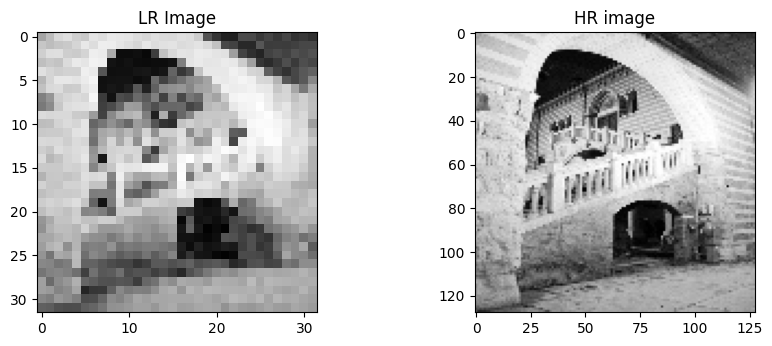

In [ ]:
# plot all three images

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
# plt.subplot(232)
# plt.title('Superresolution')
# plt.imshow(gen_image[0,:,:,:])
plt.subplot(232)
plt.title('HR image')
plt.imshow(tar_image[0,:,:,:])

plt.show()

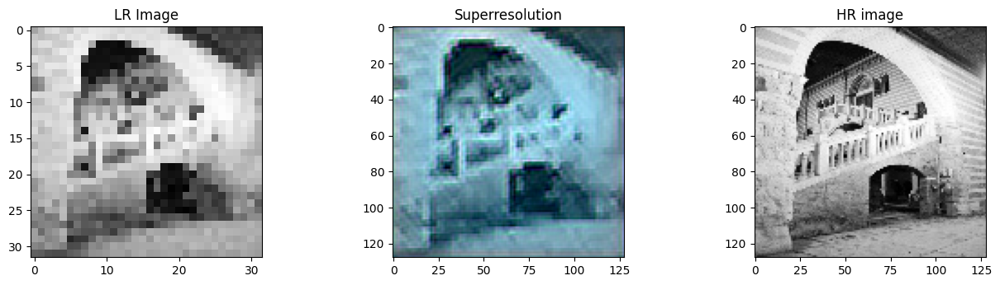

In [ ]:
# plot all three images

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('HR image')
plt.imshow(tar_image[0,:,:,:])

plt.show()

1/1 [==============================] - 0s 27ms/step


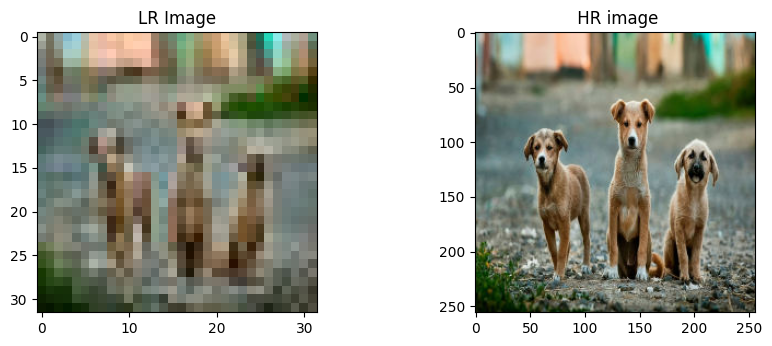

In [ ]:
sreeni_lr = cv2.imread("/content/dog_32.jpg")
sreeni_hr = cv2.imread("/content/dogg_256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
# plt.subplot(232)
# plt.title('Superresolution')
# plt.imshow(generated_sreeni_hr[0,:,:,:])
plt.subplot(232)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()

1/1 [==============================] - 0s 74ms/step


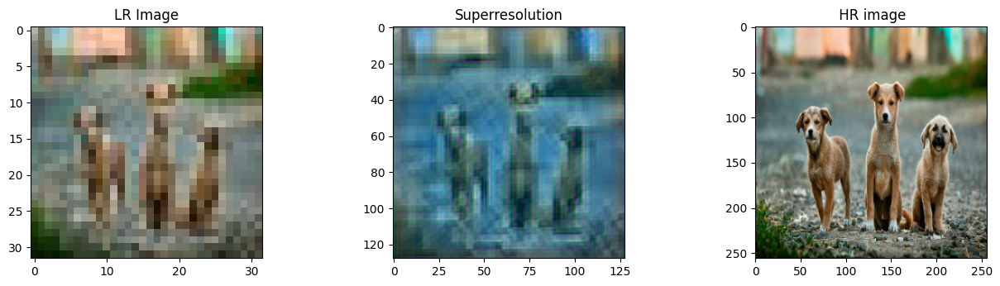

In [ ]:
sreeni_lr = cv2.imread("/content/dog_32.jpg")
sreeni_hr = cv2.imread("/content/dogg_256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(generated_sreeni_hr[0,:,:,:])
plt.subplot(233)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()

### **Resort Images**

1/1 [==============================] - 0s 38ms/step


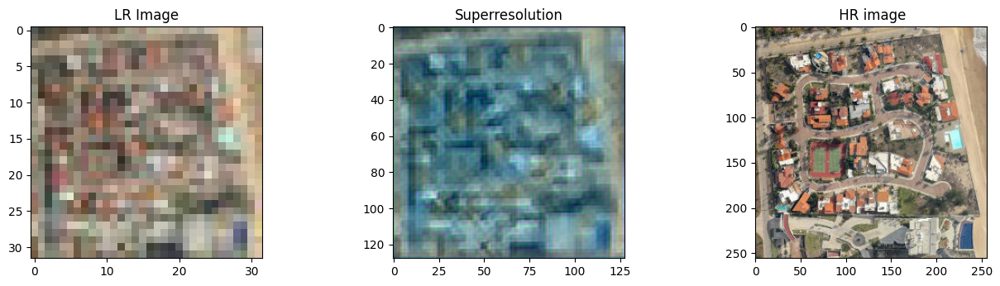

In [ ]:
sreeni_lr = cv2.imread("/content/resort_32.jpg")
sreeni_hr = cv2.imread("/content/resort_256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(generated_sreeni_hr[0,:,:,:])
plt.subplot(233)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()

1/1 [==============================] - 0s 71ms/step


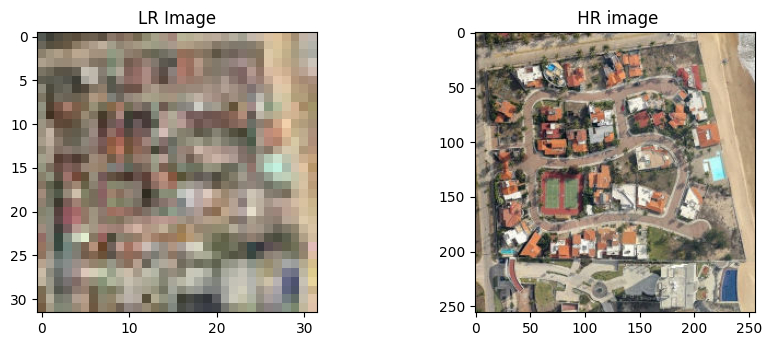

In [ ]:
sreeni_lr = cv2.imread("/content/resort_32.jpg")
sreeni_hr = cv2.imread("/content/resort_256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
# plt.subplot(232)
# plt.title('Superresolution')
# plt.imshow(generated_sreeni_hr[0,:,:,:])
plt.subplot(232)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()

### **PARK IMAGES**

1/1 [==============================] - 0s 30ms/step


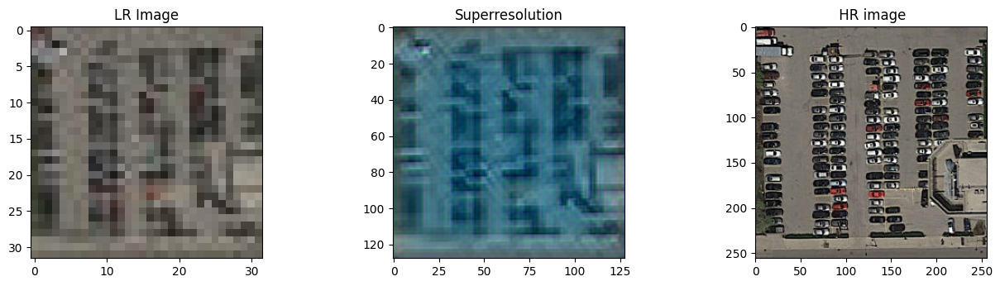

In [ ]:
sreeni_lr = cv2.imread("/content/park__32.jpg")
sreeni_hr = cv2.imread("/content/park__256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(generated_sreeni_hr[0,:,:,:])
plt.subplot(233)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()

1/1 [==============================] - 0s 102ms/step


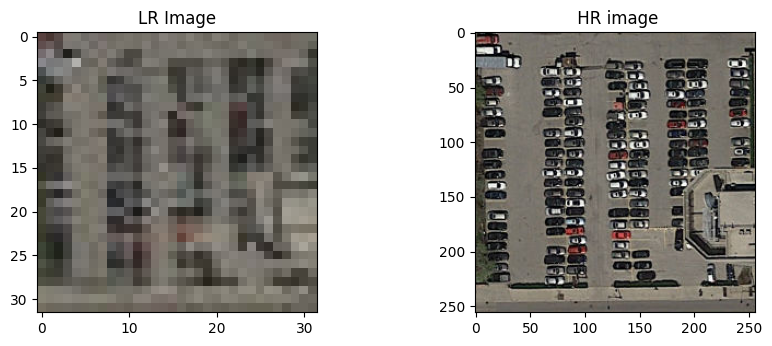

In [ ]:
sreeni_lr = cv2.imread("/content/park__32.jpg")
sreeni_hr = cv2.imread("/content/park__256.jpg")

#Change images from BGR to RGB for plotting.
#Remember that we used cv2 to load images which loads as BGR.
sreeni_lr = cv2.cvtColor(sreeni_lr, cv2.COLOR_BGR2RGB)
sreeni_hr = cv2.cvtColor(sreeni_hr, cv2.COLOR_BGR2RGB)

sreeni_lr = sreeni_lr / 255.
sreeni_hr = sreeni_hr / 255.

sreeni_lr = np.expand_dims(sreeni_lr, axis=0)
sreeni_hr = np.expand_dims(sreeni_hr, axis=0)

generated_sreeni_hr = generator.predict(sreeni_lr)

# plot all three images
plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(sreeni_lr[0,:,:,:])
plt.subplot(232)
plt.title(' HR image')
plt.imshow(sreeni_hr[0,:,:,:])

plt.show()